# TinyTimeMixers Forecasting (Raw Data - Truncated Approach)
Documentation: https://developer.ibm.com/tutorials/awb-foundation-model-time-series-forecasting/

In [124]:
!git clone "https://github.com/ibm-granite/granite-tsfm.git"
#%cd granite-tsfm
#!pip install ".[notebooks]"
#%cd ../


fatal: destination path 'granite-tsfm' already exists and is not an empty directory.


In [125]:
# Core libraries
import os
import math
import tempfile
import torch
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from transformers import EarlyStoppingCallback, Trainer, TrainingArguments, set_seed
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# TSFM libraries
from tsfm_public.models.tinytimemixer import TinyTimeMixerForPrediction
from tsfm_public.toolkit.callbacks import TrackingCallback
from tsfm_public import (
    TimeSeriesPreprocessor,
    TinyTimeMixerForPrediction,
    TrackingCallback,
    count_parameters,
    get_datasets,
)

# TSFM Toolkit libraries
from tsfm_public.toolkit.util import select_by_index
from tsfm_public.toolkit.time_series_forecasting_pipeline import TimeSeriesForecastingPipeline
from tsfm_public.toolkit.visualization import plot_ts_forecasting

# Weights and Biases (WANB) API Key:
# 55786691f5bf98d3d3c2974925c51b1e1622d1d3

In [ ]:
# Load datasets
with open('../data/processed_data_pickle_files_no_smoothing/test_data_no_batches.pkl', 'rb') as file:
    test_df = pickle.load(file)

with open('../data/processed_data_pickle_files_no_smoothing/test_data_no_batches.pkl', 'rb') as file:
    train_df = pickle.load(file)

# Ensure data are dataframes
if not isinstance(test_df, pd.DataFrame):
    raise ValueError("Loaded data is not a pandas DataFrame.")

if not isinstance(train_df, pd.DataFrame):
    raise ValueError("Loaded data is not a pandas DataFrame.")

column_names = ['unit_number', 'sensor_2', 'sensor_3', 'sensor_4',
       'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_15', 'sensor_17', 'sensor_20',
       'sensor_21']

train_df.columns = column_names

In [ ]:
# Add RUL values to the train_df dataframe (unknown for test_df)
train_df['RUL'] = train_df.groupby('unit_number')['unit_number'].transform(lambda x: np.arange(len(x), 0, -1))
#test_df['RUL'] = test_df.groupby('unit_number')['unit_number'].transform(lambda x: np.arange(len(x), 0, -1))

In [129]:
print(train_df.head(20))

    unit_number  sensor_2  sensor_3  sensor_4  sensor_6  sensor_7  sensor_8  \
0           1.0  1.359276 -0.561495 -0.975674   0.17566  0.209138 -0.539078   
1           1.0 -1.908502  0.070116 -1.392836   0.17566  1.603612 -1.061366   
2           1.0 -0.037636 -0.231698 -0.507676   0.17566  0.517390 -0.364982   
3           1.0 -0.087526 -0.795350  0.251888   0.17566  0.458675 -0.713174   
4           1.0  0.087088 -0.181729 -0.420954   0.17566  0.590783 -1.061366   
5           1.0 -0.910707 -1.794734 -1.436197   0.17566  0.678855 -1.235462   
6           1.0 -0.910707 -0.951254  0.015646   0.17566  0.194459 -0.364982   
7           1.0  0.161923 -1.440952 -0.574960   0.17566 -0.245902 -0.364982   
8           1.0 -1.484439  1.037519  1.128077   0.17566  1.075180 -0.190886   
9           1.0 -1.010486 -0.569490 -0.911381   0.17566  0.766927 -0.539078   
10          1.0 -1.085321 -1.412970 -0.135370   0.17566  1.368753 -0.539078   
11          1.0  0.161923 -0.133758 -1.033987   0.17

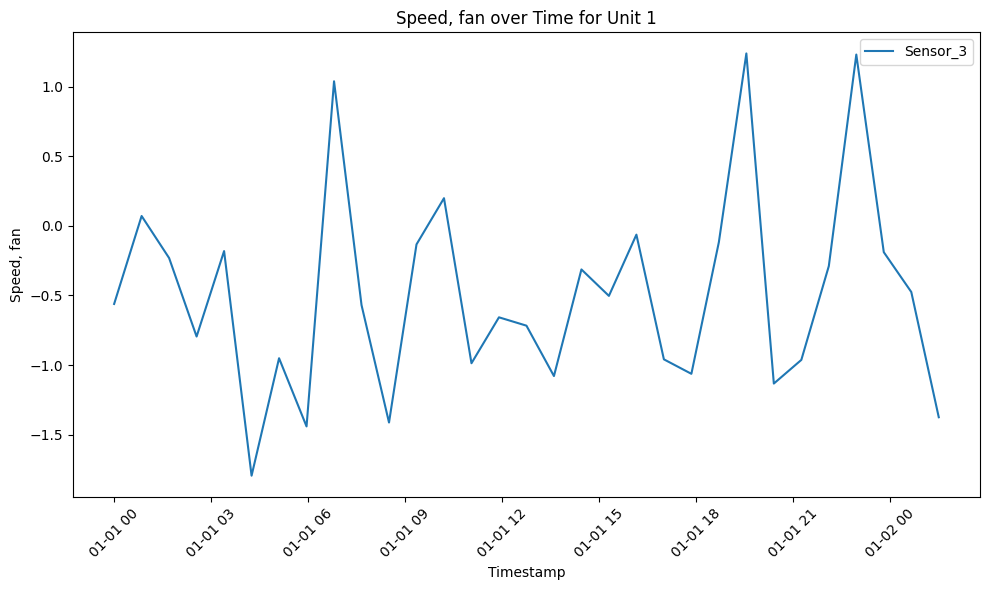

In [130]:
# Step 1 & 2: Efficiently add empty rows and timestamp for each unit_number
def expand_and_add_timestamp(df, num_empty_rows=50, start_date='2023-01-01'):
    dfs = []
    for unit_num, group in df.groupby('unit_number'):
        N = len(group)
        total_rows = N + (N - 1) * num_empty_rows
        # Create timestamps starting at midnight for each unit_number
        timestamps = pd.date_range(start=start_date, periods=total_rows, freq='min')
        # Create an empty DataFrame with timestamps
        expanded_group = pd.DataFrame({'timestamp': timestamps})
        # Calculate positions to insert the original data
        positions = np.arange(N) * (num_empty_rows + 1)
        # Assign unit_number to the expanded DataFrame
        expanded_group['unit_number'] = unit_num
        # Insert the original data into the correct positions
        expanded_group.loc[positions, group.columns] = group.values
        dfs.append(expanded_group)
    expanded_df = pd.concat(dfs, ignore_index=True)
    return expanded_df

# Step 3: Interpolate the missing values for each unit_number
def interpolate_missing_values(df):
    df = df.set_index(['unit_number', 'timestamp'])
    df = df.interpolate(method='linear')
    df = df.reset_index()
    return df


# Apply the steps to train_df
train_df = expand_and_add_timestamp(train_df)
train_df = interpolate_missing_values(train_df)

# Step 4: Plot 'Speed, fan' for unit_number = 1 over timestamp column
unit_1_data = train_df[train_df['unit_number'] == 1]
plt.figure(figsize=(10, 6))
plt.plot(unit_1_data['timestamp'], unit_1_data['sensor_3'], label='Sensor_3')
plt.xlabel('Timestamp')
plt.ylabel('Speed, fan')
plt.title('Speed, fan over Time for Unit 1')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [131]:
# Refine dataset
train_df = train_df.dropna()
train_df.columns

Index(['unit_number', 'timestamp', 'sensor_2', 'sensor_3', 'sensor_4',
       'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_15', 'sensor_17', 'sensor_20',
       'sensor_21', 'RUL'],
      dtype='object')

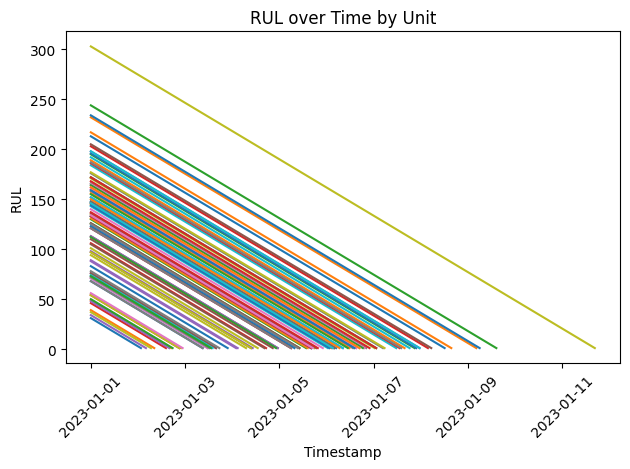

In [132]:
# Plot RUL over time for each unit in the dataset

# Loop through each unique unit number and plot separately
for unit in train_df['unit_number'].unique():
    unit_data = train_df[train_df['unit_number'] == unit]
    plt.plot(unit_data['timestamp'], unit_data['RUL'], label=f'Unit {unit}')

# Add labels and title
plt.xlabel('Timestamp')
plt.ylabel('RUL')
plt.title('RUL over Time by Unit')
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()


# Forecasting

In [133]:
# Generate train/validation/test split configurations for each unit number in the dataset.
def generate_split_configs(input_df, context_length, unit_numbers=None):

    # If no unit numbers provided, get all unique unit numbers from the data
    if unit_numbers is None:
        unit_numbers = train_df['unit_number'].unique()

    split_configs = {}

    for unit in unit_numbers:
        # Filter data for current unit
        unit_data = input_df[input_df['unit_number'] == unit]
        #unit_data = unit_data.reset_index(drop=True)
        data_length = len(unit_data)

        # Calculate indices for train split (0 to 80%)
        train_start_index = 0
        train_end_index = round(data_length * 0.8)

        # Calculate indices for validation split (80% to 90%)
        # Shift back by context length to ensure first evaluation timestamp follows training data
        eval_start_index = round(data_length * 0.8) - context_length
        eval_end_index = round(data_length * 0.9)

        # Calculate indices for test split (90% to end)
        test_start_index = round(data_length * 0.9) - context_length
        test_end_index = data_length - 1

        # Create split configuration for current unit
        split_configs[unit] = {
            "train": [train_start_index, train_end_index],
            "valid": [eval_start_index, eval_end_index],
            "test": [test_start_index, test_end_index]
        }

    return list(split_configs.values())

In [134]:
# Function to determine actual vs predicted values
def compare_forecast(forecast, date_col, prediction_col, actual_col, delta):
  comparisons = pd.DataFrame()
  comparisons[date_col] = forecast[date_col]
  actual = []
  pred = []

  for i in range(len(forecast)):
    pred.append(forecast[prediction_col].values[i][delta - 1]) # prediction for next day
    actual.append(forecast[actual_col].values[i][delta - 1])

  comparisons['actual'] = actual
  comparisons['pred'] = pred

  return comparisons

In [135]:
print(train_df.columns)

Index(['unit_number', 'timestamp', 'sensor_2', 'sensor_3', 'sensor_4',
       'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_15', 'sensor_17', 'sensor_20',
       'sensor_21', 'RUL'],
      dtype='object')


In [136]:
# Set seed for reproducibility
SEED = 42
set_seed(SEED)

# Forecasting parameters
context_length = 512 # TTM can use 512 time points into the past
forecast_length = 96 # TTM can predict 96 time points into the future
fewshot_fraction = 0.05 # 5% of the data can be used for few-shot
prediction_filter = 96 # Filter this many predicted time points

# Set column parameters
timestamp_column = "timestamp"
target_columns = ["sensor_2"]
observable_columns = train_df.columns[3:-1]   # Exclude 'unit_number' and 'RUL' columns

# Set up Column Specifiers and Preprocessor
column_specifiers = {
    "timestamp_column": timestamp_column,
    "target_columns": target_columns,
    "observable_columns": observable_columns
}

{'train': [0, 1225], 'valid': [713, 1378], 'test': [866, 1530]}
931
Dataset for unit 1 is good


  0%|          | 0/1 [00:00<?, ?it/s]

96
[-1.0222250302524294, -0.9811393626469039, -0.9400536950413785, -0.898968027435853, -0.8578823598303276, -0.816796692224802, -0.7757110246192765, -0.7346253570137511, -0.6935396894082256, -0.6524540218027002, -0.6113683541971747, -0.5702826865916493, -0.5291970189861238, -0.48811135138059836, -0.4470256837750728, -0.40594001616954734, -0.3648543485640219, -0.3237686809584964, -0.28268301335297097, -0.2415973457474454, -0.20051167814192006, -0.1594260105363945, -0.11834034293086915, -0.07725467532534358, -0.036169007719818236, 0.004916659885707331, 0.0460023274912329, 0.08708799509675824, 0.1281736627022838, 0.16925933030780915, 0.21034499791333472, 0.25143066551886006, 0.29251633312438563, 0.333602000729911, 0.37468766833543654, 0.4157733359409621, 0.45685900354648745, 0.497944671152013, 0.5390303387575384, 0.5801160063630639, 0.6212016739685893, 0.6622873415741148, 0.7033730091796404, 0.7444586767851658, 0.785544344390691, 0.7752729274893124, 0.7650015105879339, 0.7547300936865552,

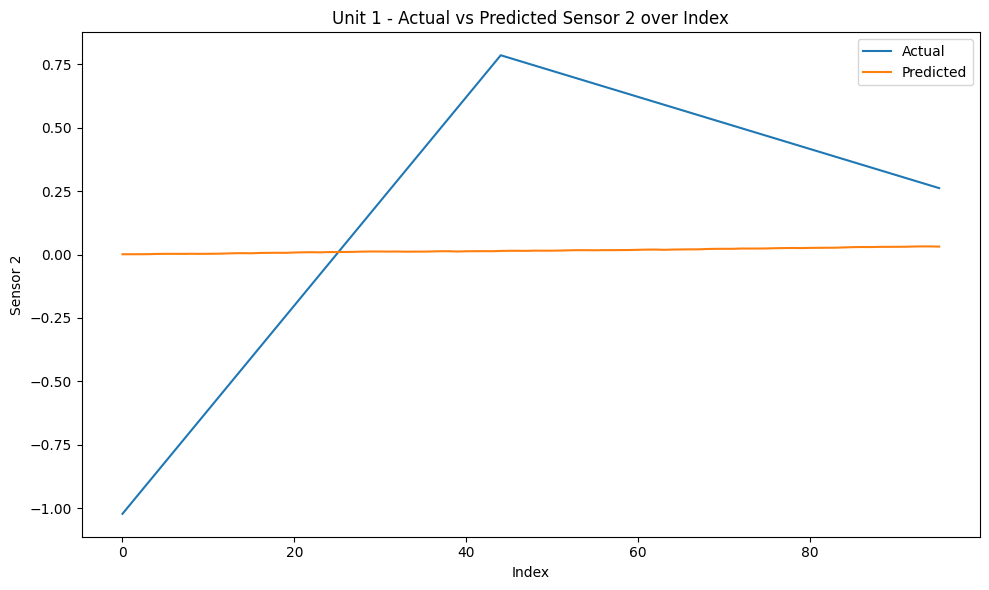

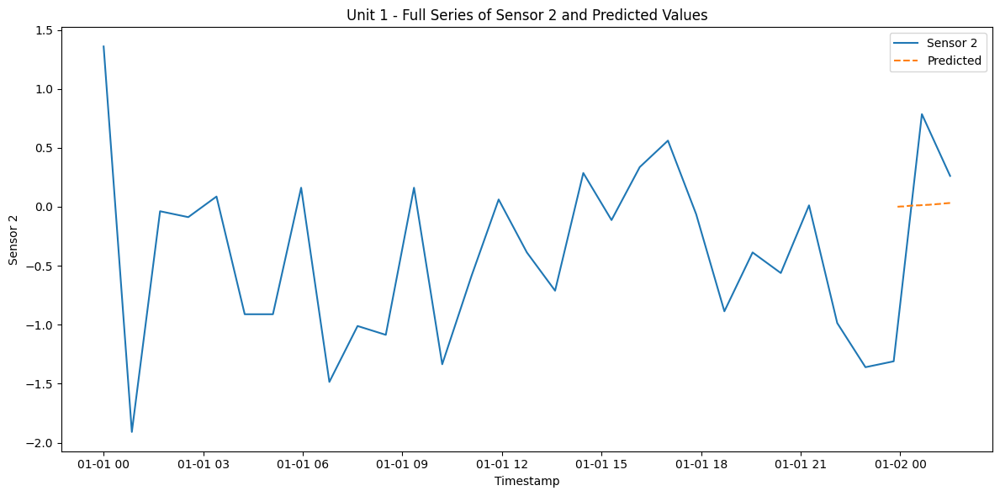

RMSE for Unit 1 - sensor_2: 0.5315406598893371
{'train': [0, 1959], 'valid': [1447, 2204], 'test': [1692, 2448]}
1849
Dataset for unit 2 is good


  0%|          | 0/8 [00:00<?, ?it/s]

96
[0.8633136437870068, 0.8530422268856226, 0.8427708099842385, 0.8324993930828544, 0.8222279761814701, 0.811956559280086, 0.8016851423787019, 0.7914137254773177, 0.7811423085759336, 0.7708708916745495, 0.7605994747731653, 0.7503280578717811, 0.740056640970397, 0.7297852240690128, 0.7195138071676287, 0.7092423902662446, 0.6989709733648604, 0.6886995564634762, 0.6784281395620921, 0.6681567226607079, 0.6578853057593238, 0.6476138888579397, 0.6373424719565555, 0.6270710550551714, 0.6167996381537872, 0.606528221252403, 0.5962568043510189, 0.5859853874496348, 0.5757139705482506, 0.5654425536468665, 0.5551711367454824, 0.5448997198440981, 0.534628302942714, 0.5243568860413299, 0.5140854691399457, 0.5038140522385616, 0.49354263533717746, 0.4832712184357933, 0.4729998015344091, 0.462728384633025, 0.45245696773164085, 0.4421855508302567, 0.43191413392887257, 0.42164271702748846, 0.4113713001261043, 0.4069692643112246, 0.40256722849634485, 0.39816519268146516, 0.3937631568665854, 0.3893611210517

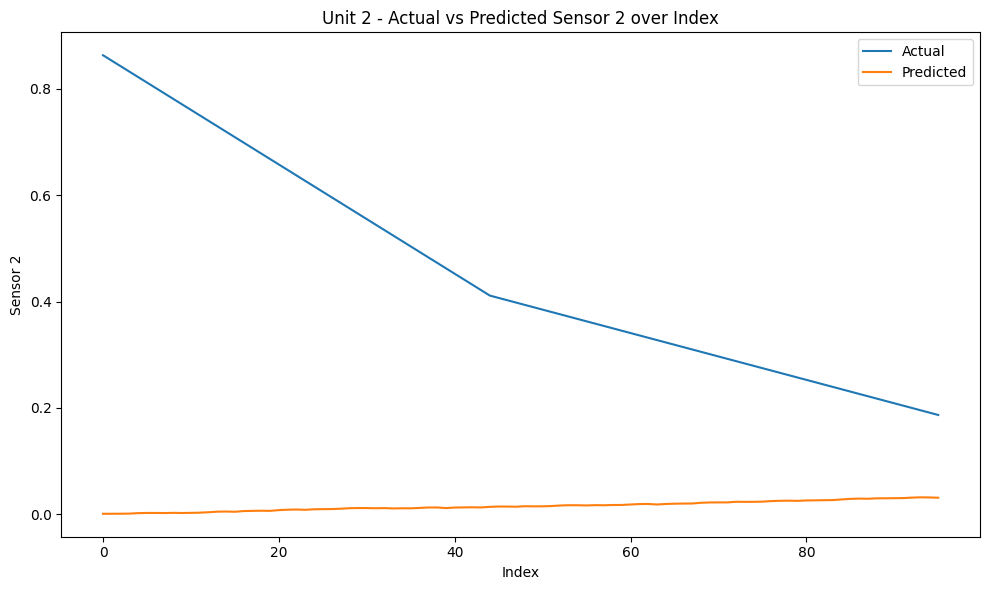

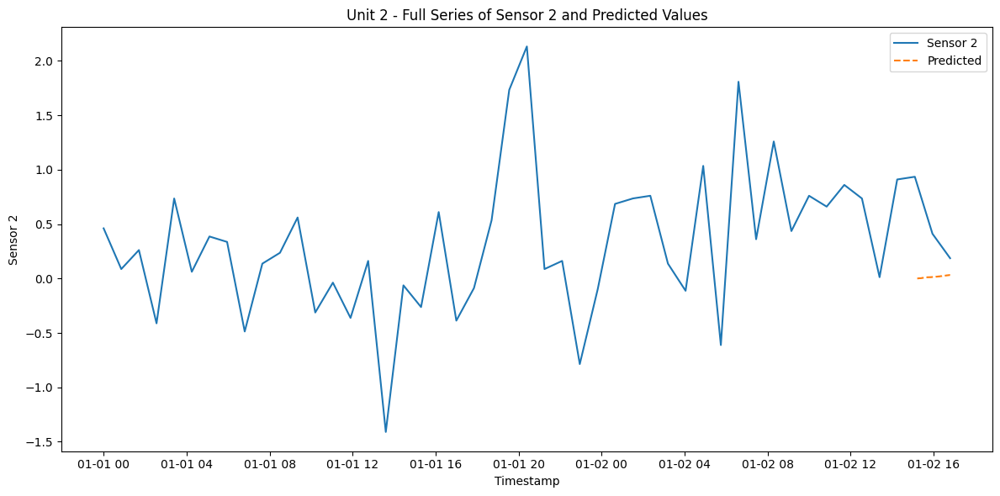

RMSE for Unit 2 - sensor_2: 0.4870351794917126
{'train': [0, 5101], 'valid': [4589, 5738], 'test': [5226, 6375]}
5776
Dataset for unit 3 is good


  0%|          | 0/57 [00:00<?, ?it/s]

96
[1.5206843254753197, 1.5294883971050792, 1.5382924687348385, 1.547096540364598, 1.5559006119943575, 1.5647046836241167, 1.5735087552538762, 1.5823128268836357, 1.5911168985133952, 1.5999209701431545, 1.608725041772914, 1.6175291134026735, 1.6263331850324327, 1.6351372566621922, 1.6439413282919517, 1.6527453999217112, 1.6615494715514705, 1.67035354318123, 1.6791576148109895, 1.6879616864407487, 1.6967657580705082, 1.7055698297002677, 1.7143739013300272, 1.7231779729597865, 1.731982044589546, 1.7407861162193052, 1.7495901878490647, 1.7583942594788242, 1.7671983311085837, 1.776002402738343, 1.7848064743681025, 1.793610545997862, 1.8024146176276212, 1.8112186892573807, 1.8200227608871402, 1.8288268325168997, 1.837630904146659, 1.8464349757764185, 1.855239047406178, 1.8640431190359372, 1.8728471906656967, 1.8816512622954562, 1.8904553339252157, 1.899259405554975, 1.9080634771847345, 1.8904553339252212, 1.8728471906657078, 1.8552390474061946, 1.8376309041466812, 1.820022760887168, 1.80241

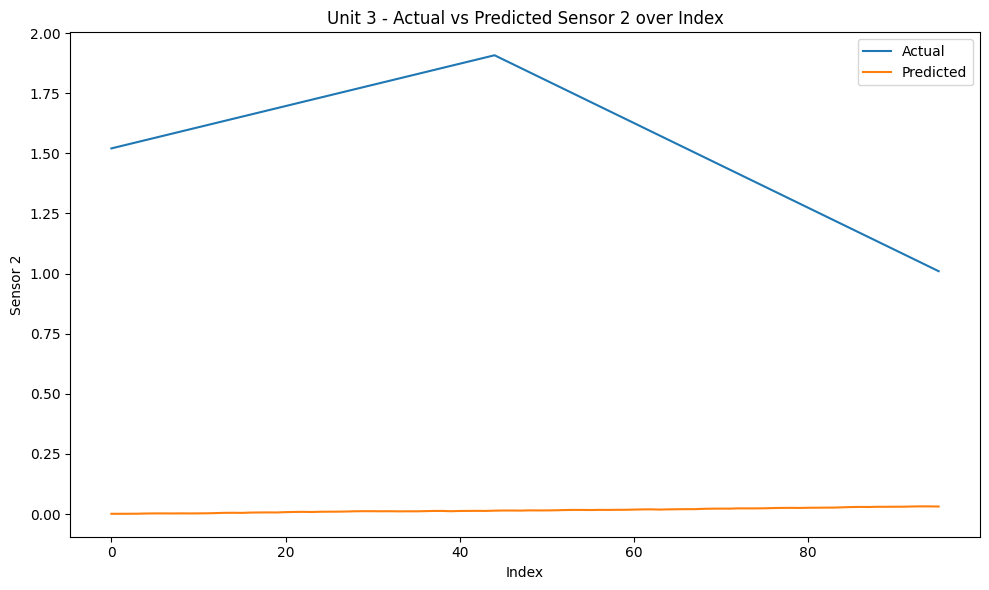

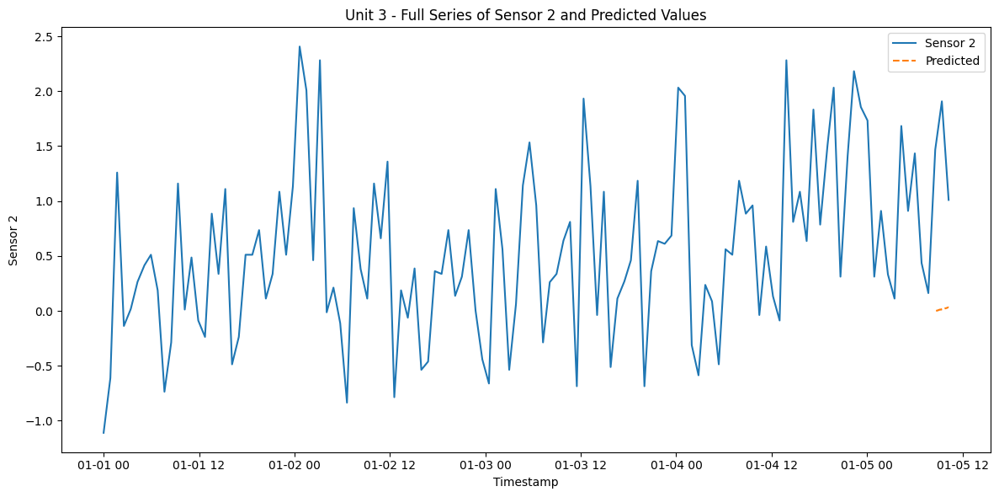

RMSE for Unit 3 - sensor_2: 1.5782133642389908
{'train': [0, 4285], 'valid': [3773, 4820], 'test': [4308, 5355]}
4756
Dataset for unit 4 is good


  0%|          | 0/45 [00:00<?, ?it/s]

96
[0.8770088663221708, 0.8686939097829529, 0.8603789532437351, 0.8520639967045173, 0.8437490401652994, 0.8354340836260815, 0.8271191270868636, 0.8188041705476458, 0.810489214008428, 0.8021742574692101, 0.7938593009299922, 0.7855443443907744, 0.7772293878515565, 0.7689144313123386, 0.7605994747731208, 0.752284518233903, 0.7439695616946851, 0.7356546051554672, 0.7273396486162493, 0.7190246920770316, 0.7107097355378137, 0.7023947789985958, 0.6940798224593779, 0.6857648659201601, 0.6774499093809423, 0.6691349528417243, 0.6608199963025065, 0.6525050397632887, 0.6441900832240708, 0.6358751266848529, 0.627560170145635, 0.6192452136064173, 0.6109302570671993, 0.6026153005279815, 0.5943003439887636, 0.5859853874495458, 0.577670430910328, 0.56935547437111, 0.5610405178318922, 0.5527255612926744, 0.5444106047534565, 0.5360956482142386, 0.5277806916750207, 0.519465735135803, 0.5111507785965851, 0.5160419295020063, 0.5209330804074277, 0.5258242313128489, 0.5307153822182702, 0.5356065331236916, 0.5

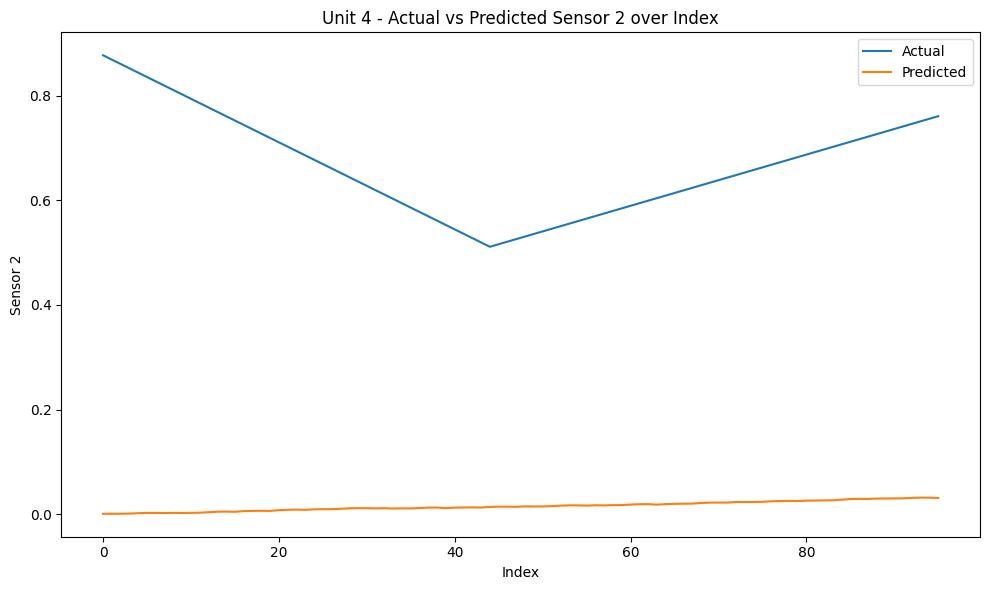

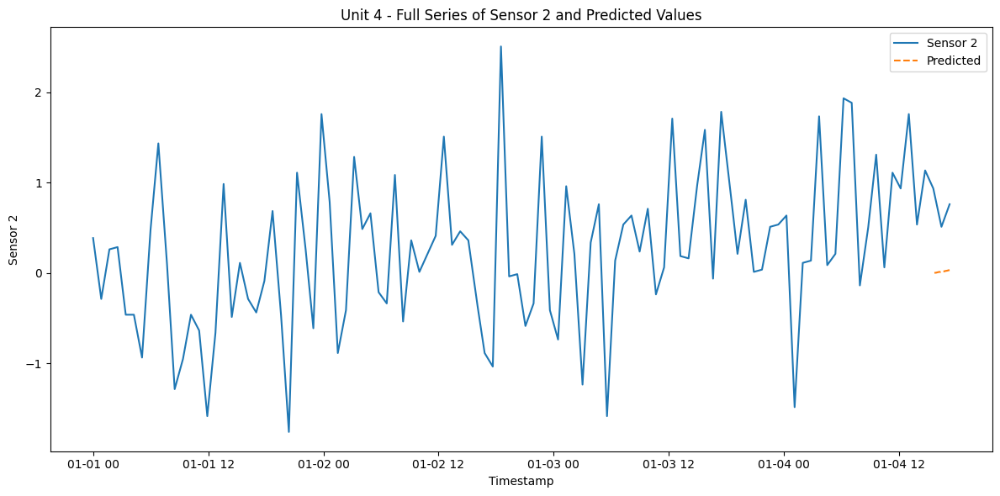

RMSE for Unit 4 - sensor_2: 0.6560244283477199
{'train': [0, 3958], 'valid': [3446, 4453], 'test': [3941, 4947]}
4348
Dataset for unit 5 is good


  0%|          | 0/39 [00:00<?, ?it/s]

96
[0.5894091930835202, 0.5898983081740619, 0.5903874232646035, 0.590876538355145, 0.5913656534456866, 0.5918547685362282, 0.5923438836267697, 0.5928329987173113, 0.5933221138078528, 0.5938112288983944, 0.594300343988936, 0.5947894590794776, 0.5952785741700192, 0.5957676892605608, 0.5962568043511023, 0.5967459194416439, 0.5972350345321854, 0.597724149622727, 0.5982132647132686, 0.5987023798038101, 0.5991914948943518, 0.5996806099848934, 0.6001697250754349, 0.6006588401659765, 0.601147955256518, 0.6016370703470596, 0.6021261854376012, 0.6026153005281427, 0.6031044156186843, 0.603593530709226, 0.6040826457997674, 0.6045717608903091, 0.6050608759808507, 0.6055499910713922, 0.6060391061619338, 0.6065282212524753, 0.6070173363430169, 0.6075064514335585, 0.6079955665241, 0.6084846816146416, 0.6089737967051831, 0.6094629117957248, 0.6099520268862664, 0.6104411419768079, 0.6109302570673495, 0.5889200779929565, 0.5669098989185635, 0.5448997198441705, 0.5228895407697775, 0.5008793616953845, 0.47

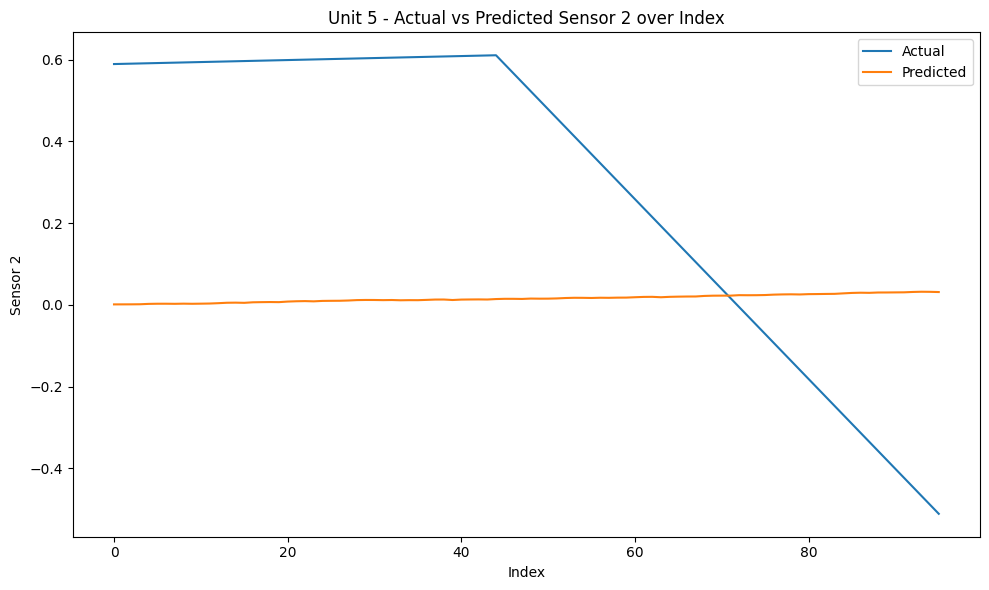

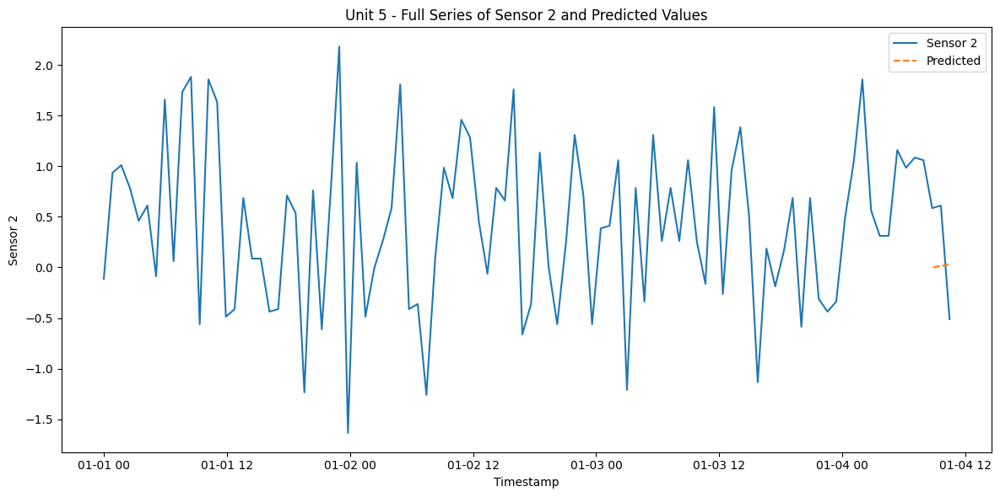

RMSE for Unit 5 - sensor_2: 0.47144122189509013
{'train': [0, 4244], 'valid': [3732, 4774], 'test': [4262, 5304]}
4705
Dataset for unit 6 is good


  0%|          | 0/44 [00:00<?, ?it/s]

96
[-1.1611337159664306, -1.157709910332634, -1.1542861046988375, -1.150862299065041, -1.1474384934312445, -1.1440146877974477, -1.1405908821636512, -1.1371670765298547, -1.1337432708960582, -1.1303194652622617, -1.126895659628465, -1.1234718539946684, -1.120048048360872, -1.1166242427270754, -1.1132004370932789, -1.1097766314594821, -1.1063528258256856, -1.102929020191889, -1.0995052145580926, -1.0960814089242958, -1.0926576032904993, -1.0892337976567028, -1.0858099920229063, -1.0823861863891098, -1.078962380755313, -1.0755385751215165, -1.07211476948772, -1.0686909638539235, -1.0652671582201267, -1.0618433525863302, -1.0584195469525337, -1.0549957413187372, -1.0515719356849407, -1.048148130051144, -1.0447243244173474, -1.041300518783551, -1.0378767131497544, -1.0344529075159579, -1.0310291018821611, -1.0276052962483646, -1.024181490614568, -1.0207576849807716, -1.017333879346975, -1.0139100737131783, -1.0104862680793818, -0.9625529892062687, -0.9146197103331557, -0.8666864314600426, 

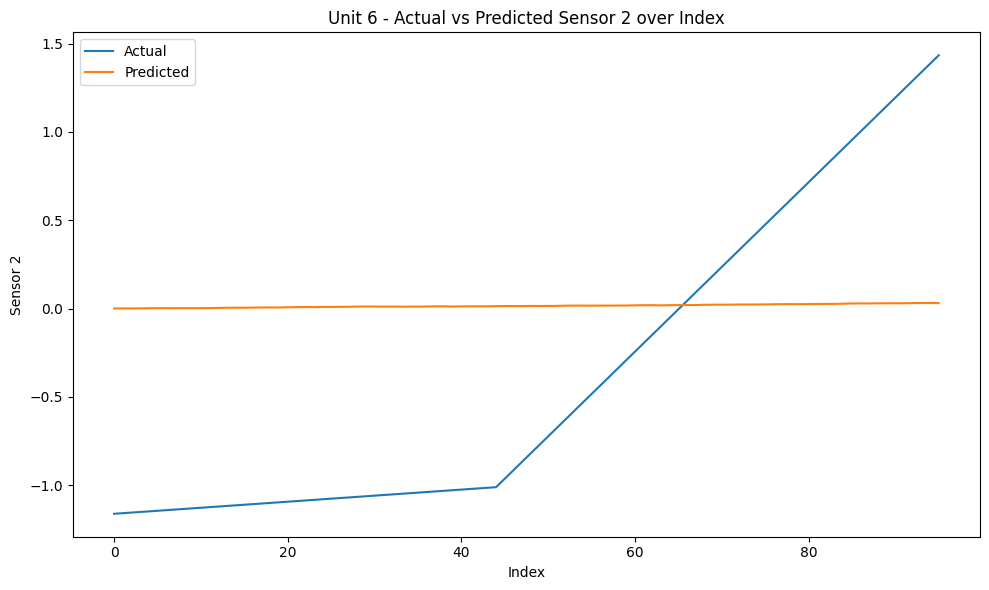

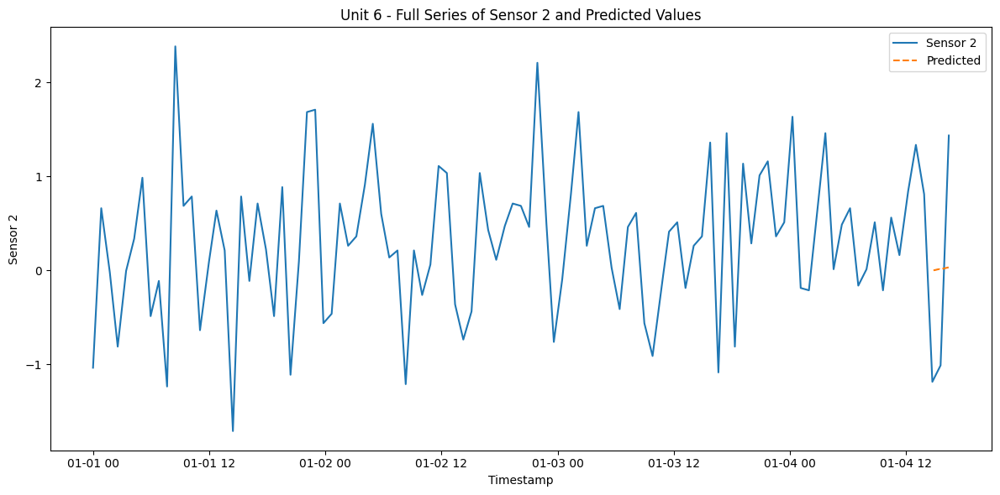

RMSE for Unit 6 - sensor_2: 0.9197551388530313
{'train': [0, 6488], 'valid': [5976, 7299], 'test': [6787, 8109]}
7510
Dataset for unit 7 is good


  0%|          | 0/79 [00:00<?, ?it/s]

96
[0.27392995968388345, 0.2685496936879206, 0.2631694276919577, 0.2577891616959949, 0.25240889570003205, 0.2470286297040692, 0.24164836370810633, 0.23626809771214347, 0.2308878317161806, 0.22550756572021774, 0.22012729972425488, 0.214747033728292, 0.20936676773232915, 0.2039865017363663, 0.19860623574040343, 0.1932259697444406, 0.18784570374847773, 0.18246543775251486, 0.177085171756552, 0.17170490576058914, 0.16632463976462628, 0.16094437376866344, 0.15556410777270058, 0.15018384177673771, 0.14480357578077485, 0.139423309784812, 0.13404304378884913, 0.12866277779288626, 0.1232825117969234, 0.11790224580096054, 0.1125219798049977, 0.10714171380903484, 0.10176144781307198, 0.09638118181710911, 0.09100091582114625, 0.08562064982518339, 0.08024038382922052, 0.07486011783325769, 0.06947985183729483, 0.06409958584133196, 0.0587193198453691, 0.05333905384940624, 0.047958787853443374, 0.04257852185748051, 0.037198255861517655, 0.018122767330379642, -0.0009527212007583719, -0.0200282097318963

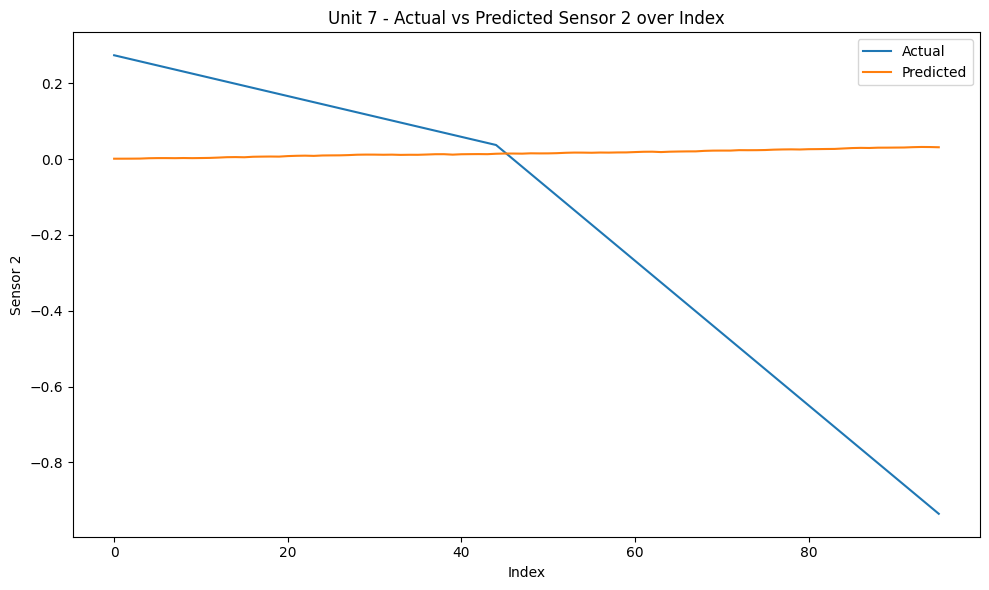

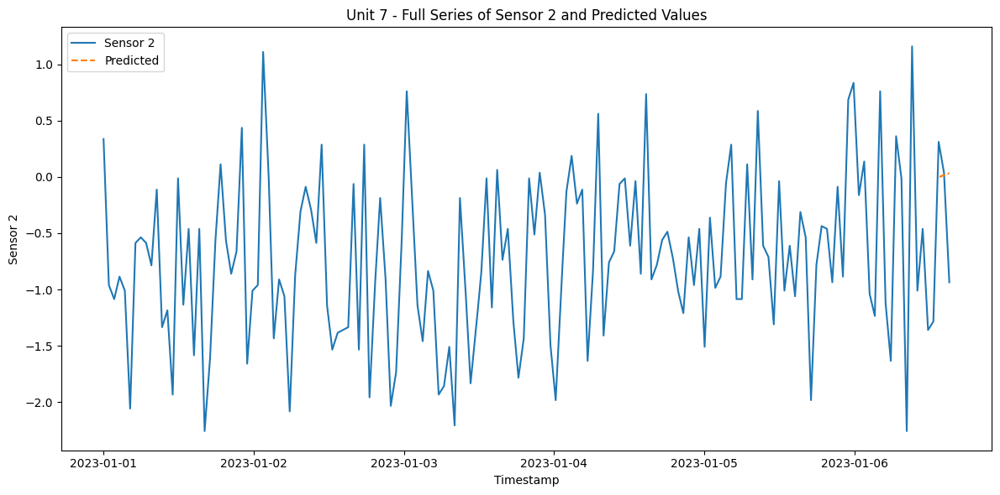

RMSE for Unit 7 - sensor_2: 0.42359806039014464
{'train': [0, 6733], 'valid': [6221, 7574], 'test': [7062, 8415]}
7816
Dataset for unit 8 is good


  0%|          | 0/83 [00:00<?, ?it/s]

96
[0.7777185029421814, 0.8051089480125317, 0.8324993930828821, 0.8598898381532324, 0.8872802832235827, 0.914670728293933, 0.9420611733642833, 0.9694516184346336, 0.9968420635049839, 1.0242325085753343, 1.0516229536456845, 1.0790133987160349, 1.106403843786385, 1.1337942888567354, 1.1611847339270858, 1.1885751789974361, 1.2159656240677865, 1.2433560691381367, 1.2707465142084868, 1.2981369592788372, 1.3255274043491876, 1.352917849419538, 1.3803082944898883, 1.4076987395602385, 1.4350891846305889, 1.462479629700939, 1.4898700747712894, 1.5172605198416398, 1.5446509649119902, 1.5720414099823405, 1.5994318550526905, 1.6268223001230409, 1.6542127451933912, 1.6816031902637416, 1.708993635334092, 1.7363840804044424, 1.7637745254747927, 1.7911649705451427, 1.818555415615493, 1.8459458606858434, 1.8733363057561938, 1.9007267508265442, 1.9281171958968946, 1.9555076409672445, 1.982898086037595, 1.9496382598807402, 1.9163784337238856, 1.883118607567031, 1.8498587814101761, 1.8165989552533213, 1.78

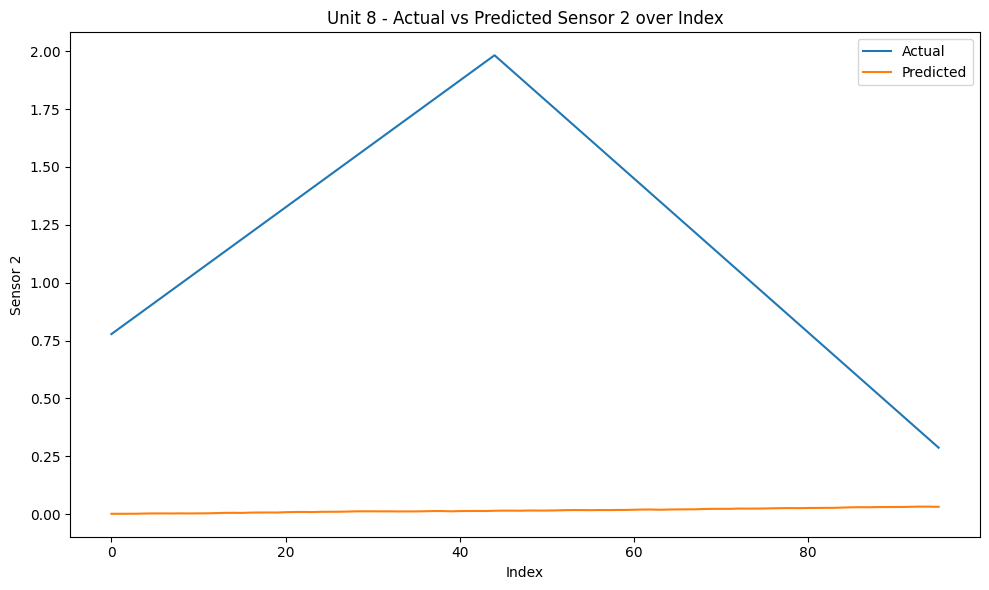

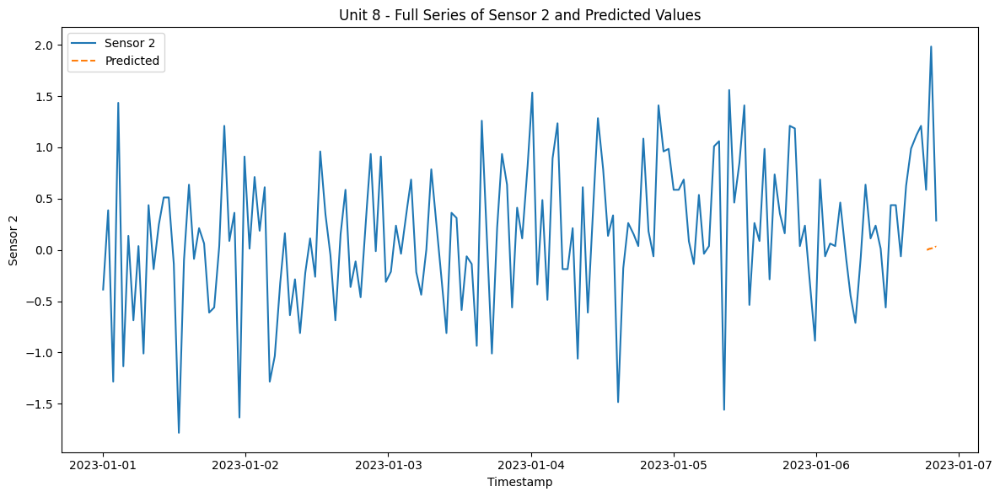

RMSE for Unit 8 - sensor_2: 1.3071653706831858
{'train': [0, 2204], 'valid': [1692, 2480], 'test': [1968, 2754]}
2155
Dataset for unit 9 is good


  0%|          | 0/12 [00:00<?, ?it/s]

96
[0.5028358220574674, 0.4695759959006126, 0.43631616974375786, 0.4030563435869031, 0.3697965174300484, 0.33653669127319363, 0.3032768651163389, 0.27001703895948415, 0.2367572128026294, 0.20349738664577466, 0.17023756048891991, 0.13697773433206517, 0.10371790817521043, 0.07045808201835568, 0.03719825586150094, 0.003938429704646196, -0.029321396452208548, -0.06258122260906329, -0.09584104876591804, -0.12910087492277278, -0.16236070107962752, -0.19562052723648227, -0.228880353393337, -0.26214017955019175, -0.2954000057070466, -0.32865983186390124, -0.3619196580207559, -0.39517948417761073, -0.4284393103344656, -0.4616991364913202, -0.49495896264817485, -0.5282187888050297, -0.5614786149618846, -0.5947384411187392, -0.6279982672755938, -0.6612580934324487, -0.6945179195893035, -0.7277777457461582, -0.7610375719030128, -0.7942973980598677, -0.8275572242167225, -0.8608170503735771, -0.8940768765304318, -0.9273367026872866, -0.9605965288441413, -0.9517924572143874, -0.9429883855846335, -0.9

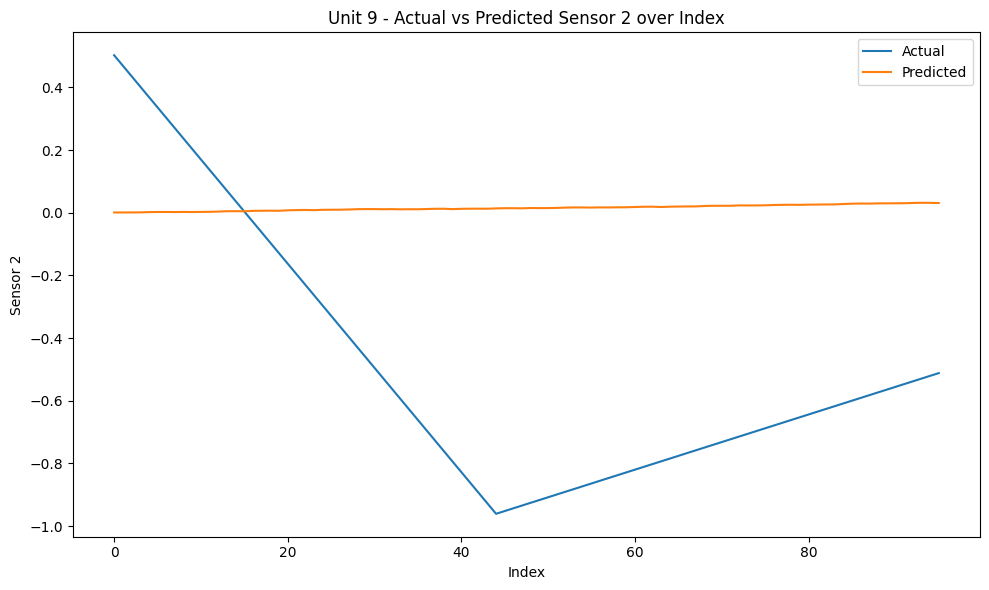

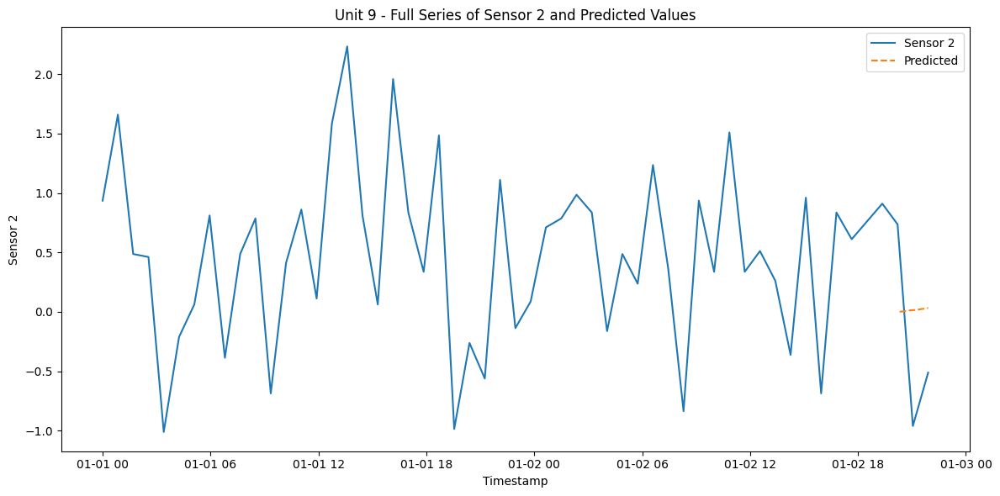

RMSE for Unit 9 - sensor_2: 0.6525851862917063
{'train': [0, 7794], 'valid': [7282, 8768], 'test': [8256, 9741]}
9142
Dataset for unit 10 is good


  0%|          | 0/99 [00:00<?, ?it/s]

96
[0.6251145946929773, 0.6128867174294268, 0.6006588401658763, 0.588430962902326, 0.5762030856387755, 0.5639752083752251, 0.5517473311116746, 0.5395194538481243, 0.5272915765845738, 0.5150636993210234, 0.5028358220574729, 0.49060794479392245, 0.478380067530372, 0.4661521902668216, 0.45392431300327113, 0.4416964357397207, 0.42946855847617027, 0.4172406812126198, 0.4050128039490694, 0.39278492668551895, 0.3805570494219685, 0.3683291721584181, 0.35610129489486764, 0.3438734176313172, 0.3316455403677668, 0.3194176631042163, 0.30718978584066586, 0.29496190857711546, 0.282734031313565, 0.27050615405001455, 0.25827827678646414, 0.2460503995229137, 0.23382252225936323, 0.22159464499581283, 0.20936676773226237, 0.1971388904687119, 0.18491101320516146, 0.1726831359416111, 0.16045525867806065, 0.1482273814145102, 0.13599950415095974, 0.12377162688740928, 0.11154374962385882, 0.09931587236030848, 0.08708799509675806, 0.11105463453331736, 0.13502127396987668, 0.15898791340643598, 0.182954552842995

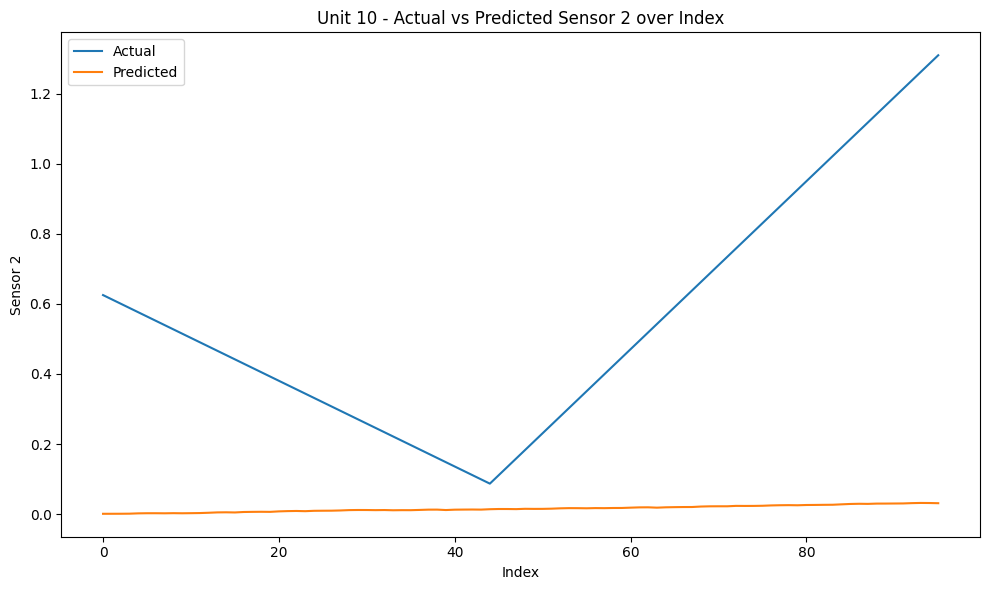

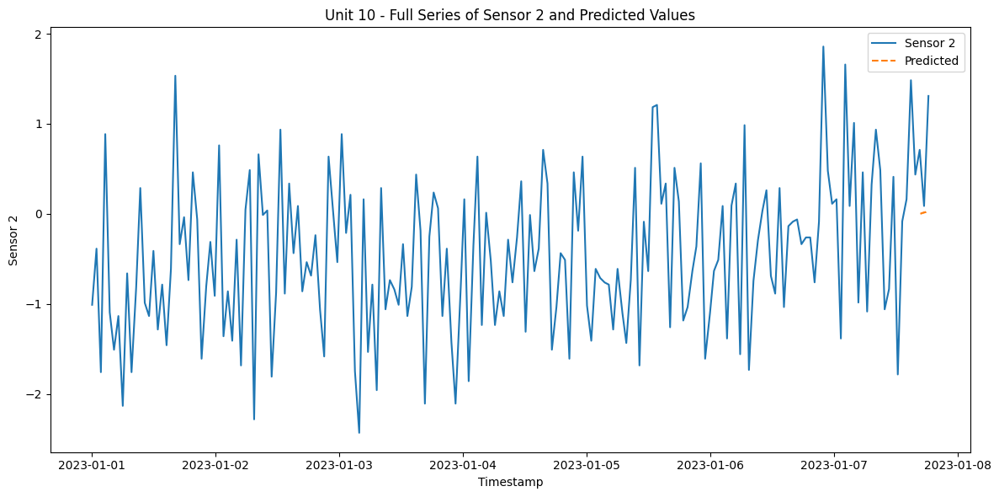

RMSE for Unit 10 - sensor_2: 0.6201142692114657
{'train': [0, 3346], 'valid': [2834, 3765], 'test': [3253, 4182]}
3583
Dataset for unit 11 is good


  0%|          | 0/30 [00:00<?, ?it/s]

96
[0.7845661142097635, 0.812934789461197, 0.8413034647126305, 0.8696721399640639, 0.8980408152154974, 0.9264094904669309, 0.9547781657183643, 0.9831468409697978, 1.0115155162212313, 1.0398841914726646, 1.068252866724098, 1.0966215419755316, 1.1249902172269652, 1.1533588924783986, 1.181727567729832, 1.2100962429812654, 1.238464918232699, 1.2668335934841324, 1.295202268735566, 1.3235709439869994, 1.3519396192384328, 1.3803082944898661, 1.4086769697412997, 1.4370456449927334, 1.4654143202441667, 1.4937829954956001, 1.5221516707470335, 1.5505203459984669, 1.5788890212499005, 1.607257696501334, 1.6356263717527675, 1.6639950470042009, 1.6923637222556343, 1.7207323975070676, 1.7491010727585015, 1.7774697480099348, 1.8058384232613682, 1.8342070985128016, 1.862575773764235, 1.8909444490156688, 1.9193131242671022, 1.9476817995185356, 1.976050474769969, 2.0044191500214024, 2.0327878252728357, 1.99023481239568, 1.9476817995185243, 1.9051287866413684, 1.8625757737642128, 1.820022760887057, 1.77746

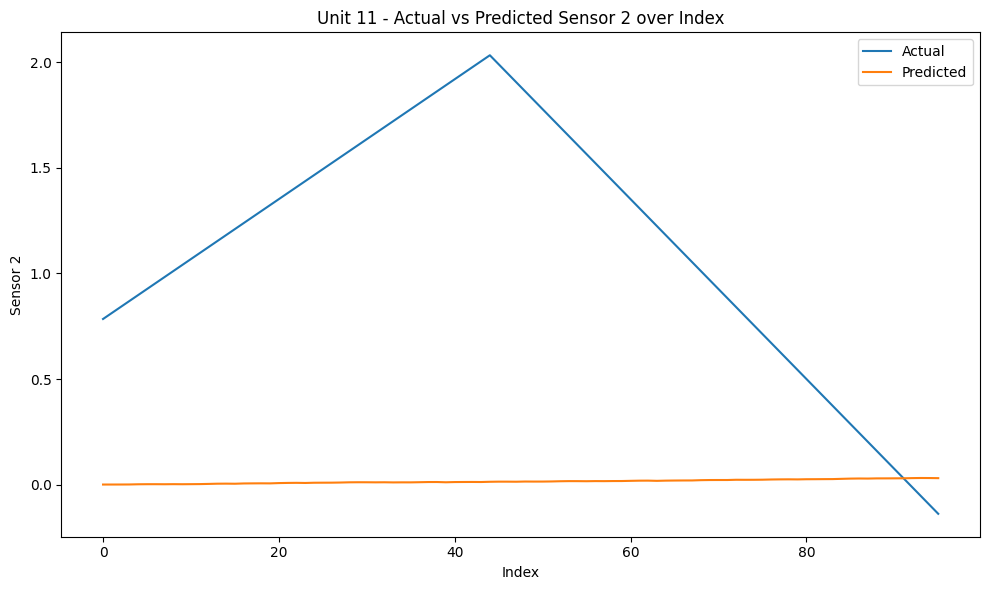

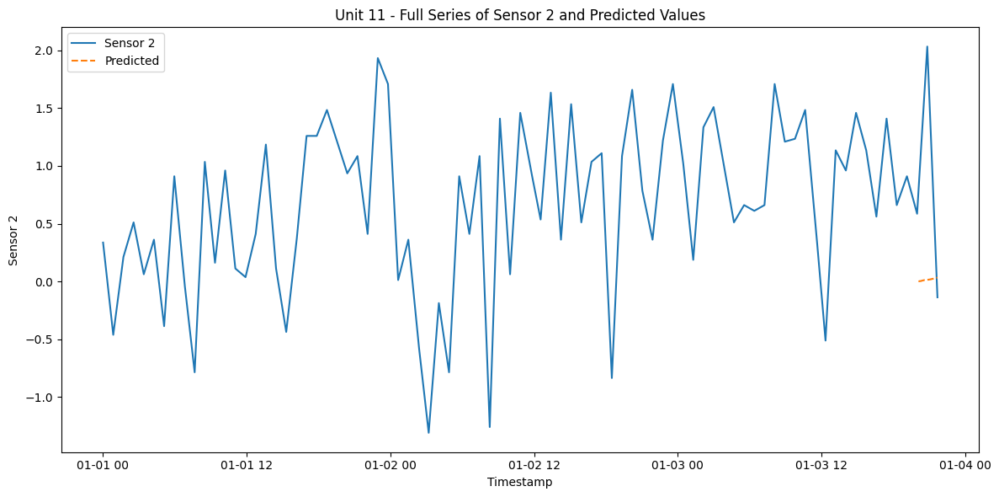

RMSE for Unit 11 - sensor_2: 1.2759580070739636
{'train': [0, 8814], 'valid': [8302, 9915], 'test': [9403, 11016]}
10417
Dataset for unit 12 is good


  0%|          | 0/115 [00:00<?, ?it/s]

96
[0.5889200779927841, 0.5537037914737631, 0.5184875049547422, 0.4832712184357211, 0.44805493191670004, 0.412838645397679, 0.37762235887865797, 0.34240607235963694, 0.30718978584061596, 0.27197349932159487, 0.23675721280257378, 0.2015409262835528, 0.16632463976453182, 0.13110835324551073, 0.09589206672648964, 0.060675780207468666, 0.025459493688447687, -0.009756792830573402, -0.04497307934959449, -0.08018936586861547, -0.11540565238763645, -0.15062193890665754, -0.18583822542567863, -0.2210545119446995, -0.2562707984637206, -0.2914870849827417, -0.32670337150176276, -0.36191965802078385, -0.3971359445398047, -0.4323522310588258, -0.4675685175778469, -0.5027848040968678, -0.5380010906158889, -0.5732173771349099, -0.608433663653931, -0.6436499501729521, -0.678866236691973, -0.7140825232109941, -0.7492988097300152, -0.784515096249036, -0.8197313827680571, -0.8549476692870782, -0.8901639558060993, -0.9253802423251204, -0.9605965288441413, -0.9361407743170403, -0.9116850197899395, -0.88722

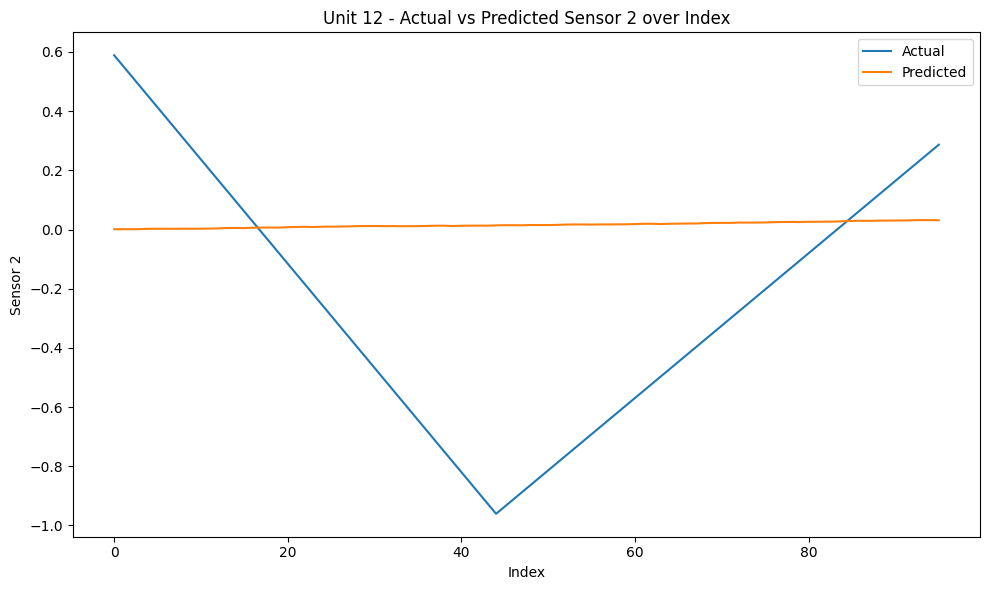

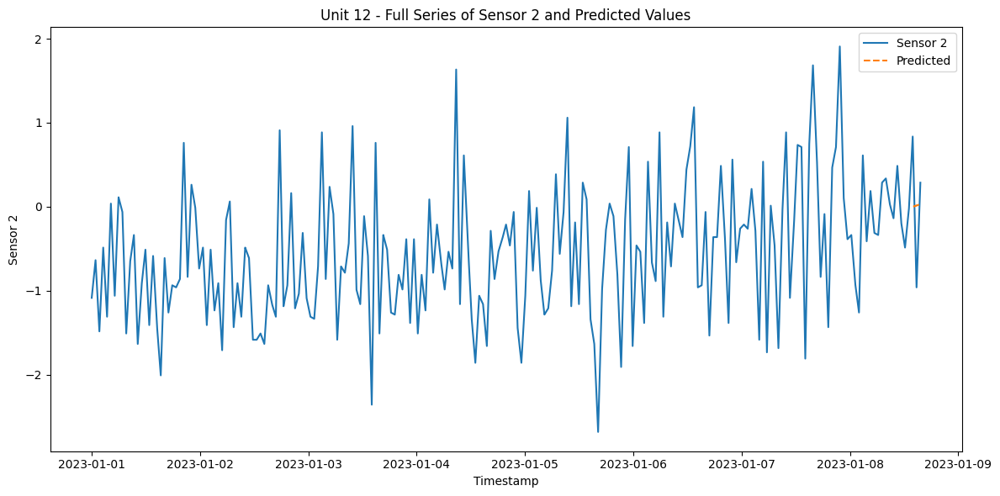

RMSE for Unit 12 - sensor_2: 0.49827885599722965
{'train': [0, 7916], 'valid': [7404, 8906], 'test': [8394, 9894]}
9295
Dataset for unit 13 is good


  0%|          | 0/101 [00:00<?, ?it/s]

96
[0.00931869570068694, 0.01959011260206553, 0.029861529503444117, 0.040132946404822706, 0.050404363306201294, 0.06067578020757987, 0.07094719710895846, 0.08121861401033705, 0.09149003091171563, 0.10176144781309422, 0.11203286471447281, 0.1223042816158514, 0.13257569851723, 0.14284711541860856, 0.15311853231998718, 0.16338994922136574, 0.17366136612274435, 0.18393278302412291, 0.19420419992550153, 0.2044756168268801, 0.2147470337282587, 0.22501845062963727, 0.23528986753101588, 0.24556128443239444, 0.25583270133377306, 0.2661041182351516, 0.2763755351365302, 0.2866469520379088, 0.29691836893928736, 0.307189785840666, 0.31746120274204453, 0.32773261964342315, 0.3380040365448017, 0.3482754534461803, 0.3585468703475589, 0.3688182872489375, 0.37908970415031606, 0.3893611210516947, 0.39963253795307324, 0.40990395485445186, 0.4201753717558304, 0.430446788657209, 0.44071820555858754, 0.4509896224599662, 0.4612610393613447, 0.44707670173562797, 0.4328923641099113, 0.41870802648419453, 0.40452

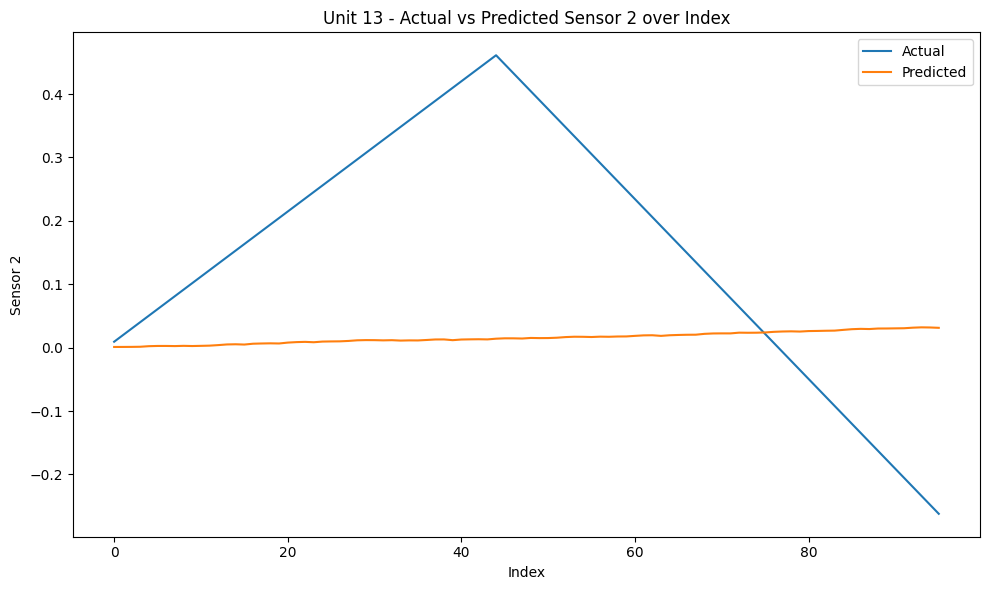

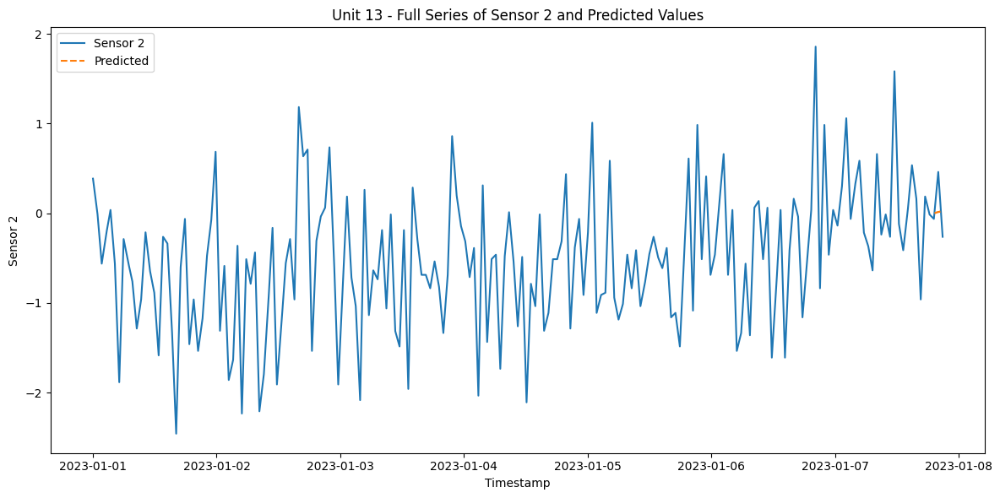

RMSE for Unit 13 - sensor_2: 0.24302599293681962
{'train': [0, 1837], 'valid': [1325, 2066], 'test': [1554, 2295]}
1696
Dataset for unit 14 is good


  0%|          | 0/6 [00:00<?, ?it/s]

96
[0.8525531117949254, 0.8549986872476388, 0.8574442627003522, 0.8598898381530656, 0.862335413605779, 0.8647809890584925, 0.8672265645112059, 0.8696721399639193, 0.8721177154166327, 0.8745632908693461, 0.8770088663220597, 0.879454441774773, 0.8819000172274865, 0.8843455926801999, 0.8867911681329133, 0.8892367435856268, 0.8916823190383402, 0.8941278944910536, 0.896573469943767, 0.8990190453964805, 0.9014646208491939, 0.9039101963019073, 0.9063557717546207, 0.9088013472073342, 0.9112469226600476, 0.913692498112761, 0.9161380735654744, 0.9185836490181878, 0.9210292244709013, 0.9234747999236147, 0.9259203753763281, 0.9283659508290415, 0.9308115262817549, 0.9332571017344684, 0.9357026771871818, 0.9381482526398952, 0.9405938280926086, 0.943039403545322, 0.9454849789980355, 0.9479305544507489, 0.9503761299034623, 0.9528217053561757, 0.9552672808088891, 0.9577128562616026, 0.960158431714316, 0.9626040071670239, 0.9650495826197317, 0.9674951580724396, 0.9699407335251474, 0.9723863089778554, 0.

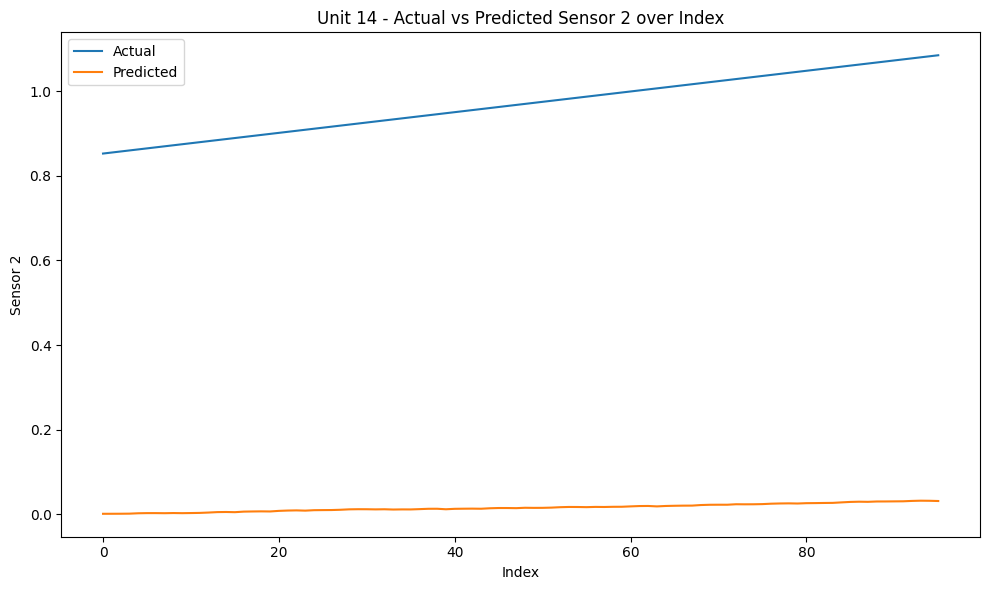

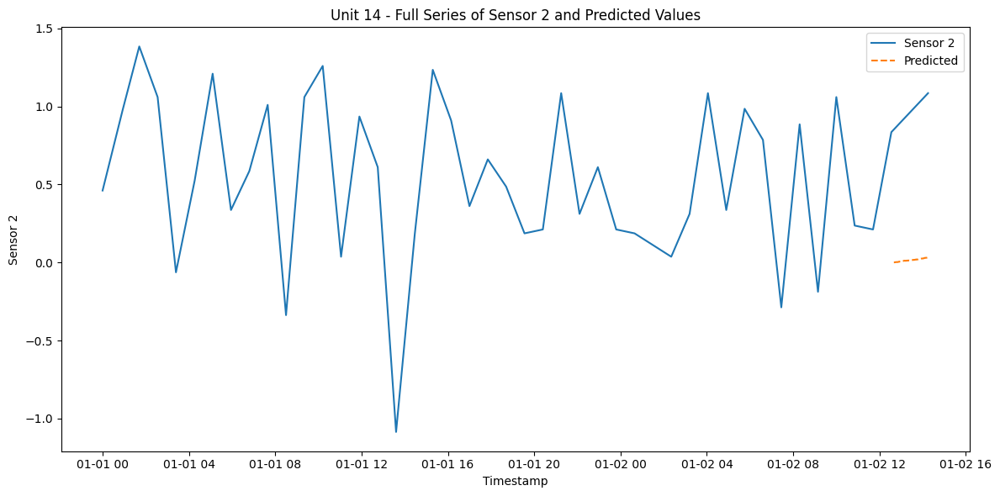

RMSE for Unit 14 - sensor_2: 0.9548397626014978
{'train': [0, 3061], 'valid': [2549, 3443], 'test': [2931, 3825]}
3226
Dataset for unit 15 is good


  0%|          | 0/25 [00:00<?, ?it/s]

96
[-1.007551577536299, -0.9928781248200353, -0.9782046721037714, -0.9635312193875076, -0.9488577666712437, -0.9341843139549798, -0.919510861238716, -0.9048374085224521, -0.8901639558061882, -0.8754905030899244, -0.8608170503736605, -0.8461435976573967, -0.8314701449411328, -0.816796692224869, -0.8021232395086051, -0.7874497867923411, -0.7727763340760774, -0.7581028813598134, -0.7434294286435497, -0.7287559759272857, -0.714082523211022, -0.699409070494758, -0.6847356177784941, -0.6700621650622303, -0.6553887123459664, -0.6407152596297025, -0.6260418069134387, -0.6113683541971748, -0.596694901480911, -0.5820214487646471, -0.5673479960483833, -0.5526745433321194, -0.5380010906158555, -0.5233276378995917, -0.5086541851833277, -0.49398073246706387, -0.4793072797508, -0.46463382703453615, -0.4499603743182723, -0.43528692160200844, -0.4206134688857446, -0.4059400161694807, -0.39126656345321686, -0.376593110736953, -0.3619196580206892, -0.3540938165720185, -0.3462679751233478, -0.338442133674

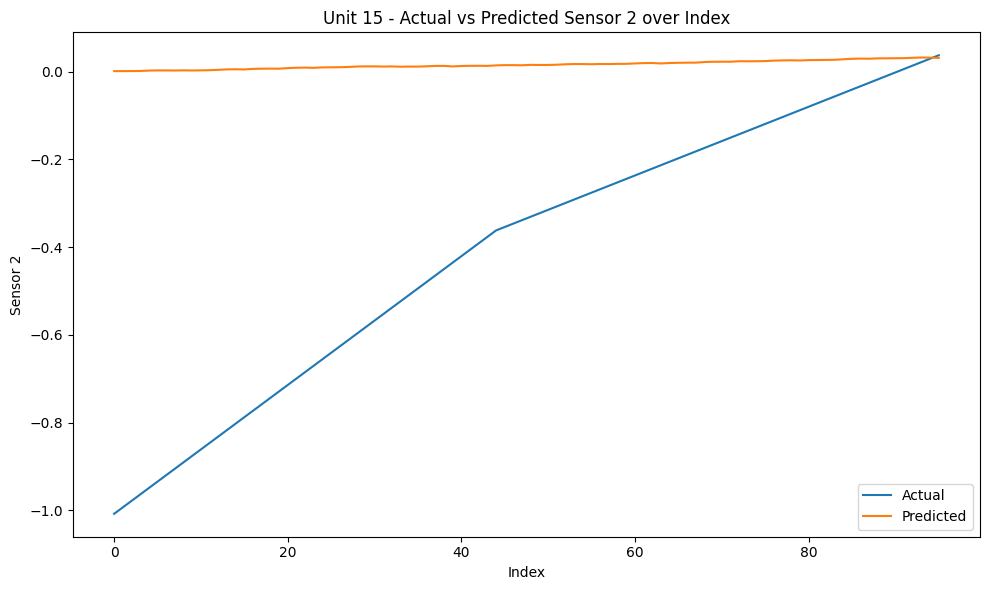

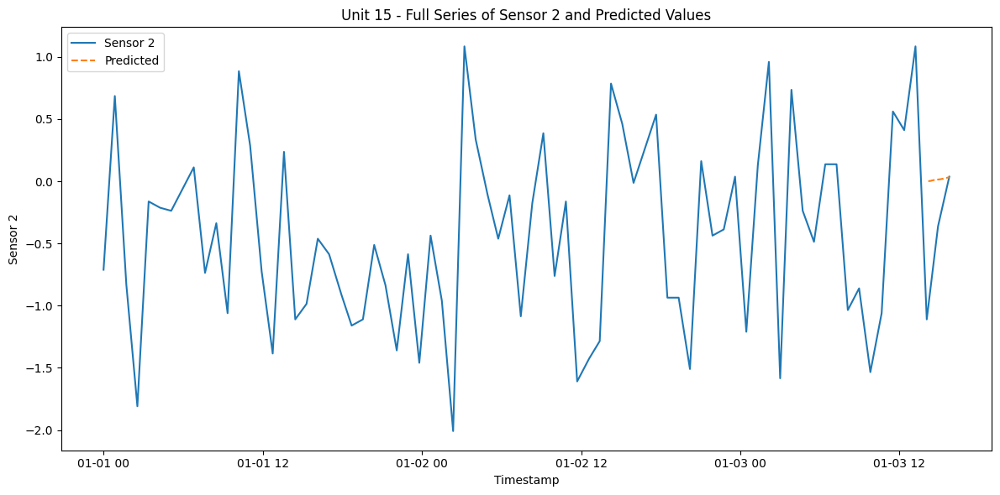

RMSE for Unit 15 - sensor_2: 0.514741541286628
{'train': [0, 4570], 'valid': [4058, 5142], 'test': [4630, 5712]}
5113
Dataset for unit 16 is good


  0%|          | 0/49 [00:00<?, ?it/s]

96
[-0.550718082969942, -0.5384902057063915, -0.5262623284428412, -0.5140344511792907, -0.5018065739157402, -0.4895786966521898, -0.4773508193886393, -0.4651229421250889, -0.45289506486153847, -0.44066718759798806, -0.4284393103344376, -0.41621143307088715, -0.4039835558073367, -0.3917556785437863, -0.37952780128023583, -0.36729992401668543, -0.355072046753135, -0.3428441694895845, -0.3306162922260341, -0.31838841496248366, -0.3061605376989332, -0.2939326604353828, -0.28170478317183234, -0.2694769059082819, -0.2572490286447315, -0.24502115138118102, -0.23279327411763057, -0.22056539685408016, -0.2083375195905297, -0.19610964232697925, -0.18388176506342885, -0.1716538877998784, -0.15942601053632793, -0.14719813327277753, -0.13497025600922707, -0.12274237874567662, -0.11051450148212616, -0.09828662421857581, -0.08605874695502536, -0.0738308696914749, -0.06160299242792444, -0.049375115164373984, -0.037147237900823527, -0.02491936063727318, -0.012691483373722754, 0.012742501334461268, 0.03

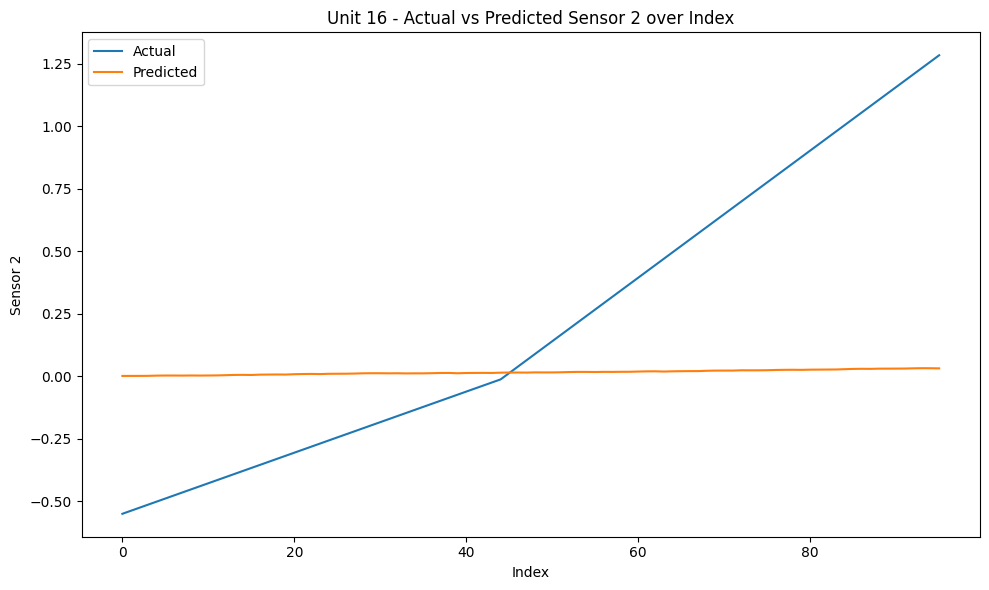

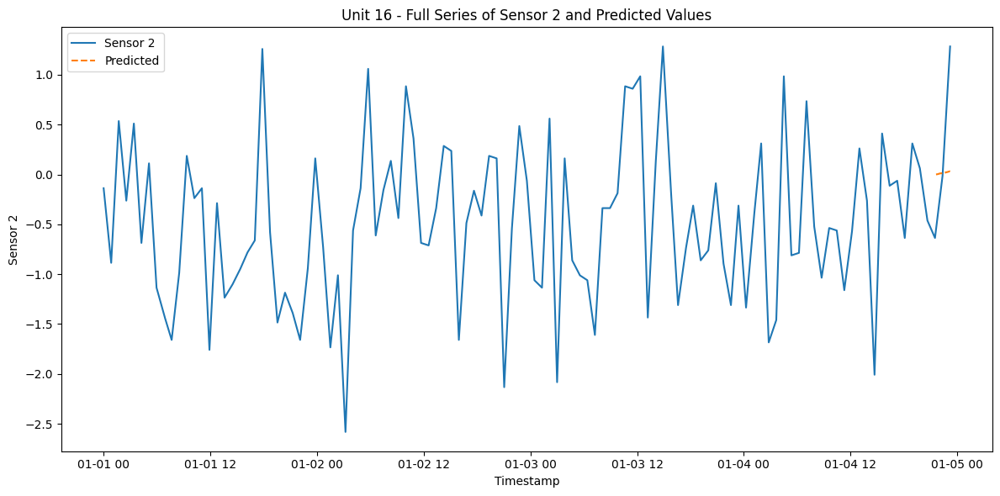

RMSE for Unit 16 - sensor_2: 0.5753088279532286
{'train': [0, 6692], 'valid': [6180, 7528], 'test': [7016, 8364]}
7765
Dataset for unit 17 is good


  0%|          | 0/82 [00:00<?, ?it/s]

96
[0.7777185029421537, 0.7552192087772192, 0.7327199146122846, 0.71022062044735, 0.6877213262824153, 0.6652220321174809, 0.6427227379525462, 0.6202234437876116, 0.5977241496226771, 0.5752248554577425, 0.5527255612928079, 0.5302262671278734, 0.5077269729629388, 0.48522767879800416, 0.4627283846330696, 0.44022909046813496, 0.4177297963032004, 0.3952305021382658, 0.37273120797333126, 0.3502319138083967, 0.3277326196434621, 0.30523332547852744, 0.28273403131359287, 0.2602347371486583, 0.23773544298372373, 0.21523614881878916, 0.1927368546538546, 0.17023756048892003, 0.14773826632398546, 0.1252389721590509, 0.10273967799411621, 0.08024038382918164, 0.05774108966424707, 0.0352417954993125, 0.012742501334377931, -0.009756792830556638, -0.03225608699549121, -0.05475538116042589, -0.07725467532536034, -0.09975396949029502, -0.12225326365522948, -0.14475255782016416, -0.16725185198509884, -0.1897511461500333, -0.21225044031496798, -0.18730557069732554, -0.1623607010796831, -0.13741583146204064,

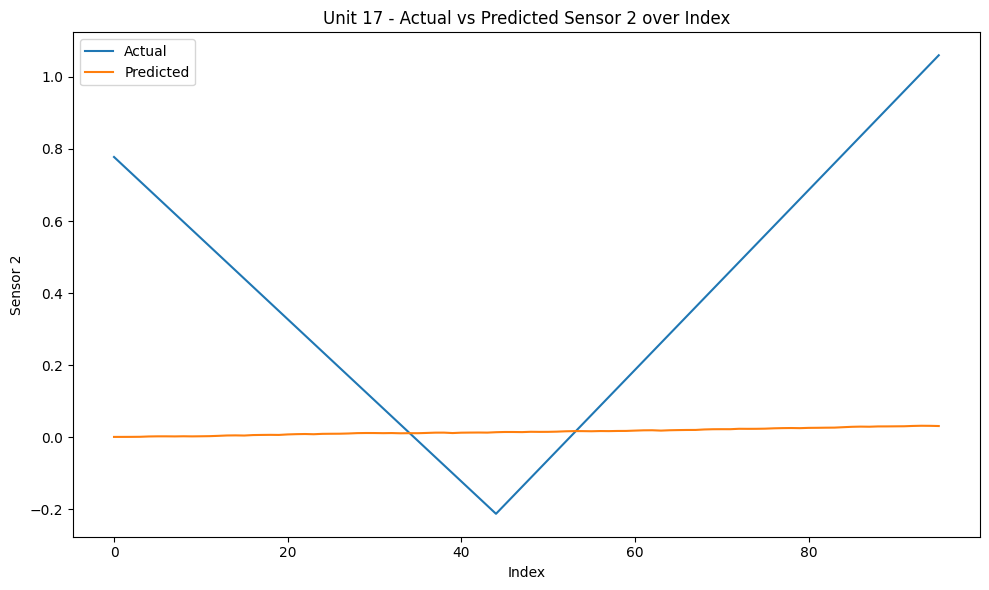

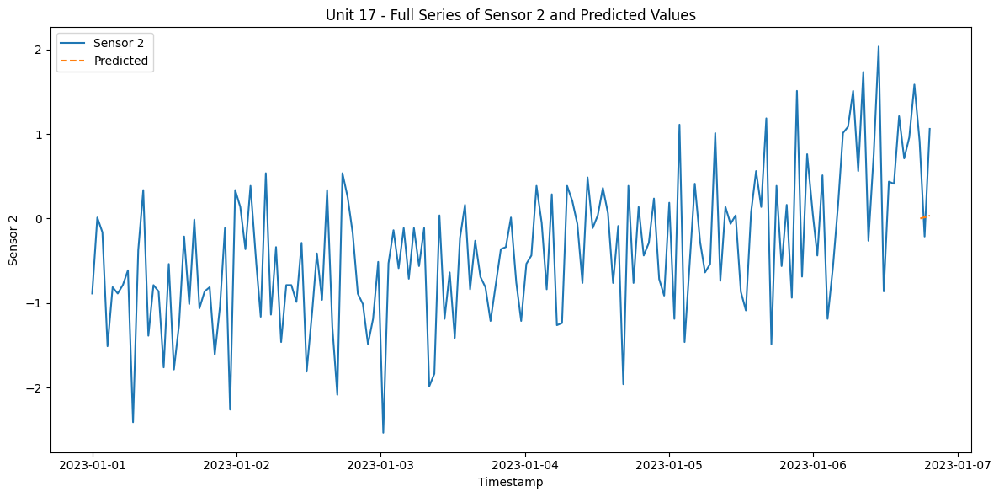

RMSE for Unit 17 - sensor_2: 0.4868279255845583
{'train': [0, 5386], 'valid': [4874, 6060], 'test': [5548, 6732]}
6133
Dataset for unit 18 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[1.8821403773859147, 1.8606193134020688, 1.8390982494182229, 1.817577185434377, 1.796056121450531, 1.7745350574666852, 1.7530139934828393, 1.7314929294989934, 1.7099718655151475, 1.6884508015313018, 1.6669297375474557, 1.64540867356361, 1.623887609579764, 1.6023665455959182, 1.5808454816120723, 1.5593244176282264, 1.5378033536443805, 1.5162822896605346, 1.494761225676689, 1.4732401616928428, 1.451719097708997, 1.430198033725151, 1.4086769697413053, 1.3871559057574594, 1.3656348417736135, 1.3441137777897676, 1.3225927138059217, 1.3010716498220758, 1.27955058583823, 1.2580295218543842, 1.236508457870538, 1.2149873938866924, 1.1934663299028463, 1.1719452659190006, 1.1504242019351547, 1.1289031379513088, 1.107382073967463, 1.085861009983617, 1.064339945999771, 1.0428188820159252, 1.0212978180320793, 0.9997767540482334, 0.9782556900643877, 0.9567346260805418, 0.9352135620966958, 0.9425502884548249, 0.9498870148129541, 0.9572237411710832, 0.9645604675292124, 0.9718971938873415, 0.97923392

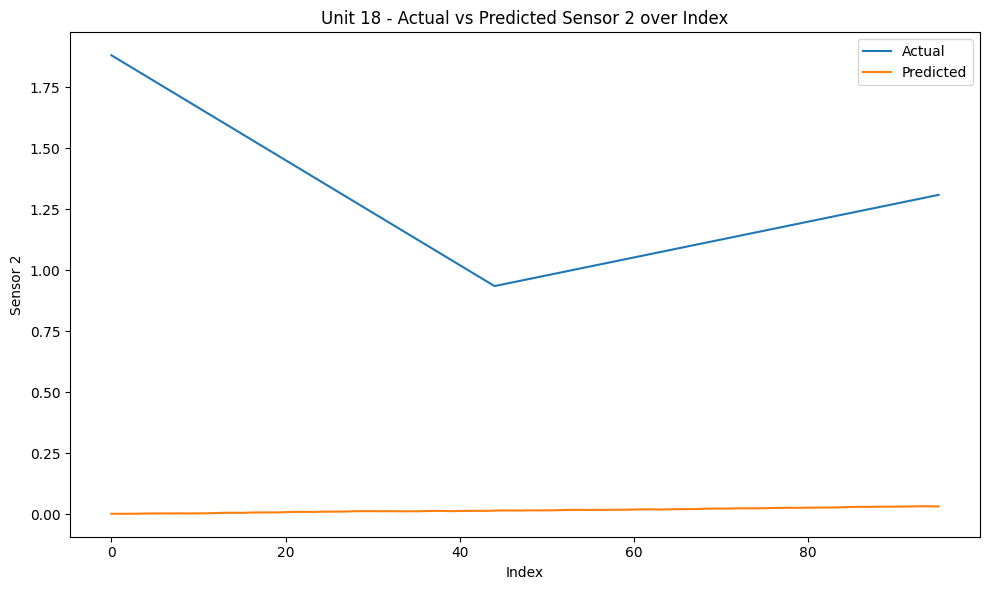

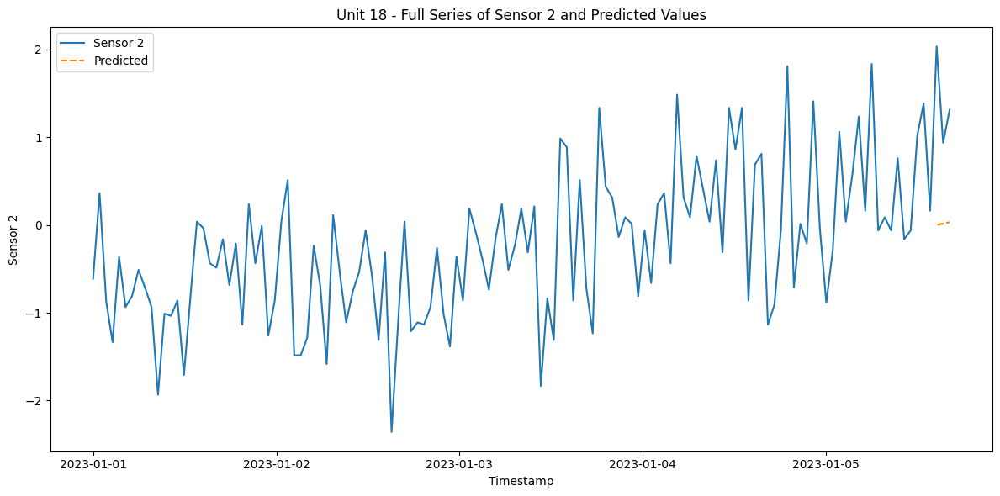

RMSE for Unit 18 - sensor_2: 1.2687981978862808
{'train': [0, 5468], 'valid': [4956, 6152], 'test': [5640, 6834]}
6235
Dataset for unit 19 is good


  0%|          | 0/63 [00:00<?, ?it/s]

96
[0.23822455807427084, 0.22061641481475755, 0.20300827155524426, 0.18540012829573096, 0.16779198503621767, 0.15018384177670435, 0.13257569851719106, 0.11496755525767777, 0.0973594119981645, 0.07975126873865118, 0.06214312547913786, 0.0445349822196246, 0.026926838960111277, 0.009318695700598012, -0.008289447558915308, -0.025897590818428573, -0.04350573407794189, -0.061113877337455214, -0.07872202059696848, -0.0963301638564818, -0.11393830711599506, -0.13154645037550838, -0.1491545936350217, -0.1667627368945349, -0.18437088015404823, -0.20197902341356155, -0.21958716667307487, -0.2371953099325882, -0.2548034531921014, -0.2724115964516147, -0.29001973971112804, -0.30762788297064136, -0.3252360262301546, -0.3428441694896679, -0.3604523127491812, -0.37806045600869453, -0.39566859926820785, -0.41327674252772106, -0.4308848857872344, -0.4484930290467477, -0.466101172306261, -0.48370931556577434, -0.5013174588252876, -0.5189256020848009, -0.5365337453443142, -0.5106106455455885, -0.484687545

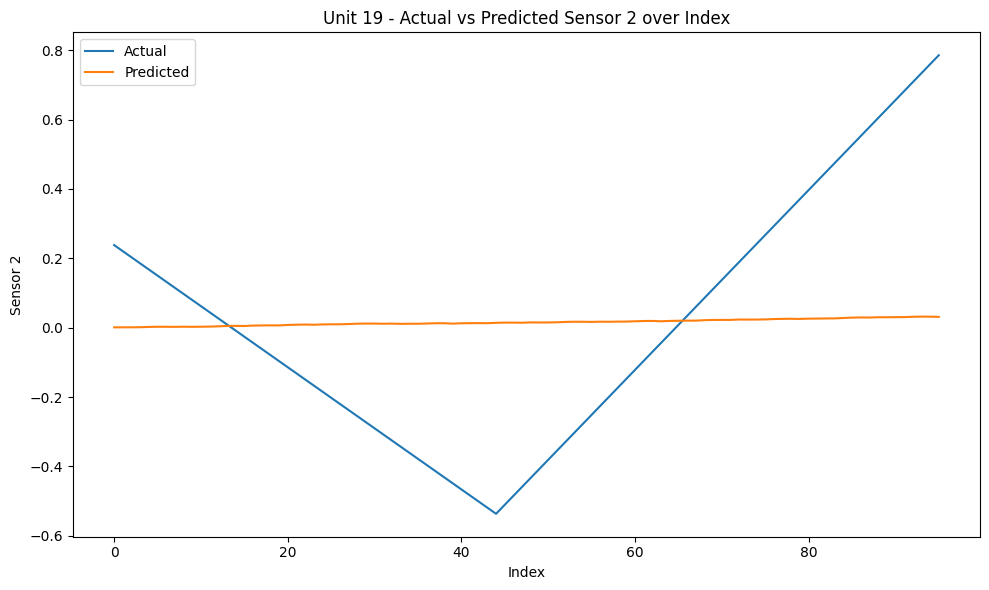

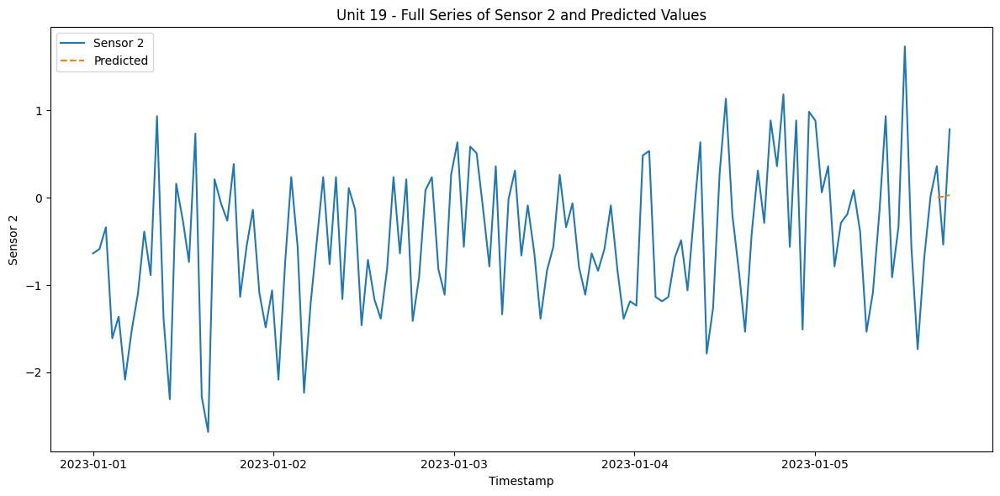

RMSE for Unit 19 - sensor_2: 0.3451302595048439
{'train': [0, 7467], 'valid': [6955, 8401], 'test': [7889, 9333]}
8734
Dataset for unit 20 is good


  0%|          | 0/94 [00:00<?, ?it/s]

96
[2.5845096474042575, 2.5742382305028793, 2.5639668136015006, 2.553695396700122, 2.5434239797987432, 2.5331525628973646, 2.5228811459959863, 2.5126097290946077, 2.502338312193229, 2.4920668952918503, 2.4817954783904717, 2.4715240614890934, 2.4612526445877148, 2.450981227686336, 2.4407098107849574, 2.4304383938835787, 2.4201669769822, 2.409895560080822, 2.399624143179443, 2.3893527262780645, 2.379081309376686, 2.3688098924753076, 2.358538475573929, 2.3482670586725503, 2.3379956417711716, 2.327724224869793, 2.3174528079684142, 2.307181391067036, 2.2969099741656573, 2.2866385572642787, 2.2763671403629, 2.2660957234615213, 2.255824306560143, 2.2455528896587644, 2.2352814727573858, 2.225010055856007, 2.2147386389546284, 2.20446722205325, 2.1941958051518715, 2.183924388250493, 2.173652971349114, 2.1633815544477355, 2.1531101375463573, 2.1428387206449786, 2.1325673037436, 2.1531101375463626, 2.1736529713491253, 2.194195805151888, 2.214738638954651, 2.2352814727574137, 2.2558243065601764, 2.

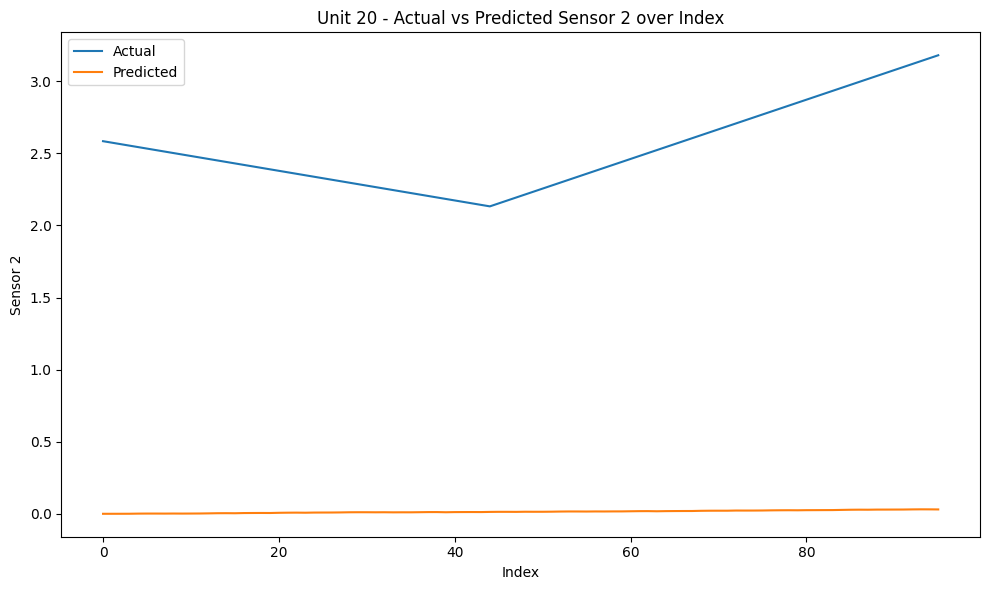

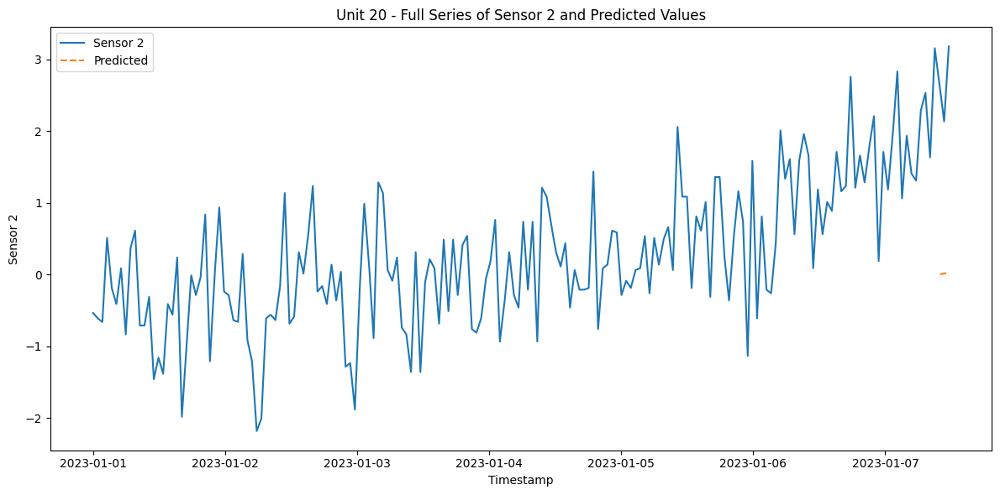

RMSE for Unit 20 - sensor_2: 2.5218779440643075
{'train': [0, 5998], 'valid': [5486, 6748], 'test': [6236, 7497]}
6898
Dataset for unit 21 is good


  0%|          | 0/71 [00:00<?, ?it/s]

96
[-0.4132767425277211, -0.39566859926820785, -0.37806045600869453, -0.3604523127491812, -0.34284416948966795, -0.32523602623015463, -0.30762788297064136, -0.29001973971112804, -0.2724115964516148, -0.25480345319210146, -0.23719530993258814, -0.21958716667307487, -0.20197902341356155, -0.1843708801540483, -0.16676273689453497, -0.1491545936350217, -0.13154645037550838, -0.11393830711599506, -0.0963301638564818, -0.07872202059696848, -0.061113877337455214, -0.04350573407794189, -0.025897590818428573, -0.008289447558915364, 0.009318695700597956, 0.026926838960111277, 0.0445349822196246, 0.06214312547913792, 0.07975126873865113, 0.09735941199816445, 0.11496755525767777, 0.1325756985171911, 0.1501838417767043, 0.16779198503621762, 0.18540012829573094, 0.20300827155524426, 0.22061641481475758, 0.2382245580742708, 0.2558327013337841, 0.2734408445932974, 0.29104898785281075, 0.30865713111232407, 0.3262652743718373, 0.3438734176313506, 0.3614815608908639, 0.3634380212530302, 0.365394481615196

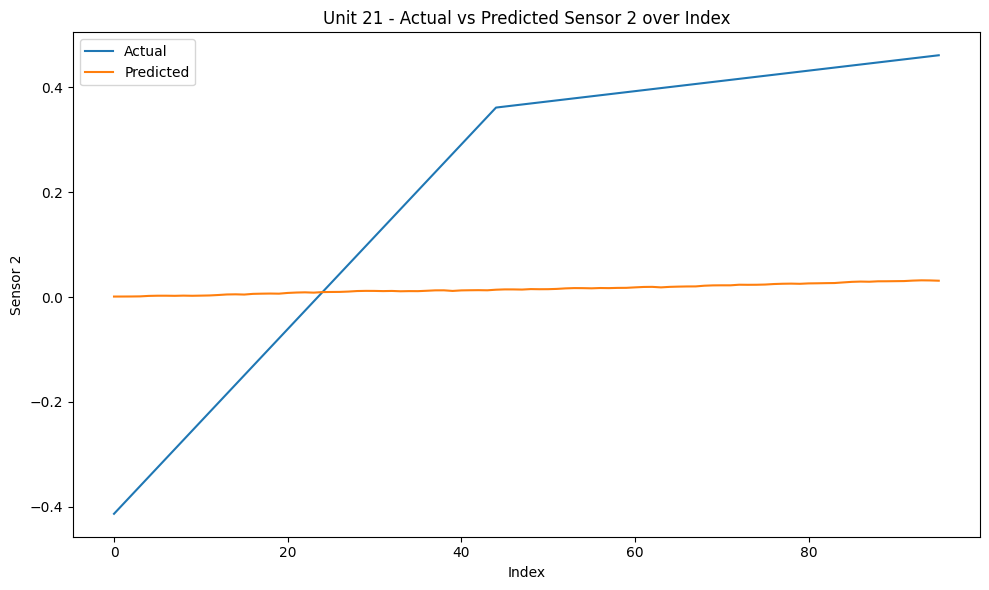

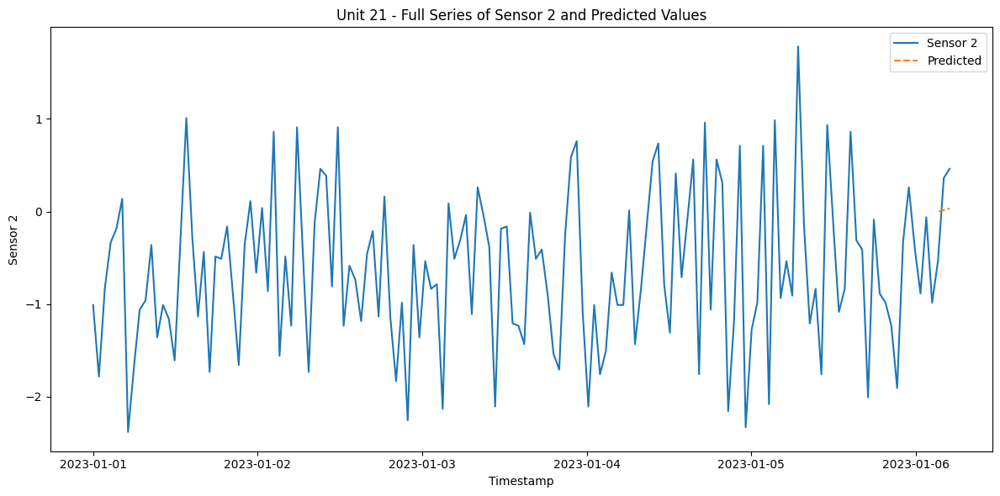

RMSE for Unit 21 - sensor_2: 0.32426987713232464
{'train': [0, 1551], 'valid': [1039, 1745], 'test': [1233, 1938]}
1339
Dataset for unit 22 is good


  0%|          | 0/2 [00:00<?, ?it/s]

96
[0.20643207718894072, 0.21279057336598672, 0.21914906954303273, 0.22550756572007874, 0.23186606189712472, 0.23822455807417076, 0.24458305425121674, 0.2509415504282627, 0.25730004660530875, 0.2636585427823548, 0.27001703895940077, 0.27637553513644675, 0.2827340313134928, 0.2890925274905388, 0.2954510236675848, 0.3018095198446308, 0.30816801602167676, 0.3145265121987228, 0.32088500837576883, 0.3272435045528148, 0.3336020007298608, 0.3399604969069068, 0.3463189930839528, 0.35267748926099884, 0.3590359854380448, 0.3653944816150908, 0.37175297779213684, 0.3781114739691829, 0.38446997014622886, 0.39082846632327484, 0.3971869625003208, 0.40354545867736685, 0.4099039548544129, 0.41626245103145887, 0.42262094720850485, 0.42897944338555083, 0.4353379395625969, 0.4416964357396429, 0.4480549319166889, 0.45441342809373486, 0.46077192427078095, 0.46713042044782693, 0.4734889166248729, 0.4798474128019189, 0.48620590897896493, 0.47789095243975266, 0.46957599590054033, 0.46126103936132806, 0.4529460

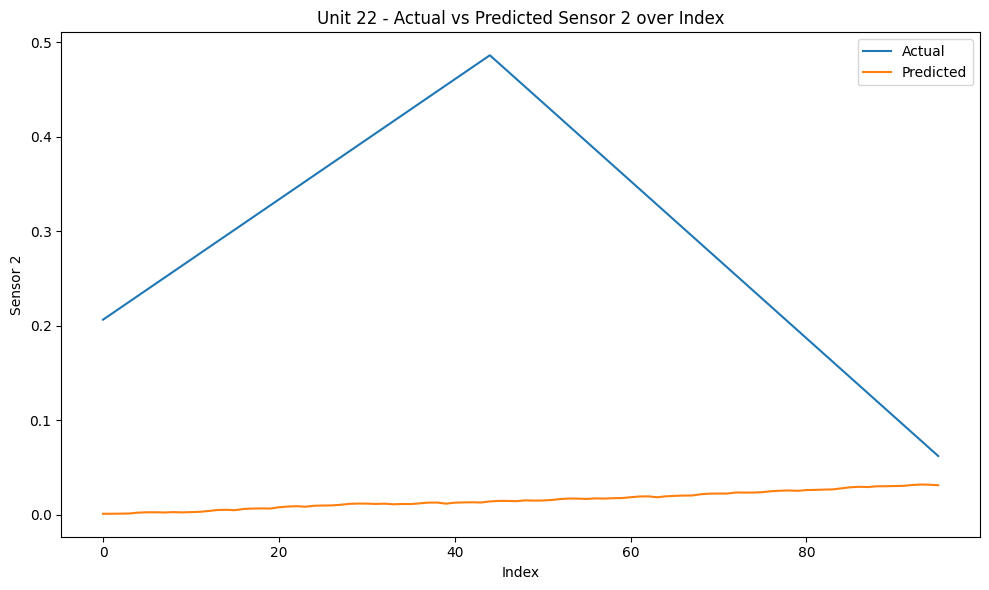

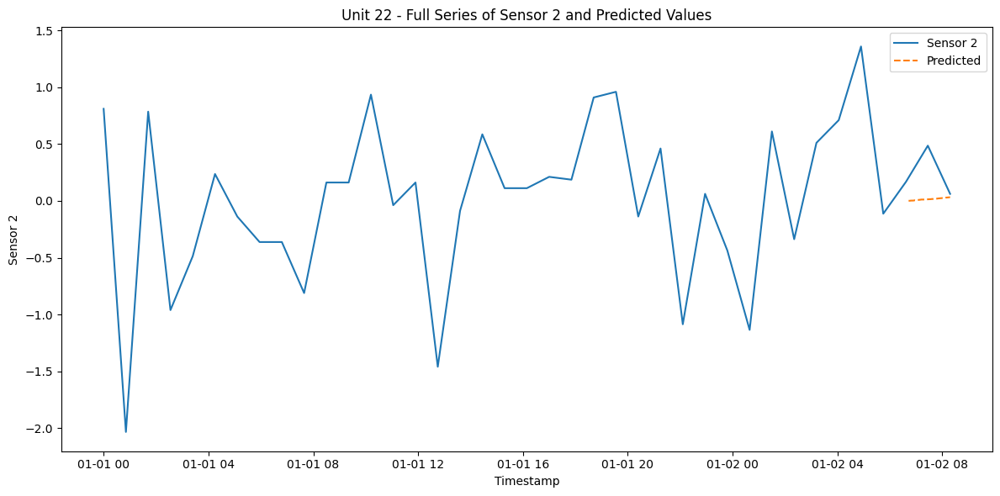

RMSE for Unit 22 - sensor_2: 0.31270693298725866
{'train': [0, 5264], 'valid': [4752, 5922], 'test': [5410, 6579]}
5980
Dataset for unit 23 is good


  0%|          | 0/60 [00:00<?, ?it/s]

96
[0.46419572990479996, 0.4539243130034158, 0.4436528961020316, 0.4333814792006475, 0.42311006229926335, 0.4128386453978792, 0.40256722849649507, 0.3922958115951109, 0.38202439469372673, 0.3717529777923426, 0.3614815608909585, 0.35121014398957434, 0.3409387270881902, 0.33066731018680606, 0.3203958932854219, 0.31012447638403773, 0.2998530594826536, 0.28958164258126945, 0.2793102256798853, 0.26903880877850117, 0.258767391877117, 0.24849597497573284, 0.23822455807434872, 0.22795314117296456, 0.21768172427158045, 0.20741030737019628, 0.1971388904688121, 0.186867473567428, 0.17659605666604383, 0.16632463976465972, 0.15605322286327555, 0.1457818059618914, 0.13551038906050727, 0.1252389721591231, 0.11496755525773894, 0.10469613835635483, 0.09442472145497066, 0.0841533045535865, 0.07388188765220238, 0.06361047075081822, 0.053339053849434104, 0.04306763694804994, 0.032796220046665825, 0.022524803145281602, 0.01225338624389745, -0.00975679283049556, -0.03176697190488857, -0.05377715097928158, -

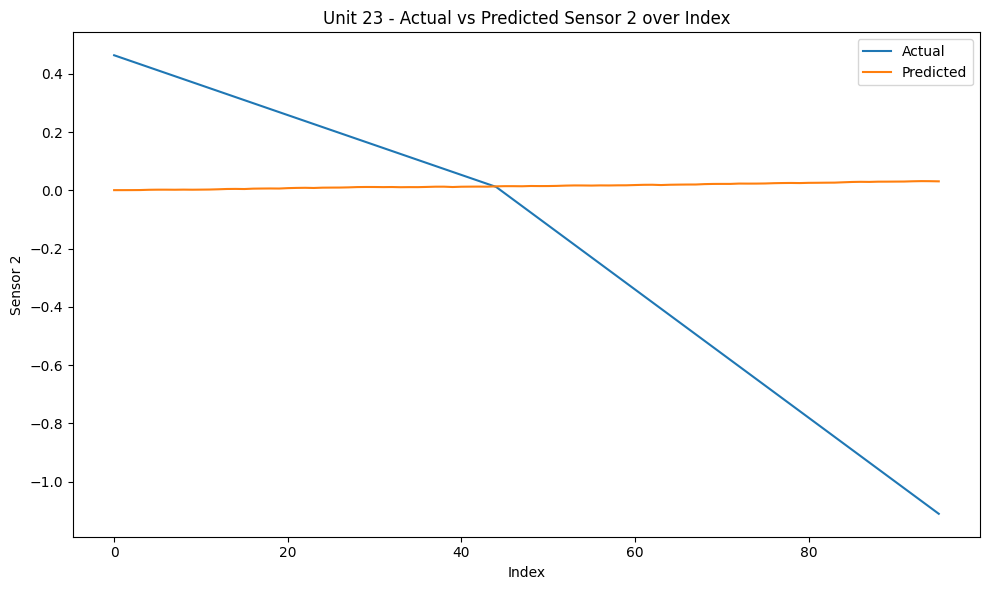

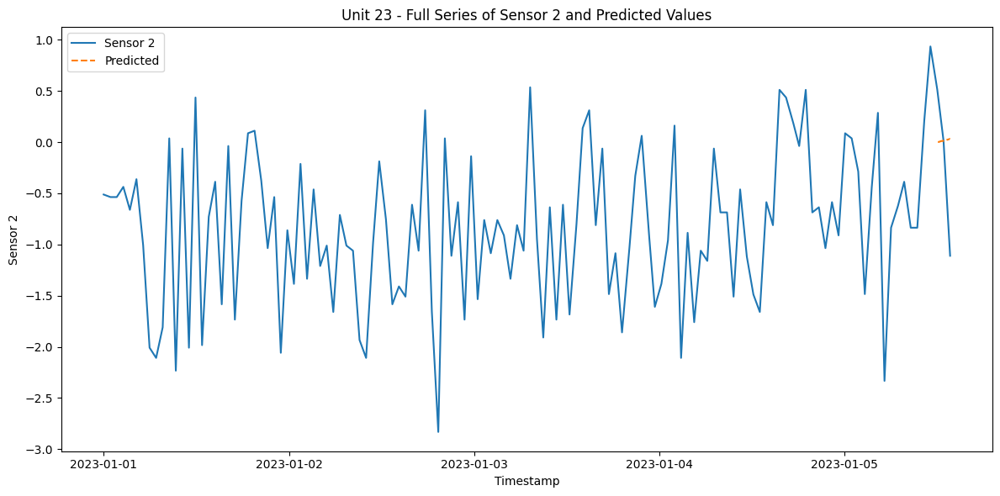

RMSE for Unit 23 - sensor_2: 0.5212902655963841
{'train': [0, 7549], 'valid': [7037, 8492], 'test': [7980, 9435]}
8836
Dataset for unit 24 is good


  0%|          | 0/96 [00:00<?, ?it/s]

96
[1.1504242019352324, 1.1455330510298112, 1.1406419001243897, 1.1357507492189685, 1.1308595983135472, 1.125968447408126, 1.1210772965027047, 1.1161861455972835, 1.1112949946918622, 1.1064038437864407, 1.1015126928810195, 1.0966215419755982, 1.091730391070177, 1.0868392401647557, 1.0819480892593343, 1.077056938353913, 1.0721657874484918, 1.0672746365430705, 1.0623834856376493, 1.057492334732228, 1.0526011838268068, 1.0477100329213853, 1.042818882015964, 1.0379277311105428, 1.0330365802051216, 1.0281454292997003, 1.0232542783942788, 1.0183631274888576, 1.0134719765834364, 1.008580825678015, 1.0036896747725939, 0.9987985238671725, 0.9939073729617512, 0.9890162220563299, 0.9841250711509086, 0.9792339202454874, 0.9743427693400661, 0.9694516184346448, 0.9645604675292235, 0.9596693166238022, 0.9547781657183809, 0.9498870148129597, 0.9449958639075384, 0.9401047130021171, 0.9352135620966958, 0.9562455109900001, 0.9772774598833044, 0.9983094087766087, 1.019341357669913, 1.0403733065632172, 1.0

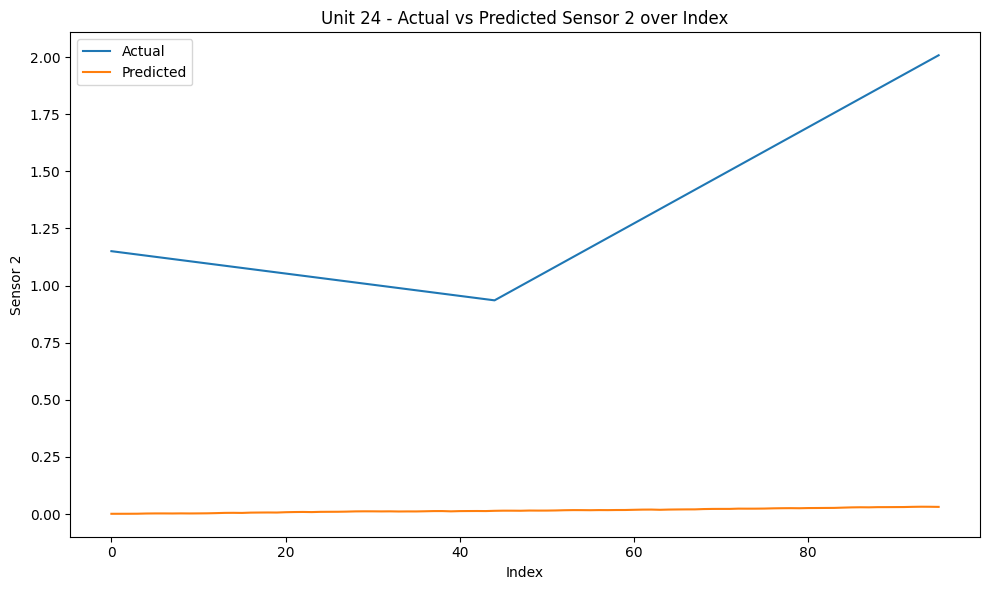

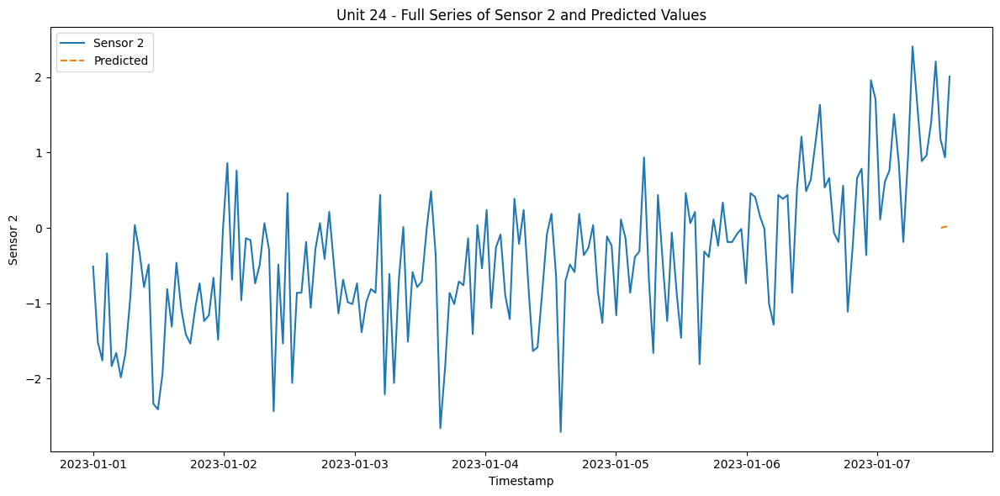

RMSE for Unit 24 - sensor_2: 1.2980345377976201
{'train': [0, 1918], 'valid': [1406, 2158], 'test': [1646, 2397]}
1798
Dataset for unit 25 is good


  0%|          | 0/8 [00:00<?, ?it/s]

96
[-0.3227904507775302, -0.3100734584234326, -0.2973564660693351, -0.28463947371523746, -0.27192248136113994, -0.2592054890070423, -0.24648849665294476, -0.2337715042988472, -0.22105451194474962, -0.20833751959065205, -0.1956205272365545, -0.18290353488245692, -0.17018654252835935, -0.15746955017426179, -0.14475255782016422, -0.13203556546606665, -0.11931857311196908, -0.10660158075787146, -0.0938845884037739, -0.08116759604967633, -0.06845060369557876, -0.05573361134148119, -0.043016618987383626, -0.03029962663328606, -0.01758263427918849, -0.004865641925090924, 0.007851350429006643, 0.02056834278310421, 0.03328533513720178, 0.046002327491299344, 0.05871931984539691, 0.07143631219949448, 0.08415330455359205, 0.09687029690768961, 0.10958728926178724, 0.12230428161588475, 0.13502127396998237, 0.14773826632407988, 0.1604552586781775, 0.17317225103227502, 0.18588924338637264, 0.19860623574047026, 0.21132322809456777, 0.2240402204486654, 0.23675721280276288, 0.25387624097172906, 0.2709952

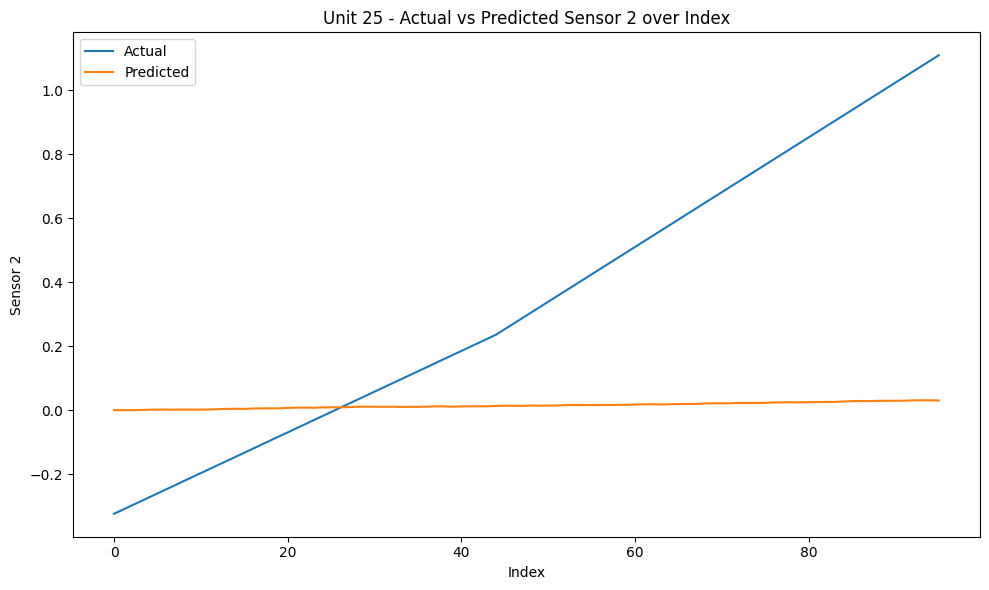

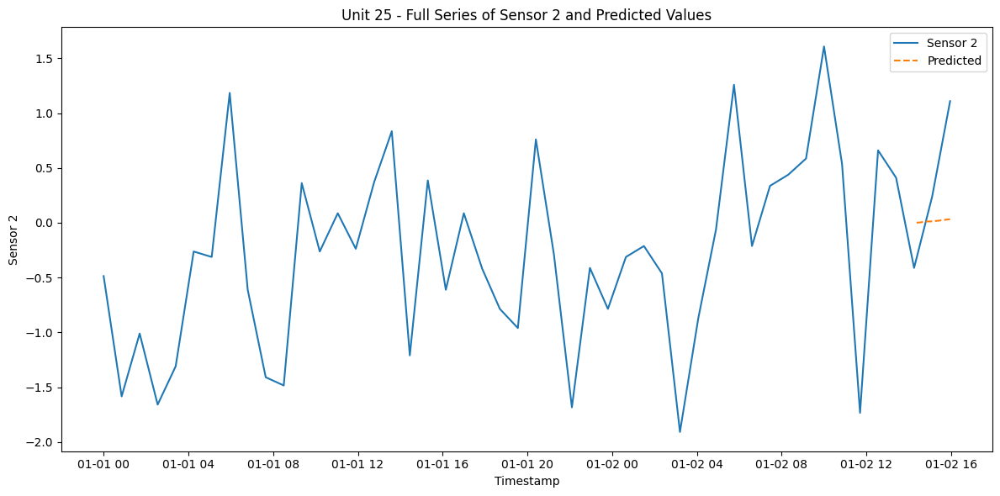

RMSE for Unit 25 - sensor_2: 0.5258562046418142
{'train': [0, 3061], 'valid': [2549, 3443], 'test': [2931, 3825]}
3226
Dataset for unit 26 is good


  0%|          | 0/25 [00:00<?, ?it/s]

96
[-0.6950070346800284, -0.689137653593524, -0.6832682725070196, -0.6773988914205151, -0.6715295103340106, -0.6656601292475063, -0.6597907481610018, -0.6539213670744974, -0.648051985987993, -0.6421826049014885, -0.6363132238149841, -0.6304438427284796, -0.6245744616419753, -0.6187050805554708, -0.6128356994689663, -0.606966318382462, -0.6010969372959575, -0.5952275562094531, -0.5893581751229486, -0.5834887940364442, -0.5776194129499398, -0.5717500318634353, -0.565880650776931, -0.5600112696904265, -0.554141888603922, -0.5482725075174176, -0.5424031264309132, -0.5365337453444088, -0.5306643642579043, -0.5247949831713998, -0.5189256020848955, -0.513056220998391, -0.5071868399118866, -0.5013174588253821, -0.49544807773887767, -0.4895786966523733, -0.4837093155658688, -0.4778399344793644, -0.47197055339286, -0.46610117230635556, -0.4602317912198511, -0.45436241013334666, -0.44849302904684224, -0.4426236479603378, -0.4367542668738334, -0.43626515178329184, -0.4357760366927502, -0.435286921

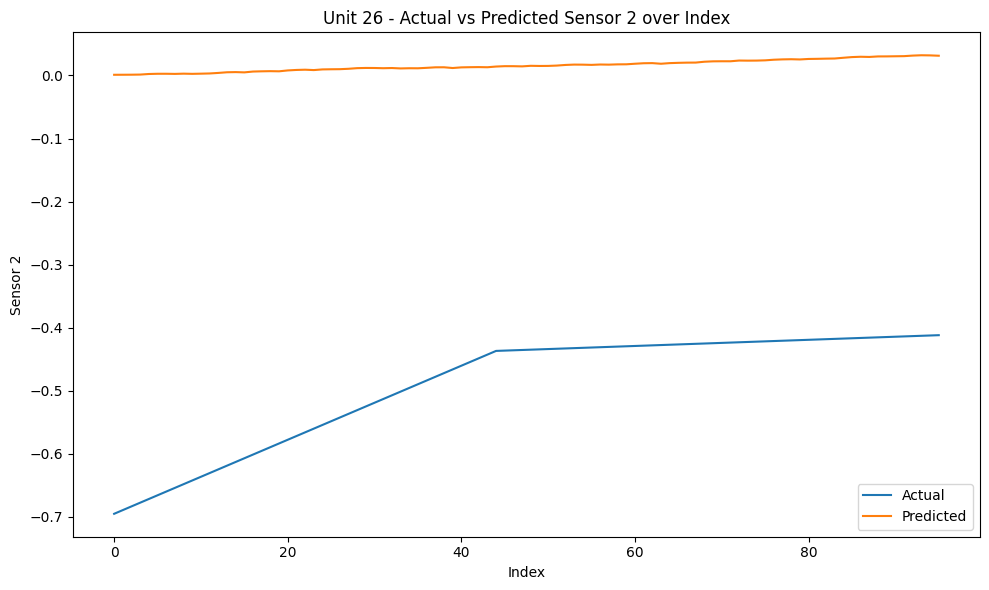

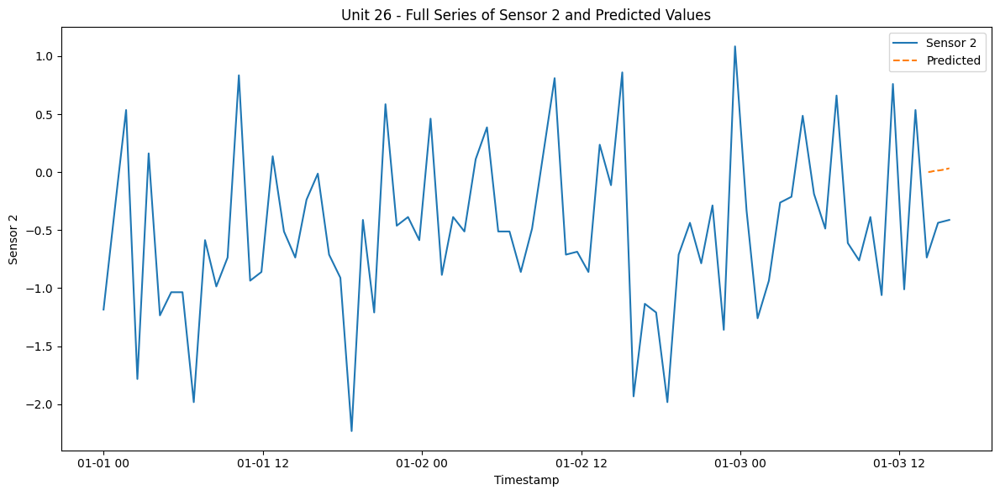

RMSE for Unit 26 - sensor_2: 0.5125677978555603
{'train': [0, 5672], 'valid': [5160, 6381], 'test': [5869, 7089]}
6490
Dataset for unit 27 is good


  0%|          | 0/66 [00:00<?, ?it/s]

96
[0.7473933673286152, 0.7312525693407266, 0.715111771352838, 0.6989709733649494, 0.6828301753770608, 0.6666893773891722, 0.6505485794012836, 0.634407781413395, 0.6182669834255066, 0.6021261854376179, 0.5859853874497294, 0.5698445894618407, 0.5537037914739522, 0.5375629934860636, 0.521422195498175, 0.5052813975102864, 0.48914059952239786, 0.47299980153450927, 0.45685900354662073, 0.44071820555873215, 0.42457740757084356, 0.40843660958295497, 0.3922958115950664, 0.37615501360717785, 0.36001421561928926, 0.34387341763140067, 0.3277326196435121, 0.3115918216556235, 0.2954510236677349, 0.2793102256798463, 0.2631694276919577, 0.24702862970406925, 0.23088783171618066, 0.21474703372829207, 0.19860623574040348, 0.1824654377525149, 0.1663246397646263, 0.15018384177673771, 0.13404304378884913, 0.11790224580096054, 0.10176144781307195, 0.08562064982518336, 0.06947985183729488, 0.05333905384940629, 0.037198255861517655, 0.04062206149530866, 0.04404586712909967, 0.047469672762890686, 0.05089347839

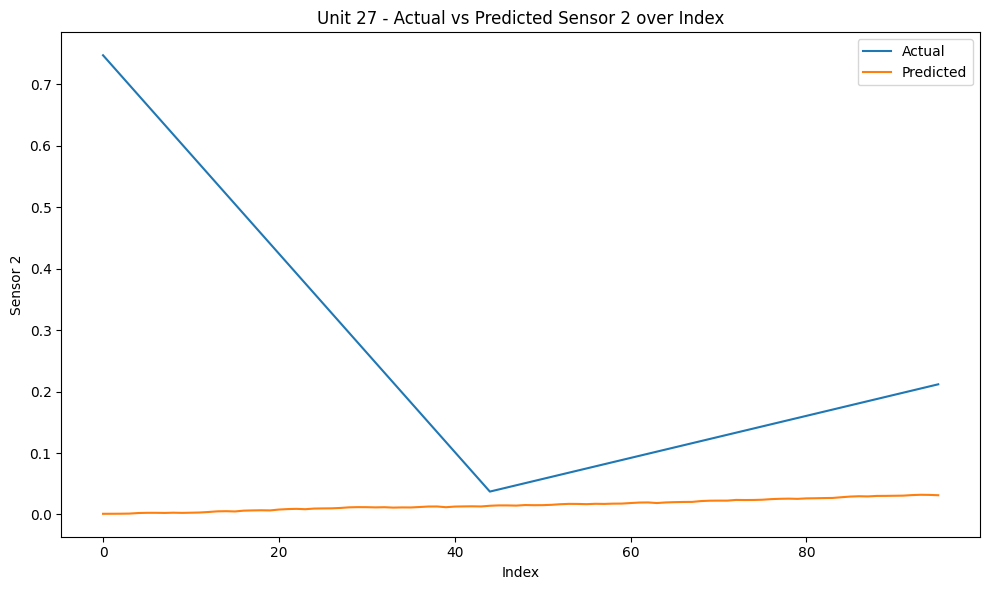

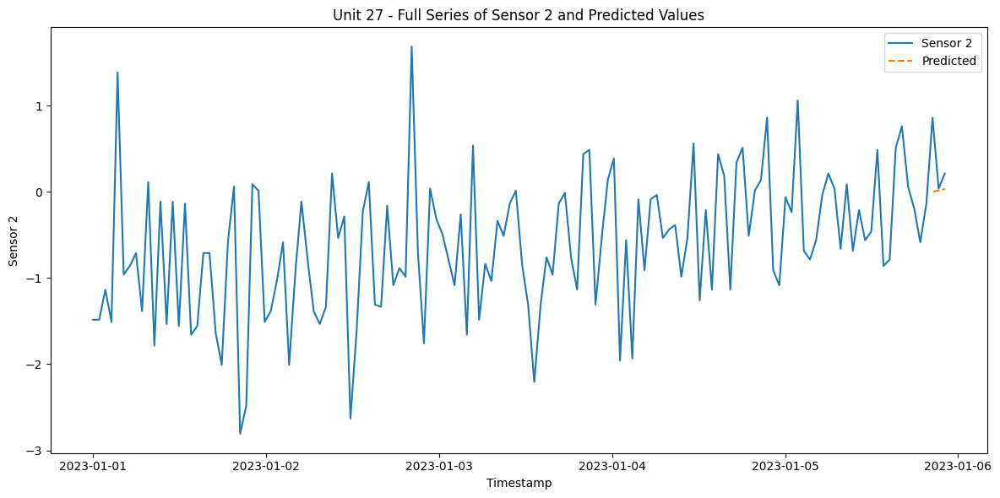

RMSE for Unit 27 - sensor_2: 0.31219960783098266
{'train': [0, 6406], 'valid': [5894, 7207], 'test': [6695, 8007]}
7408
Dataset for unit 28 is good


  0%|          | 0/78 [00:00<?, ?it/s]

96
[0.10420702326586878, 0.1315974683362191, 0.15898791340656943, 0.18637835847691975, 0.21376880354727001, 0.24115924861762034, 0.26854969368797066, 0.2959401387583209, 0.32333058382867125, 0.35072102889902157, 0.3781114739693719, 0.4055019190397222, 0.4328923641100725, 0.46028280918042286, 0.4876732542507731, 0.5150636993211234, 0.5424541443914738, 0.569844589461824, 0.5972350345321743, 0.6246254796025247, 0.652015924672875, 0.6794063697432252, 0.7067968148135756, 0.7341872598839259, 0.7615777049542762, 0.7889681500246265, 0.8163585950949768, 0.8437490401653271, 0.8711394852356774, 0.8985299303060278, 0.925920375376378, 0.9533108204467283, 0.9807012655170787, 1.0080917105874292, 1.0354821556577791, 1.0628726007281295, 1.0902630457984799, 1.1176534908688303, 1.1450439359391806, 1.172434381009531, 1.199824826079881, 1.2272152711502313, 1.2546057162205817, 1.281996161290932, 1.3093866063612825, 1.302538995093695, 1.2956913838261073, 1.2888437725585198, 1.281996161290932, 1.2751485500233

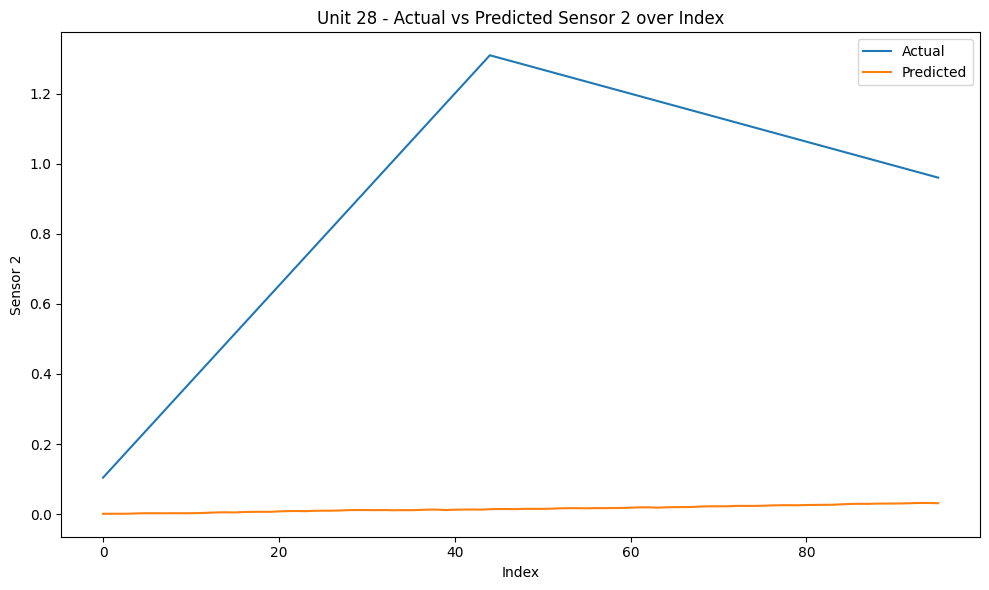

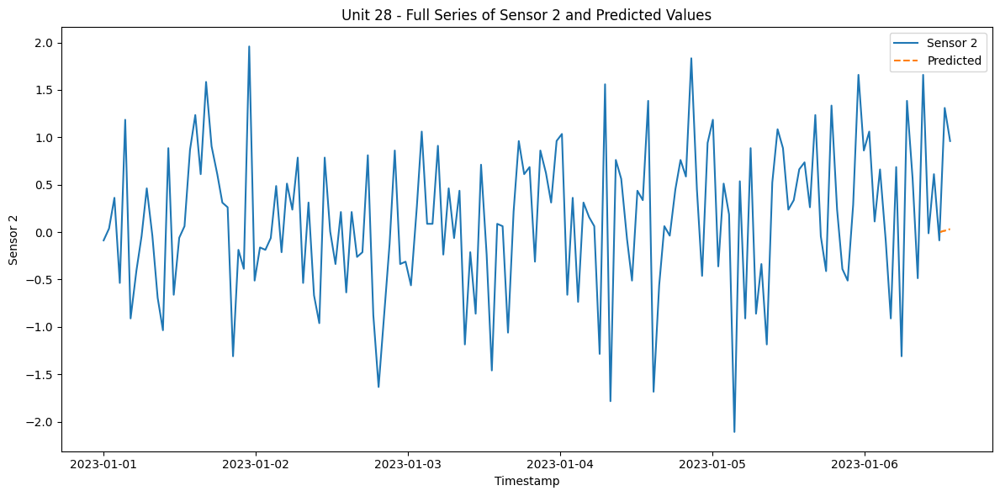

RMSE for Unit 28 - sensor_2: 0.9726223890945993
{'train': [0, 6937], 'valid': [6425, 7804], 'test': [7292, 8670]}
8071
Dataset for unit 29 is good


  0%|          | 0/86 [00:00<?, ?it/s]

96
[0.8491293061611344, 0.8510857665233063, 0.853042226885478, 0.8549986872476499, 0.8569551476098218, 0.8589116079719936, 0.8608680683341655, 0.8628245286963373, 0.8647809890585092, 0.866737449420681, 0.8686939097828529, 0.8706503701450248, 0.8726068305071966, 0.8745632908693685, 0.8765197512315402, 0.8784762115937121, 0.880432671955884, 0.8823891323180558, 0.8843455926802277, 0.8863020530423995, 0.8882585134045714, 0.8902149737667433, 0.8921714341289151, 0.894127894491087, 0.8960843548532588, 0.8980408152154307, 0.8999972755776025, 0.9019537359397743, 0.9039101963019462, 0.905866656664118, 0.9078231170262899, 0.9097795773884617, 0.9117360377506336, 0.9136924981128055, 0.9156489584749773, 0.9176054188371492, 0.919561879199321, 0.9215183395614929, 0.9234747999236648, 0.9254312602858366, 0.9273877206480085, 0.9293441810101802, 0.9313006413723521, 0.9332571017345239, 0.9352135620966958, 0.9195618791993488, 0.9039101963020018, 0.8882585134046548, 0.8726068305073078, 0.8569551476099608, 0.

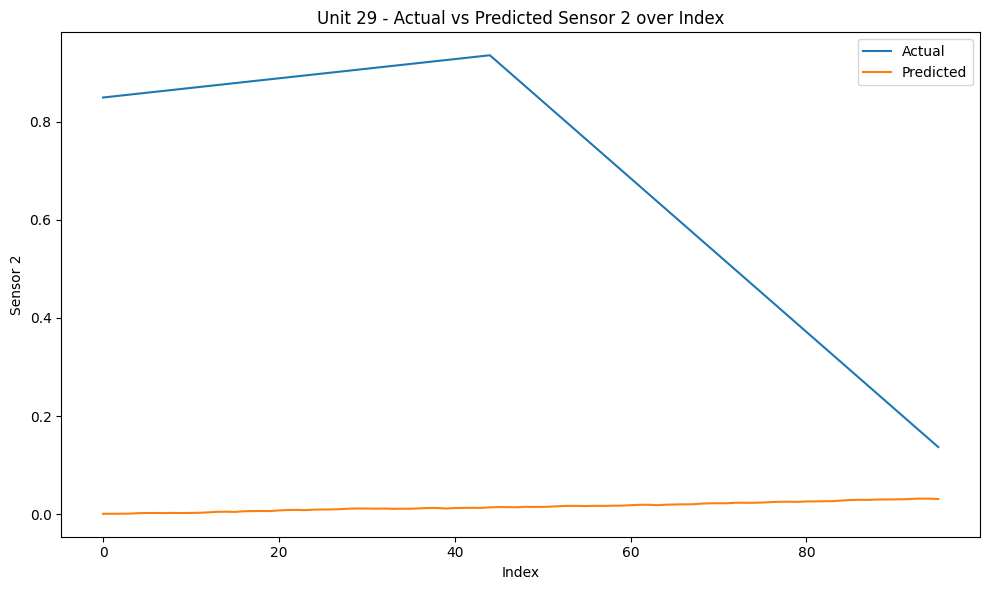

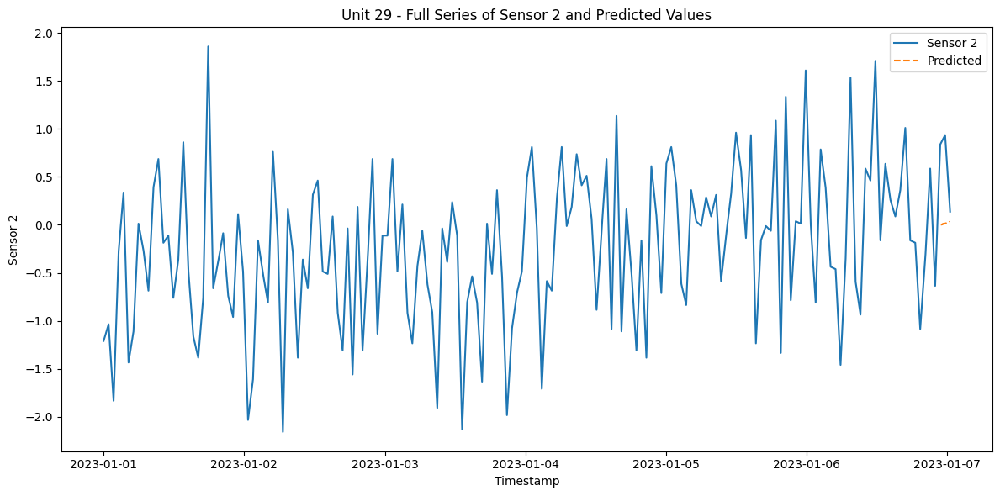

RMSE for Unit 29 - sensor_2: 0.7294971924890001
{'train': [0, 5794], 'valid': [5282, 6519], 'test': [6007, 7242]}
6643
Dataset for unit 30 is good


  0%|          | 0/68 [00:00<?, ?it/s]

96
[0.9004863906681273, 0.8848347077707803, 0.8691830248734334, 0.8535313419760863, 0.8378796590787393, 0.8222279761813922, 0.8065762932840452, 0.7909246103866983, 0.7752729274893513, 0.7596212445920043, 0.7439695616946572, 0.7283178787973102, 0.7126661958999632, 0.6970145130026162, 0.6813628301052692, 0.6657111472079222, 0.6500594643105753, 0.6344077814132282, 0.6187560985158812, 0.6031044156185341, 0.5874527327211871, 0.5718010498238402, 0.5561493669264932, 0.5404976840291462, 0.5248460011317992, 0.5091943182344522, 0.4935426353371052, 0.4778909524397581, 0.4622392695424111, 0.44658758664506415, 0.4309359037477172, 0.4152842208503701, 0.3996325379530231, 0.38398085505567614, 0.36832917215832905, 0.3526774892609821, 0.3370258063636351, 0.32137412346628813, 0.30572244056894105, 0.29007075767159407, 0.2744190747742471, 0.2587673918769, 0.24311570897955304, 0.22746402608220606, 0.2118123431848591, 0.21083411300377594, 0.2098558828226928, 0.20887765264160965, 0.2078994224605265, 0.2069211

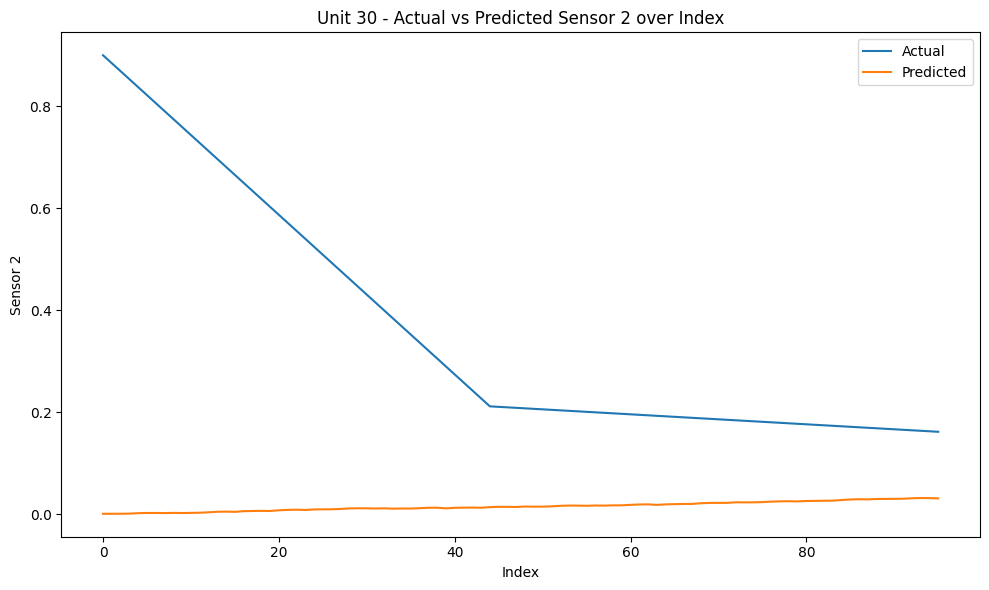

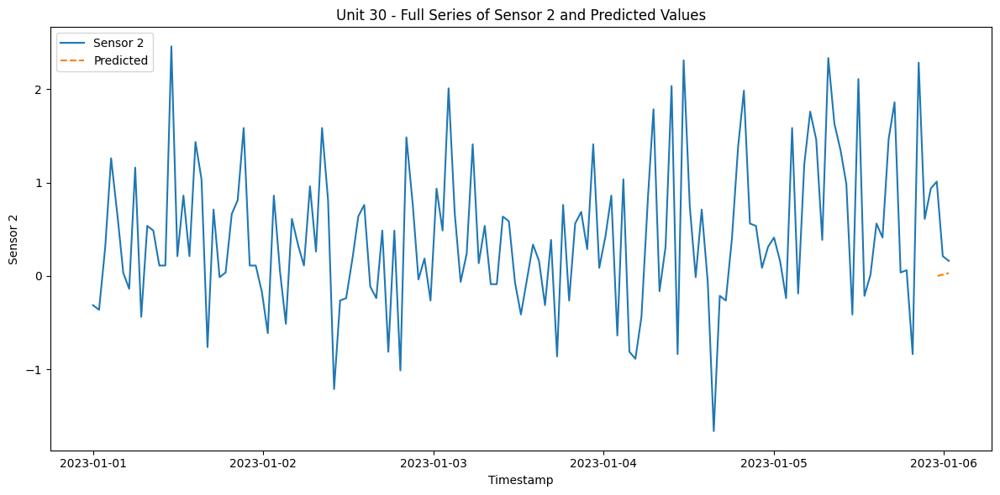

RMSE for Unit 30 - sensor_2: 0.41897143201271997
{'train': [0, 7957], 'valid': [7445, 8951], 'test': [8439, 9945]}
9346
Dataset for unit 31 is good


  0%|          | 0/102 [00:00<?, ?it/s]

96
[2.1501754470029297, 2.163381554447569, 2.176587661892208, 2.1897937693368474, 2.2029998767814867, 2.2162059842261255, 2.2294120916707647, 2.242618199115404, 2.255824306560043, 2.2690304140046824, 2.282236521449321, 2.2954426288939604, 2.3086487363385997, 2.321854843783239, 2.335060951227878, 2.348267058672517, 2.361473166117156, 2.3746792735617954, 2.3878853810064347, 2.4010914884510735, 2.4142975958957127, 2.427503703340352, 2.440709810784991, 2.4539159182296304, 2.467122025674269, 2.4803281331189084, 2.4935342405635477, 2.506740348008187, 2.5199464554528257, 2.533152562897465, 2.546358670342104, 2.5595647777867434, 2.5727708852313826, 2.585976992676022, 2.5991831001206607, 2.6123892075653, 2.625595315009939, 2.638801422454578, 2.652007529899217, 2.6652136373438564, 2.6784197447884956, 2.691625852233135, 2.704831959677774, 2.718038067122413, 2.731244174567052, 2.7185271822129544, 2.705810189858857, 2.6930931975047594, 2.6803762051506617, 2.6676592127965644, 2.6549422204424666, 2.6

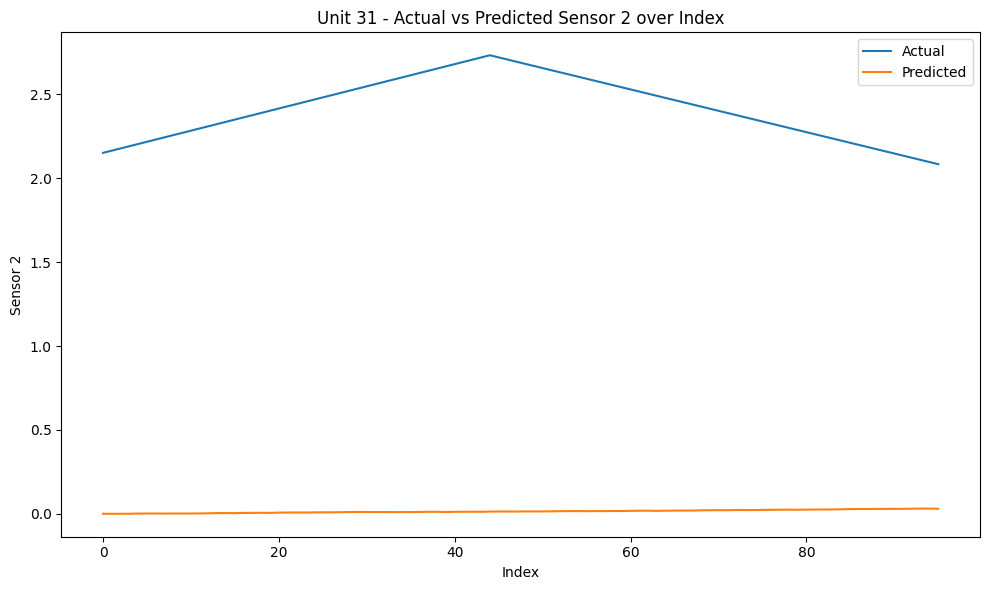

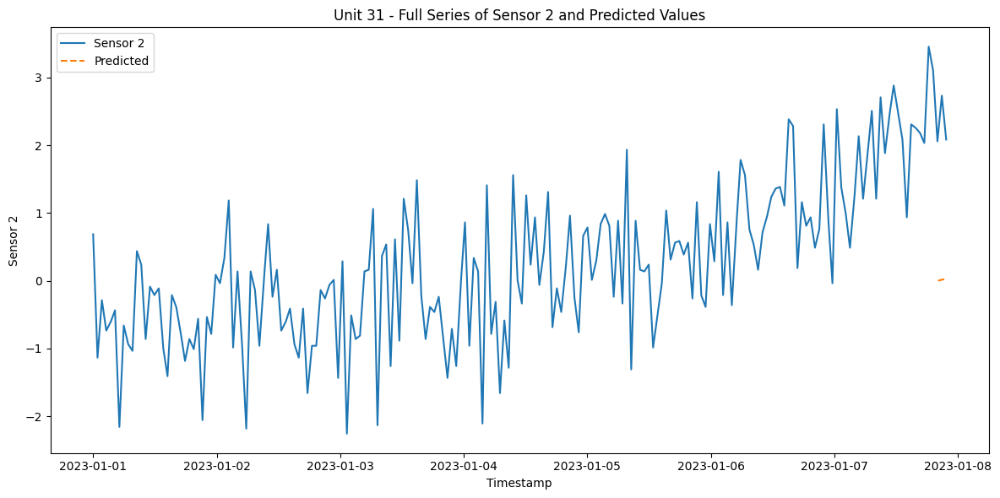

RMSE for Unit 31 - sensor_2: 2.410682479252443
{'train': [0, 5876], 'valid': [5364, 6610], 'test': [6098, 7344]}
6745
Dataset for unit 32 is good


  0%|          | 0/69 [00:00<?, ?it/s]

96
[0.029861529503316206, 0.018122767330307335, 0.006384005157298464, -0.005354757015710393, -0.017093519188719264, -0.028832281361728135, -0.040571043534737006, -0.05230980570774585, -0.06404856788075472, -0.07578733005376359, -0.08752609222677246, -0.09926485439978133, -0.11100361657279018, -0.12274237874579905, -0.13448114091880792, -0.1462199030918168, -0.15795866526482563, -0.16969742743783453, -0.18143618961084337, -0.19317495178385227, -0.20491371395686112, -0.21665247612986996, -0.22839123830287886, -0.2401300004758877, -0.25186876264889657, -0.2636075248219054, -0.27534628699491426, -0.2870850491679232, -0.29882381134093206, -0.3105625735139409, -0.32230133568694974, -0.3340400978599586, -0.34577886003296754, -0.3575176222059764, -0.3692563843789852, -0.38099514655199407, -0.392733908725003, -0.40447267089801187, -0.4162114330710207, -0.42795019524402955, -0.4396889574170385, -0.45142771959004735, -0.4631664817630562, -0.47490524393606504, -0.4866440061090738, -0.4533841799522

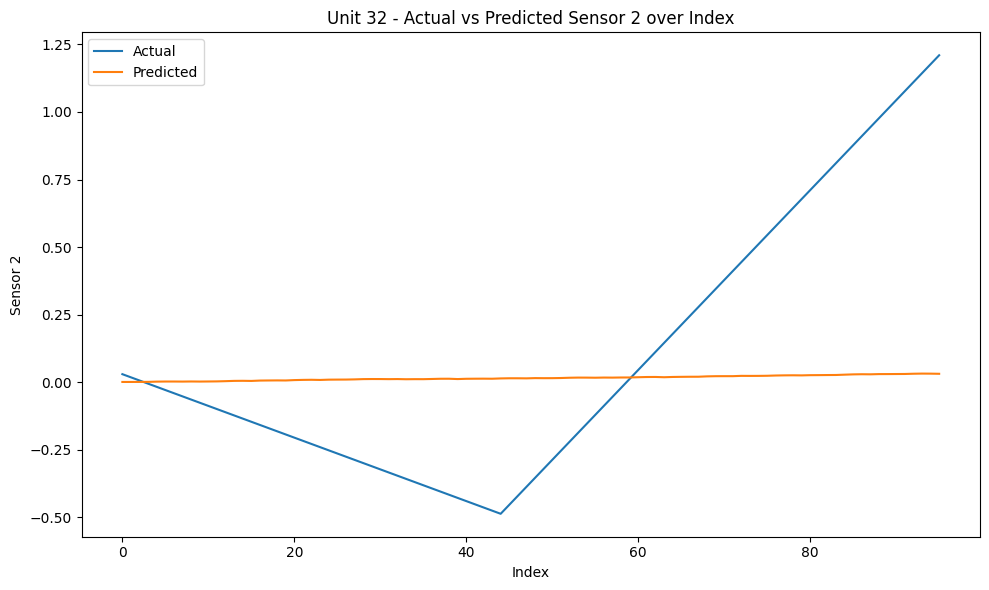

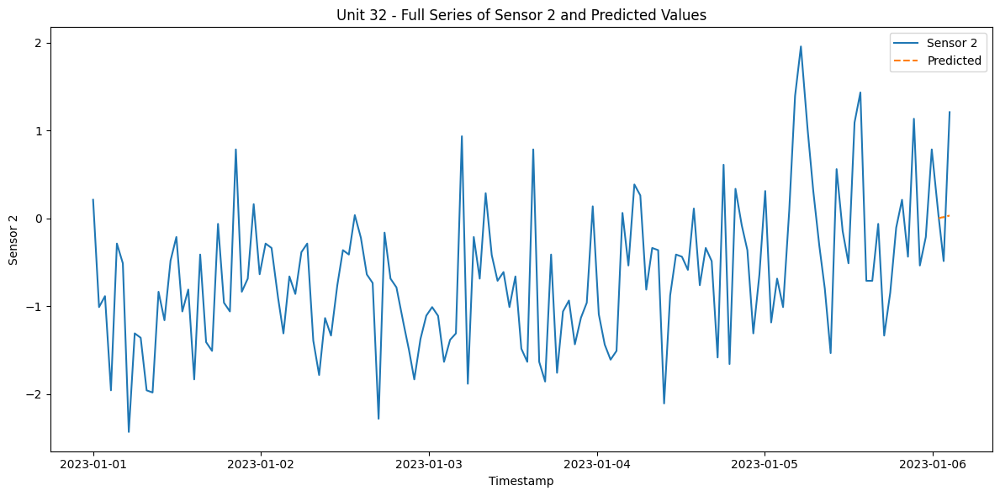

RMSE for Unit 32 - sensor_2: 0.4788402562819063
{'train': [0, 2000], 'valid': [1488, 2250], 'test': [1738, 2499]}
1900
Dataset for unit 33 is good


  0%|          | 0/9 [00:00<?, ?it/s]

96
[1.00564613513481, 0.9836359560604171, 0.9616257769860241, 0.9396155979116311, 0.917605418837238, 0.895595239762845, 0.8735850606884521, 0.851574881614059, 0.829564702539666, 0.807554523465273, 0.7855443443908801, 0.763534165316487, 0.7415239862420939, 0.719513807167701, 0.697503628093308, 0.675493449018915, 0.6534832699445219, 0.6314730908701289, 0.609462911795736, 0.5874527327213429, 0.5654425536469498, 0.5434323745725569, 0.5214221954981639, 0.49941201642377087, 0.4774018373493778, 0.45539165827498485, 0.4333814792005919, 0.4113713001261988, 0.38936112105180576, 0.3673509419774128, 0.34534076290301985, 0.3233305838286268, 0.3013204047542337, 0.27931022567984076, 0.2573000466054478, 0.23528986753105474, 0.21327968845666168, 0.19126950938226872, 0.16925933030787577, 0.1472491512334826, 0.12523897215908963, 0.10322879308469668, 0.08121861401030372, 0.05920843493591077, 0.037198255861517655, 0.03377445022772109, 0.030350644593924517, 0.02692683896012795, 0.023503033326331378, 0.02007

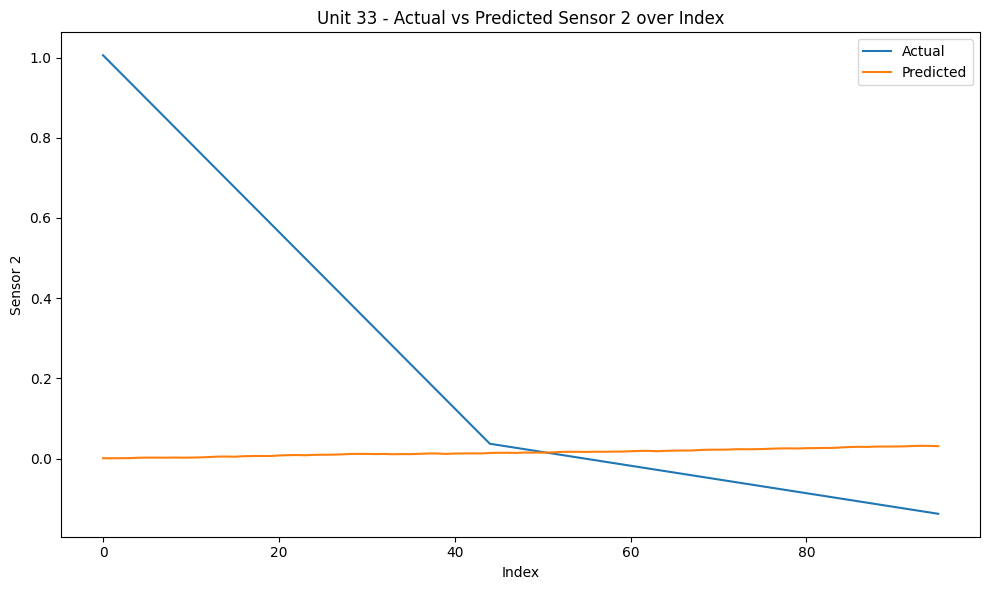

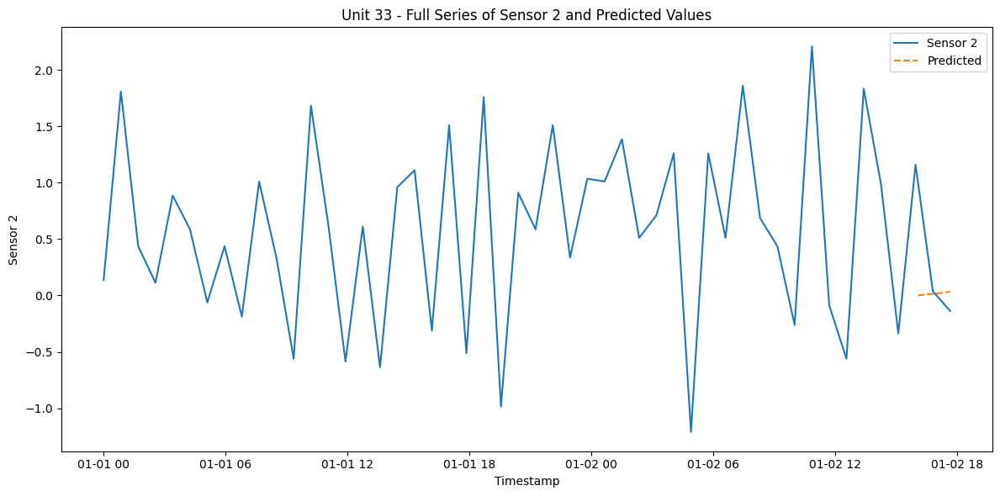

RMSE for Unit 33 - sensor_2: 0.40945175841439213
{'train': [0, 8242], 'valid': [7730, 9273], 'test': [8761, 10302]}
9703
Dataset for unit 34 is good


  0%|          | 0/106 [00:00<?, ?it/s]

96
[2.2793018309061495, 2.289573247807534, 2.299844664708918, 2.310116081610302, 2.3203874985116864, 2.3306589154130704, 2.3409303323144544, 2.351201749215839, 2.361473166117223, 2.371744583018607, 2.3820159999199912, 2.3922874168213752, 2.4025588337227592, 2.4128302506241437, 2.4231016675255277, 2.4333730844269117, 2.443644501328296, 2.45391591822968, 2.464187335131064, 2.4744587520324486, 2.4847301689338326, 2.4950015858352166, 2.505273002736601, 2.515544419637985, 2.525815836539369, 2.5360872534407535, 2.5463586703421375, 2.5566300872435215, 2.566901504144906, 2.57717292104629, 2.587444337947674, 2.5977157548490584, 2.6079871717504424, 2.6182585886518264, 2.628530005553211, 2.638801422454595, 2.649072839355979, 2.6593442562573633, 2.6696156731587473, 2.6798870900601313, 2.6901585069615157, 2.7004299238628997, 2.7107013407642837, 2.7209727576656677, 2.731244174567052, 2.7395591311062644, 2.7478740876454766, 2.7561890441846892, 2.7645040007239015, 2.7728189572631137, 2.781133913802326

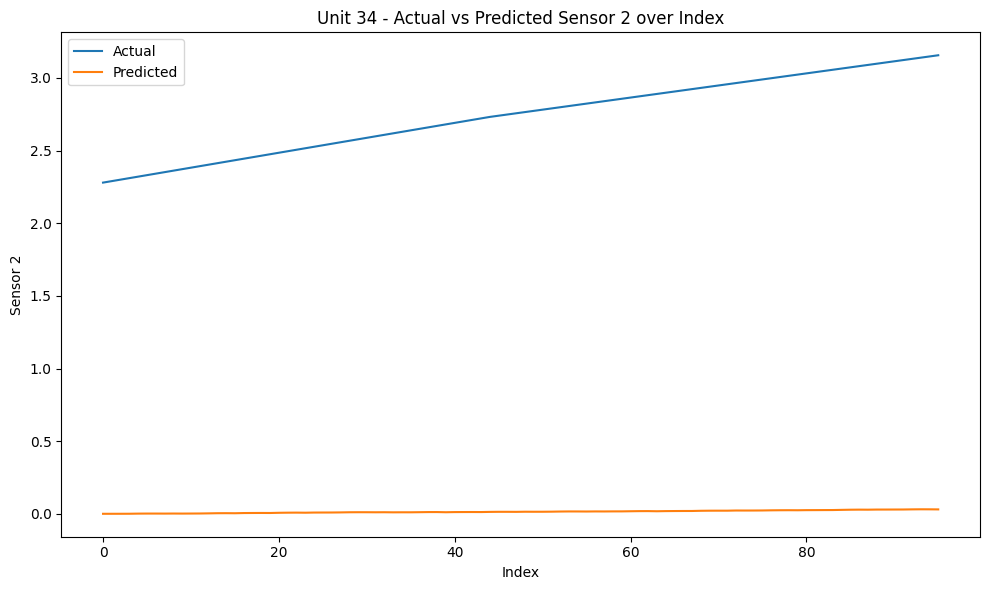

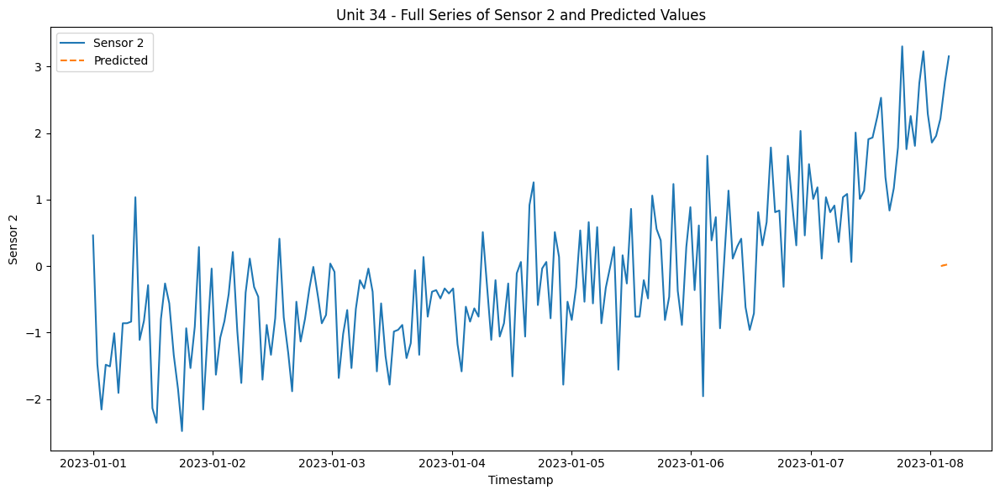

RMSE for Unit 34 - sensor_2: 2.735566304336454
{'train': [0, 8038], 'valid': [7526, 9043], 'test': [8531, 10047]}
9448
Dataset for unit 35 is good


  0%|          | 0/103 [00:00<?, ?it/s]

96
[2.346799713400809, 2.345332368129184, 2.3438650228575595, 2.3423976775859345, 2.34093033231431, 2.339462987042685, 2.3379956417710606, 2.3365282964994356, 2.335060951227811, 2.333593605956186, 2.3321262606845616, 2.330658915412937, 2.329191570141312, 2.3277242248696877, 2.3262568795980627, 2.324789534326438, 2.3233221890548132, 2.3218548437831887, 2.320387498511564, 2.3189201532399393, 2.3174528079683143, 2.31598546269669, 2.314518117425065, 2.3130507721534403, 2.3115834268818154, 2.310116081610191, 2.308648736338566, 2.3071813910669414, 2.305714045795317, 2.304246700523692, 2.3027793552520675, 2.3013120099804425, 2.299844664708818, 2.298377319437193, 2.2969099741655685, 2.2954426288939436, 2.293975283622319, 2.292507938350694, 2.2910405930790696, 2.2895732478074446, 2.28810590253582, 2.286638557264195, 2.2851712119925707, 2.2837038667209457, 2.282236521449321, 2.2827256365398627, 2.283214751630404, 2.2837038667209457, 2.2841929818114877, 2.284682096902029, 2.2851712119925707, 2.28

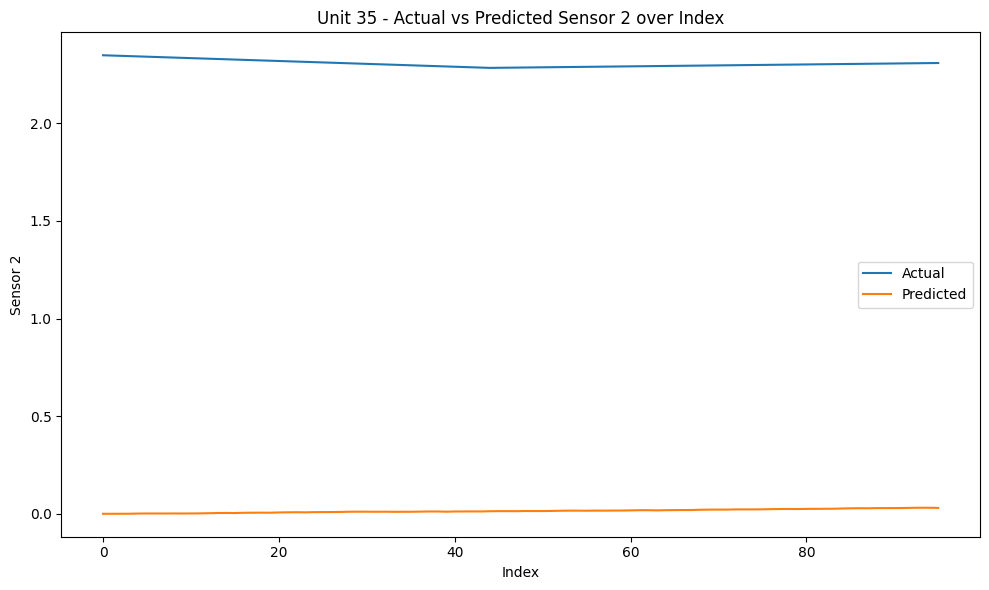

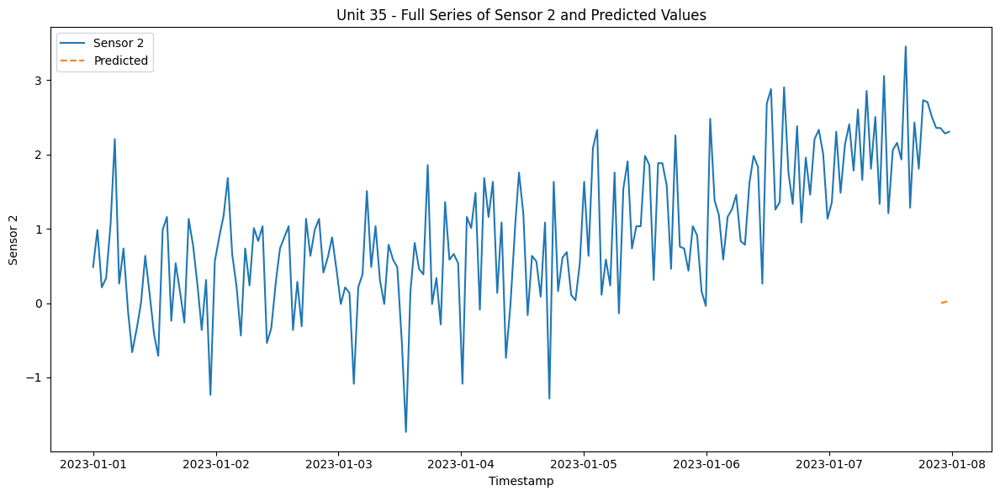

RMSE for Unit 35 - sensor_2: 2.288543907887777
{'train': [0, 5101], 'valid': [4589, 5738], 'test': [5226, 6375]}
5776
Dataset for unit 36 is good


  0%|          | 0/57 [00:00<?, ?it/s]

96
[1.585247517426924, 1.6175291134026957, 1.649810709378467, 1.6820923053542387, 1.7143739013300103, 1.746655497305782, 1.7789370932815536, 1.8112186892573252, 1.8435002852330968, 1.8757818812088685, 1.90806347718464, 1.9403450731604115, 1.9726266691361831, 2.004908265111955, 2.037189861087726, 2.0694714570634978, 2.1017530530392694, 2.134034649015041, 2.1663162449908127, 2.1985978409665843, 2.230879436942356, 2.2631610329181275, 2.295442628893899, 2.327724224869671, 2.3600058208454424, 2.3922874168212136, 2.4245690127969857, 2.456850608772757, 2.489132204748529, 2.5214138007243, 2.5536953967000717, 2.5859769926758434, 2.618258588651615, 2.6505401846273866, 2.6828217806031582, 2.71510337657893, 2.747384972554701, 2.779666568530473, 2.8119481645062443, 2.8442297604820164, 2.8765113564577875, 2.908792952433559, 2.941074548409331, 2.9733561443851024, 3.005637740360874, 2.96944322366077, 2.933248706960666, 2.8970541902605618, 2.8608596735604572, 2.824665156860353, 2.788470640160249, 2.752

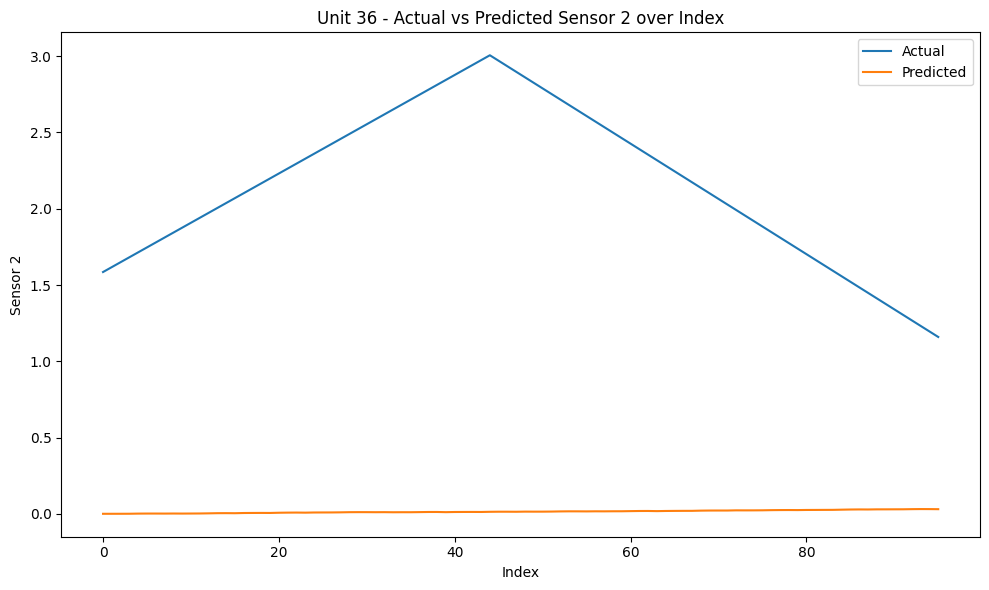

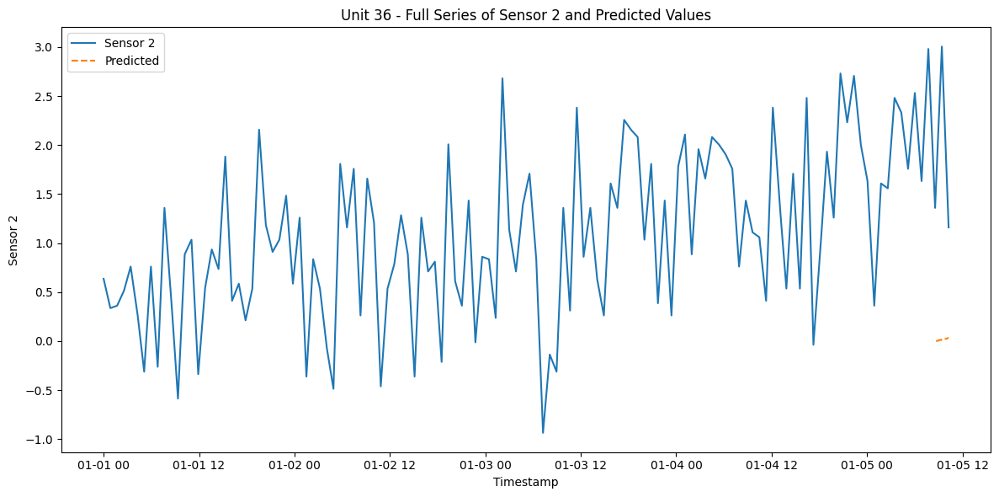

RMSE for Unit 36 - sensor_2: 2.2142216216536594
{'train': [0, 4897], 'valid': [4385, 5509], 'test': [4997, 6120]}
5521
Dataset for unit 37 is good


  0%|          | 0/54 [00:00<?, ?it/s]

96
[1.3274838647113207, 1.3265056345302375, 1.3255274043491543, 1.3245491741680713, 1.323570943986988, 1.3225927138059048, 1.3216144836248218, 1.3206362534437386, 1.3196580232626556, 1.3186797930815723, 1.3177015629004891, 1.3167233327194061, 1.3157451025383229, 1.3147668723572397, 1.3137886421761567, 1.3128104119950734, 1.3118321818139904, 1.3108539516329072, 1.309875721451824, 1.308897491270741, 1.3079192610896577, 1.3069410309085745, 1.3059628007274915, 1.3049845705464083, 1.3040063403653253, 1.303028110184242, 1.3020498800031588, 1.3010716498220758, 1.3000934196409926, 1.2991151894599093, 1.2981369592788263, 1.297158729097743, 1.29618049891666, 1.2952022687355769, 1.2942240385544936, 1.2932458083734106, 1.2922675781923274, 1.2912893480112442, 1.2903111178301612, 1.289332887649078, 1.2883546574679947, 1.2873764272869117, 1.2863981971058285, 1.2854199669247455, 1.2844417367436622, 1.301560764912634, 1.3186797930816057, 1.3357988212505774, 1.352917849419549, 1.3700368775885208, 1.3871

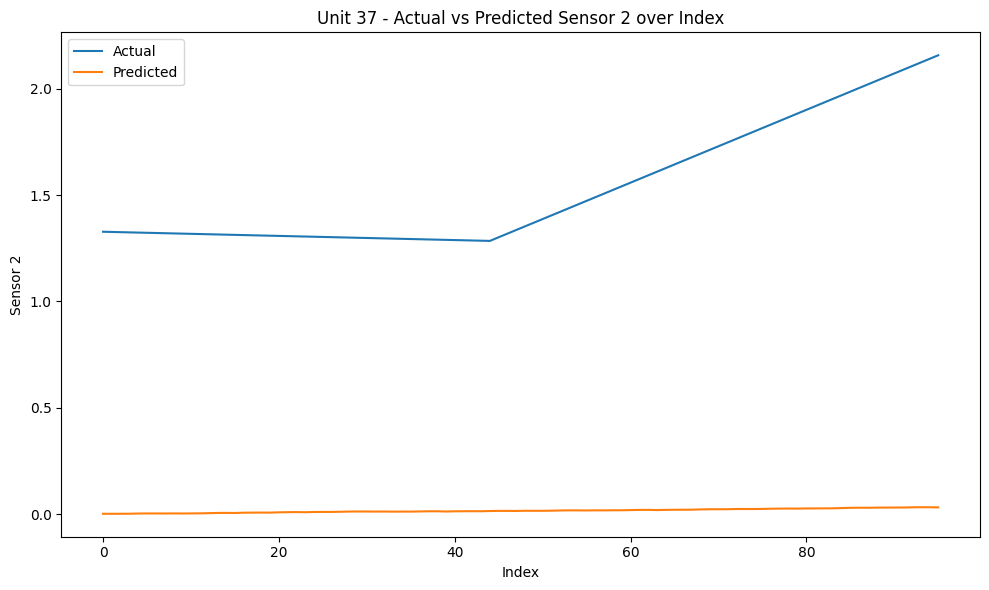

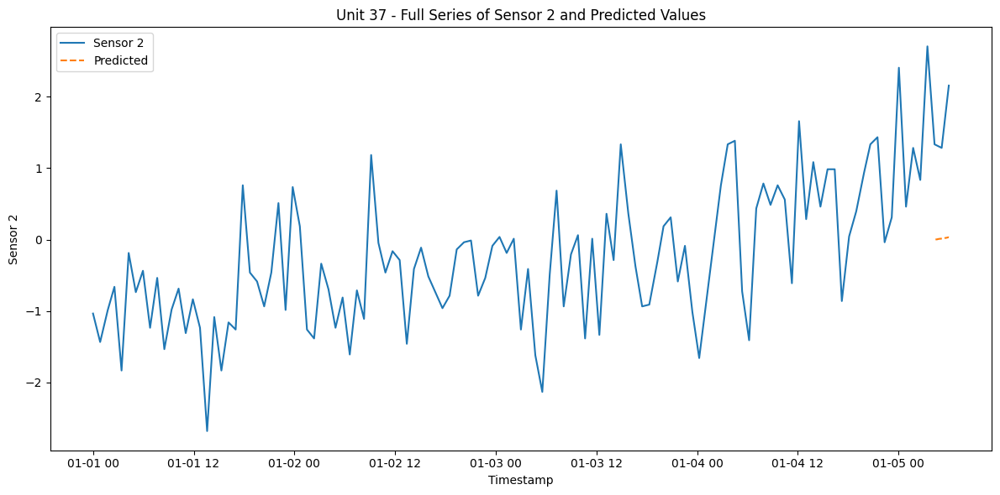

RMSE for Unit 37 - sensor_2: 1.5395212306745152
{'train': [0, 5060], 'valid': [4548, 5692], 'test': [5180, 6324]}
5725
Dataset for unit 38 is good


  0%|          | 0/57 [00:00<?, ?it/s]

96
[0.7733164671273463, 0.8036416027409516, 0.8339667383545569, 0.8642918739681622, 0.8946170095817676, 0.9249421451953728, 0.9552672808089782, 0.9855924164225834, 1.0159175520361887, 1.0462426876497941, 1.0765678232633995, 1.1068929588770047, 1.1372180944906098, 1.1675432301042152, 1.1978683657178206, 1.2281935013314258, 1.2585186369450312, 1.2888437725586366, 1.3191689081722417, 1.3494940437858471, 1.3798191793994525, 1.4101443150130577, 1.4404694506266629, 1.4707945862402685, 1.5011197218538737, 1.5314448574674788, 1.5617699930810842, 1.5920951286946896, 1.6224202643082948, 1.6527453999219002, 1.6830705355355056, 1.7133956711491107, 1.7437208067627161, 1.7740459423763213, 1.8043710779899267, 1.834696213603532, 1.8650213492171372, 1.8953464848307426, 1.9256716204443478, 1.9559967560579532, 1.9863218916715586, 2.0166470272851638, 2.0469721628987694, 2.0772972985123745, 2.1076224341259797, 2.093927211590799, 2.0802319890556182, 2.0665367665204375, 2.0528415439852568, 2.039146321450076,

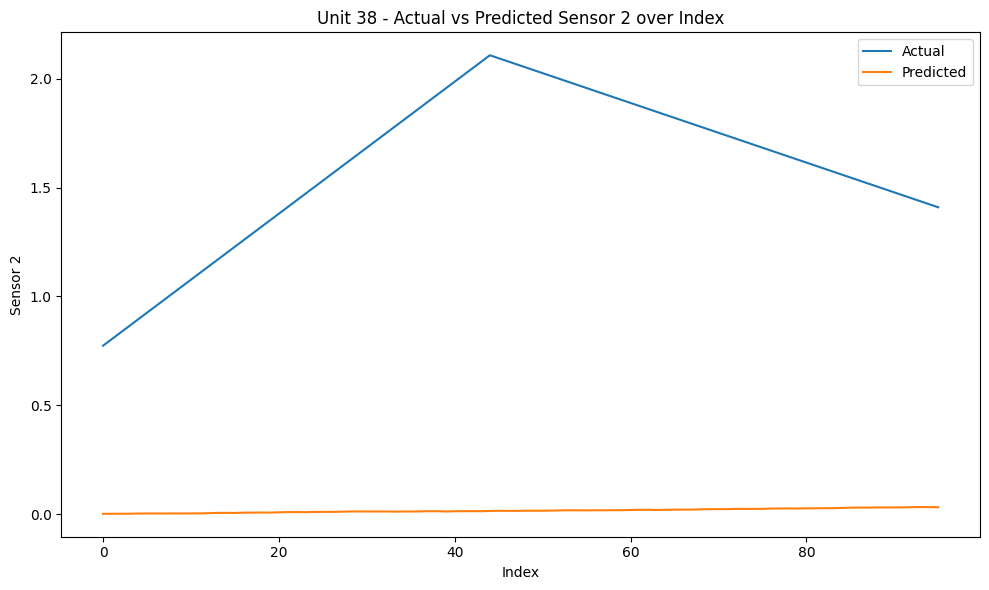

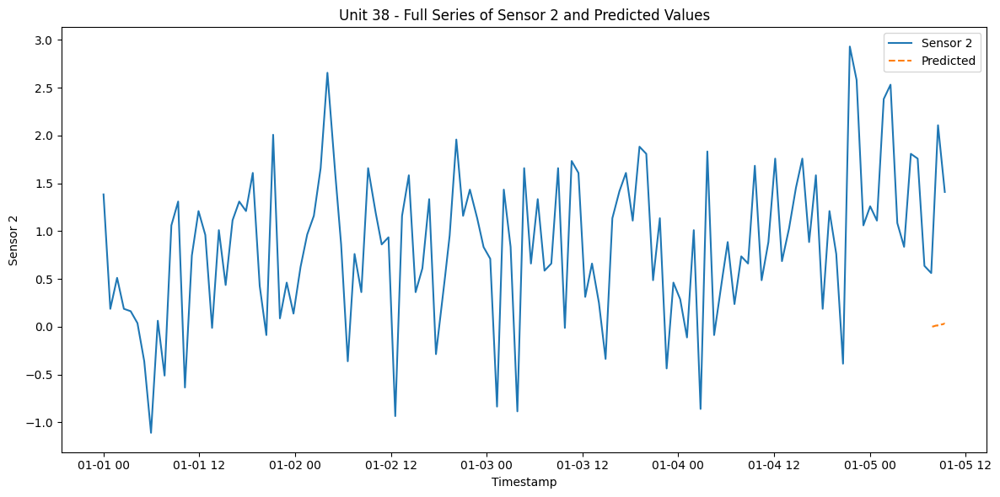

RMSE for Unit 38 - sensor_2: 1.6260465694807862
{'train': [0, 1470], 'valid': [958, 1653], 'test': [1141, 1836]}
1237
Dataset for unit 39 is good


  0%|          | 0/1 [00:00<?, ?it/s]

96
[-1.8483404181779464, -1.8468730729063216, -1.8454057276346971, -1.8439383823630724, -1.8424710370914477, -1.841003691819823, -1.8395363465481982, -1.8380690012765735, -1.8366016560049487, -1.835134310733324, -1.8336669654616993, -1.8321996201900745, -1.8307322749184498, -1.829264929646825, -1.8277975843752003, -1.8263302391035756, -1.8248628938319509, -1.8233955485603262, -1.8219282032887014, -1.820460858017077, -1.8189935127454522, -1.8175261674738274, -1.8160588222022027, -1.814591476930578, -1.8131241316589533, -1.8116567863873285, -1.8101894411157038, -1.808722095844079, -1.8072547505724543, -1.8057874053008296, -1.8043200600292049, -1.8028527147575801, -1.8013853694859554, -1.7999180242143307, -1.798450678942706, -1.7969833336710812, -1.7955159883994565, -1.794048643127832, -1.7925812978562072, -1.7911139525845825, -1.7896466073129578, -1.788179262041333, -1.7867119167697083, -1.7852445714980836, -1.7837772262264588, -1.7676364282385704, -1.7514956302506817, -1.735354832262793

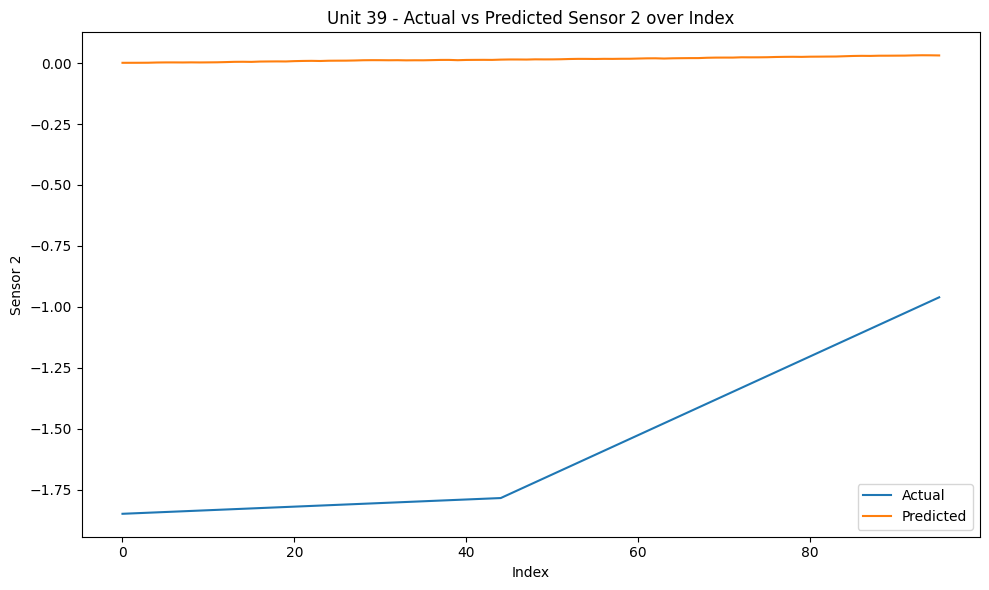

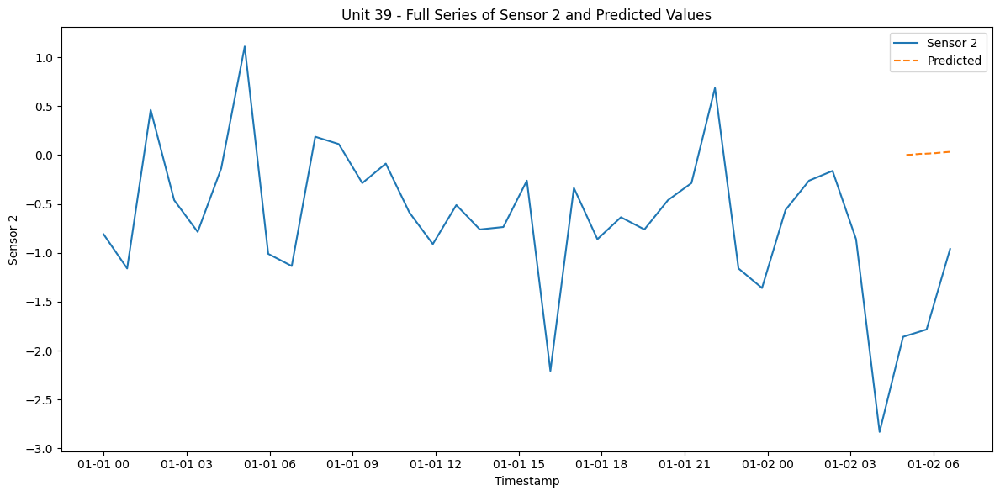

RMSE for Unit 39 - sensor_2: 1.6154617144054515
{'train': [0, 5386], 'valid': [4874, 6060], 'test': [5548, 6732]}
6133
Dataset for unit 40 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[1.8180663005250073, 1.8087731138047063, 1.7994799270844053, 1.7901867403641043, 1.7808935536438033, 1.7716003669235023, 1.7623071802032013, 1.7530139934829003, 1.7437208067625993, 1.7344276200422983, 1.7251344333219973, 1.7158412466016963, 1.7065480598813951, 1.6972548731610941, 1.6879616864407931, 1.6786684997204921, 1.6693753130001912, 1.6600821262798902, 1.6507889395595892, 1.6414957528392882, 1.6322025661189872, 1.6229093793986862, 1.6136161926783852, 1.6043230059580842, 1.5950298192377832, 1.5857366325174822, 1.5764434457971812, 1.5671502590768802, 1.5578570723565792, 1.5485638856362782, 1.5392706989159772, 1.5299775121956762, 1.5206843254753752, 1.5113911387550742, 1.5020979520347733, 1.4928047653144723, 1.4835115785941713, 1.4742183918738703, 1.4649252051535693, 1.4556320184332683, 1.4463388317129673, 1.4370456449926663, 1.4277524582723653, 1.4184592715520643, 1.4091660848317633, 1.4169919262804396, 1.4248177677291158, 1.432643609177792, 1.4404694506264684, 1.448295292075144

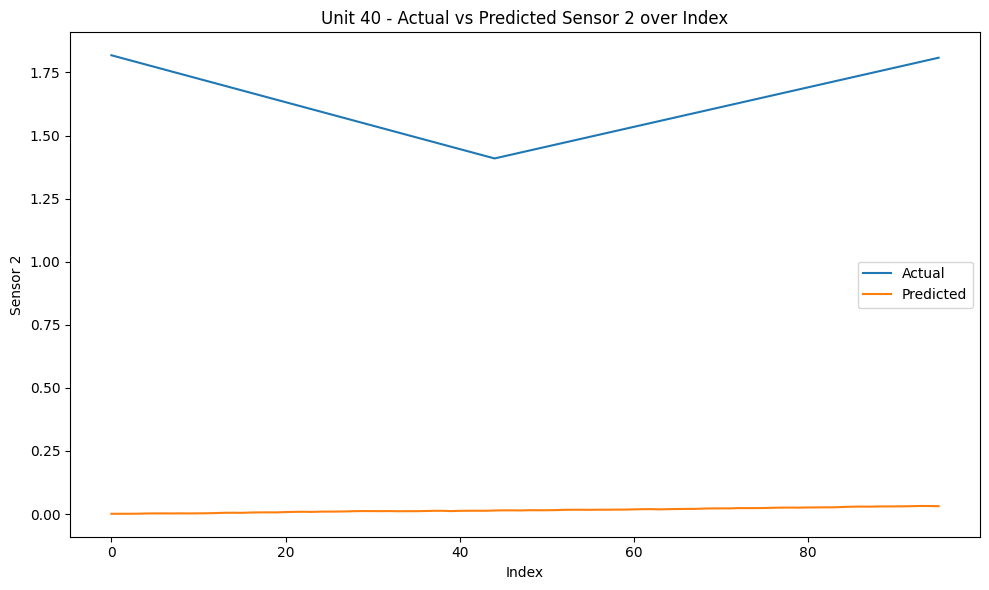

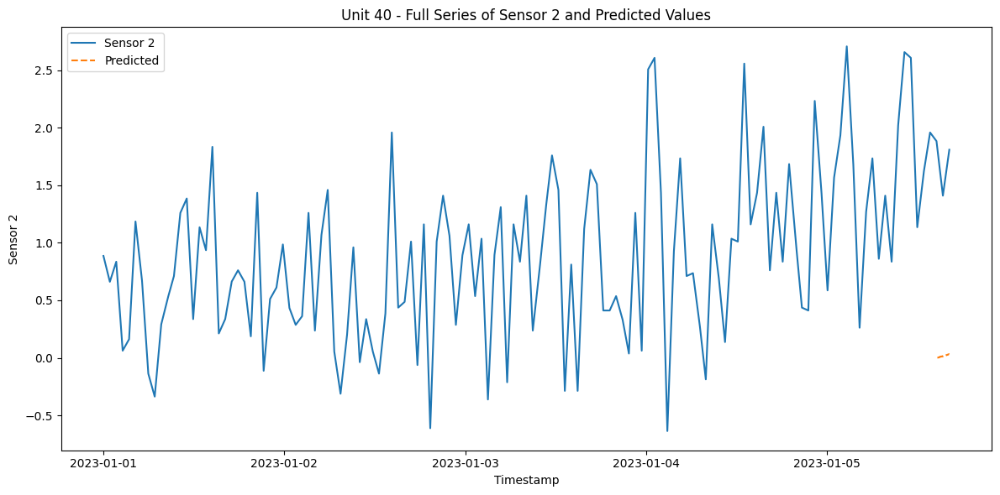

RMSE for Unit 40 - sensor_2: 1.6016976087904309
{'train': [0, 4978], 'valid': [4466, 5601], 'test': [5089, 6222]}
5623
Dataset for unit 41 is good


  0%|          | 0/55 [00:00<?, ?it/s]

96
[1.4443823713507955, 1.4458497166224258, 1.447317061894056, 1.4487844071656863, 1.4502517524373166, 1.451719097708947, 1.4531864429805772, 1.4546537882522075, 1.4561211335238378, 1.457588478795468, 1.4590558240670983, 1.4605231693387286, 1.461990514610359, 1.4634578598819892, 1.4649252051536195, 1.4663925504252497, 1.46785989569688, 1.4693272409685103, 1.4707945862401406, 1.4722619315117709, 1.473729276783401, 1.4751966220550312, 1.4766639673266615, 1.4781313125982918, 1.479598657869922, 1.4810660031415523, 1.4825333484131826, 1.484000693684813, 1.4854680389564432, 1.4869353842280735, 1.4884027294997038, 1.489870074771334, 1.4913374200429643, 1.4928047653145946, 1.4942721105862249, 1.4957394558578552, 1.4972068011294855, 1.4986741464011157, 1.500141491672746, 1.5016088369443763, 1.5030761822160066, 1.5045435274876369, 1.5060108727592671, 1.5074782180308974, 1.5089455633025277, 1.482533348413255, 1.4561211335239823, 1.4297089186347096, 1.4032967037454367, 1.376884488856164, 1.3504722

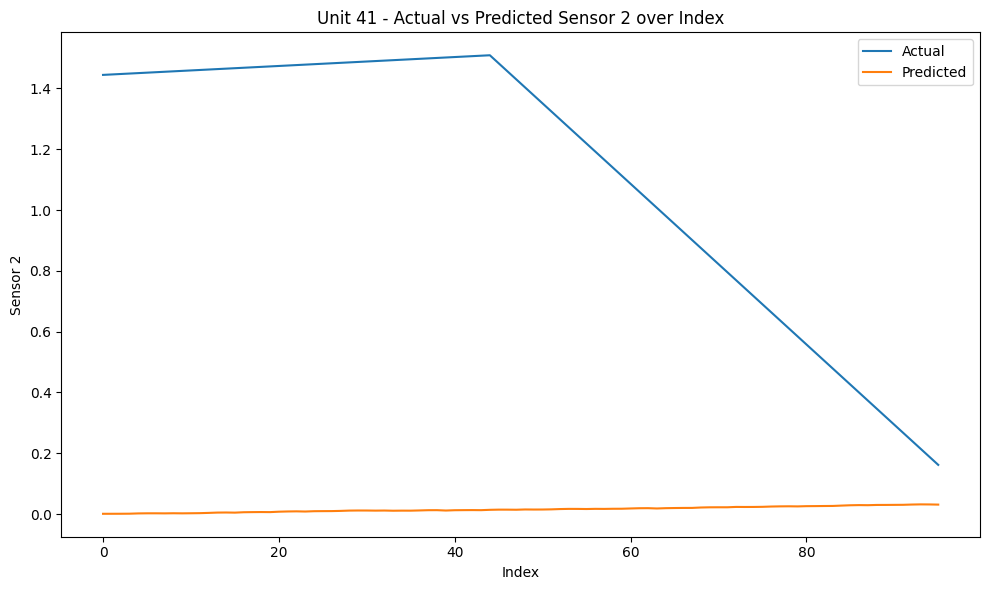

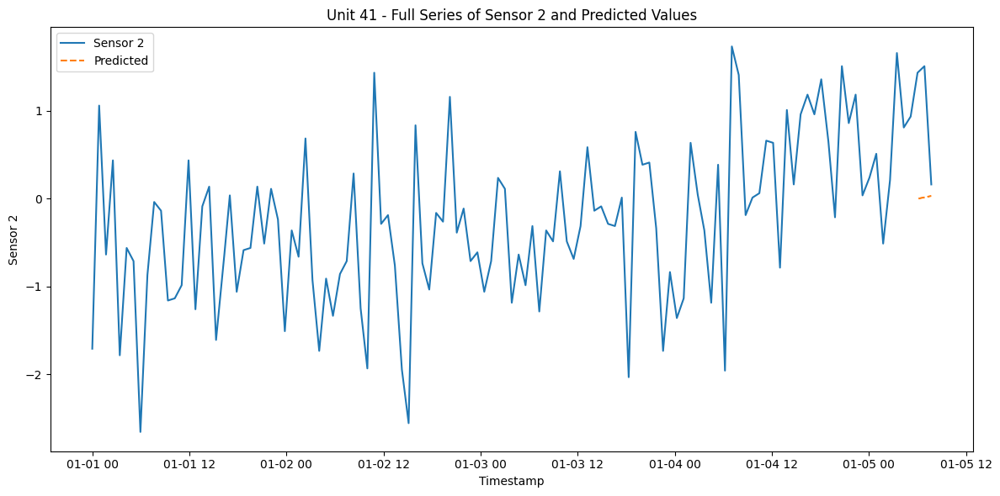

RMSE for Unit 41 - sensor_2: 1.1973411481625522
{'train': [0, 6325], 'valid': [5813, 7115], 'test': [6603, 7905]}
7306
Dataset for unit 42 is good


  0%|          | 0/76 [00:00<?, ?it/s]

96
[1.8263812570643196, 1.8752927661185215, 1.924204275172723, 1.973115784226925, 2.0220272932811265, 2.0709388023353283, 2.11985031138953, 2.168761820443732, 2.2176733294979334, 2.266584838552135, 2.315496347606337, 2.364407856660539, 2.4133193657147407, 2.4622308747689425, 2.511142383823144, 2.5600538928773457, 2.6089654019315476, 2.657876910985749, 2.706788420039951, 2.7556999290941526, 2.8046114381483545, 2.8535229472025563, 2.902434456256758, 2.95134596531096, 3.0002574743651613, 3.049168983419363, 3.098080492473565, 3.1469920015277664, 3.195903510581968, 3.24481501963617, 3.293726528690372, 3.3426380377445737, 3.3915495467987755, 3.4404610558529773, 3.489372564907179, 3.53828407396138, 3.587195583015582, 3.6361070920697838, 3.6850186011239856, 3.7339301101781874, 3.7828416192323893, 3.831753128286591, 3.880664637340793, 3.9295761463949948, 3.9784876554491966, 3.941314908567998, 3.9041421616867997, 3.866969414805601, 3.829796667924403, 3.7926239210432042, 3.755451174162006, 3.7182

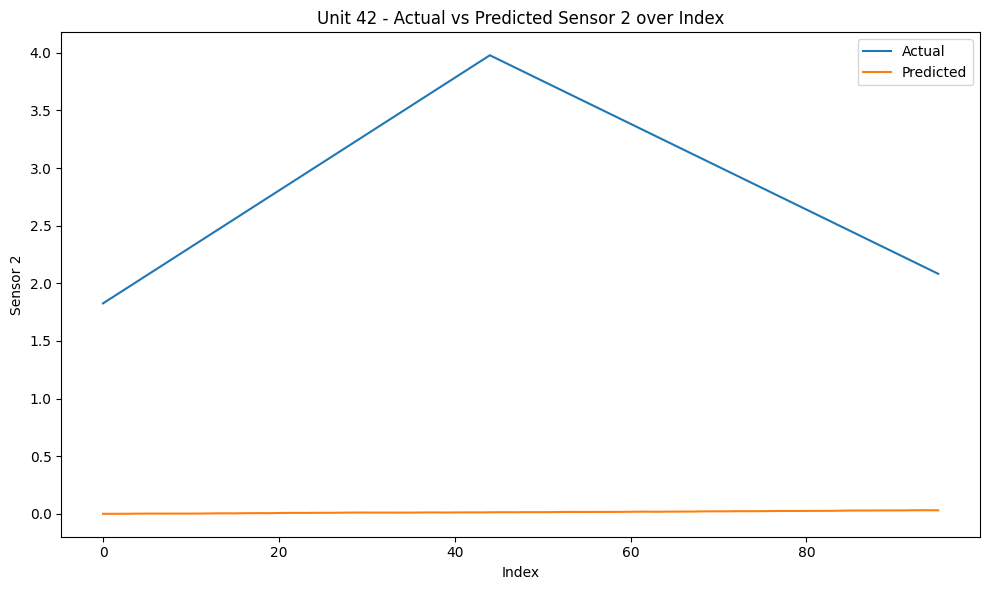

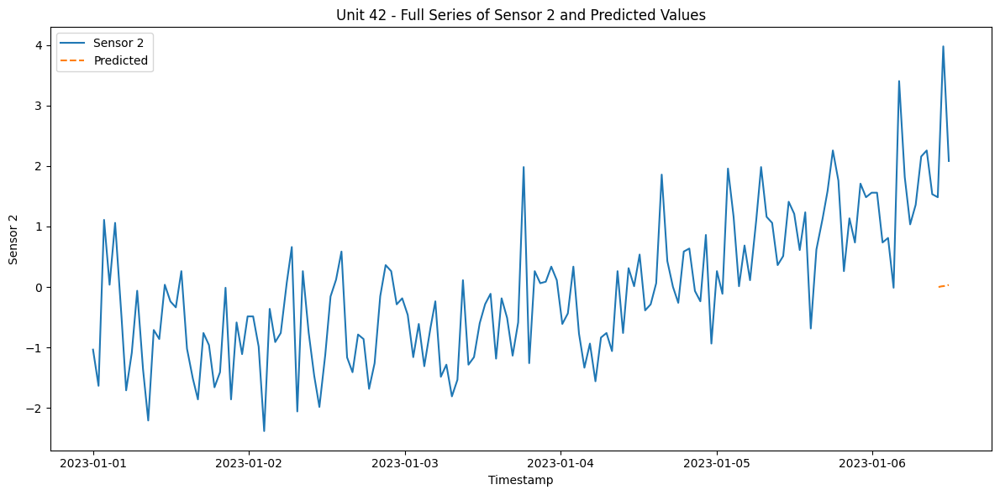

RMSE for Unit 42 - sensor_2: 3.003972772959255
{'train': [0, 6978], 'valid': [6466, 7850], 'test': [7338, 8721]}
8122
Dataset for unit 43 is good


  0%|          | 0/87 [00:00<?, ?it/s]

96
[1.4575884787955848, 1.45025175243745, 1.4429150260793153, 1.4355782997211806, 1.4282415733630458, 1.4209048470049113, 1.4135681206467765, 1.4062313942886417, 1.398894667930507, 1.3915579415723722, 1.3842212152142377, 1.376884488856103, 1.3695477624979682, 1.3622110361398334, 1.3548743097816986, 1.3475375834235641, 1.3402008570654294, 1.3328641307072946, 1.3255274043491598, 1.3181906779910253, 1.3108539516328905, 1.3035172252747558, 1.296180498916621, 1.2888437725584865, 1.2815070462003517, 1.274170319842217, 1.2668335934840822, 1.2594968671259474, 1.252160140767813, 1.2448234144096781, 1.2374866880515434, 1.2301499616934086, 1.2228132353352739, 1.2154765089771393, 1.2081397826190046, 1.2008030562608698, 1.193466329902735, 1.1861296035446003, 1.1787928771864657, 1.171456150828331, 1.1641194244701962, 1.1567826981120615, 1.1494459717539267, 1.1421092453957922, 1.1347725190376574, 1.1269466775889867, 1.119120836140316, 1.1112949946916453, 1.1034691532429746, 1.0956433117943039, 1.0878

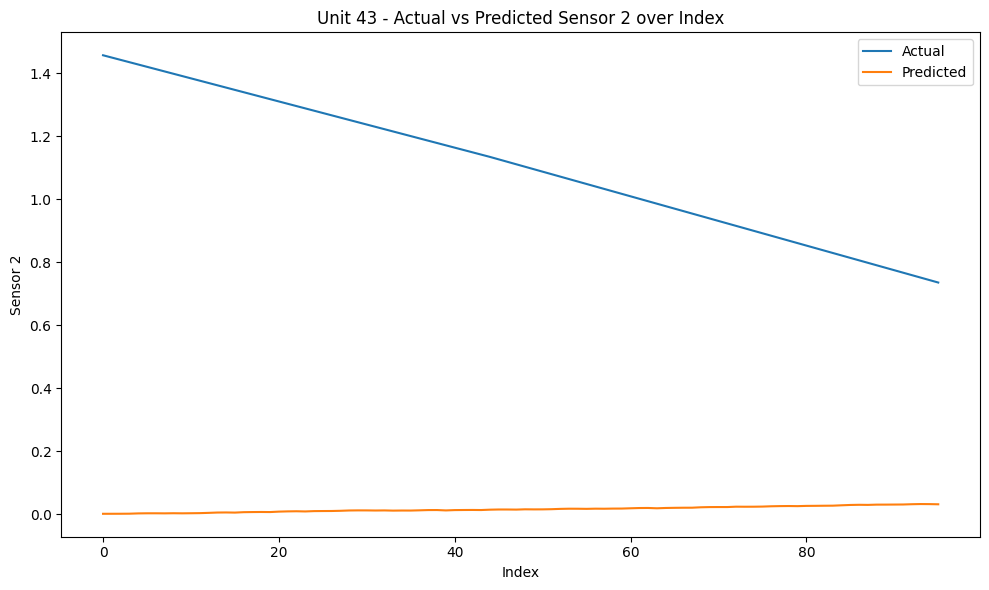

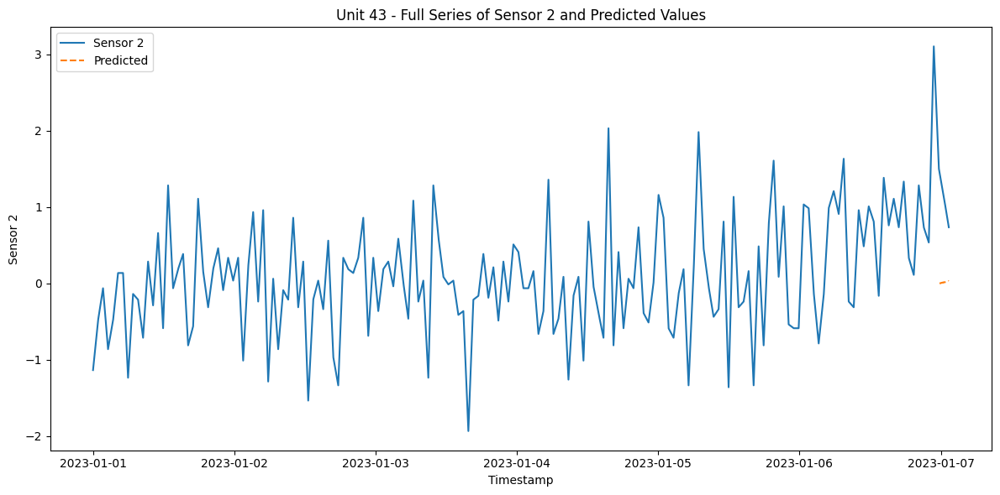

RMSE for Unit 43 - sensor_2: 1.1086217399897824
{'train': [0, 2163], 'valid': [1651, 2434], 'test': [1922, 2703]}
2104
Dataset for unit 44 is good


  0%|          | 0/11 [00:00<?, ?it/s]

96
[-0.14573078800110834, -0.1540457445403262, -0.16236070107954403, -0.1706756576187619, -0.17899061415797976, -0.1873055706971976, -0.1956205272364155, -0.2039354837756333, -0.21225044031485119, -0.22056539685406903, -0.22888035339328688, -0.23719530993250473, -0.2455102664717226, -0.25382522301094046, -0.26214017955015834, -0.27045513608937616, -0.278770092628594, -0.28708504916781186, -0.29540000570702973, -0.3037149622462476, -0.31202991878546543, -0.32034487532468325, -0.32865983186390113, -0.336974788403119, -0.34528974494233683, -0.3536047014815547, -0.3619196580207726, -0.3702346145599904, -0.3785495710992083, -0.3868645276384261, -0.395179484177644, -0.40349444071686186, -0.4118093972560797, -0.42012435379529756, -0.4284393103345154, -0.43675426687373325, -0.44506922341295113, -0.45338417995216895, -0.46169913649138683, -0.47001409303060465, -0.47832904956982253, -0.48664400610904035, -0.4949589626482582, -0.5032739191874761, -0.511588875726694, -0.5008283437347683, -0.490067

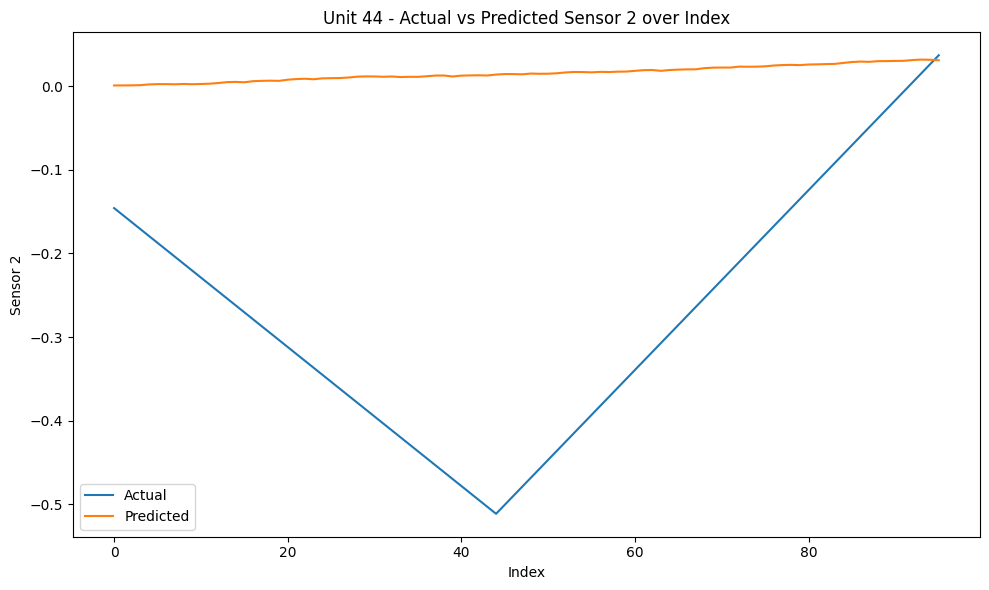

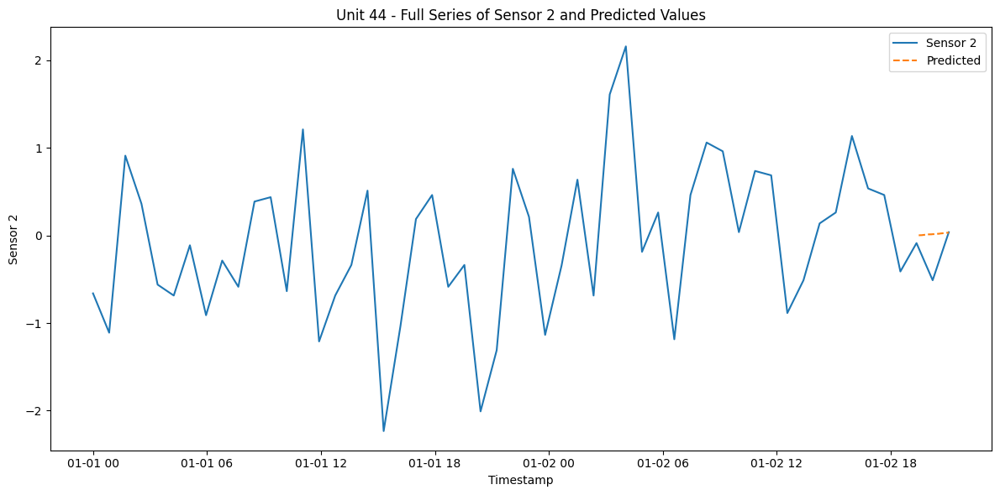

RMSE for Unit 44 - sensor_2: 0.32525226466830215
{'train': [0, 6162], 'valid': [5650, 6932], 'test': [6420, 7701]}
7102
Dataset for unit 45 is good


  0%|          | 0/74 [00:00<?, ?it/s]

96
[0.7229376128014864, 0.742502216423166, 0.7620668200448456, 0.7816314236665252, 0.8011960272882048, 0.8207606309098844, 0.8403252345315639, 0.8598898381532436, 0.879454441774923, 0.8990190453966027, 0.9185836490182824, 0.9381482526399618, 0.9577128562616415, 0.977277459883321, 0.9968420635050006, 1.0164066671266803, 1.0359712707483597, 1.0555358743700394, 1.075100477991719, 1.0946650816133987, 1.1142296852350781, 1.1337942888567578, 1.1533588924784373, 1.172923496100117, 1.1924880997217966, 1.2120527033434763, 1.2316173069651557, 1.2511819105868354, 1.2707465142085148, 1.2903111178301945, 1.3098757214518741, 1.3294403250735538, 1.3490049286952333, 1.3685695323169127, 1.3881341359385924, 1.407698739560272, 1.4272633431819517, 1.4468279468036314, 1.4663925504253108, 1.4859571540469902, 1.50552175766867, 1.5250863612903496, 1.5446509649120292, 1.564215568533709, 1.5837801721553884, 1.5661720288958751, 1.5485638856363617, 1.5309557423768485, 1.513347599117335, 1.4957394558578219, 1.4781

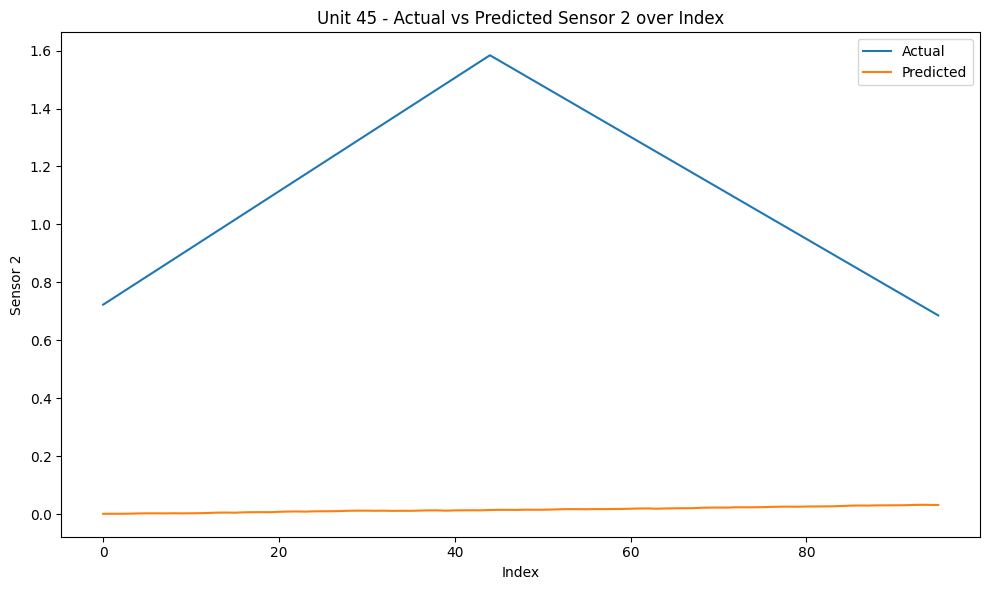

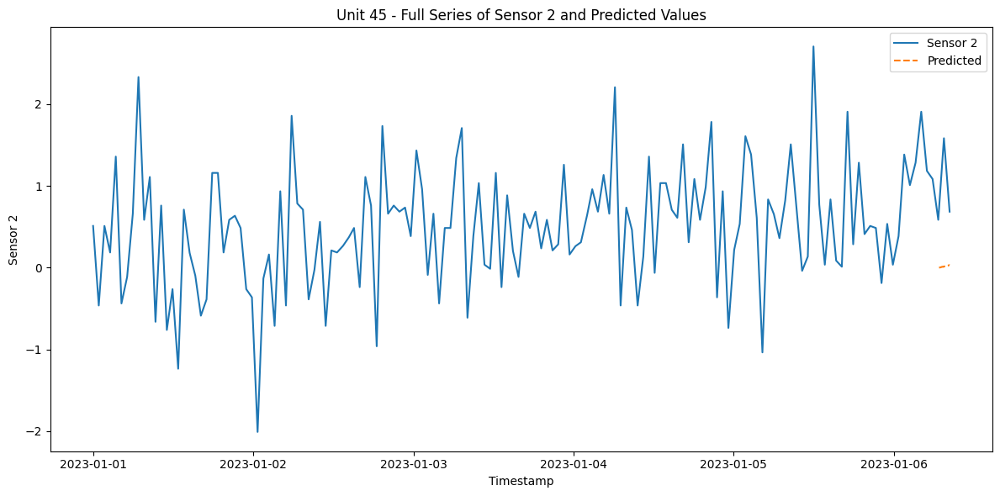

RMSE for Unit 45 - sensor_2: 1.1525250921253143
{'train': [0, 5917], 'valid': [5405, 6656], 'test': [6144, 7395]}
6796
Dataset for unit 46 is good


  0%|          | 0/70 [00:00<?, ?it/s]

96
[2.17512031662055, 2.1883264240651887, 2.201532531509828, 2.214738638954467, 2.2279447463991064, 2.2411508538437457, 2.2543569612883845, 2.2675630687330237, 2.280769176177663, 2.293975283622302, 2.3071813910669414, 2.3203874985115807, 2.3335936059562195, 2.3467997134008587, 2.360005820845498, 2.373211928290137, 2.386418035734776, 2.399624143179415, 2.4128302506240544, 2.4260363580686937, 2.439242465513333, 2.452448572957972, 2.465654680402611, 2.47886078784725, 2.4920668952918894, 2.5052730027365286, 2.5184791101811674, 2.5316852176258067, 2.544891325070446, 2.558097432515085, 2.5713035399597244, 2.5845096474043636, 2.597715754849003, 2.6109218622936416, 2.624127969738281, 2.63733407718292, 2.650540184627559, 2.663746292072198, 2.6769523995168374, 2.6901585069614766, 2.703364614406116, 2.716570721850755, 2.7297768292953943, 2.742982936740033, 2.7561890441846724, 2.717548952031849, 2.678908859879026, 2.640268767726203, 2.6016286755733797, 2.5629885834205566, 2.5243484912677334, 2.485

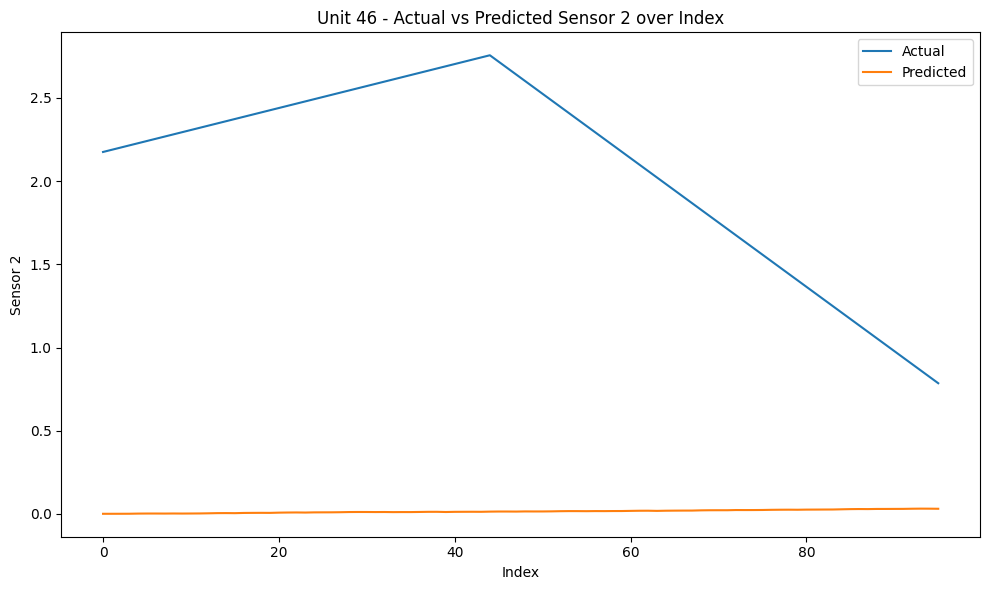

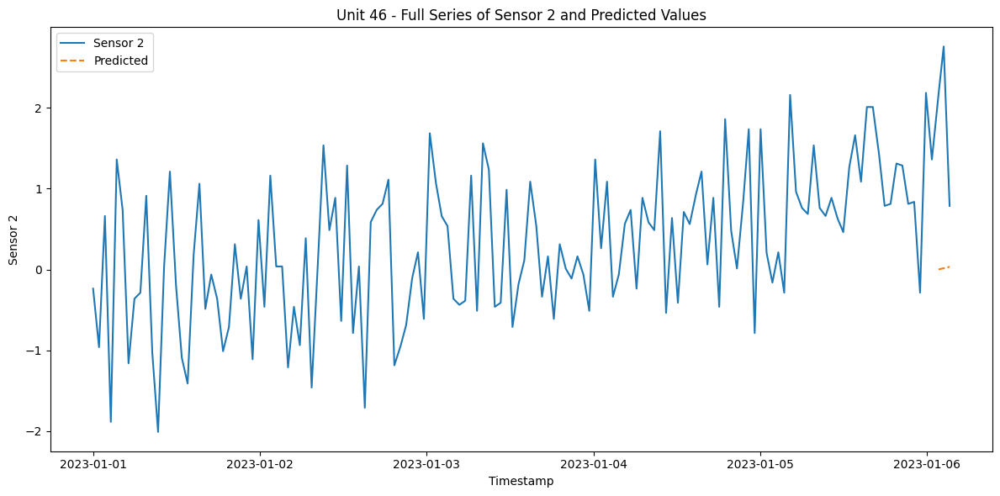

RMSE for Unit 46 - sensor_2: 2.1466095551942415
{'train': [0, 2938], 'valid': [2426, 3306], 'test': [2794, 3672]}
3073
Dataset for unit 47 is good


  0%|          | 0/23 [00:00<?, ?it/s]

96
[1.022765163303676, 1.028145429299639, 1.0335256952956018, 1.0389059612915648, 1.0442862272875275, 1.0496664932834905, 1.0550467592794532, 1.0604270252754162, 1.065807291271379, 1.071187557267342, 1.0765678232633047, 1.0819480892592677, 1.0873283552552304, 1.0927086212511934, 1.0980888872471561, 1.1034691532431191, 1.1088494192390819, 1.1142296852350448, 1.1196099512310076, 1.1249902172269706, 1.1303704832229333, 1.1357507492188963, 1.141131015214859, 1.146511281210822, 1.1518915472067848, 1.1572718132027477, 1.1626520791987105, 1.1680323451946735, 1.1734126111906362, 1.1787928771865992, 1.184173143182562, 1.189553409178525, 1.1949336751744877, 1.2003139411704504, 1.2056942071664134, 1.2110744731623764, 1.2164547391583391, 1.2218350051543019, 1.2272152711502649, 1.2325955371462278, 1.2379758031421906, 1.2433560691381533, 1.2487363351341163, 1.2541166011300793, 1.259496867126042, 1.2472689898624916, 1.2350411125989411, 1.2228132353353907, 1.2105853580718402, 1.1983574808082897, 1.186

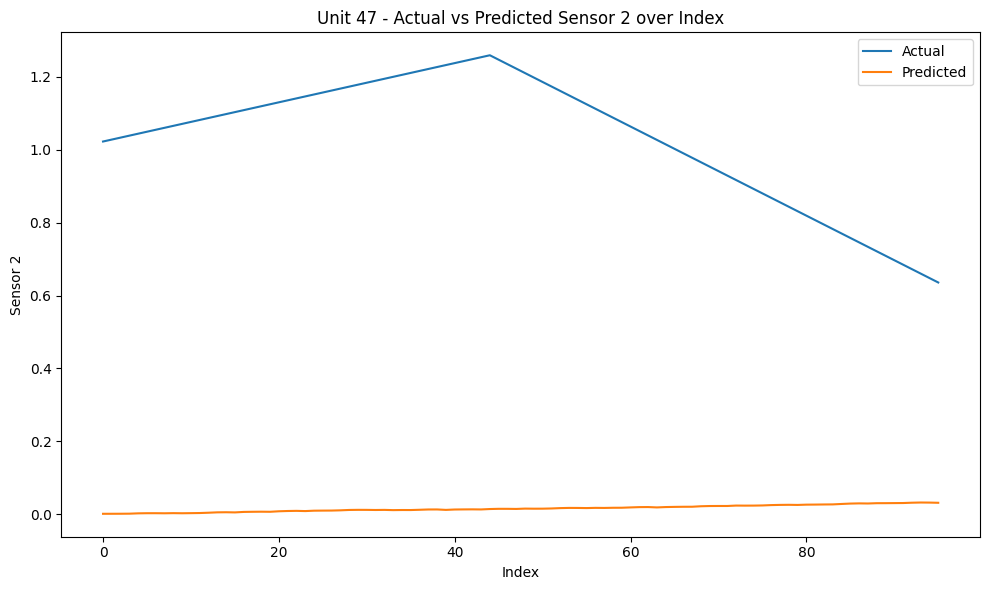

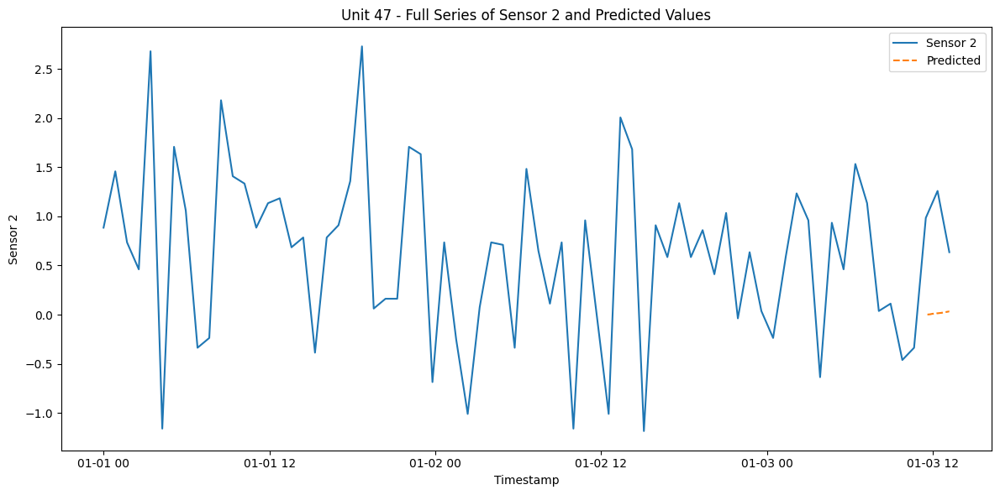

RMSE for Unit 47 - sensor_2: 1.0348656534419598
{'train': [0, 3142], 'valid': [2630, 3535], 'test': [3023, 3927]}
3328
Dataset for unit 48 is good


  0%|          | 0/27 [00:00<?, ?it/s]

96
[0.2910489878528385, 0.28811429730958354, 0.28517960676632853, 0.2822449162230735, 0.27931022567981856, 0.27637553513656354, 0.27344084459330853, 0.2705061540500535, 0.26757146350679856, 0.26463677296354354, 0.2617020824202886, 0.25876739187703357, 0.25583270133377856, 0.25289801079052354, 0.24996332024726858, 0.24702862970401357, 0.24409393916075856, 0.2411592486175036, 0.23822455807424858, 0.23528986753099357, 0.2323551769877386, 0.2294204864444836, 0.22648579590122858, 0.2235511053579736, 0.2206164148147186, 0.2176817242714636, 0.2147470337282086, 0.21181234318495362, 0.2088776526416986, 0.20594296209844362, 0.20300827155518864, 0.20007358101193362, 0.19713889046867863, 0.19420419992542365, 0.19126950938216863, 0.18833481883891365, 0.18540012829565866, 0.18246543775240365, 0.17953074720914866, 0.17659605666589365, 0.17366136612263866, 0.17072667557938367, 0.16779198503612866, 0.16485729449287367, 0.1619226039496187, 0.17317225103208597, 0.18442189811455328, 0.19567154519702057, 0

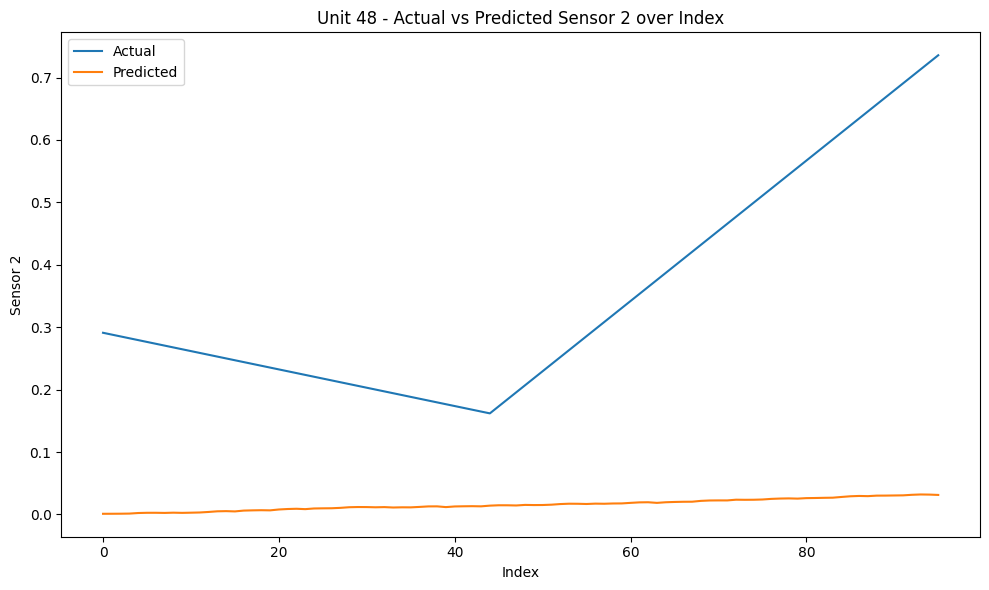

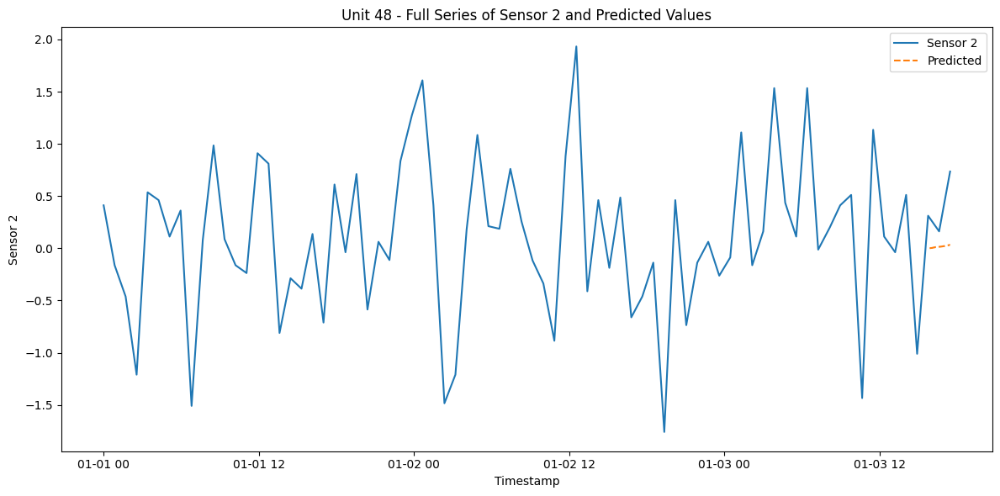

RMSE for Unit 48 - sensor_2: 0.3686604139100535
{'train': [0, 12322], 'valid': [11810, 13863], 'test': [13351, 15402]}
14803
Dataset for unit 49 is good


  0%|          | 0/170 [00:00<?, ?it/s]

96
[2.0636020759771214, 2.0430592421743587, 2.022516408371596, 2.0019735745688334, 1.9814307407660705, 1.9608879069633078, 1.940345073160545, 1.9198022393577823, 1.8992594055550196, 1.878716571752257, 1.858173737949494, 1.8376309041467314, 1.8170880703439687, 1.7965452365412058, 1.7760024027384431, 1.7554595689356804, 1.7349167351329178, 1.7143739013301549, 1.6938310675273922, 1.6732882337246293, 1.6527453999218666, 1.632202566119104, 1.6116597323163413, 1.5911168985135786, 1.570574064710816, 1.550031230908053, 1.5294883971052902, 1.5089455633025275, 1.4884027294997648, 1.4678598956970021, 1.4473170618942395, 1.4267742280914768, 1.406231394288714, 1.3856885604859512, 1.3651457266831883, 1.3446028928804257, 1.324060059077663, 1.3035172252749003, 1.2829743914721377, 1.2624315576693748, 1.241888723866612, 1.2213458900638492, 1.2008030562610865, 1.1802602224583238, 1.1597173886555612, 1.1729234961001949, 1.1861296035448283, 1.199335710989462, 1.2125418184340955, 1.2257479258787292, 1.23895

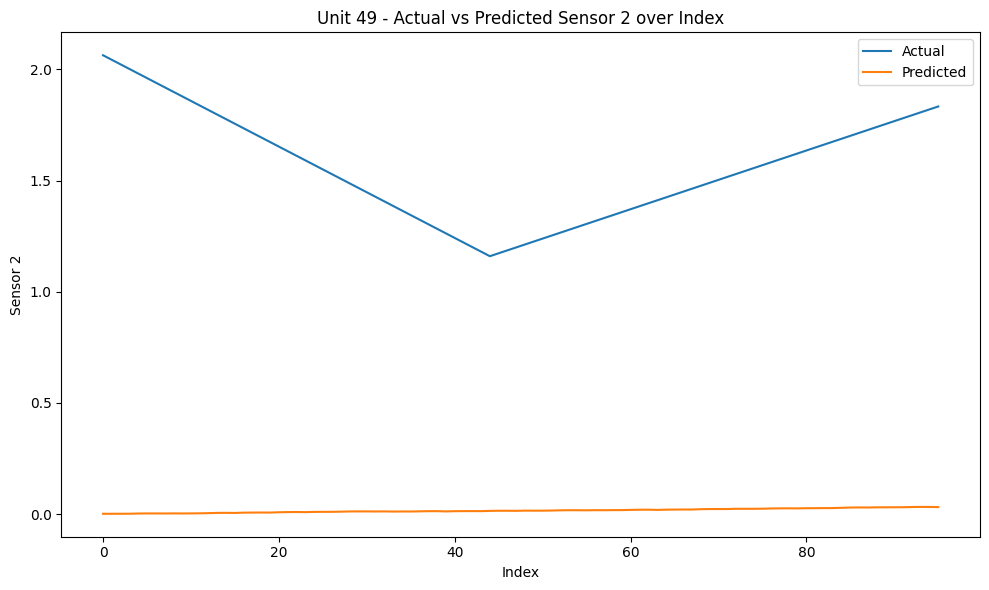

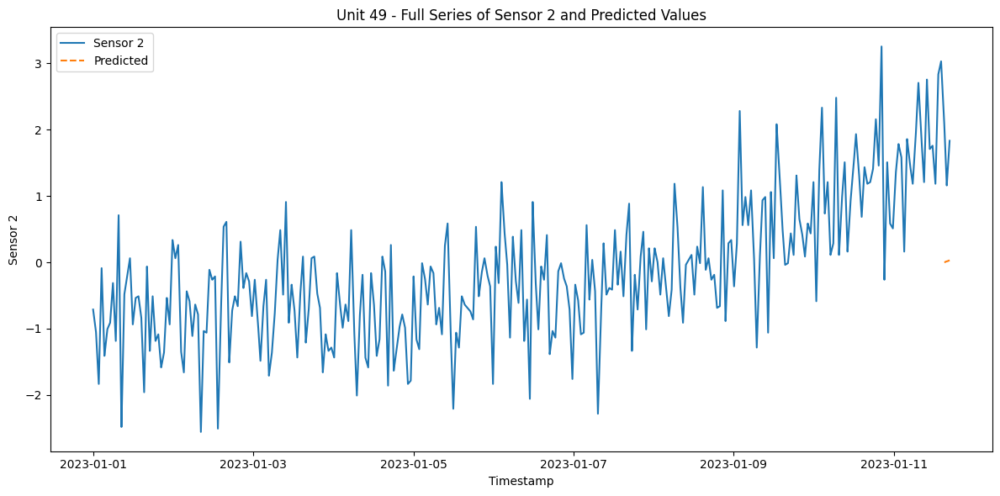

RMSE for Unit 49 - sensor_2: 1.5567407562893867
{'train': [0, 2979], 'valid': [2467, 3352], 'test': [2840, 3723]}
3124
Dataset for unit 50 is good


  0%|          | 0/24 [00:00<?, ?it/s]

96
[0.24115924861759808, 0.2382245580743431, 0.2352898675310881, 0.2323551769878331, 0.2294204864445781, 0.22648579590132312, 0.2235511053580681, 0.22061641481481312, 0.21768172427155813, 0.21474703372830312, 0.21181234318504813, 0.20887765264179314, 0.20594296209853813, 0.20300827155528314, 0.20007358101202816, 0.19713889046877314, 0.19420419992551813, 0.19126950938226317, 0.18833481883900816, 0.18540012829575314, 0.18246543775249818, 0.17953074720924317, 0.17659605666598815, 0.17366136612273317, 0.17072667557947818, 0.16779198503622317, 0.16485729449296818, 0.1619226039497132, 0.15898791340645818, 0.1560532228632032, 0.1531185323199482, 0.1501838417766932, 0.1472491512334382, 0.14431446069018322, 0.1413797701469282, 0.13844507960367322, 0.13551038906041823, 0.13257569851716322, 0.12964100797390823, 0.12670631743065322, 0.12377162688739823, 0.12083693634414325, 0.11790224580088823, 0.11496755525763325, 0.11203286471437826, 0.11888047598196584, 0.12572808724955342, 0.132575698517141, 0

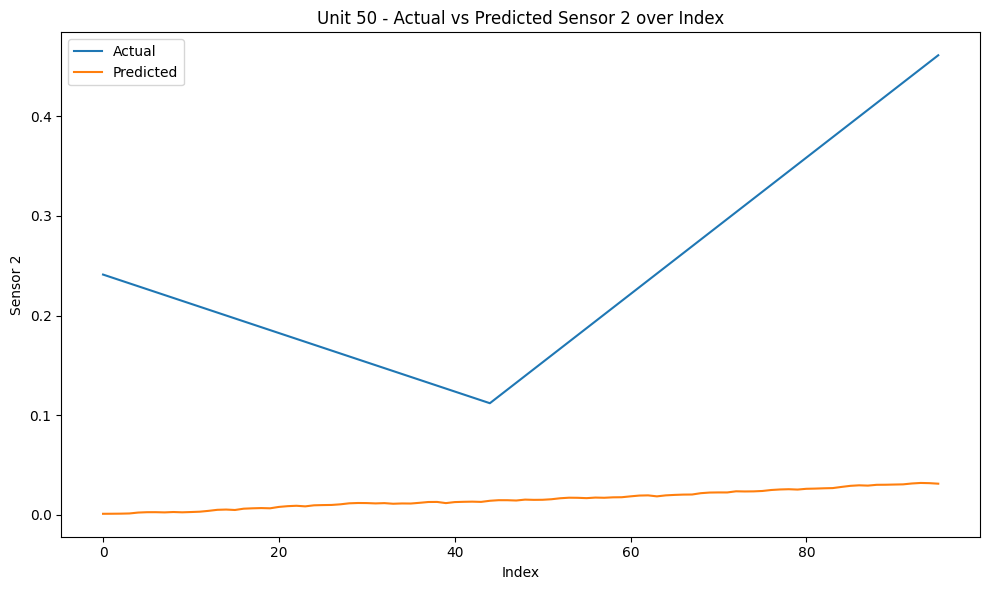

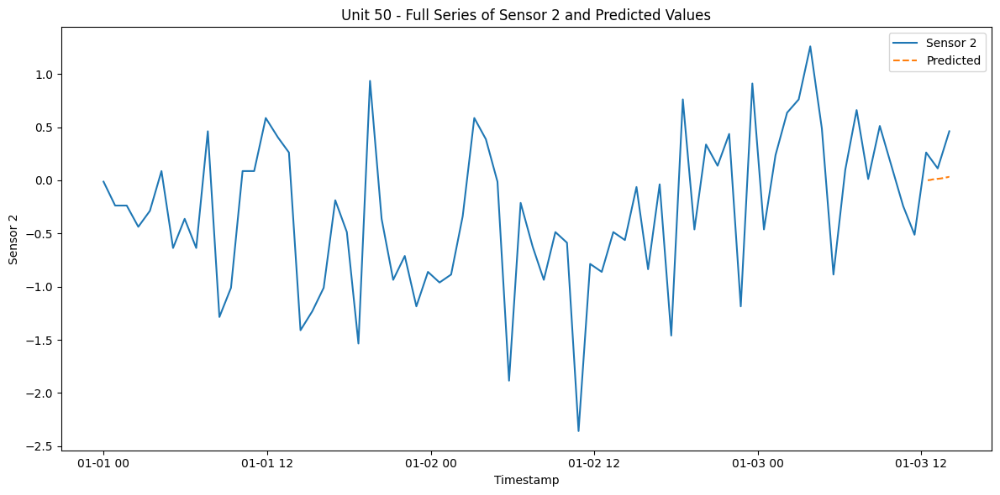

RMSE for Unit 50 - sensor_2: 0.2387679290075693
{'train': [0, 5835], 'valid': [5323, 6565], 'test': [6053, 7293]}
6694
Dataset for unit 51 is good


  0%|          | 0/69 [00:00<?, ?it/s]

96
[-0.4039835558075203, -0.3565393920249433, -0.30909522824236624, -0.26165106445978925, -0.21420690067721226, -0.16676273689463517, -0.11931857311205818, -0.07187440932948119, -0.024430245546904095, 0.023013918235672892, 0.07045808201824988, 0.11790224580082698, 0.16534640958340396, 0.21279057336598095, 0.26023473714855805, 0.3076789009311349, 0.355123064713712, 0.4025672284962891, 0.450011392278866, 0.4974555560614431, 0.5448997198440202, 0.5923438836265971, 0.6397880474091742, 0.6872322111917513, 0.7346763749743281, 0.7821205387569052, 0.8295647025394823, 0.8770088663220592, 0.9244530301046363, 0.9718971938872134, 1.0193413576697903, 1.0667855214523674, 1.1142296852349445, 1.1616738490175214, 1.2091180128000985, 1.2565621765826755, 1.3040063403652524, 1.3514505041478293, 1.3988946679304066, 1.4463388317129835, 1.4937829954955604, 1.5412271592781377, 1.5886713230607146, 1.6361154868432914, 1.683559650625869, 1.6547018602838883, 1.6258440699419079, 1.5969862795999272, 1.5681284892579

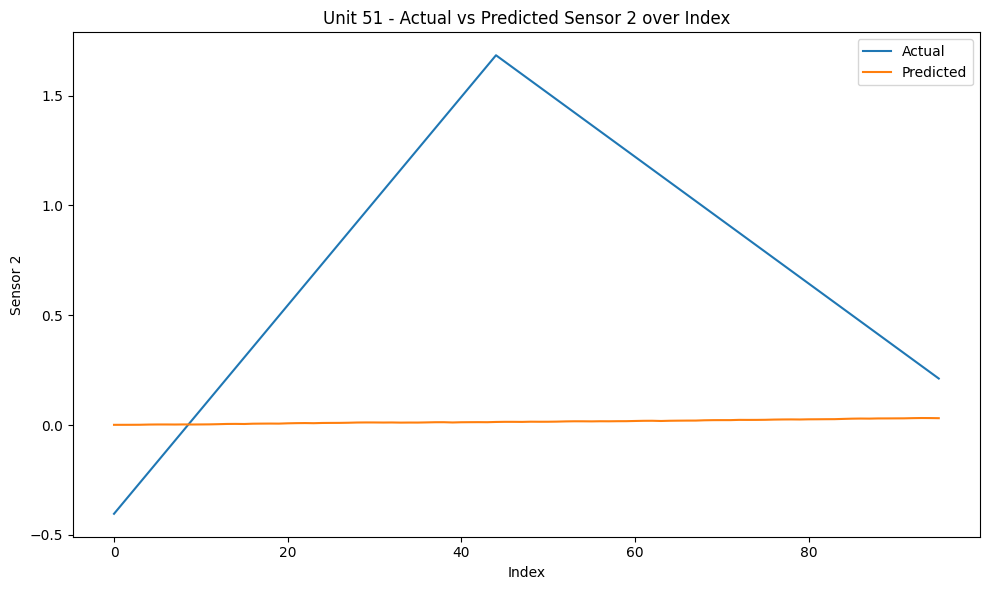

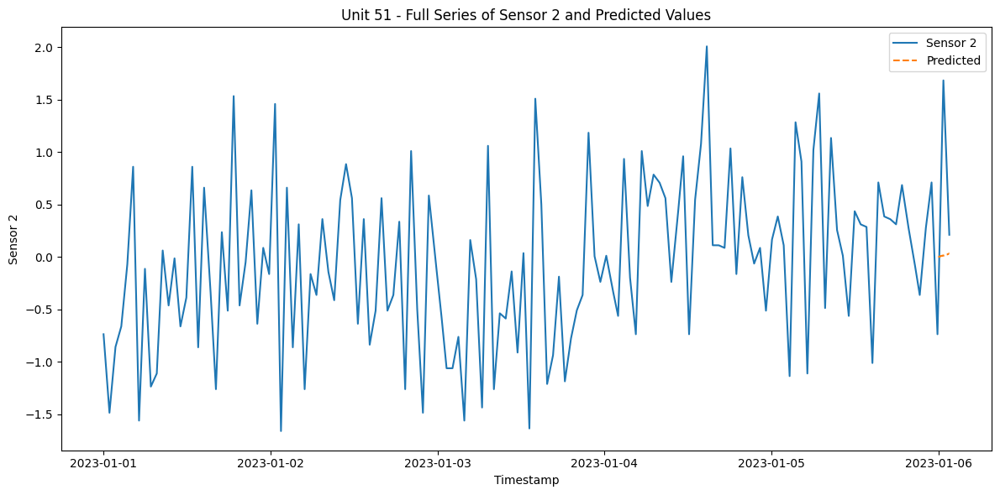

RMSE for Unit 51 - sensor_2: 0.9495618318772933
{'train': [0, 7671], 'valid': [7159, 8630], 'test': [8118, 9588]}
8989
Dataset for unit 52 is good


  0%|          | 0/97 [00:00<?, ?it/s]

96
[0.7997286820166023, 0.7875008047530518, 0.7752729274895014, 0.763045050225951, 0.7508171729624006, 0.7385892956988501, 0.7263614184352997, 0.7141335411717493, 0.7019056639081989, 0.6896777866446484, 0.677449909381098, 0.6652220321175475, 0.652994154853997, 0.6407662775904466, 0.6285384003268961, 0.6163105230633458, 0.6040826457997953, 0.5918547685362449, 0.5796268912726945, 0.567399014009144, 0.5551711367455936, 0.5429432594820431, 0.5307153822184927, 0.5184875049549422, 0.5062596276913918, 0.49403175042784137, 0.4818038731642909, 0.4695759959007405, 0.45734811863719005, 0.4451202413736396, 0.4328923641100892, 0.42066448684653873, 0.4084366095829883, 0.3962087323194379, 0.3839808550558874, 0.37175297779233696, 0.3595251005287865, 0.34729722326523615, 0.3350693460016857, 0.32284146873813524, 0.3106135914745848, 0.2983857142110343, 0.28615783694748387, 0.2739299596839335, 0.26170208242038306, 0.28958164258127495, 0.3174612027421668, 0.3453407629030587, 0.3732203230639506, 0.401099883

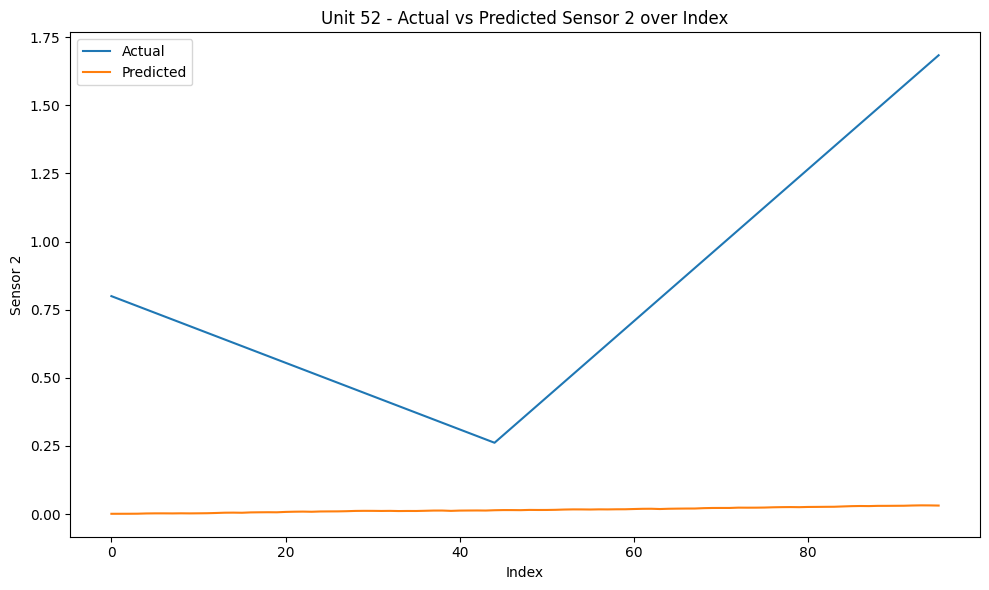

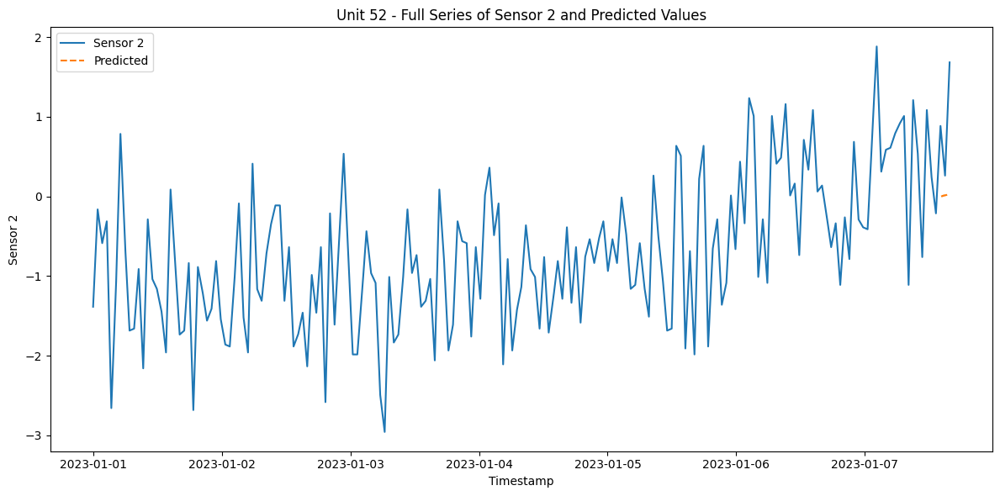

RMSE for Unit 52 - sensor_2: 0.8493075909106508
{'train': [0, 6651], 'valid': [6139, 7483], 'test': [6971, 8313]}
7714
Dataset for unit 53 is good


  0%|          | 0/81 [00:00<?, ?it/s]

96
[1.5197060952943644, 1.5069891029402724, 1.4942721105861805, 1.4815551182320885, 1.4688381258779963, 1.4561211335239044, 1.4434041411698124, 1.4306871488157205, 1.4179701564616285, 1.4052531641075363, 1.3925361717534444, 1.3798191793993524, 1.3671021870452604, 1.3543851946911682, 1.3416682023370763, 1.3289512099829843, 1.3162342176288924, 1.3035172252748004, 1.2908002329207082, 1.2780832405666163, 1.2653662482125243, 1.2526492558584323, 1.2399322635043402, 1.2272152711502482, 1.2144982787961562, 1.2017812864420643, 1.1890642940879723, 1.1763473017338801, 1.1636303093797882, 1.1509133170256962, 1.138196324671604, 1.125479332317512, 1.11276233996342, 1.1000453476093282, 1.0873283552552362, 1.0746113629011442, 1.0618943705470523, 1.04917737819296, 1.0364603858388681, 1.023743393484776, 1.011026401130684, 0.998309408776592, 0.9855924164225001, 0.972875424068408, 0.960158431714316, 0.9606475468048576, 0.9611366618953991, 0.9616257769859408, 0.9621148920764823, 0.9626040071670239, 0.96309

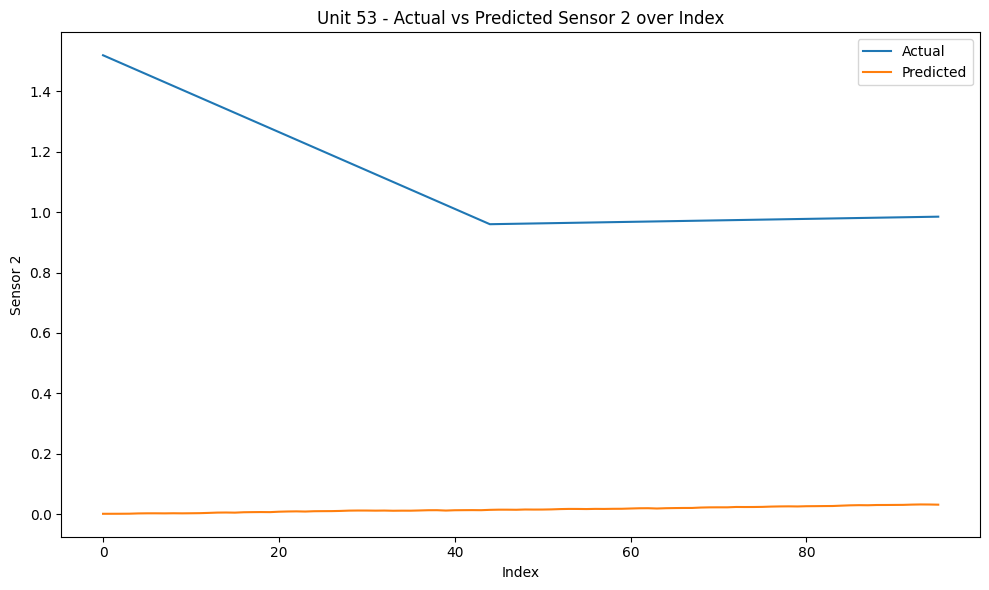

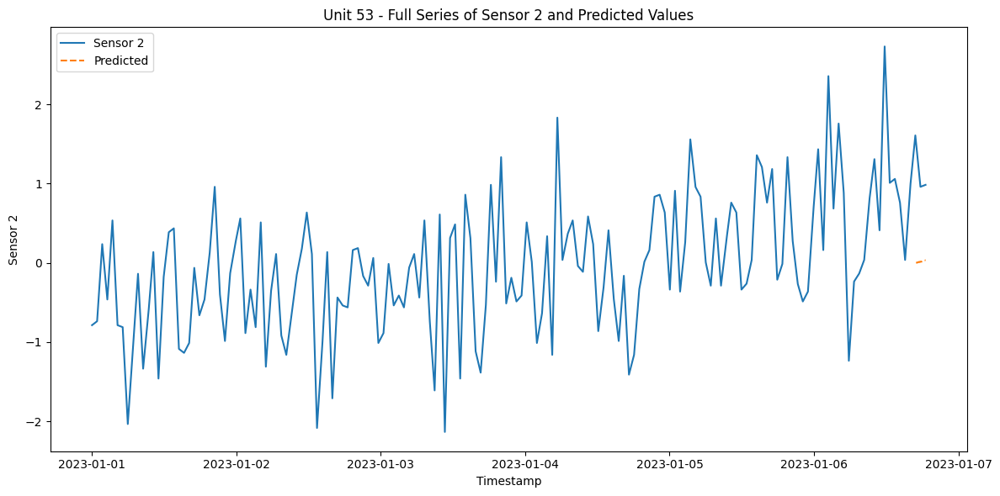

RMSE for Unit 53 - sensor_2: 1.0975939136185056
{'train': [0, 4897], 'valid': [4385, 5509], 'test': [4997, 6120]}
5521
Dataset for unit 54 is good


  0%|          | 0/54 [00:00<?, ?it/s]

96
[-0.3017585018841925, -0.3252360262302047, -0.3487135505762169, -0.372191074922229, -0.39566859926824116, -0.4191461236142534, -0.44262364796026554, -0.4661011723062777, -0.4895786966522898, -0.5130562209983021, -0.5365337453443142, -0.5600112696903263, -0.5834887940363386, -0.6069663183823507, -0.6304438427283628, -0.653921367074375, -0.6773988914203871, -0.7008764157663994, -0.7243539401124115, -0.7478314644584236, -0.7713089888044359, -0.794786513150448, -0.8182640374964602, -0.8417415618424723, -0.8652190861884845, -0.8886966105344967, -0.9121741348805088, -0.935651659226521, -0.9591291835725332, -0.9826067079185453, -1.0060842322645576, -1.0295617566105697, -1.0530392809565818, -1.076516805302594, -1.0999943296486063, -1.1234718539946185, -1.1469493783406306, -1.1704269026866427, -1.1939044270326549, -1.217381951378667, -1.2408594757246794, -1.2643370000706915, -1.2878145244167036, -1.3112920487627158, -1.334769573108728, -1.3108029336721743, -1.2868362942356204, -1.26286965479

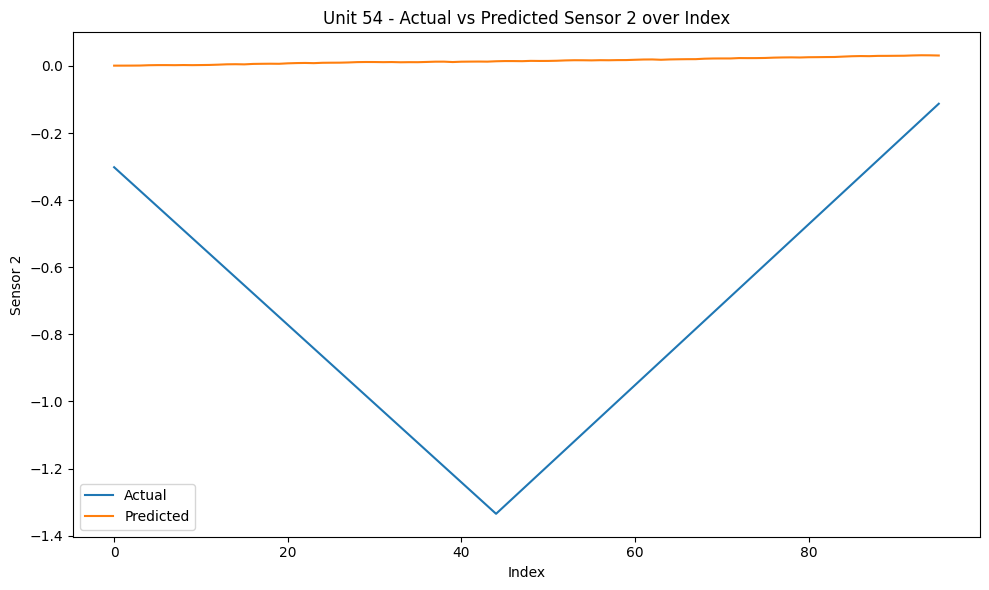

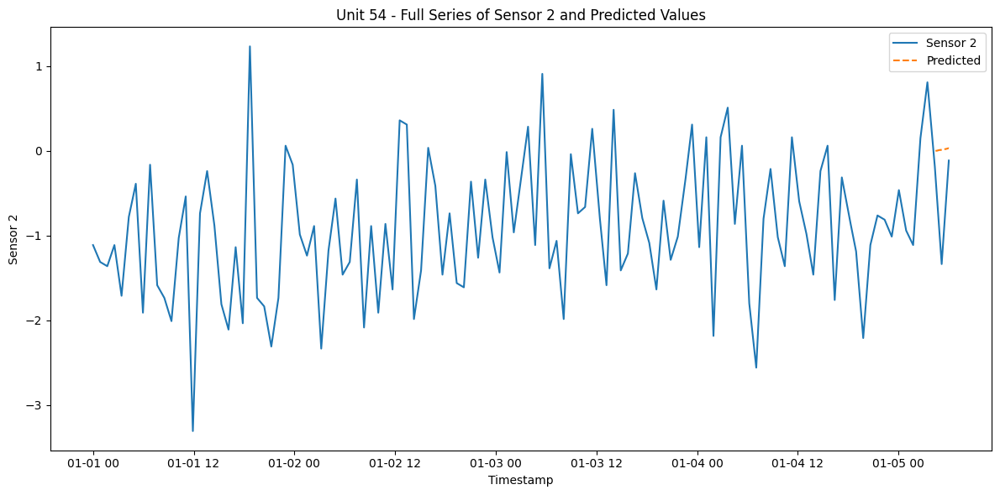

RMSE for Unit 54 - sensor_2: 0.845677655281253
{'train': [0, 4570], 'valid': [4058, 5142], 'test': [4630, 5712]}
5113
Dataset for unit 55 is good


  0%|          | 0/49 [00:00<?, ?it/s]

96
[0.6877213262823375, 0.6808737150147499, 0.6740261037471623, 0.6671784924795747, 0.6603308812119872, 0.6534832699443996, 0.646635658676812, 0.6397880474092245, 0.6329404361416369, 0.6260928248740494, 0.6192452136064618, 0.6123976023388742, 0.6055499910712866, 0.598702379803699, 0.5918547685361114, 0.5850071572685238, 0.5781595460009363, 0.5713119347333487, 0.5644643234657611, 0.5576167121981735, 0.550769100930586, 0.5439214896629985, 0.5370738783954108, 0.5302262671278233, 0.5233786558602357, 0.5165310445926481, 0.5096834333250605, 0.5028358220574729, 0.49598821078988536, 0.48914059952229777, 0.48229298825471023, 0.47544537698712264, 0.46859776571953504, 0.46175015445194745, 0.4549025431843599, 0.4480549319167723, 0.4412073206491847, 0.4343597093815972, 0.4275120981140096, 0.420664486846422, 0.41381687557883445, 0.40696926431124686, 0.40012165304365926, 0.3932740417760717, 0.38642643050848413, 0.36539448161517984, 0.3443625327218755, 0.3233305838285712, 0.3022986349352669, 0.2812666

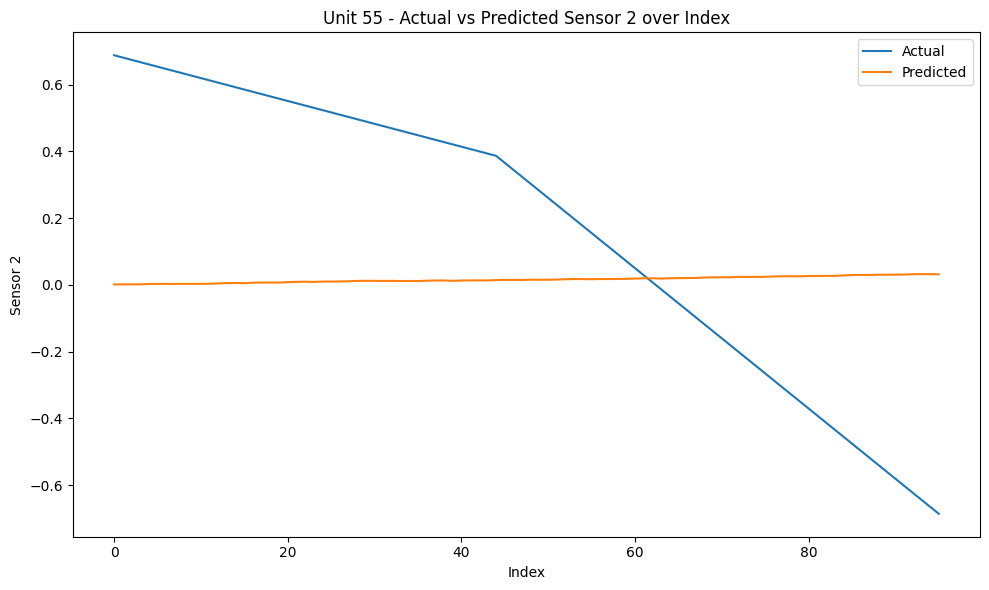

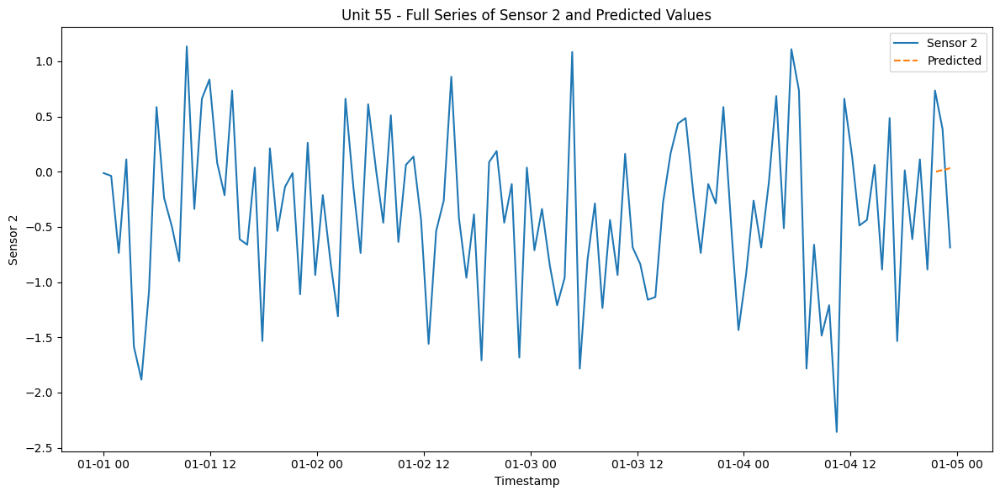

RMSE for Unit 55 - sensor_2: 0.4537311077702359
{'train': [0, 5509], 'valid': [4997, 6197], 'test': [5685, 6885]}
6286
Dataset for unit 56 is good


  0%|          | 0/64 [00:00<?, ?it/s]

96
[1.5725305250729322, 1.5744869854350985, 1.5764434457972647, 1.578399906159431, 1.5803563665215974, 1.5823128268837636, 1.5842692872459299, 1.586225747608096, 1.5881822079702625, 1.5901386683324288, 1.592095128694595, 1.5940515890567613, 1.5960080494189275, 1.597964509781094, 1.5999209701432602, 1.6018774305054264, 1.6038338908675926, 1.605790351229759, 1.6077468115919253, 1.6097032719540916, 1.6116597323162578, 1.6136161926784243, 1.6155726530405905, 1.6175291134027567, 1.619485573764923, 1.6214420341270892, 1.6233984944892557, 1.625354954851422, 1.6273114152135881, 1.6292678755757544, 1.6312243359379208, 1.633180796300087, 1.6351372566622533, 1.6370937170244195, 1.639050177386586, 1.6410066377487522, 1.6429630981109185, 1.6449195584730847, 1.6468760188352511, 1.6488324791974174, 1.6507889395595836, 1.6527453999217498, 1.6547018602839163, 1.6566583206460825, 1.6586147810082488, 1.6674188526380083, 1.6762229242677675, 1.685026995897527, 1.6938310675272865, 1.702635139157046, 1.71143

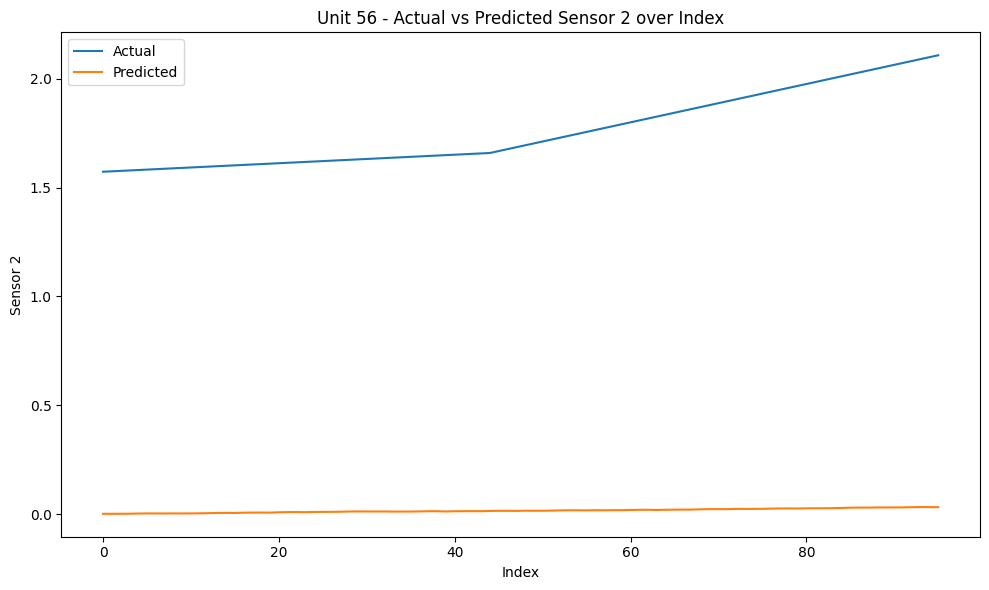

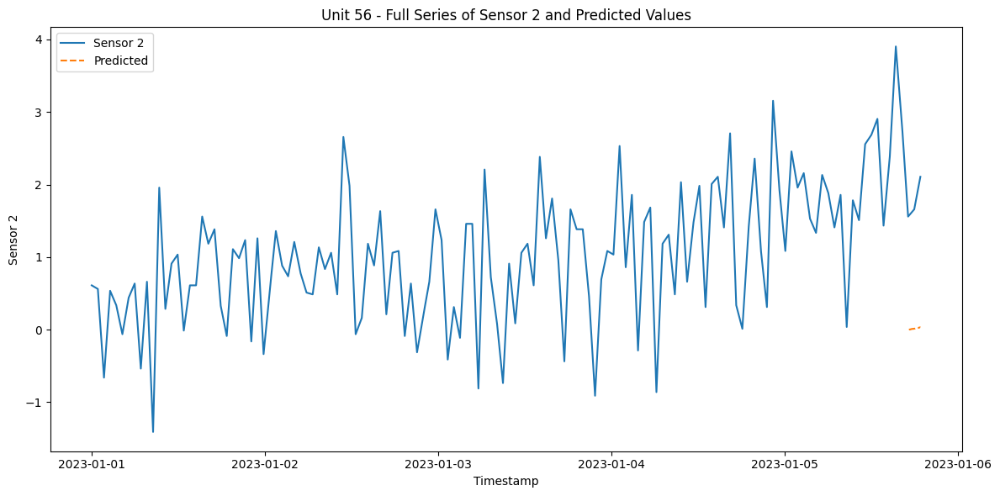

RMSE for Unit 56 - sensor_2: 1.7514585161541072
{'train': [0, 6488], 'valid': [5976, 7299], 'test': [6787, 8109]}
7510
Dataset for unit 57 is good


  0%|          | 0/79 [00:00<?, ?it/s]

96
[0.9665169278913175, 0.9567346260804804, 0.9469523242696435, 0.9371700224588064, 0.9273877206479695, 0.9176054188371324, 0.9078231170262954, 0.8980408152154584, 0.8882585134046214, 0.8784762115937843, 0.8686939097829474, 0.8589116079721103, 0.8491293061612734, 0.8393470043504363, 0.8295647025395994, 0.8197824007287623, 0.8100000989179252, 0.8002177971070883, 0.7904354952962512, 0.7806531934854142, 0.7708708916745772, 0.7610885898637403, 0.7513062880529032, 0.7415239862420662, 0.7317416844312292, 0.7219593826203922, 0.7121770808095551, 0.7023947789987182, 0.6926124771878811, 0.682830175377044, 0.6730478735662071, 0.6632655717553702, 0.6534832699445331, 0.643700968133696, 0.6339186663228591, 0.624136364512022, 0.614354062701185, 0.604571760890348, 0.5947894590795111, 0.5850071572686739, 0.575224855457837, 0.565442553647, 0.555660251836163, 0.5458779500253259, 0.536095648214489, 0.5106616635062994, 0.4852276787981098, 0.4597936940899202, 0.43435970938173063, 0.40892572467354105, 0.3834

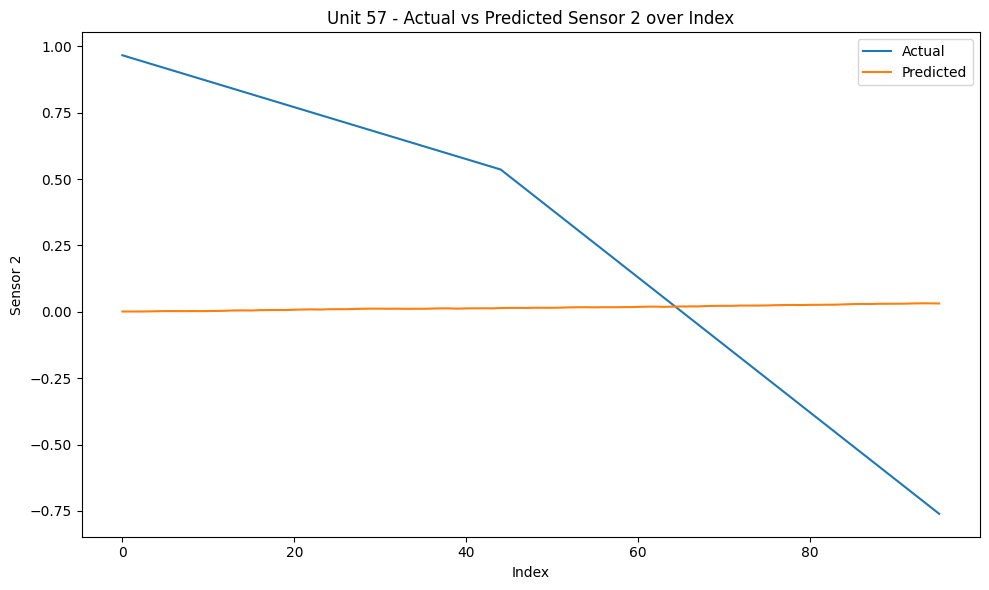

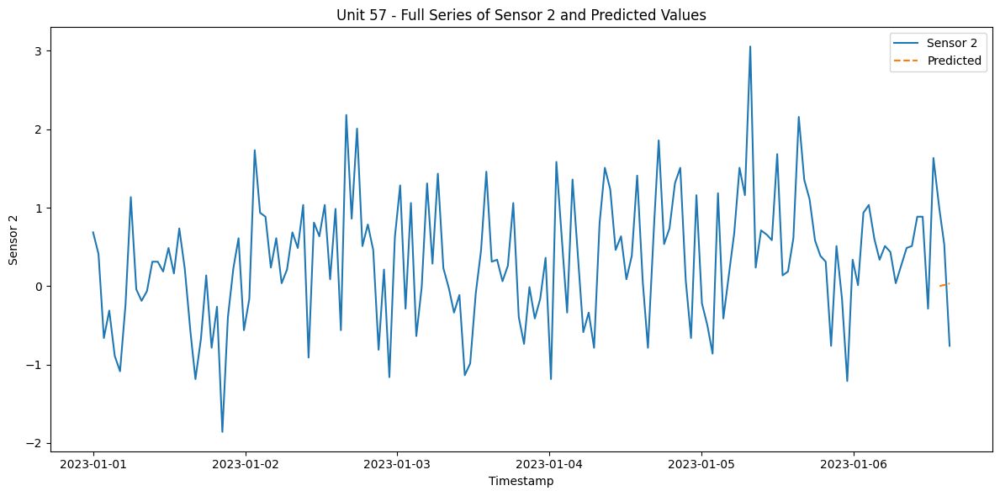

RMSE for Unit 57 - sensor_2: 0.5961648088862349
{'train': [0, 7141], 'valid': [6629, 8033], 'test': [7521, 8925]}
8326
Dataset for unit 58 is good


  0%|          | 0/89 [00:00<?, ?it/s]

96
[1.1259684474081038, 1.1567826981122507, 1.1875969488163975, 1.2184111995205442, 1.2492254502246913, 1.280039700928838, 1.310853951632985, 1.3416682023371318, 1.3724824530412787, 1.4032967037454256, 1.4341109544495725, 1.4649252051537194, 1.495739455857866, 1.5265537065620132, 1.5573679572661598, 1.588182207970307, 1.6189964586744536, 1.6498107093786007, 1.6806249600827474, 1.7114392107868943, 1.7422534614910412, 1.773067712195188, 1.803881962899335, 1.8346962136034817, 1.8655104643076288, 1.8963247150117755, 1.9271389657159226, 1.9579532164200693, 1.9887674671242164, 2.019581717828363, 2.05039596853251, 2.081210219236657, 2.1120244699408035, 2.1428387206449506, 2.1736529713490973, 2.2044672220532444, 2.235281472757391, 2.266095723461538, 2.296909974165685, 2.327724224869832, 2.3585384755739787, 2.389352726278126, 2.4201669769822725, 2.450981227686419, 2.4817954783905662, 2.459296184225632, 2.436796890060697, 2.4142975958957624, 2.391798301730828, 2.3692990075658935, 2.3467997134009

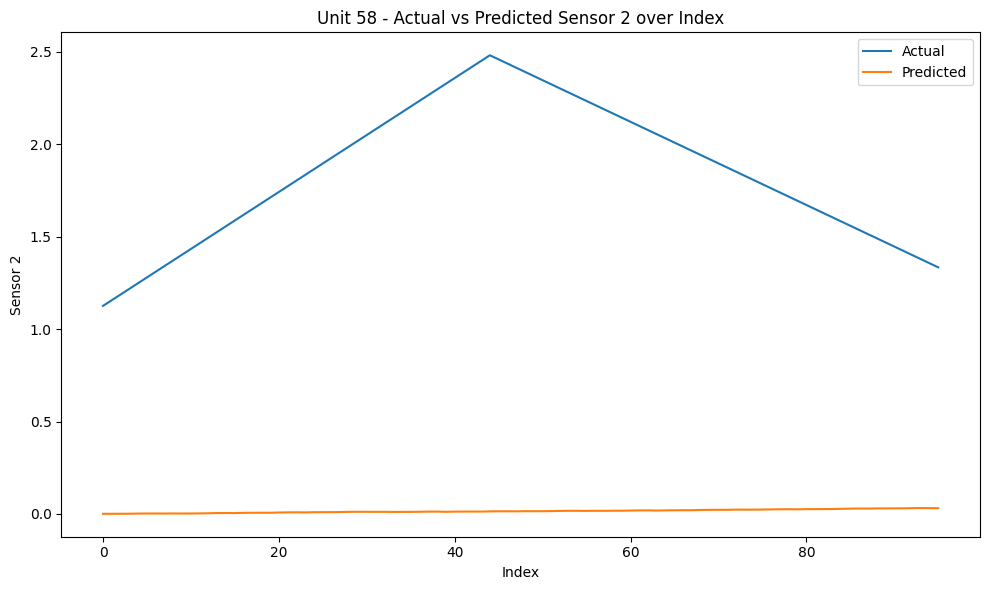

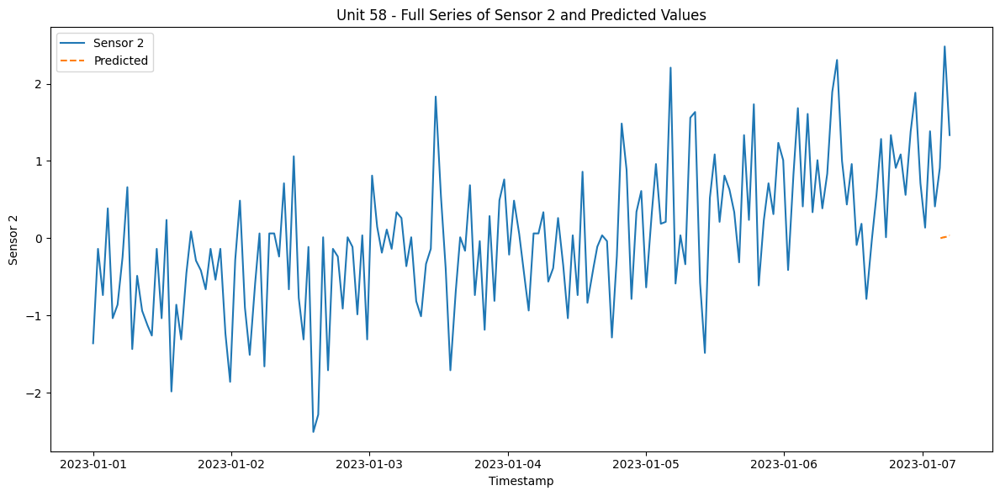

RMSE for Unit 58 - sensor_2: 1.873996209528654
{'train': [0, 3795], 'valid': [3283, 4270], 'test': [3758, 4743]}
4144
Dataset for unit 59 is good


  0%|          | 0/37 [00:00<?, ?it/s]

96
[-0.9982583908160091, -0.9786937871943295, -0.9591291835726499, -0.9395645799509703, -0.9199999763292908, -0.9004353727076111, -0.8808707690859316, -0.861306165464252, -0.8417415618425724, -0.8221769582208929, -0.8026123545992132, -0.7830477509775337, -0.7634831473558541, -0.7439185437341744, -0.7243539401124949, -0.7047893364908153, -0.6852247328691357, -0.6656601292474561, -0.6460955256257765, -0.626530922004097, -0.6069663183824173, -0.5874017147607378, -0.5678371111390582, -0.5482725075173787, -0.528707903895699, -0.5091433002740194, -0.4895786966523399, -0.4700140930306602, -0.45044948940898066, -0.4308848857873011, -0.41132028216562155, -0.3917556785439419, -0.37219107492226233, -0.3526264713005828, -0.3330618676789031, -0.31349726405722356, -0.293932660435544, -0.27436805681386445, -0.2548034531921848, -0.23523884957050523, -0.21567424594882567, -0.196109642327146, -0.17654503870546645, -0.1569804350837869, -0.13741583146210737, -0.14915459363511624, -0.1608933558081251, -0.1

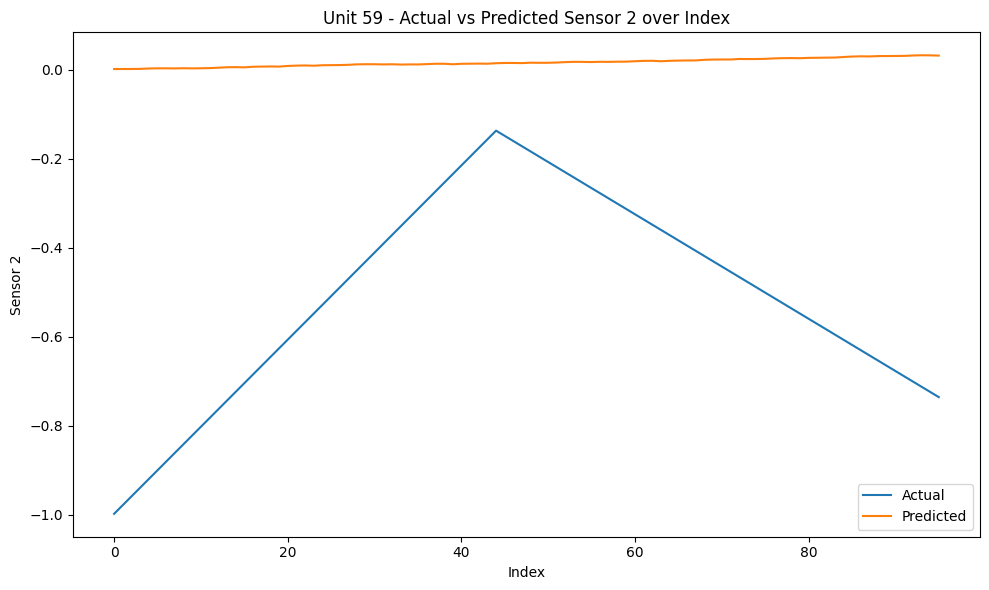

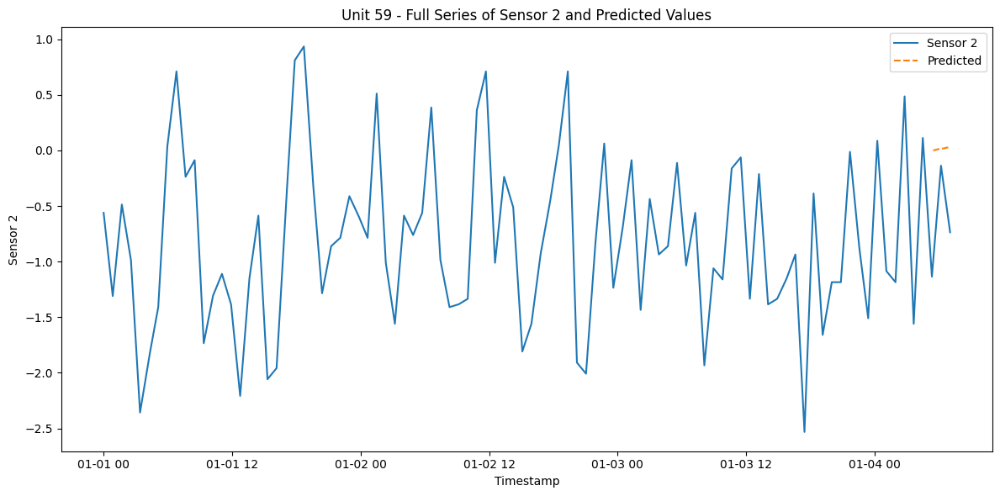

RMSE for Unit 59 - sensor_2: 0.5625981516081046
{'train': [0, 5958], 'valid': [5446, 6702], 'test': [6190, 7446]}
6847
Dataset for unit 60 is good


  0%|          | 0/71 [00:00<?, ?it/s]

96
[0.25143066551897114, 0.24996332024734083, 0.24849597497571055, 0.2470286297040803, 0.24556128443245, 0.24409393916081973, 0.24262659388918945, 0.24115924861755916, 0.23969190334592888, 0.2382245580742986, 0.23675721280266834, 0.23528986753103806, 0.23382252225940778, 0.2323551769877775, 0.2308878317161472, 0.22942048644451696, 0.22795314117288668, 0.2264857959012564, 0.2250184506296261, 0.22355110535799583, 0.22208376008636554, 0.22061641481473526, 0.21914906954310498, 0.21768172427147472, 0.21621437899984444, 0.21474703372821416, 0.21327968845658388, 0.2118123431849536, 0.21034499791332334, 0.20887765264169306, 0.20741030737006277, 0.2059429620984325, 0.2044756168268022, 0.20300827155517193, 0.20154092628354164, 0.20007358101191136, 0.19860623574028108, 0.19713889046865082, 0.19567154519702054, 0.19420419992539026, 0.19273685465376, 0.19126950938212972, 0.18980216411049944, 0.18833481883886916, 0.18686747356723887, 0.20203004137404432, 0.21719260918084973, 0.23235517698765518, 0.2

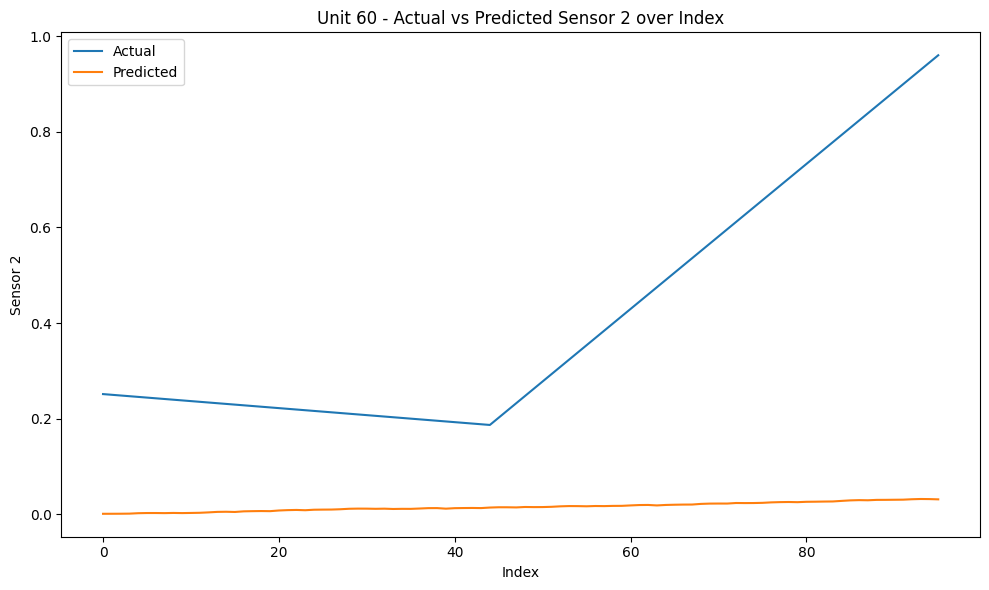

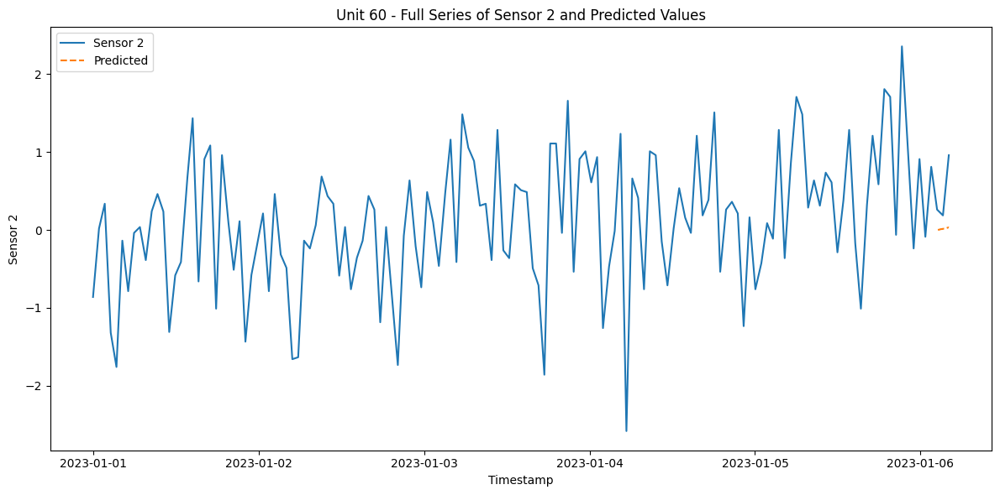

RMSE for Unit 60 - sensor_2: 0.4604914289604997
{'train': [0, 6447], 'valid': [5935, 7253], 'test': [6741, 8058]}
7459
Dataset for unit 61 is good


  0%|          | 0/78 [00:00<?, ?it/s]

96
[1.8136642647100165, 1.7823608989153281, 1.7510575331206397, 1.7197541673259513, 1.6884508015312627, 1.6571474357365743, 1.625844069941886, 1.5945407041471973, 1.5632373383525089, 1.5319339725578205, 1.500630606763132, 1.4693272409684437, 1.438023875173755, 1.4067205093790667, 1.3754171435843783, 1.3441137777896897, 1.3128104119950013, 1.2815070462003129, 1.2502036804056245, 1.218900314610936, 1.1875969488162474, 1.156293583021559, 1.1249902172268706, 1.093686851432182, 1.0623834856374936, 1.0310801198428052, 0.9997767540481168, 0.9684733882534284, 0.9371700224587398, 0.9058666566640514, 0.874563290869363, 0.8432599250746744, 0.811956559279986, 0.7806531934852976, 0.7493498276906092, 0.7180464618959208, 0.6867430961012322, 0.6554397303065438, 0.6241363645118554, 0.5928329987171668, 0.5615296329224784, 0.53022626712779, 0.4989229013331016, 0.4676195355384132, 0.4363161697437245, 0.46761953553841296, 0.4989229013331014, 0.5302262671277899, 0.5615296329224784, 0.5928329987171668, 0.624

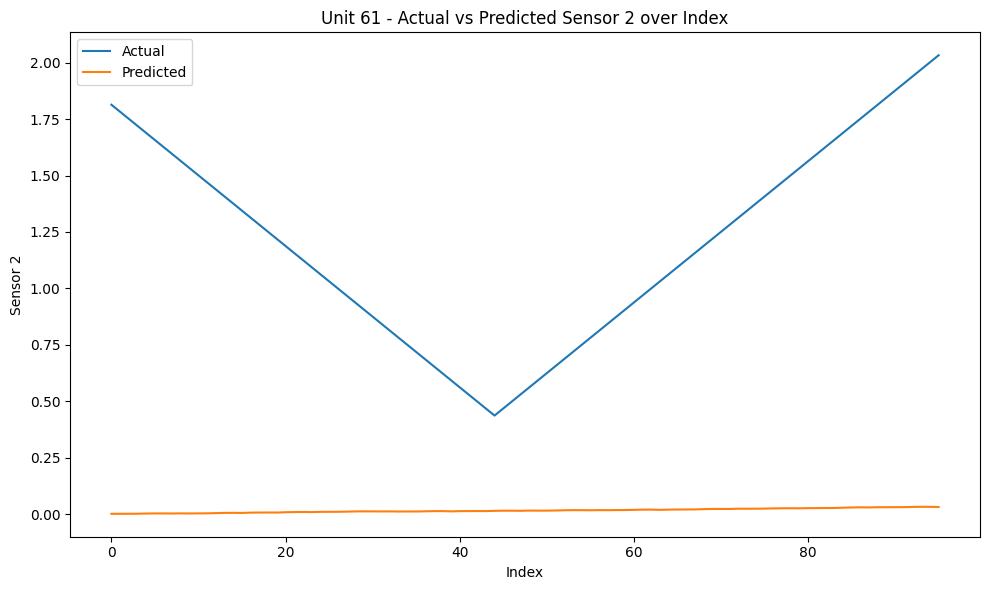

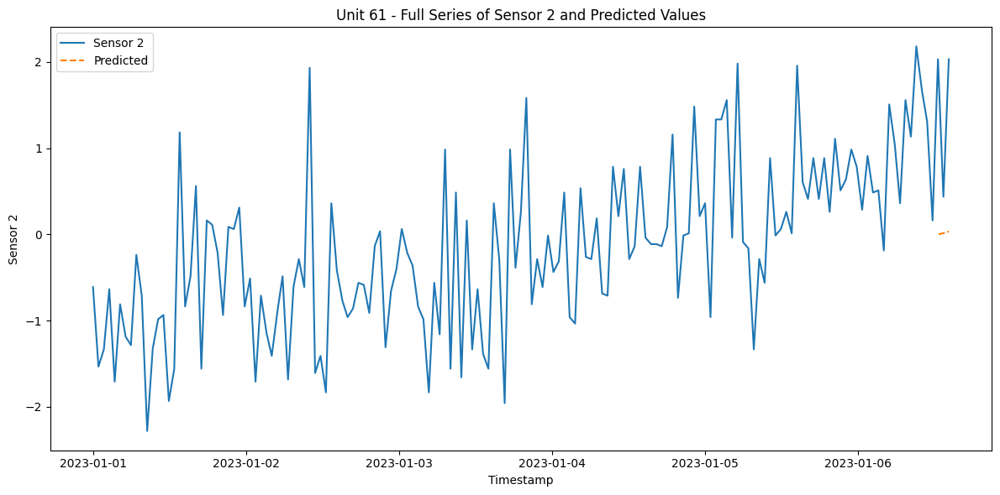

RMSE for Unit 61 - sensor_2: 1.2548886601597309
{'train': [0, 9426], 'valid': [8914, 10604], 'test': [10092, 11781]}
11182
Dataset for unit 62 is good


  0%|          | 0/125 [00:00<?, ?it/s]

96
[-0.18241441979189316, -0.17458857834322242, -0.16676273689455168, -0.15893689544588097, -0.15111105399721025, -0.14328521254853954, -0.1354593710998688, -0.1276335296511981, -0.11980768820252737, -0.11198184675385664, -0.10415600530518593, -0.09633016385651519, -0.08850432240784448, -0.08067848095917374, -0.07285263951050303, -0.06502679806183231, -0.057200956613161574, -0.04937511516449086, -0.04154927371582015, -0.03372343226714941, -0.0258975908184787, -0.018071749369807988, -0.010245907921137248, -0.0024200664724665366, 0.005405774976204203, 0.013231616424874915, 0.021057457873545626, 0.028883299322216338, 0.036709140770887105, 0.04453498221955782, 0.05236082366822853, 0.06018666511689924, 0.06801250656556995, 0.07583834801424072, 0.08366418946291143, 0.09149003091158214, 0.09931587236025285, 0.10714171380892357, 0.11496755525759428, 0.12279339670626505, 0.13061923815493576, 0.13844507960360647, 0.14627092105227718, 0.1540967625009479, 0.1619226039496187, 0.176106941575341, 0.1

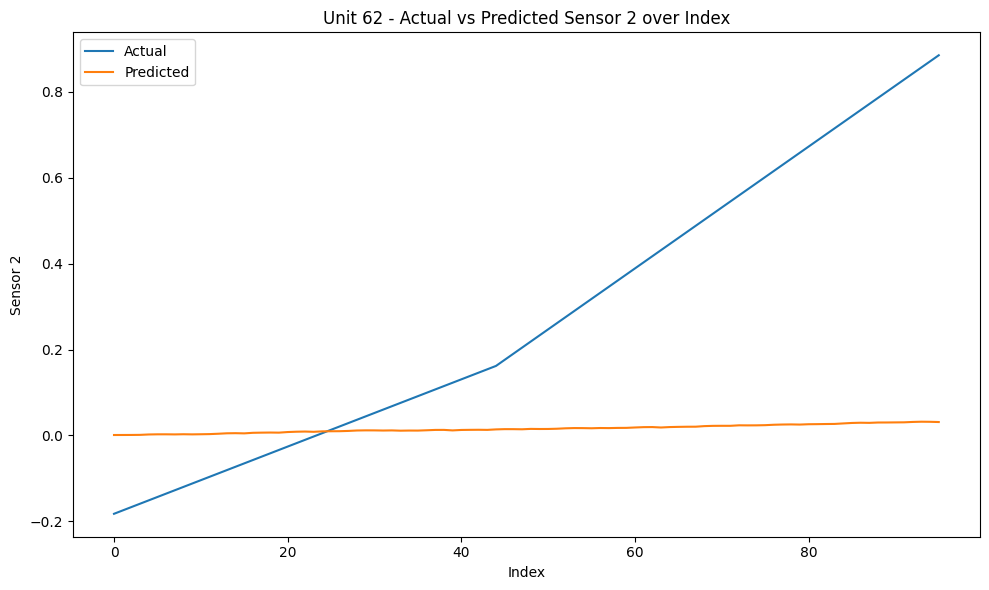

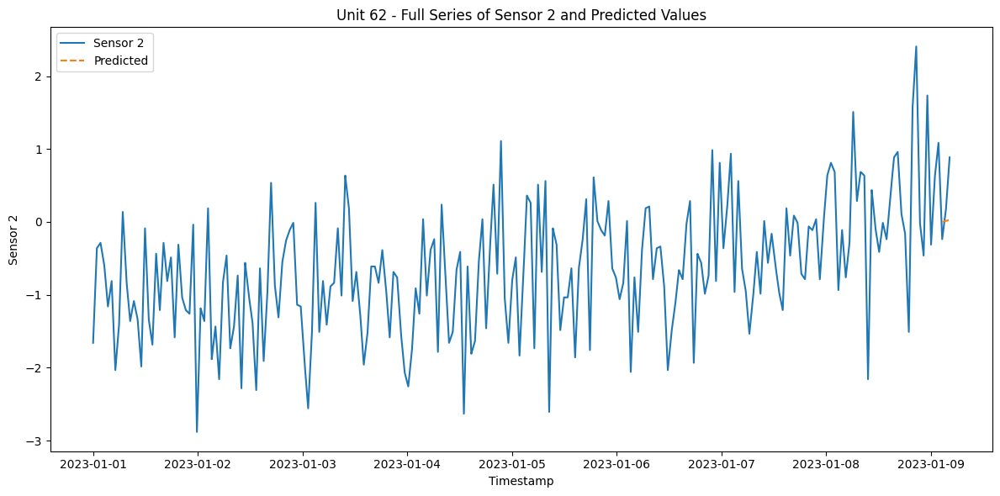

RMSE for Unit 62 - sensor_2: 0.40462078744092017
{'train': [0, 6284], 'valid': [5772, 7070], 'test': [6558, 7854]}
7255
Dataset for unit 63 is good


  0%|          | 0/76 [00:00<?, ?it/s]

96
[0.9753209995210269, 0.9596693166236854, 0.944017633726344, 0.9283659508290025, 0.9127142679316611, 0.8970625850343197, 0.8814109021369783, 0.8657592192396368, 0.8501075363422953, 0.8344558534449539, 0.8188041705476125, 0.8031524876502709, 0.7875008047529295, 0.7718491218555881, 0.7561974389582466, 0.7405457560609052, 0.7248940731635638, 0.7092423902662224, 0.693590707368881, 0.6779390244715394, 0.662287341574198, 0.6466356586768566, 0.630983975779515, 0.6153322928821736, 0.5996806099848322, 0.5840289270874908, 0.5683772441901493, 0.5527255612928079, 0.5370738783954664, 0.521422195498125, 0.5057705126007835, 0.4901188297034421, 0.4744671468061007, 0.45881546390875916, 0.44316378101141773, 0.4275120981140763, 0.4118604152167349, 0.39620873231939346, 0.38055704942205204, 0.3649053665247105, 0.3492536836273691, 0.33360200073002766, 0.31795031783268624, 0.3022986349353448, 0.2866469520380033, 0.31941766310431646, 0.35218837417062965, 0.3849590852369428, 0.41772979630325596, 0.4505005073

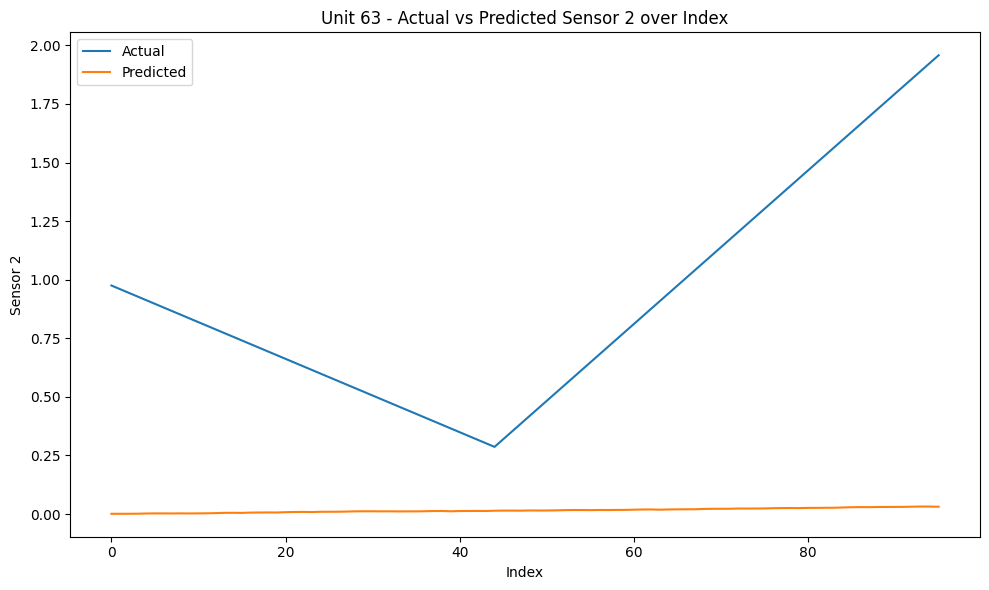

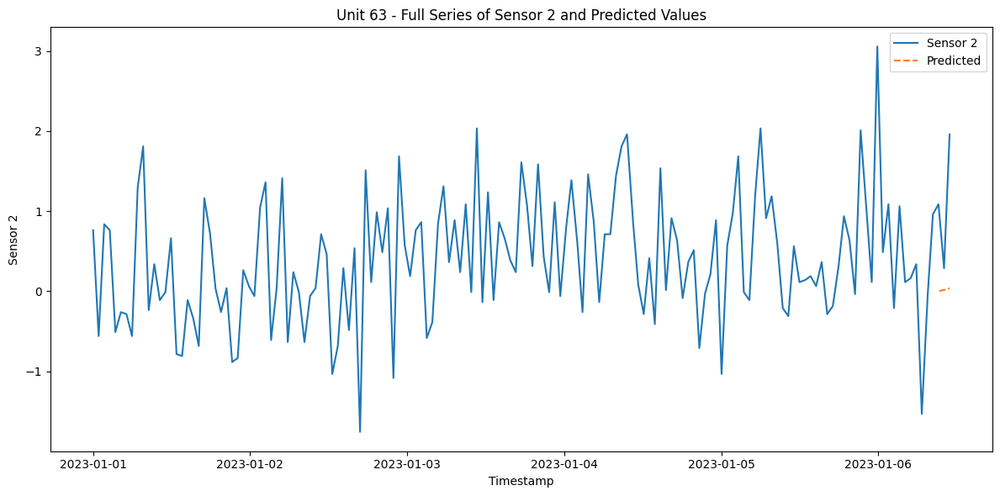

RMSE for Unit 63 - sensor_2: 0.9923301844420208
{'train': [0, 6814], 'valid': [6302, 7666], 'test': [7154, 8517]}
7918
Dataset for unit 64 is good


  0%|          | 0/84 [00:00<?, ?it/s]

96
[1.9672464031403036, 1.9721375540457249, 1.9770287049511464, 1.9819198558565676, 1.9868110067619889, 1.99170215766741, 1.9965933085728313, 2.001484459478253, 2.006375610383674, 2.0112667612890953, 2.0161579121945166, 2.021049063099938, 2.025940214005359, 2.0308313649107803, 2.0357225158162016, 2.040613666721623, 2.0455048176270445, 2.0503959685324658, 2.055287119437887, 2.0601782703433082, 2.0650694212487295, 2.0699605721541507, 2.074851723059572, 2.0797428739649932, 2.0846340248704145, 2.0895251757758357, 2.094416326681257, 2.0993074775866782, 2.1041986284921, 2.109089779397521, 2.1139809303029424, 2.1188720812083637, 2.123763232113785, 2.128654383019206, 2.1335455339246274, 2.1384366848300487, 2.14332783573547, 2.148218986640891, 2.1531101375463124, 2.158001288451734, 2.1628924393571554, 2.1677835902625766, 2.172674741167998, 2.177565892073419, 2.1824570429788404, 2.16582712990041, 2.14919721682198, 2.1325673037435497, 2.1159373906651195, 2.09930747758669, 2.0826775645082596, 2.06

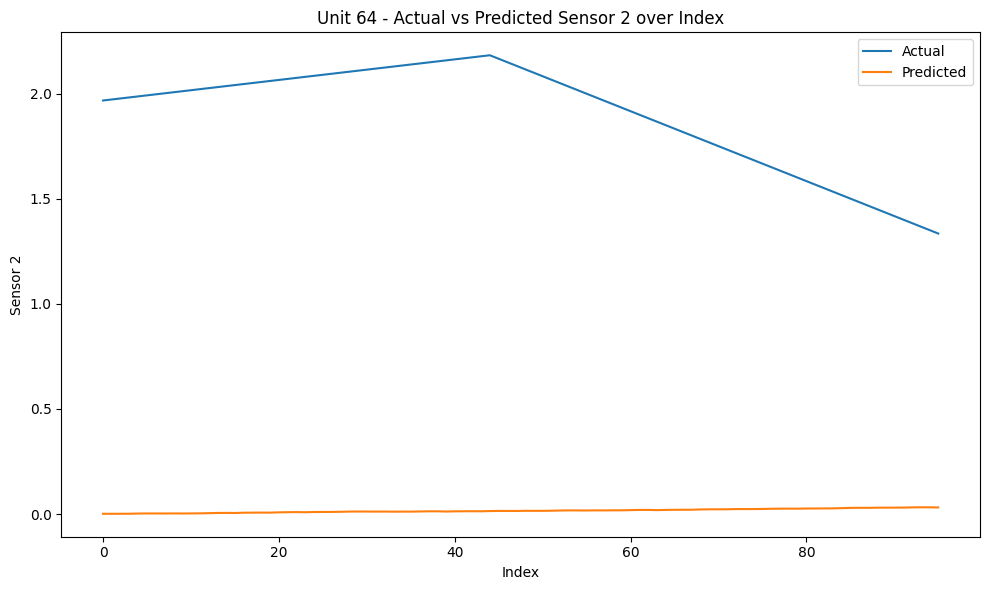

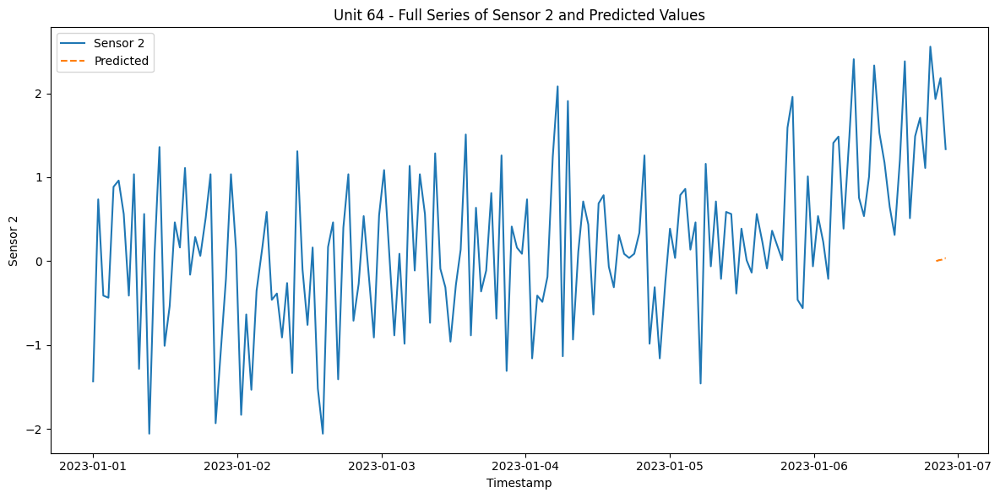

RMSE for Unit 64 - sensor_2: 1.9034066519534563
{'train': [0, 2857], 'valid': [2345, 3214], 'test': [2702, 3570]}
2971
Dataset for unit 65 is good


  0%|          | 0/22 [00:00<?, ?it/s]

96
[-2.4347894117377424, -2.4137574628444383, -2.3927255139511336, -2.3716935650578295, -2.3506616161645253, -2.329629667271221, -2.3085977183779165, -2.2875657694846123, -2.2665338205913077, -2.2455018716980035, -2.2244699228046994, -2.203437973911395, -2.1824060250180906, -2.1613740761247864, -2.140342127231482, -2.1193101783381776, -2.0982782294448734, -2.0772462805515692, -2.056214331658265, -2.0351823827649604, -2.0141504338716563, -1.993118484978352, -1.9720865360850477, -1.9510545871917433, -1.9300226382984391, -1.9089906894051347, -1.8879587405118303, -1.8669267916185261, -1.8458948427252218, -1.8248628938319174, -1.8038309449386132, -1.782798996045309, -1.7617670471520046, -1.7407350982587002, -1.719703149365396, -1.6986712004720916, -1.6776392515787872, -1.656607302685483, -1.6355753537921789, -1.6145434048988743, -1.59351145600557, -1.572479507112266, -1.5514475582189615, -1.5304156093256571, -1.509383660432353, -1.5152530415188574, -1.521122422605362, -1.5269918036918662, -

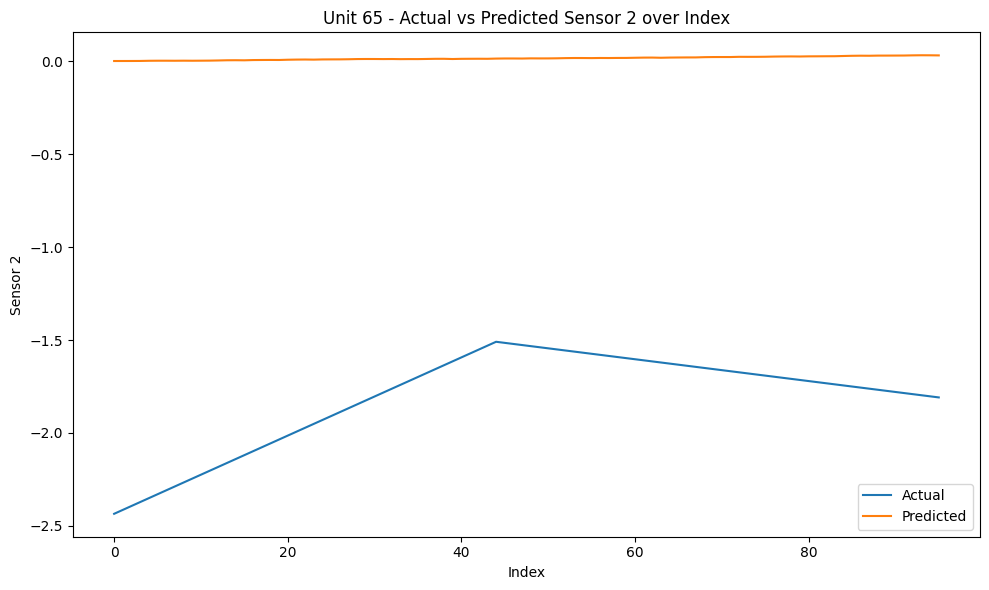

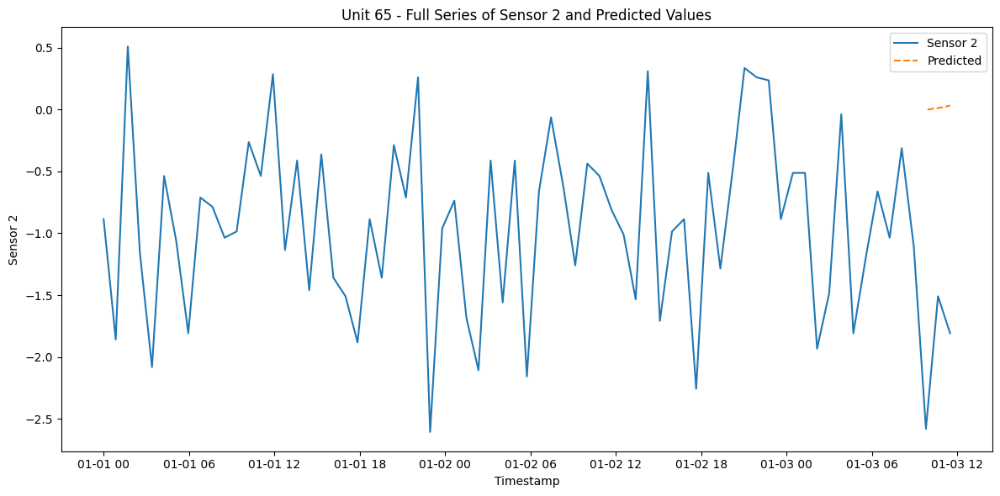

RMSE for Unit 65 - sensor_2: 1.8394641351907492
{'train': [0, 5958], 'valid': [5446, 6702], 'test': [6190, 7446]}
6847
Dataset for unit 66 is good


  0%|          | 0/71 [00:00<?, ?it/s]

96
[3.4512215878446586, 3.4257876031364742, 3.4003536184282903, 3.3749196337201064, 3.3494856490119225, 3.324051664303738, 3.298617679595554, 3.2731836948873703, 3.2477497101791863, 3.2223157254710024, 3.196881740762818, 3.171447756054634, 3.14601377134645, 3.120579786638266, 3.095145801930082, 3.069711817221898, 3.044277832513714, 3.01884384780553, 2.9934098630973462, 2.967975878389162, 2.942541893680978, 2.917107908972794, 2.89167392426461, 2.8662399395564258, 2.840805954848242, 2.815371970140058, 2.789937985431874, 2.76450400072369, 2.7390700160155057, 2.713636031307322, 2.688202046599138, 2.662768061890954, 2.6373340771827696, 2.6119000924745857, 2.5864661077664017, 2.561032123058218, 2.535598138350034, 2.51016415364185, 2.4847301689336656, 2.4592961842254817, 2.4338621995172973, 2.4084282148091134, 2.3829942301009295, 2.3575602453927456, 2.3321262606845616, 2.3287024550507707, 2.3252786494169797, 2.3218548437831887, 2.3184310381493978, 2.315007232515607, 2.3115834268818154, 2.3081

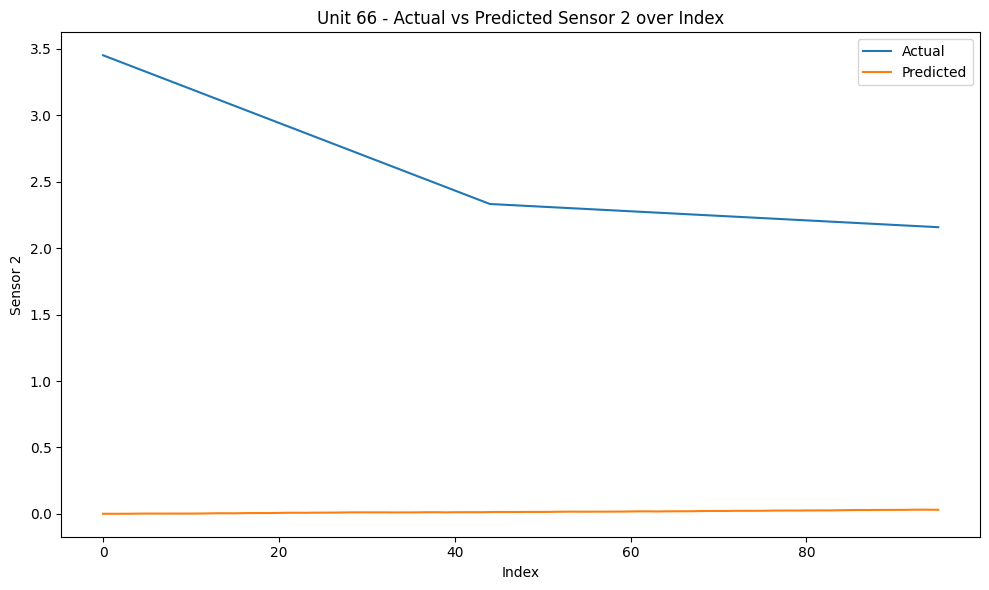

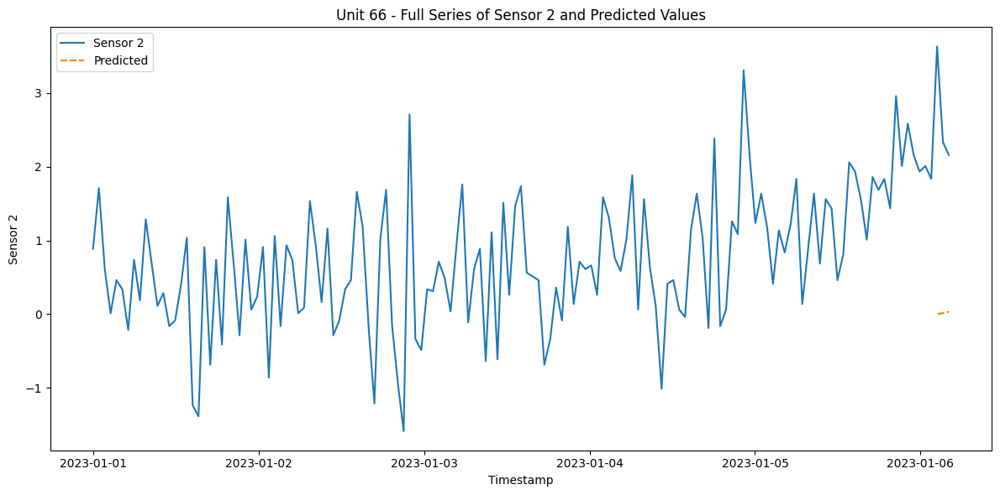

RMSE for Unit 66 - sensor_2: 2.563544922246734
{'train': [0, 2857], 'valid': [2345, 3214], 'test': [2702, 3570]}
2971
Dataset for unit 67 is good


  0%|          | 0/22 [00:00<?, ?it/s]

96
[-0.5820214487648083, -0.5600112696904154, -0.5380010906160224, -0.5159909115416293, -0.49398073246723634, -0.47197055339284333, -0.4499603743184503, -0.4279501952440573, -0.4059400161696643, -0.3839298370952713, -0.3619196580208783, -0.33990947894648527, -0.31789929987209226, -0.29588912079769925, -0.27387894172330624, -0.2518687626489132, -0.22985858357452016, -0.2078484045001272, -0.18583822542573425, -0.16382804635134118, -0.14181786727694812, -0.11980768820255516, -0.09779750912816221, -0.07578733005376914, -0.053777150979376076, -0.03176697190498312, -0.009756792830590166, 0.0122533862438029, 0.034263565318195965, 0.05627374439258892, 0.07828392346698188, 0.10029410254137494, 0.122304281615768, 0.14431446069016096, 0.16632463976455392, 0.18833481883894698, 0.21034499791334005, 0.232355176987733, 0.25436535606212596, 0.27637553513651913, 0.2983857142109121, 0.32039589328530504, 0.342406072359698, 0.36441625143409095, 0.38642643050848413, 0.3746876683354753, 0.3629489061624664, 

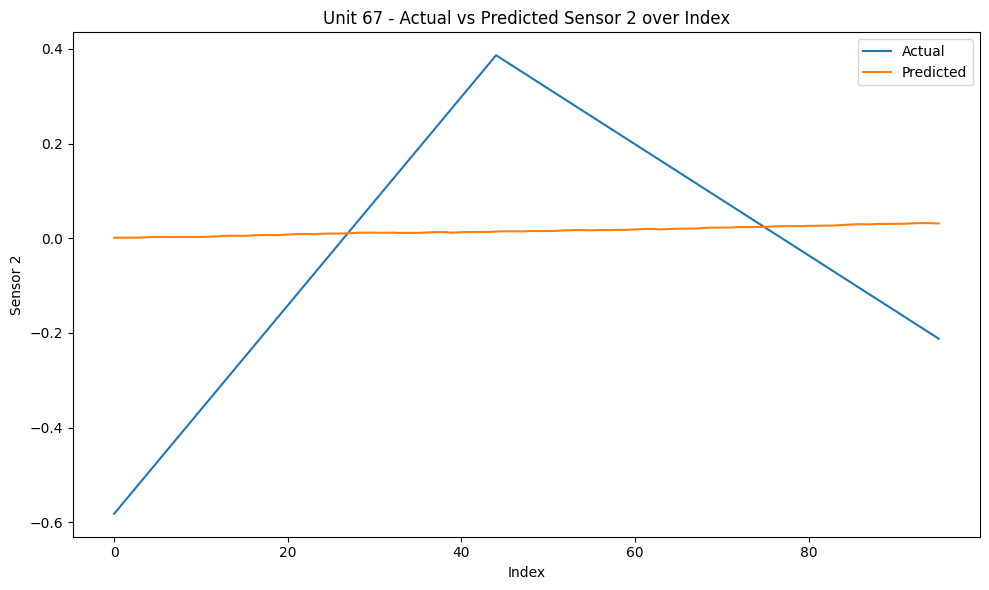

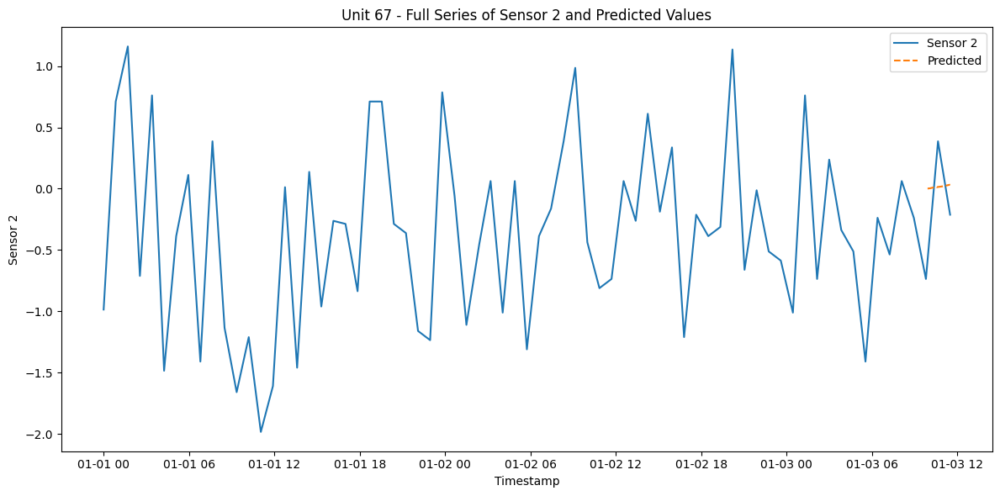

RMSE for Unit 67 - sensor_2: 0.24727343555813608
{'train': [0, 7590], 'valid': [7078, 8538], 'test': [8026, 9486]}
8887
Dataset for unit 68 is good


  0%|          | 0/96 [00:00<?, ?it/s]

96
[3.3128020172213932, 3.285411572151043, 3.2580211270806925, 3.230630682010342, 3.203240236939992, 3.175849791869642, 3.1484593467992914, 3.121068901728941, 3.0936784566585906, 3.0662880115882407, 3.0388975665178903, 3.01150712144754, 2.9841166763771896, 2.956726231306839, 2.929335786236489, 2.9019453411661384, 2.8745548960957885, 2.847164451025438, 2.8197740059550878, 2.7923835608847374, 2.764993115814387, 2.737602670744037, 2.7102122256736862, 2.6828217806033363, 2.655431335532986, 2.6280408904626356, 2.600650445392285, 2.573260000321935, 2.545869555251585, 2.518479110181234, 2.491088665110884, 2.4636982200405337, 2.4363077749701834, 2.408917329899833, 2.3815268848294826, 2.3541364397591327, 2.326745994688782, 2.299355549618432, 2.2719651045480815, 2.244574659477731, 2.2171842144073812, 2.1897937693370304, 2.1624033242666805, 2.13501287919633, 2.1076224341259797, 2.102242168130017, 2.096861902134054, 2.091481636138091, 2.0861013701421283, 2.0807211041461655, 2.0753408381502028, 2.0

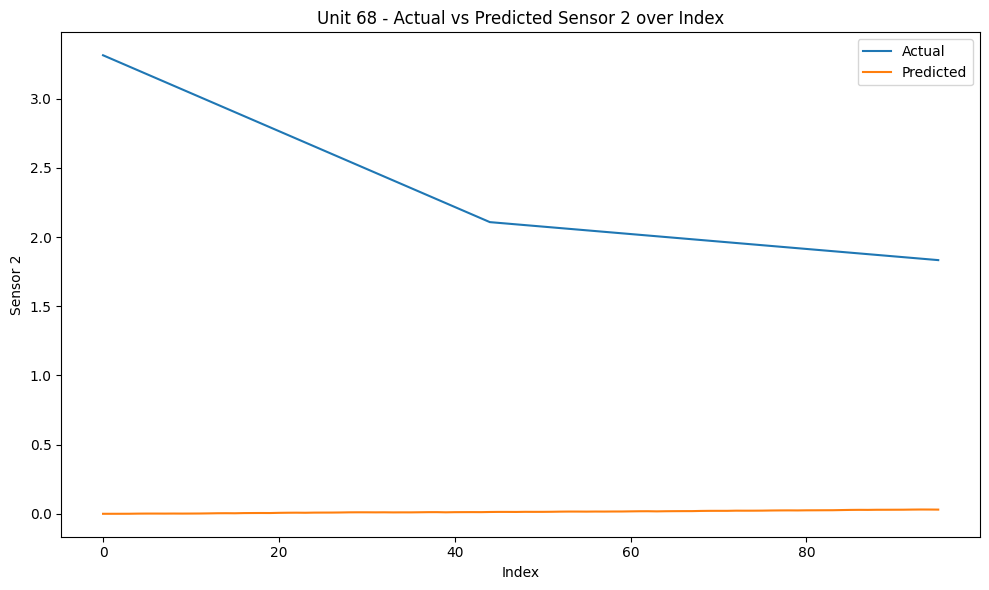

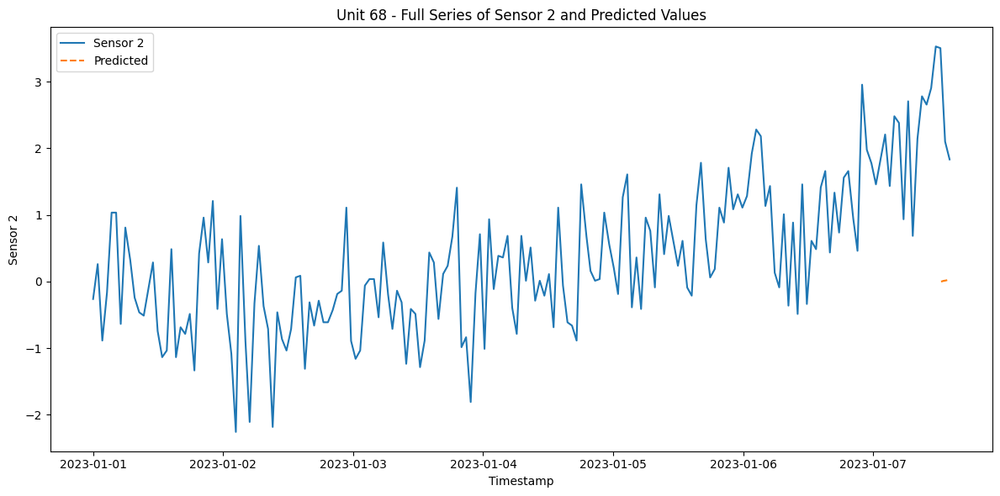

RMSE for Unit 68 - sensor_2: 2.3447025857549137
{'train': [0, 2163], 'valid': [1651, 2434], 'test': [1922, 2703]}
2104
Dataset for unit 69 is good


  0%|          | 0/11 [00:00<?, ?it/s]

96
[-1.8229064334696792, -1.7607888169708437, -1.6986712004720084, -1.636553583973173, -1.5744359674743378, -1.5123183509755025, -1.4502007344766672, -1.388083117977832, -1.3259655014789964, -1.263847884980161, -1.2017302684813258, -1.1396126519824905, -1.077495035483655, -1.0153774189848197, -0.9532598024859844, -0.8911421859871491, -0.8290245694883138, -0.7669069529894785, -0.704789336490643, -0.6426717199918077, -0.5805541034929724, -0.5184364869941371, -0.45631887049530184, -0.3942012539964663, -0.33208363749763103, -0.26996602099879574, -0.20784840449996045, -0.14573078800112516, -0.08361317150228986, -0.02149555500345457, 0.040622061495380724, 0.10273967799421646, 0.16485729449305175, 0.22697491099188705, 0.28909252749072234, 0.35121014398955763, 0.4133277604883929, 0.4754453769872282, 0.5375629934860635, 0.5996806099848988, 0.6617982264837341, 0.7239158429825694, 0.7860334594814051, 0.8481510759802404, 0.9102686924790756, 0.8843455926803444, 0.8584224928816133, 0.832499393082882

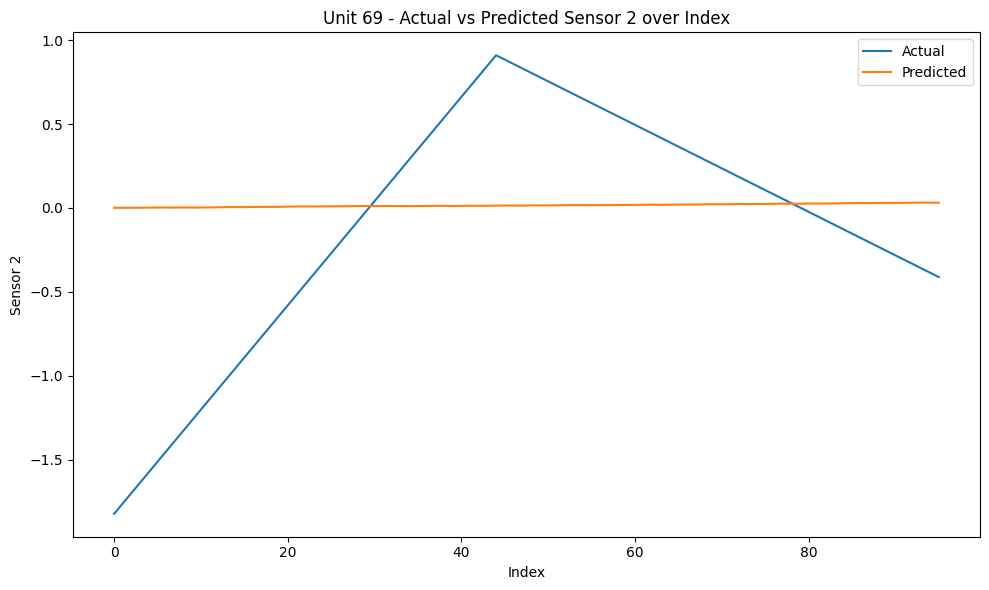

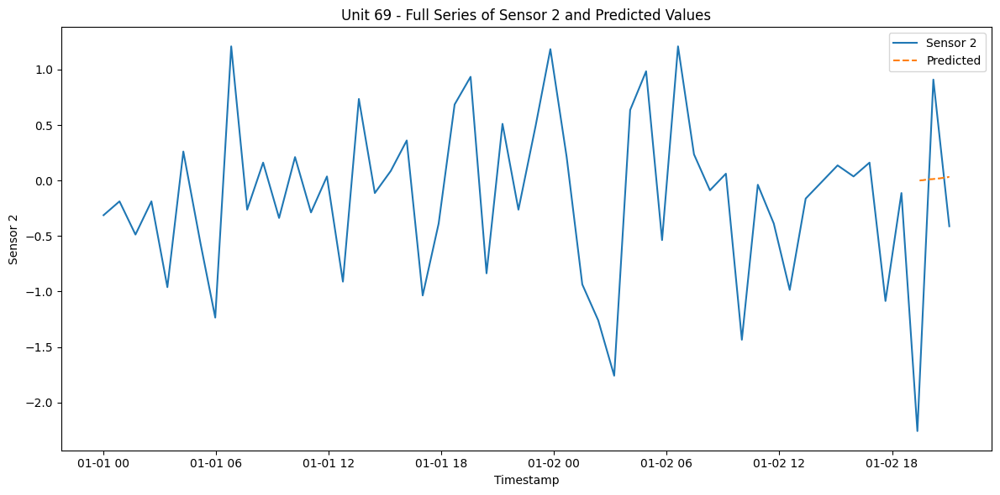

RMSE for Unit 69 - sensor_2: 0.7118931532725765
{'train': [0, 6162], 'valid': [5650, 6932], 'test': [6420, 7701]}
7102
Dataset for unit 70 is good


  0%|          | 0/74 [00:00<?, ?it/s]

96
[2.470056716217374, 2.4363077749699777, 2.402558833722581, 2.368809892475185, 2.3350609512277885, 2.3013120099803923, 2.267563068732996, 2.2338141274855996, 2.2000651862382035, 2.1663162449908073, 2.1325673037434107, 2.0988183624960146, 2.065069421248618, 2.031320480001222, 1.9975715387538255, 1.9638225975064292, 1.930073656259033, 1.8963247150116365, 1.8625757737642403, 1.828826832516844, 1.7950778912694476, 1.7613289500220513, 1.727580008774655, 1.6938310675272588, 1.6600821262798624, 1.626333185032466, 1.5925842437850697, 1.5588353025376733, 1.5250863612902772, 1.4913374200428808, 1.4575884787954845, 1.4238395375480881, 1.3900905963006918, 1.3563416550532956, 1.3225927138058993, 1.288843772558503, 1.2550948313111066, 1.2213458900637102, 1.1875969488163138, 1.1538480075689177, 1.1200990663215213, 1.086350125074125, 1.0526011838267286, 1.0188522425793323, 0.9851033013319361, 0.9772774598832654, 0.9694516184345947, 0.961625776985924, 0.9537999355372533, 0.9459740940885826, 0.9381482

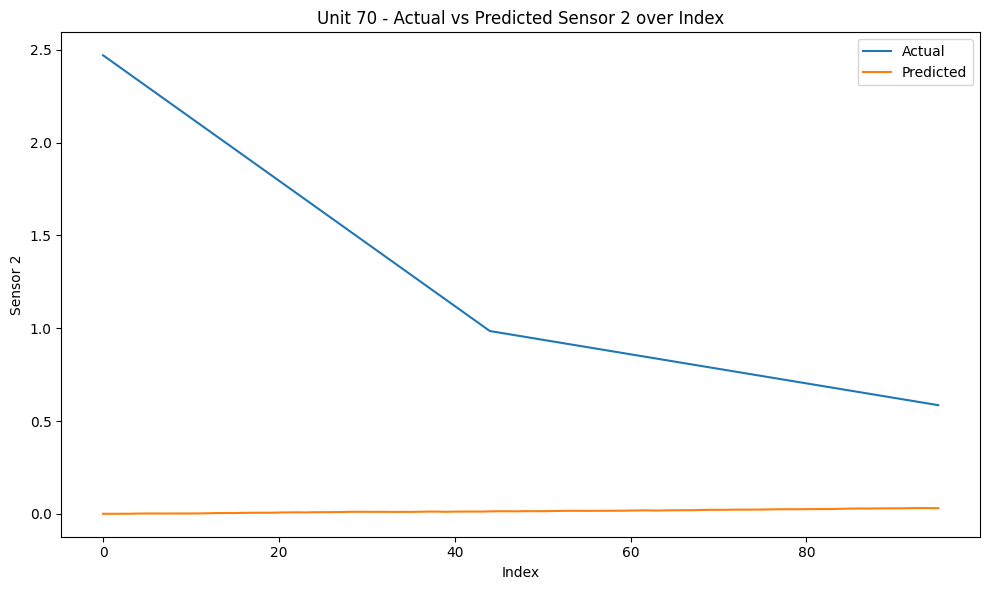

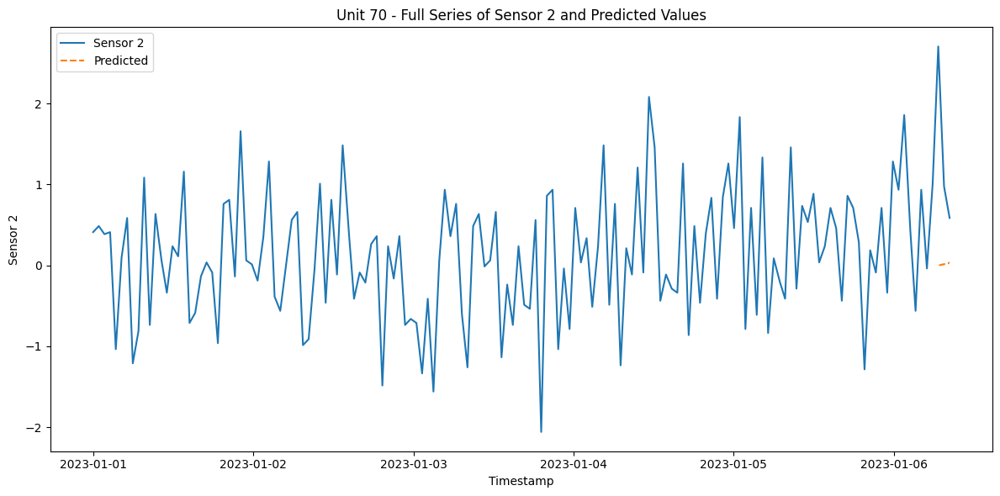

RMSE for Unit 70 - sensor_2: 1.3385986305224078
{'train': [0, 2734], 'valid': [2222, 3076], 'test': [2564, 3417]}
2818
Dataset for unit 71 is good


  0%|          | 0/20 [00:00<?, ?it/s]

96
[-0.1760559236148026, -0.2029572535946169, -0.22985858357443117, -0.2567599135542455, -0.2836612435340598, -0.3105625735138741, -0.3374639034936884, -0.3643652334735027, -0.39126656345331695, -0.41816789343313127, -0.4450692234129456, -0.47197055339275984, -0.4988718833725741, -0.5257732133523884, -0.5526745433322027, -0.579575873312017, -0.6064772032918313, -0.6333785332716456, -0.6602798632514598, -0.6871811932312741, -0.7140825232110884, -0.7409838531909028, -0.7678851831707171, -0.7947865131505313, -0.8216878431303456, -0.8485891731101599, -0.8754905030899742, -0.9023918330697885, -0.9292931630496027, -0.9561944930294171, -0.9830958230092314, -1.0099971529890457, -1.0368984829688601, -1.0637998129486743, -1.0907011429284887, -1.117602472908303, -1.1445038028881171, -1.1714051328679316, -1.1983064628477458, -1.2252077928275602, -1.2521091228073744, -1.2790104527871888, -1.305911782767003, -1.3328131127468172, -1.3597144427266317, -1.330856652384651, -1.3019988620426706, -1.273141

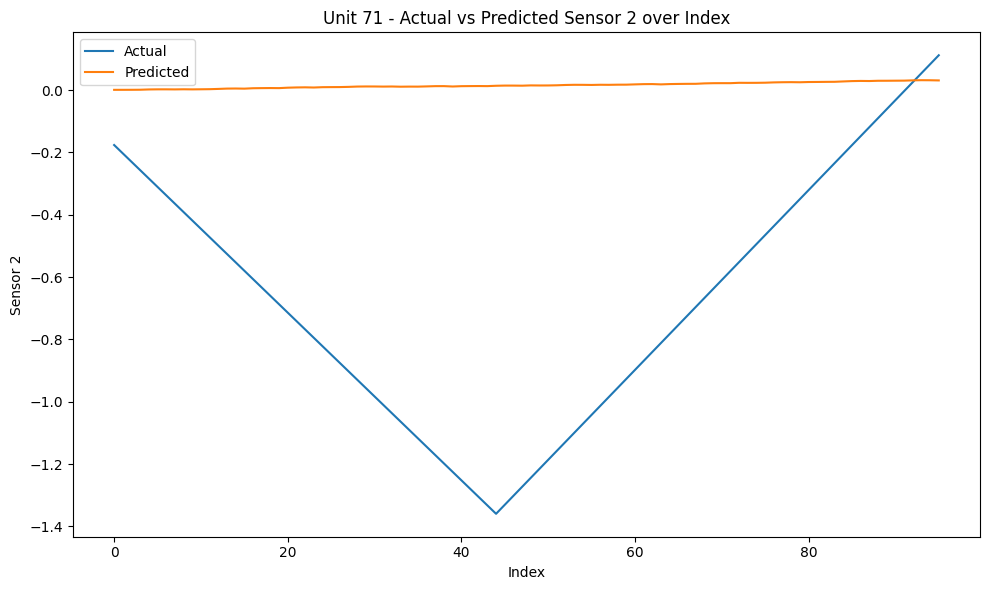

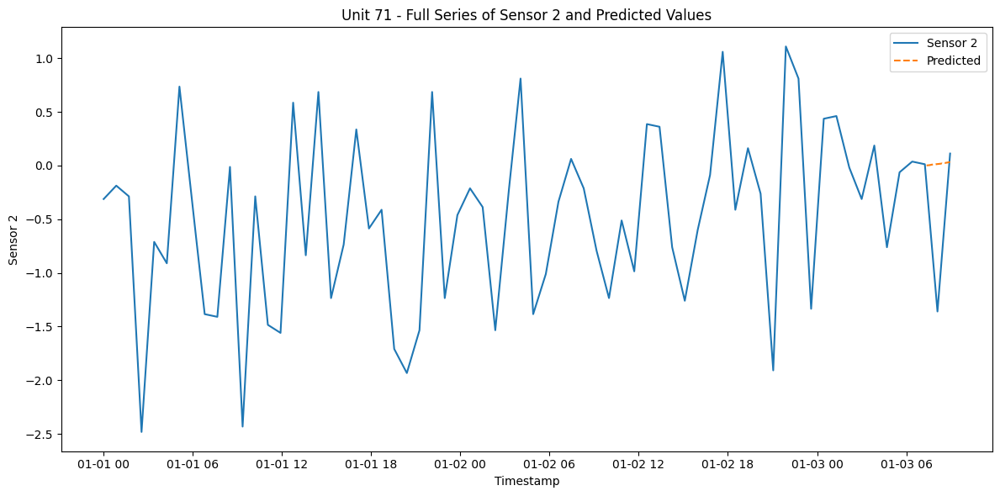

RMSE for Unit 71 - sensor_2: 0.8039112671725162
{'train': [0, 5305], 'valid': [4793, 5968], 'test': [5456, 6630]}
6031
Dataset for unit 72 is good


  0%|          | 0/60 [00:00<?, ?it/s]

96
[-0.8006558942370192, -0.7492988097301095, -0.6979417252231999, -0.6465846407162903, -0.5952275562093807, -0.5438704717024712, -0.4925133871955615, -0.4411563026886519, -0.38979921818174224, -0.33844213367483267, -0.2870850491679231, -0.23572796466101342, -0.18437088015410386, -0.13301379564719418, -0.08165671114028461, -0.030299626633375043, 0.021057457873534524, 0.07241454238044409, 0.12377162688735388, 0.17512871139426345, 0.22648579590117301, 0.2778428804080826, 0.32919996491499215, 0.38055704942190194, 0.4319141339288115, 0.4832712184357211, 0.5346283029426306, 0.5859853874495402, 0.63734247195645, 0.6886995564633596, 0.7400566409702691, 0.7914137254771787, 0.8427708099840883, 0.894127894490998, 0.9454849789979074, 0.9968420635048172, 1.048199148011727, 1.0995562325186363, 1.1509133170255461, 1.2022704015324555, 1.2536274860393652, 1.3049845705462746, 1.3563416550531844, 1.4076987395600942, 1.4590558240670037, 1.451229982618333, 1.4434041411696623, 1.4355782997209916, 1.4277524

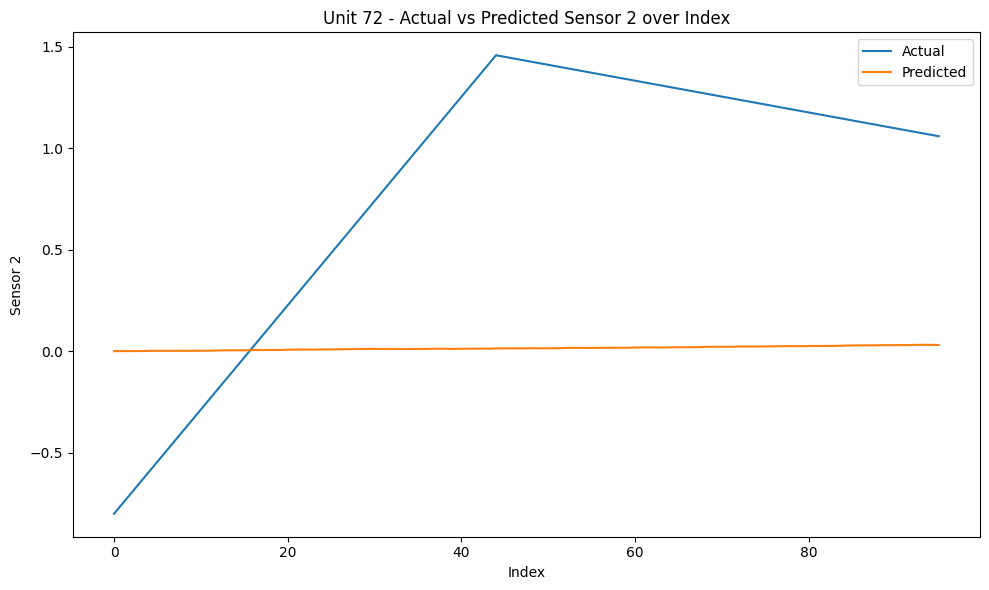

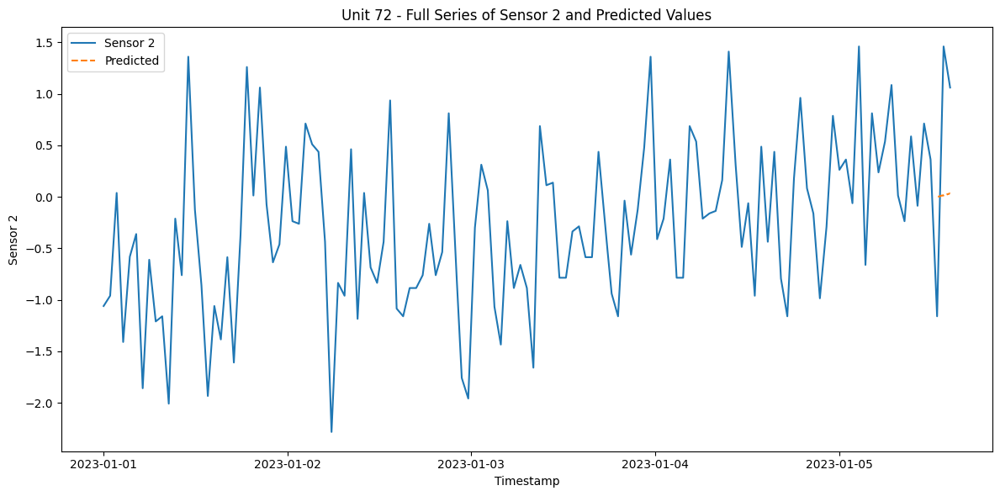

RMSE for Unit 72 - sensor_2: 1.0342655295136047
{'train': [0, 4530], 'valid': [4018, 5096], 'test': [4584, 5661]}
5062
Dataset for unit 73 is good


  0%|          | 0/48 [00:00<?, ?it/s]

96
[0.6490812341296422, 0.6153322928822405, 0.5815833516348385, 0.5478344103874366, 0.5140854691400347, 0.4803365278926329, 0.446587586645231, 0.41283864539782916, 0.3790897041504273, 0.3453407629030254, 0.3115918216556235, 0.2778428804082217, 0.24409393916081978, 0.21034499791341787, 0.17659605666601608, 0.14284711541861417, 0.10909817417121226, 0.07534923292381046, 0.04160029167640855, 0.007851350429006643, -0.025897590818395266, -0.059646532065797064, -0.09339547331319897, -0.12714441456060077, -0.16089335580800268, -0.1946422970554046, -0.2283912383028065, -0.2621401795502084, -0.2958891207976103, -0.329638062045012, -0.3633870032924139, -0.3971359445398158, -0.43088488578721773, -0.46463382703461964, -0.49838276828202155, -0.5321317095294232, -0.5658806507768251, -0.599629592024227, -0.633378533271629, -0.6671274745190309, -0.7008764157664328, -0.7346253570138345, -0.7683742982612364, -0.8021232395086383, -0.8358721807560403, -0.8295136845789943, -0.8231551884019483, -0.8167966922

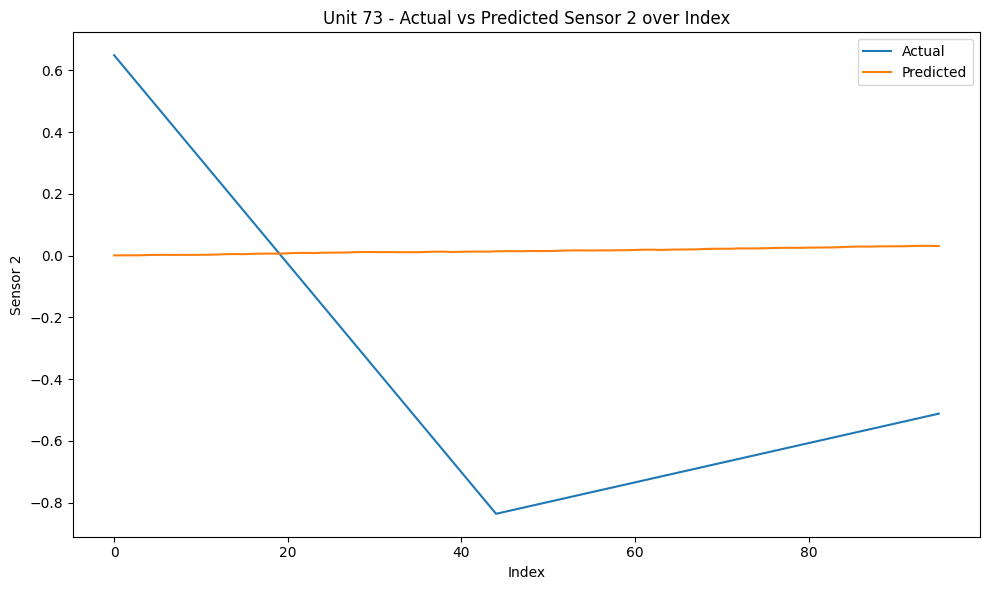

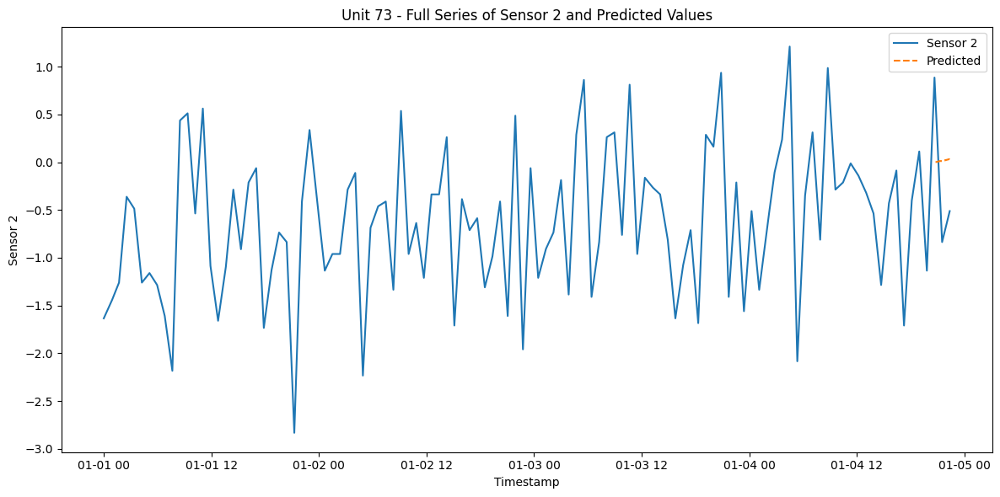

RMSE for Unit 73 - sensor_2: 0.596610981824578
{'train': [0, 5550], 'valid': [5038, 6243], 'test': [5731, 6936]}
6337
Dataset for unit 74 is good


  0%|          | 0/64 [00:00<?, ?it/s]

96
[0.7297852240690684, 0.7503280578718312, 0.7708708916745939, 0.7914137254773566, 0.8119565592801193, 0.8324993930828821, 0.8530422268856448, 0.8735850606884076, 0.8941278944911704, 0.914670728293933, 0.9352135620966957, 0.9557563958994585, 0.9762992297022213, 0.9968420635049839, 1.0173848973077466, 1.0379277311105095, 1.0584705649132722, 1.0790133987160349, 1.0995562325187977, 1.1200990663215604, 1.140641900124323, 1.1611847339270858, 1.1817275677298484, 1.2022704015326113, 1.222813235335374, 1.243356069138137, 1.2638989029408996, 1.2844417367436622, 1.304984570546425, 1.3255274043491876, 1.3460702381519505, 1.3666130719547132, 1.387155905757476, 1.4076987395602387, 1.4282415733630014, 1.448784407165764, 1.4693272409685267, 1.4898700747712896, 1.5104129085740523, 1.5309557423768152, 1.5514985761795779, 1.5720414099823405, 1.5925842437851032, 1.6131270775878659, 1.6336699113906288, 1.6082359266824449, 1.5828019419742607, 1.5573679572660768, 1.5319339725578927, 1.5064999878497087, 1.4

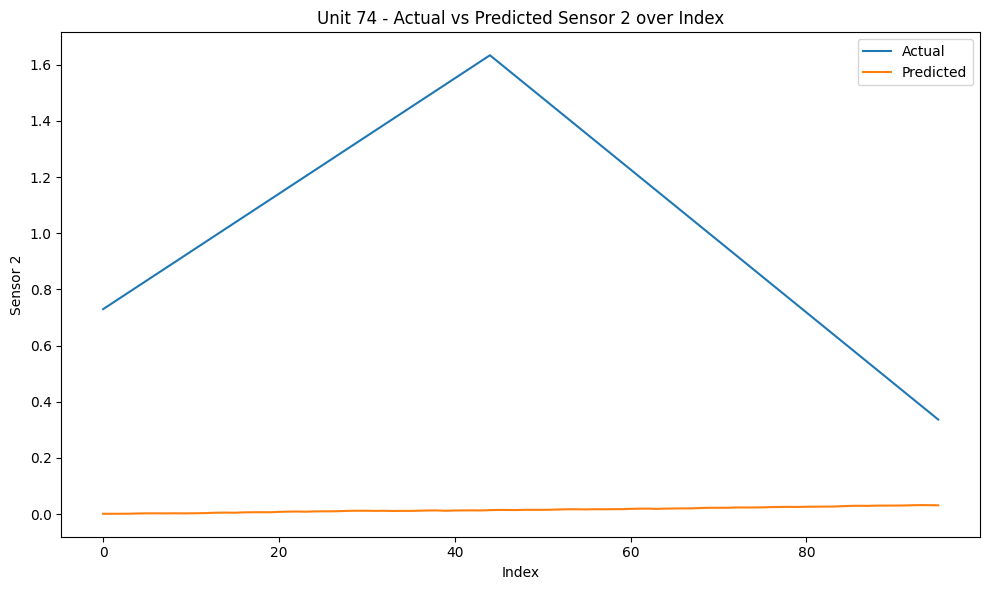

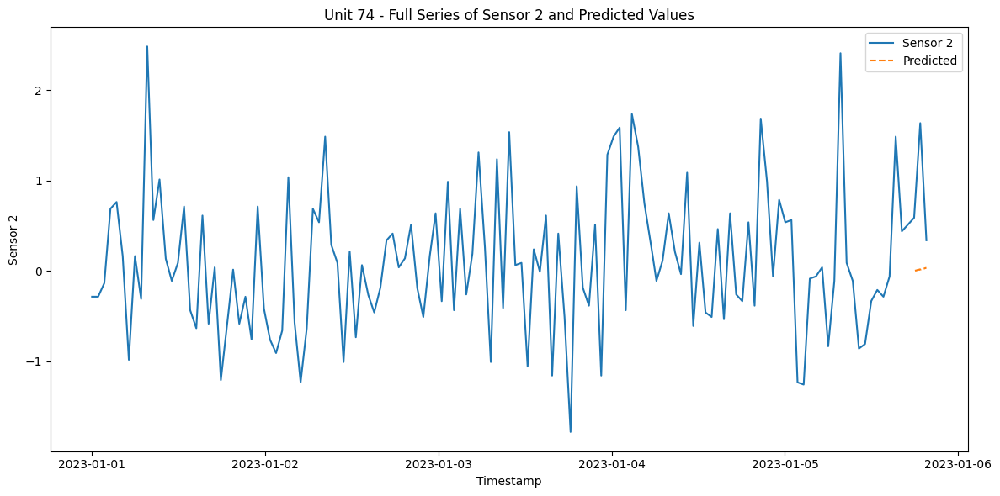

RMSE for Unit 74 - sensor_2: 1.1109172570420347
{'train': [0, 3550], 'valid': [3038, 3994], 'test': [3482, 4437]}
3838
Dataset for unit 75 is good


  0%|          | 0/33 [00:00<?, ?it/s]

96
[-0.0009527212007138797, -0.042038388806244886, -0.08312405641177589, -0.1242097240173069, -0.16529539162283796, -0.20638105922836897, -0.24746672683390003, -0.28855239443943104, -0.32963806204496204, -0.37072372965049305, -0.41180939725602406, -0.45289506486155506, -0.49398073246708607, -0.5350664000726171, -0.5761520676781482, -0.6172377352836792, -0.6583234028892102, -0.6994090704947412, -0.7404947381002722, -0.7815804057058033, -0.8226660733113342, -0.8637517409168654, -0.9048374085223962, -0.9459230761279274, -0.9870087437334583, -1.0280944113389894, -1.0691800789445205, -1.1102657465500514, -1.1513514141555825, -1.1924370817611134, -1.2335227493666445, -1.2746084169721754, -1.3156940845777065, -1.3567797521832374, -1.3978654197887685, -1.4389510873942997, -1.4800367549998306, -1.5211224226053617, -1.5622080902108926, -1.6032937578164237, -1.6443794254219546, -1.6854650930274857, -1.7265507606330166, -1.7676364282385477, -1.808722095844079, -1.7901357224034826, -1.7715493489628

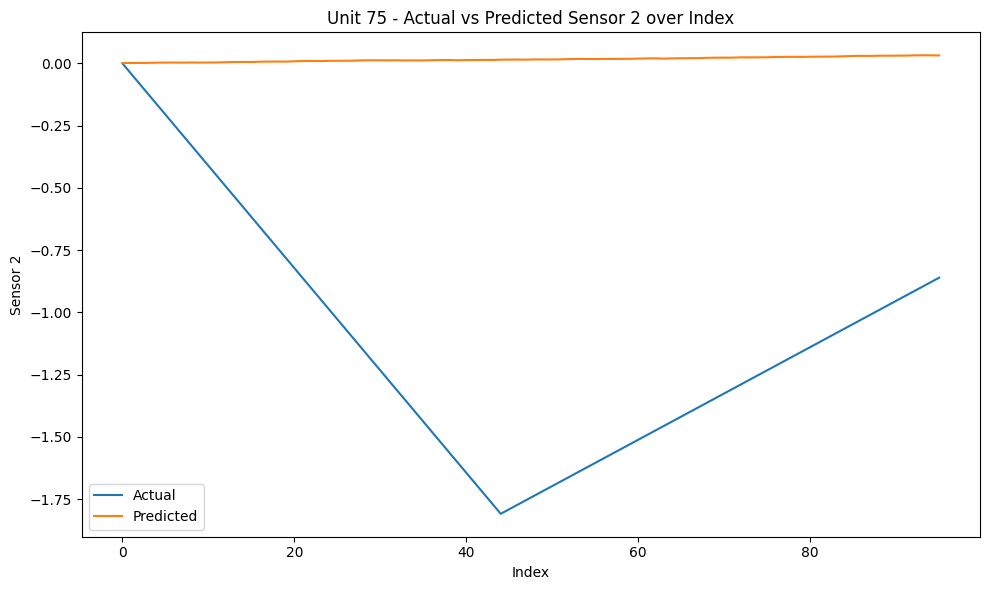

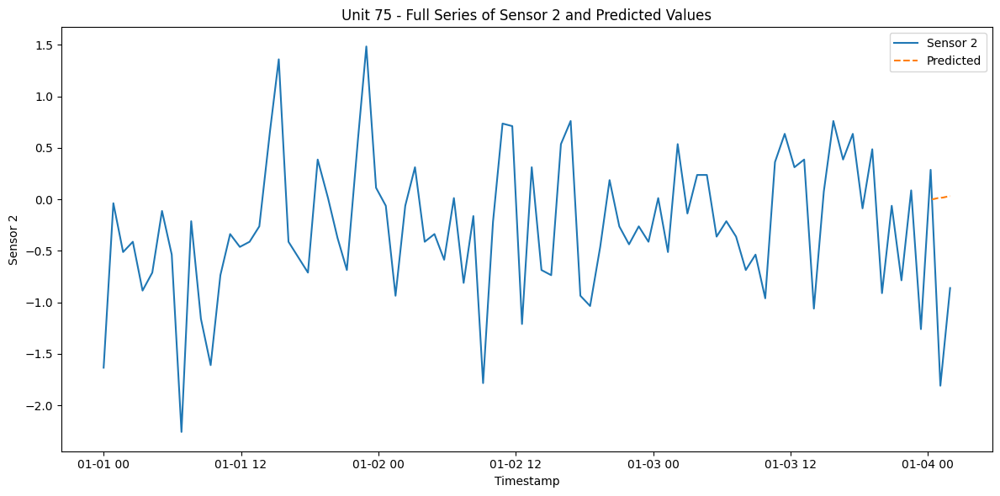

RMSE for Unit 75 - sensor_2: 1.2367976302728965
{'train': [0, 8324], 'valid': [7812, 9364], 'test': [8852, 10404]}
9805
Dataset for unit 76 is good


  0%|          | 0/108 [00:00<?, ?it/s]

96
[2.2499549254735274, 2.2881059025358033, 2.3262568795980796, 2.3644078566603555, 2.4025588337226313, 2.4407098107849077, 2.4788607878471836, 2.5170117649094594, 2.5551627419717358, 2.5933137190340116, 2.6314646960962875, 2.669615673158564, 2.7077666502208397, 2.7459176272831156, 2.784068604345392, 2.822219581407668, 2.8603705584699437, 2.89852153553222, 2.936672512594496, 2.974823489656772, 3.012974466719048, 3.0511254437813236, 3.0892764208436, 3.127427397905876, 3.1655783749681516, 3.203729352030428, 3.2418803290927043, 3.2800313061549797, 3.318182283217256, 3.3563332602795324, 3.394484237341808, 3.432635214404084, 3.4707861914663605, 3.508937168528636, 3.5470881455909122, 3.5852391226531886, 3.623390099715464, 3.6615410767777403, 3.6996920538400166, 3.737843030902292, 3.7759940079645684, 3.8141449850268447, 3.85229596208912, 3.8904469391513965, 3.9285979162136724, 3.8840884429743503, 3.839578969735028, 3.795069496495706, 3.7505600232563845, 3.7060505500170624, 3.6615410767777403,

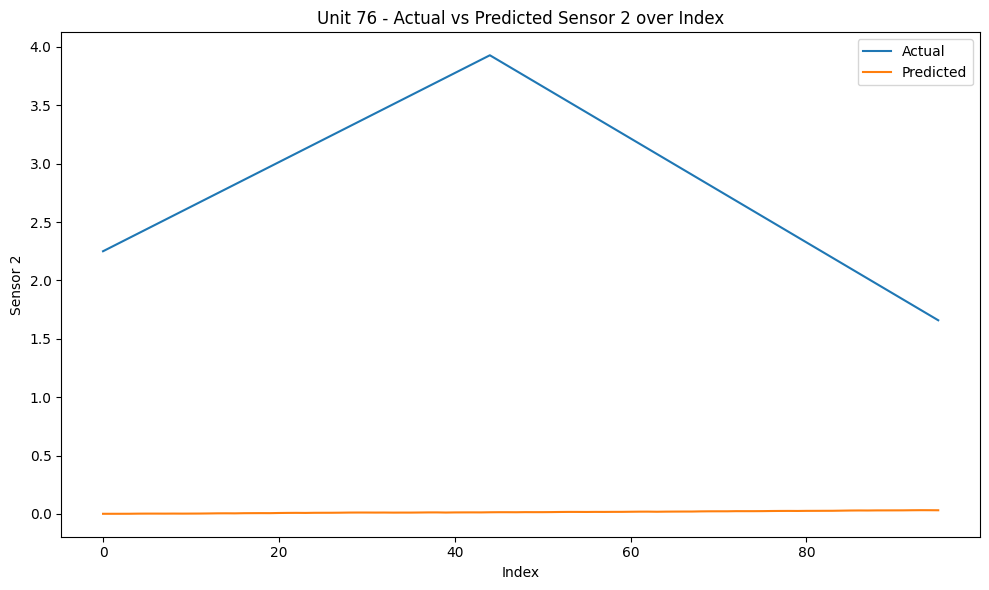

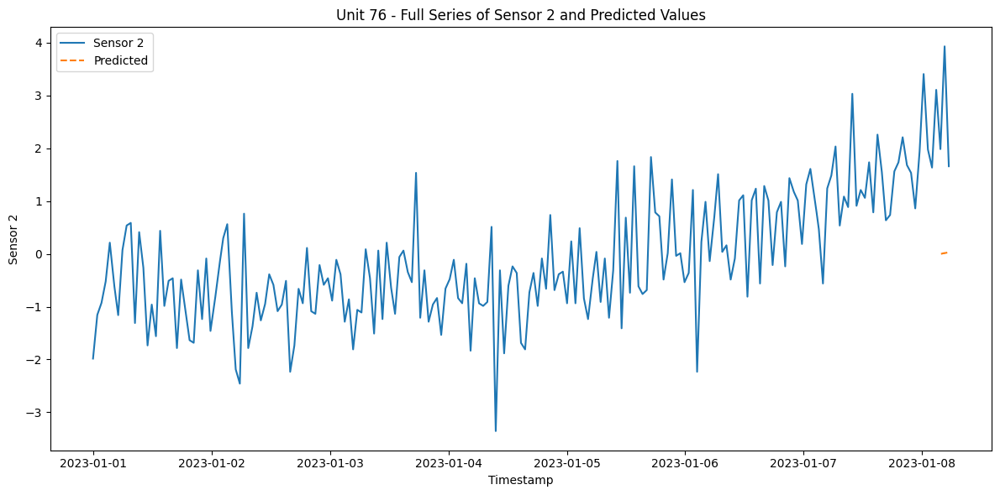

RMSE for Unit 76 - sensor_2: 2.968122208189708
{'train': [0, 6570], 'valid': [6058, 7391], 'test': [6879, 8211]}
7612
Dataset for unit 77 is good


  0%|          | 0/80 [00:00<?, ?it/s]

96
[2.1985978409665954, 2.1795223524354577, 2.1604468639043195, 2.1413713753731813, 2.1222958868420436, 2.1032203983109055, 2.0841449097797673, 2.0650694212486296, 2.0459939327174914, 2.0269184441863533, 2.0078429556552155, 1.9887674671240774, 1.9696919785929394, 1.9506164900618015, 1.9315410015306633, 1.9124655129995254, 1.8933900244683874, 1.8743145359372493, 1.8552390474061113, 1.8361635588749734, 1.8170880703438352, 1.7980125818126973, 1.7789370932815594, 1.7598616047504212, 1.7407861162192833, 1.7217106276881453, 1.7026351391570071, 1.6835596506258692, 1.6644841620947313, 1.645408673563593, 1.6263331850324552, 1.6072576965013172, 1.588182207970179, 1.5691067194390411, 1.5500312309079032, 1.530955742376765, 1.511880253845627, 1.4928047653144891, 1.473729276783351, 1.454653788252213, 1.435578299721075, 1.416502811189937, 1.397427322658799, 1.378351834127661, 1.3592763455965229, 1.3480266985140557, 1.3367770514315882, 1.325527404349121, 1.3142777572666537, 1.3030281101841865, 1.29177

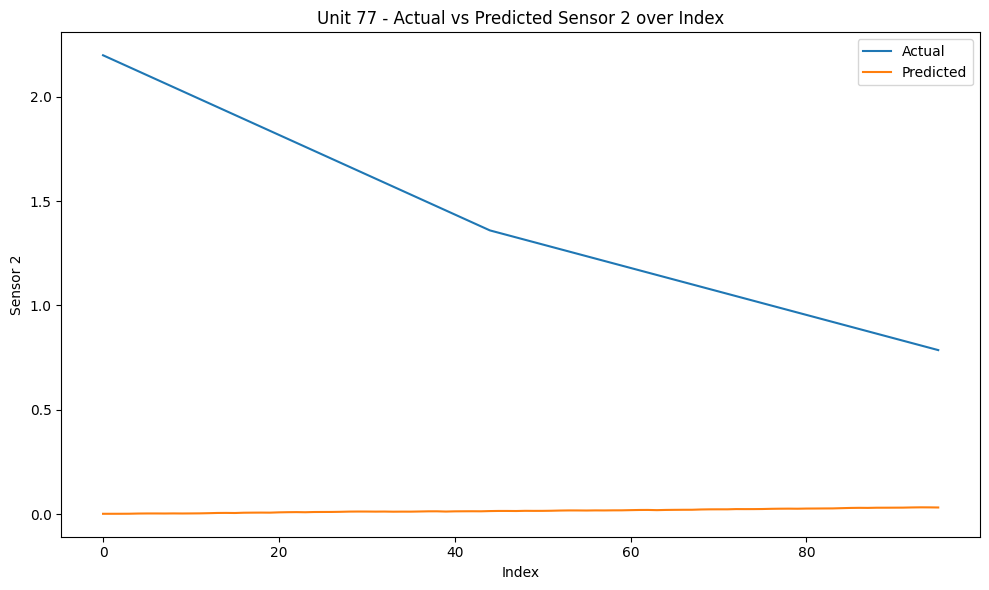

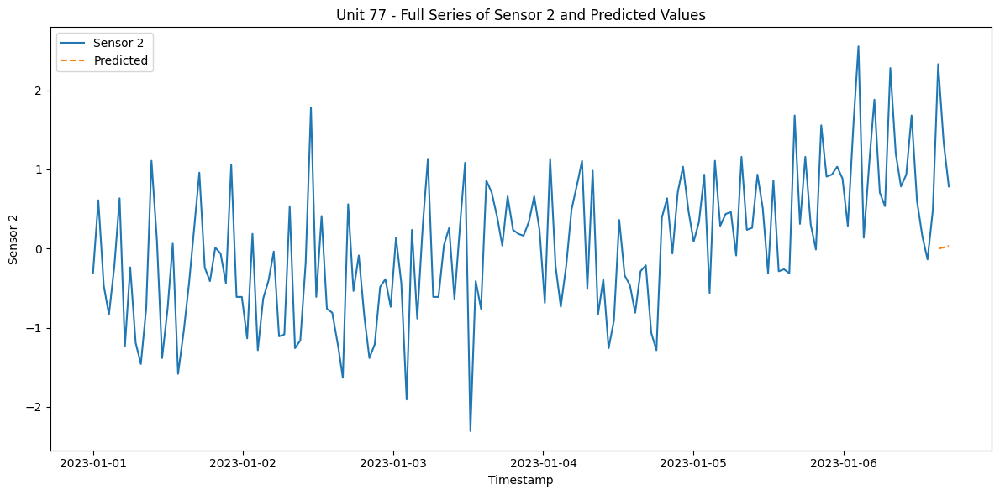

RMSE for Unit 77 - sensor_2: 1.4473539424062911
{'train': [0, 2898], 'valid': [2386, 3260], 'test': [2748, 3621]}
3022
Dataset for unit 78 is good


  0%|          | 0/23 [00:00<?, ?it/s]

96
[-0.2063810592283412, -0.2269238930311095, -0.24746672683387777, -0.2680095606366461, -0.2885523944394144, -0.30909522824218266, -0.32963806204495094, -0.3501808958477193, -0.37072372965048755, -0.39126656345325583, -0.4118093972560241, -0.4323522310587924, -0.4528950648615607, -0.473437898664329, -0.4939807324670973, -0.5145235662698656, -0.535066400072634, -0.5556092338754022, -0.5761520676781705, -0.5966949014809387, -0.6172377352837071, -0.6377805690864754, -0.6583234028892436, -0.678866236692012, -0.6994090704947802, -0.7199519042975485, -0.7404947381003169, -0.7610375719030851, -0.7815804057058534, -0.8021232395086216, -0.82266607331139, -0.8432089071141583, -0.8637517409169265, -0.8842945747196949, -0.9048374085224632, -0.9253802423252314, -0.9459230761279998, -0.9664659099307681, -0.9870087437335363, -1.0075515775363046, -1.0280944113390729, -1.0486372451418413, -1.0691800789446095, -1.089722912747378, -1.1102657465501462, -1.1224936238136967, -1.1347215010772471, -1.1469493

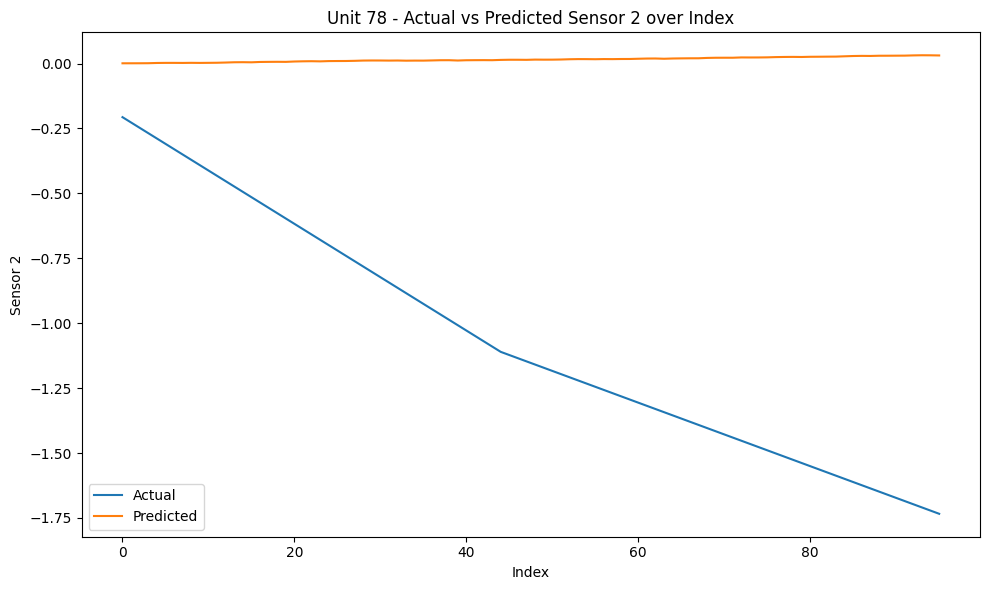

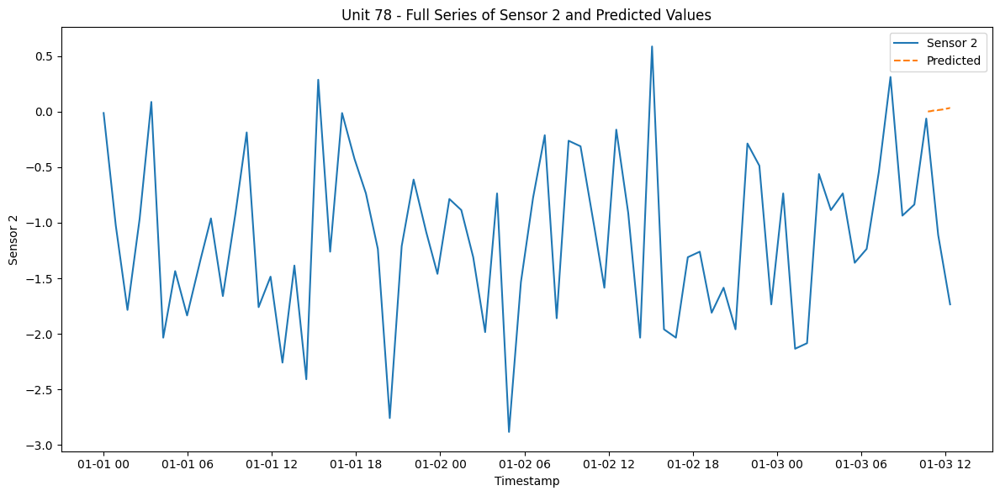

RMSE for Unit 78 - sensor_2: 1.1742708649687357
{'train': [0, 4081], 'valid': [3569, 4591], 'test': [4079, 5100]}
4501
Dataset for unit 79 is good


  0%|          | 0/41 [00:00<?, ?it/s]

96
[-0.13203556546603332, -0.11344919202543688, -0.09486281858484044, -0.076276445144244, -0.057690071703647566, -0.0391036982630511, -0.020517324822454663, -0.0019309513818582258, 0.016655422058738212, 0.03524179549933465, 0.05382816893993109, 0.07241454238052752, 0.09100091582112396, 0.1095872892617204, 0.12817366270231684, 0.14676003614291327, 0.1653464095835097, 0.1839327830241062, 0.20251915646470264, 0.22110552990529908, 0.23969190334589552, 0.25827827678649196, 0.2768646502270884, 0.29545102366768483, 0.31403739710828127, 0.3326237705488777, 0.35121014398947414, 0.3697965174300706, 0.388382890870667, 0.40696926431126346, 0.4255556377518599, 0.44414201119245633, 0.46272838463305277, 0.4813147580736492, 0.49990113151424564, 0.5184875049548421, 0.5370738783954385, 0.555660251836035, 0.5742466252766314, 0.5928329987172278, 0.6114193721578243, 0.6300057455984208, 0.6485921190390173, 0.6671784924796137, 0.6857648659202101, 0.6701131830228632, 0.6544615001255161, 0.6388098172281691, 0.

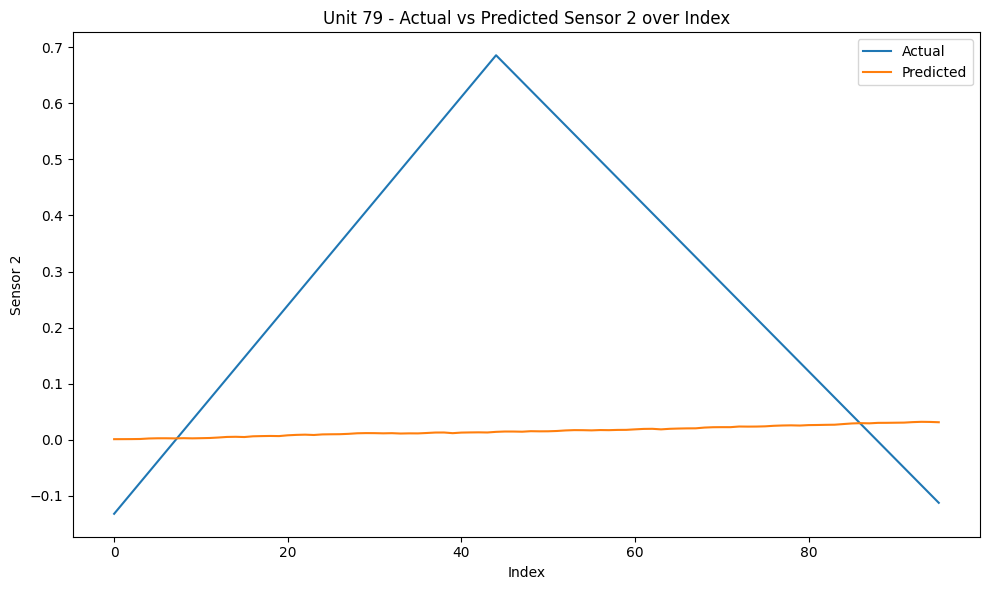

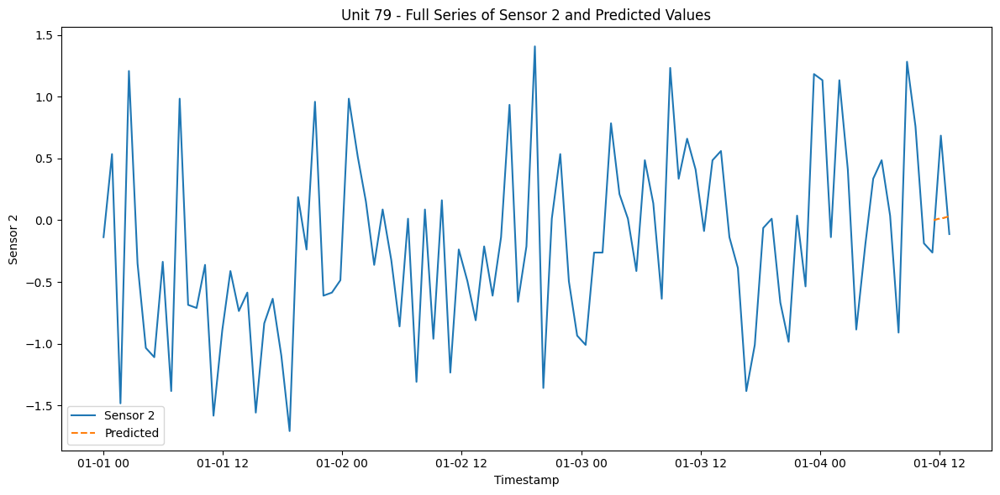

RMSE for Unit 79 - sensor_2: 0.3531763437325577
{'train': [0, 5386], 'valid': [4874, 6060], 'test': [5548, 6732]}
6133
Dataset for unit 80 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[-0.11198184675386774, -0.10122131476194202, -0.09046078277001629, -0.07970025077809058, -0.06893971878616487, -0.05817918679423914, -0.047418654802313415, -0.03665812281038772, -0.02589759081846199, -0.015137058826536265, -0.004376526834610539, 0.006384005157315187, 0.017144537149240885, 0.02790506914116661, 0.03866560113309234, 0.049426133125018035, 0.06018666511694376, 0.07094719710886949, 0.08170772910079521, 0.09246826109272094, 0.10322879308464666, 0.11398932507657233, 0.12474985706849806, 0.13551038906042379, 0.1462709210523495, 0.15703145304427524, 0.16779198503620096, 0.1785525170281267, 0.18931304902005242, 0.20007358101197814, 0.2108341130039038, 0.22159464499582954, 0.23235517698775526, 0.243115708979681, 0.2538762409716067, 0.26463677296353244, 0.27539730495545817, 0.28615783694738384, 0.29691836893930956, 0.3076789009312353, 0.318439432923161, 0.32919996491508674, 0.33996049690701247, 0.3507210288989382, 0.3614815608908639, 0.36245979107194704, 0.3634380212530302, 0.36

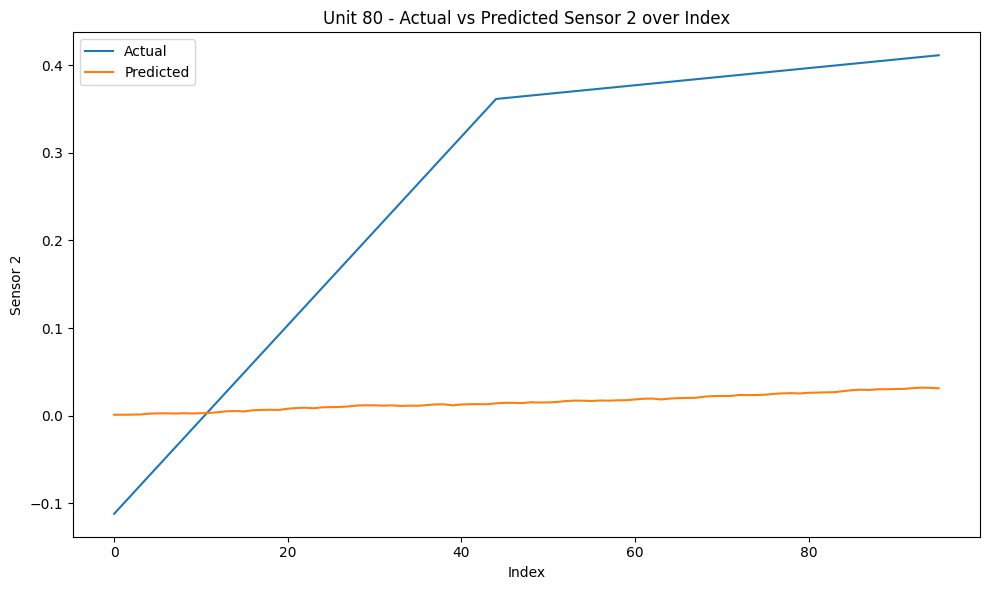

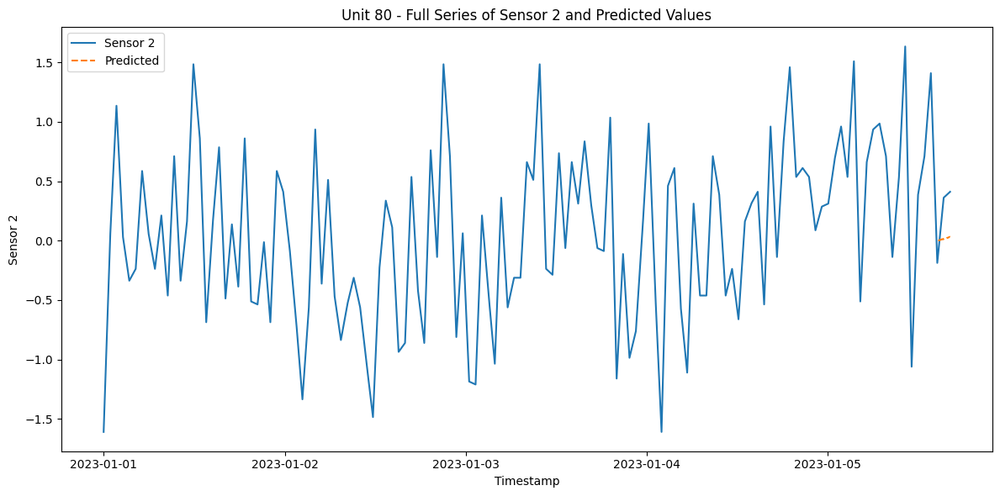

RMSE for Unit 80 - sensor_2: 0.2925277080352907
{'train': [0, 8650], 'valid': [8138, 9732], 'test': [9220, 10812]}
10213
Dataset for unit 81 is good


  0%|          | 0/113 [00:00<?, ?it/s]

96
[2.4656546804026553, 2.459785299316151, 2.4539159182296464, 2.448046537143142, 2.442177156056638, 2.436307774970133, 2.430438393883629, 2.4245690127971242, 2.41869963171062, 2.4128302506241157, 2.406960869537611, 2.4010914884511068, 2.3952221073646025, 2.389352726278098, 2.3834833451915935, 2.377613964105089, 2.3717445830185846, 2.3658752019320803, 2.3600058208455756, 2.3541364397590714, 2.3482670586725667, 2.3423976775860624, 2.336528296499558, 2.3306589154130535, 2.3247895343265492, 2.3189201532400445, 2.3130507721535403, 2.307181391067036, 2.3013120099805313, 2.295442628894027, 2.289573247807523, 2.283703866721018, 2.277834485634514, 2.271965104548009, 2.266095723461505, 2.2602263423750006, 2.254356961288496, 2.2484875802019917, 2.242618199115487, 2.2367488180289827, 2.2308794369424785, 2.225010055855974, 2.2191406747694695, 2.213271293682965, 2.2074019125964606, 2.2137604087735068, 2.2201189049505525, 2.2264774011275987, 2.2328358973046445, 2.2391943934816907, 2.2455528896587365

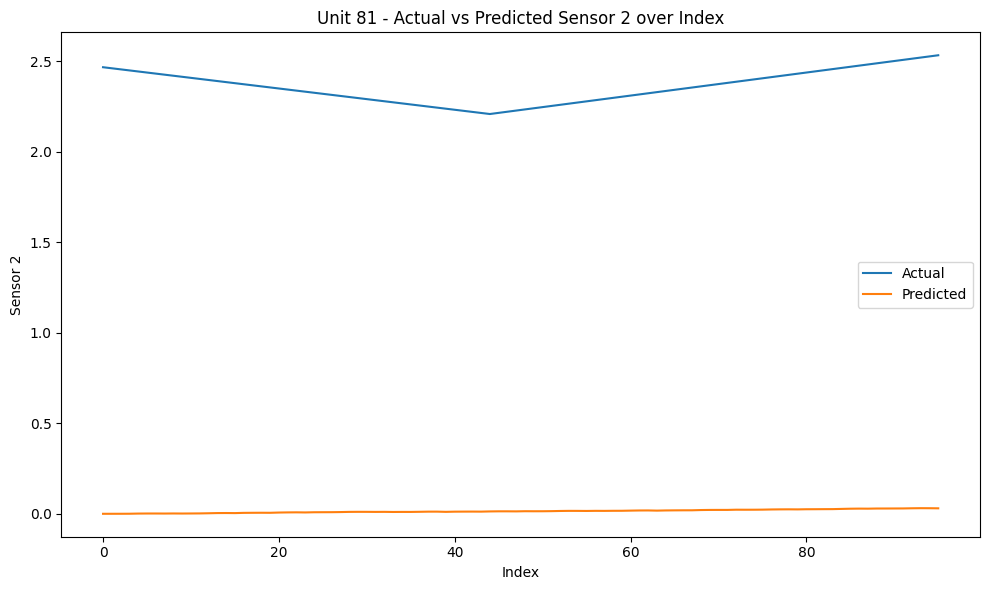

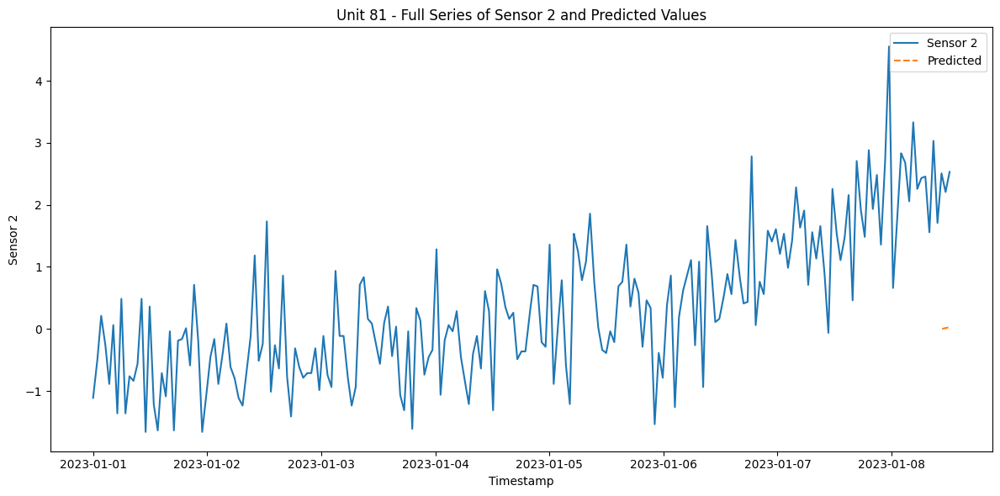

RMSE for Unit 81 - sensor_2: 2.341608580057925
{'train': [0, 6570], 'valid': [6058, 7391], 'test': [6879, 8211]}
7612
Dataset for unit 82 is good


  0%|          | 0/80 [00:00<?, ?it/s]

96
[2.784557719435928, 2.760101964908827, 2.7356462103817263, 2.7111904558546254, 2.6867347013275245, 2.6622789468004235, 2.6378231922733226, 2.6133674377462217, 2.588911683219121, 2.56445592869202, 2.540000174164919, 2.515544419637818, 2.491088665110717, 2.4666329105836162, 2.4421771560565158, 2.417721401529415, 2.393265647002314, 2.368809892475213, 2.344354137948112, 2.319898383421011, 2.2954426288939103, 2.2709868743668093, 2.2465311198397084, 2.2220753653126075, 2.197619610785507, 2.173163856258406, 2.148708101731305, 2.1242523472042043, 2.0997965926771034, 2.0753408381500025, 2.0508850836229016, 2.0264293290958006, 2.0019735745686997, 1.9775178200415988, 1.953062065514498, 1.9286063109873972, 1.9041505564602963, 1.8796948019331954, 1.8552390474060945, 1.8307832928789936, 1.8063275383518926, 1.781871783824792, 1.757416029297691, 1.7329602747705901, 1.7085045202434892, 1.728558238955716, 1.7486119576679426, 1.7686656763801694, 1.788719395092396, 1.8087731138046228, 1.828826832516849

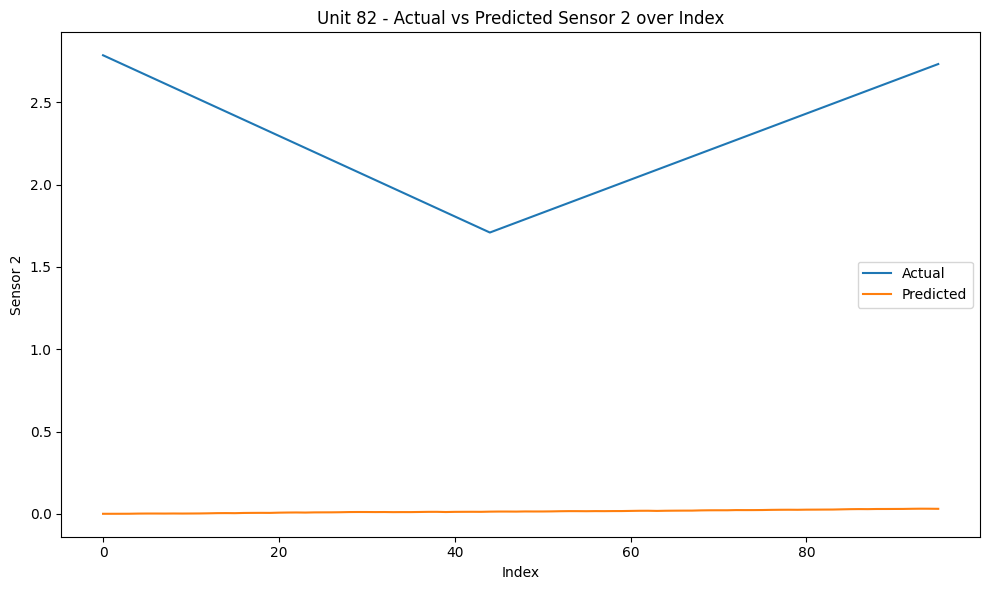

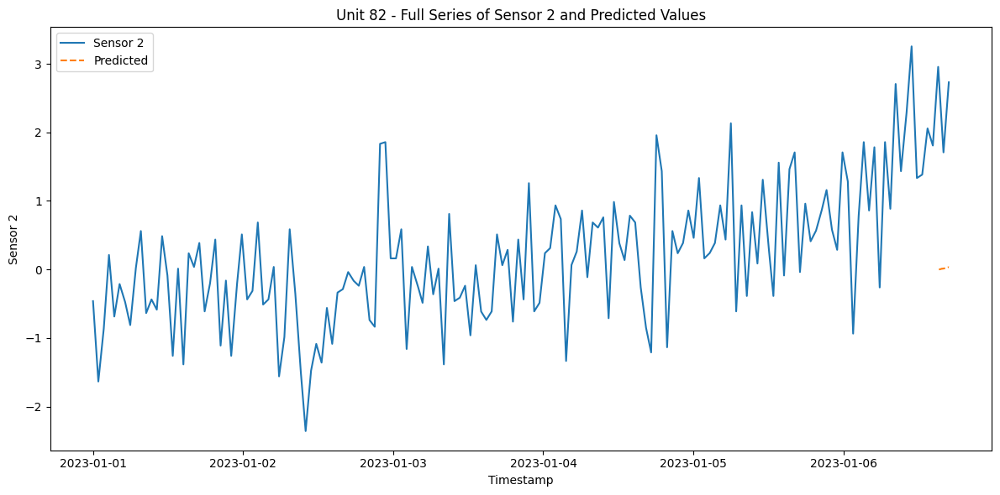

RMSE for Unit 82 - sensor_2: 2.2429051277548715
{'train': [0, 2938], 'valid': [2426, 3306], 'test': [2794, 3672]}
3073
Dataset for unit 83 is good


  0%|          | 0/23 [00:00<?, ?it/s]

96
[-0.08312405641183712, -0.06111387733744411, -0.0391036982630511, -0.01709351918865809, 0.00491665988573492, 0.02692683896012793, 0.04893701803452094, 0.07094719710891395, 0.09295737618330696, 0.11496755525769997, 0.13697773433209298, 0.158987913406486, 0.180998092480879, 0.203008271555272, 0.22501845062966502, 0.24702862970405803, 0.2690388087784511, 0.29104898785284405, 0.313059166927237, 0.3350693460016301, 0.35707952507602314, 0.3790897041504161, 0.40109988322480905, 0.4231100622992021, 0.4451202413735952, 0.46713042044798814, 0.4891405995223811, 0.5111507785967742, 0.5331609576711672, 0.5551711367455602, 0.5771813158199531, 0.5991914948943462, 0.6212016739687393, 0.6432118530431322, 0.6652220321175252, 0.6872322111919182, 0.7092423902663113, 0.7312525693407043, 0.7532627484150972, 0.7752729274894904, 0.7972831065638833, 0.8192932856382763, 0.8413034647126693, 0.8633136437870622, 0.8853238228614554, 0.8843455926803667, 0.8833673624992779, 0.8823891323181893, 0.8814109021371006, 

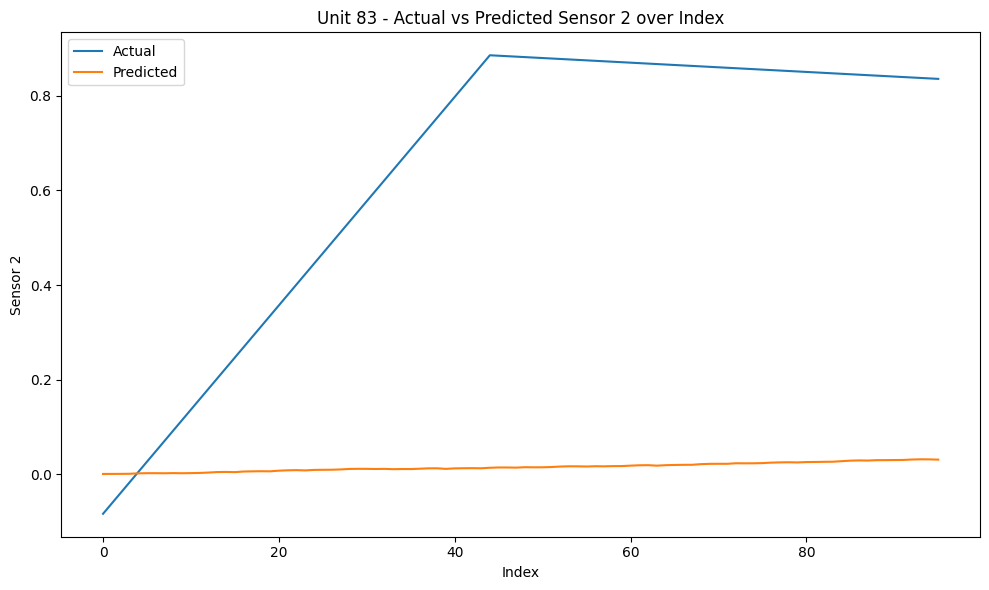

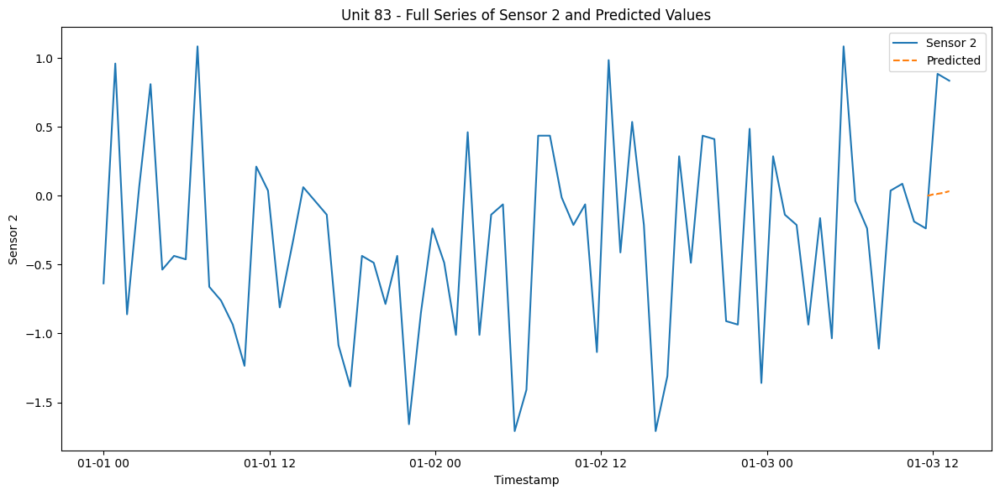

RMSE for Unit 83 - sensor_2: 0.6944917256568945
{'train': [0, 6978], 'valid': [6466, 7850], 'test': [7338, 8721]}
8122
Dataset for unit 84 is good


  0%|          | 0/87 [00:00<?, ?it/s]

96
[0.8271191270869304, 0.8188041705477125, 0.8104892140084947, 0.8021742574692768, 0.793859300930059, 0.7855443443908411, 0.7772293878516232, 0.7689144313124054, 0.7605994747731876, 0.7522845182339697, 0.7439695616947518, 0.7356546051555339, 0.7273396486163162, 0.7190246920770983, 0.7107097355378804, 0.7023947789986625, 0.6940798224594447, 0.6857648659202269, 0.677449909381009, 0.6691349528417911, 0.6608199963025733, 0.6525050397633554, 0.6441900832241376, 0.6358751266849196, 0.6275601701457019, 0.619245213606484, 0.6109302570672661, 0.6026153005280483, 0.5943003439888304, 0.5859853874496126, 0.5776704309103947, 0.5693554743711768, 0.5610405178319591, 0.5527255612927411, 0.5444106047535233, 0.5360956482143054, 0.5277806916750876, 0.5194657351358697, 0.5111507785966518, 0.502835822057434, 0.49452086551821617, 0.4862059089789983, 0.4778909524397804, 0.4695759959005626, 0.4612610393613447, 0.49696644097091286, 0.5326718425804811, 0.5683772441900492, 0.6040826457996173, 0.6397880474091855

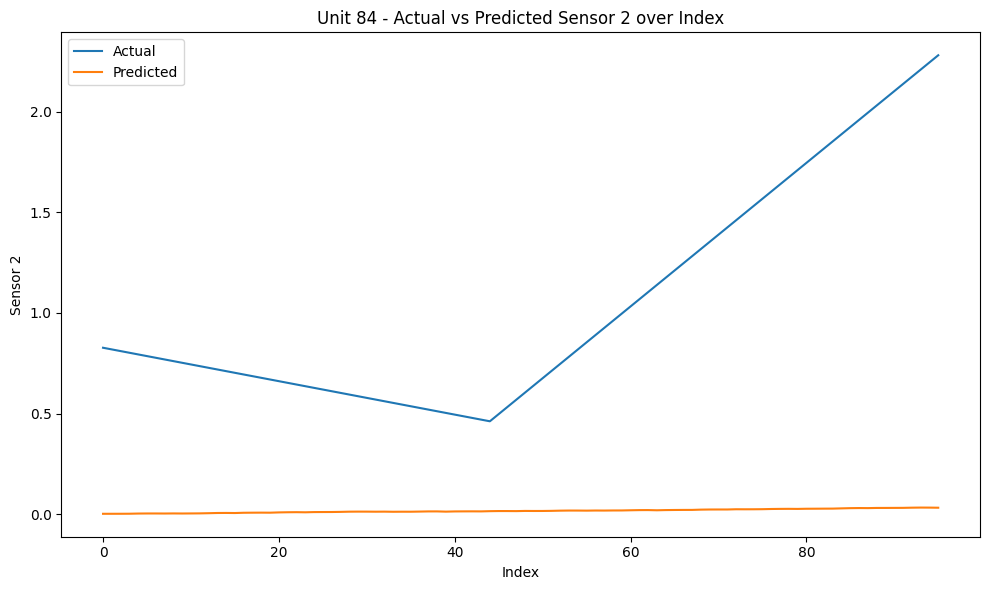

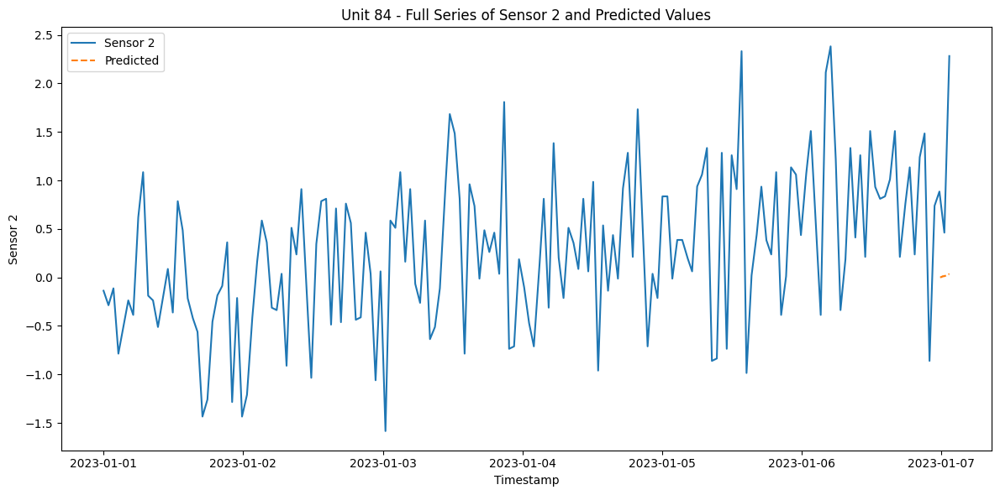

RMSE for Unit 84 - sensor_2: 1.1541717588180125
{'train': [0, 1347], 'valid': [835, 1516], 'test': [1004, 1683]}
1084
Dataset for unit 85 is good


  0%|          | 0/1 [00:00<?, ?it/s]

96
[1.2022704015326002, 1.1905316393595913, 1.1787928771865825, 1.1670541150135736, 1.1553153528405646, 1.143576590667556, 1.131837828494547, 1.1200990663215382, 1.1083603041485293, 1.0966215419755203, 1.0848827798025116, 1.0731440176295026, 1.061405255456494, 1.049666493283485, 1.037927731110476, 1.0261889689374672, 1.0144502067644583, 1.0027114445914496, 0.9909726824184406, 0.9792339202454317, 0.9674951580724229, 0.955756395899414, 0.9440176337264051, 0.9322788715533963, 0.9205401093803873, 0.9088013472073786, 0.8970625850343696, 0.8853238228613608, 0.873585060688352, 0.861846298515343, 0.8501075363423343, 0.8383687741693253, 0.8266300119963165, 0.8148912498233076, 0.8031524876502987, 0.7914137254772899, 0.779674963304281, 0.7679362011312721, 0.7561974389582633, 0.7444586767852545, 0.7327199146122455, 0.7209811524392367, 0.7092423902662278, 0.697503628093219, 0.6857648659202101, 0.6774499093809978, 0.6691349528417856, 0.6608199963025733, 0.6525050397633609, 0.6441900832241486, 0.6358

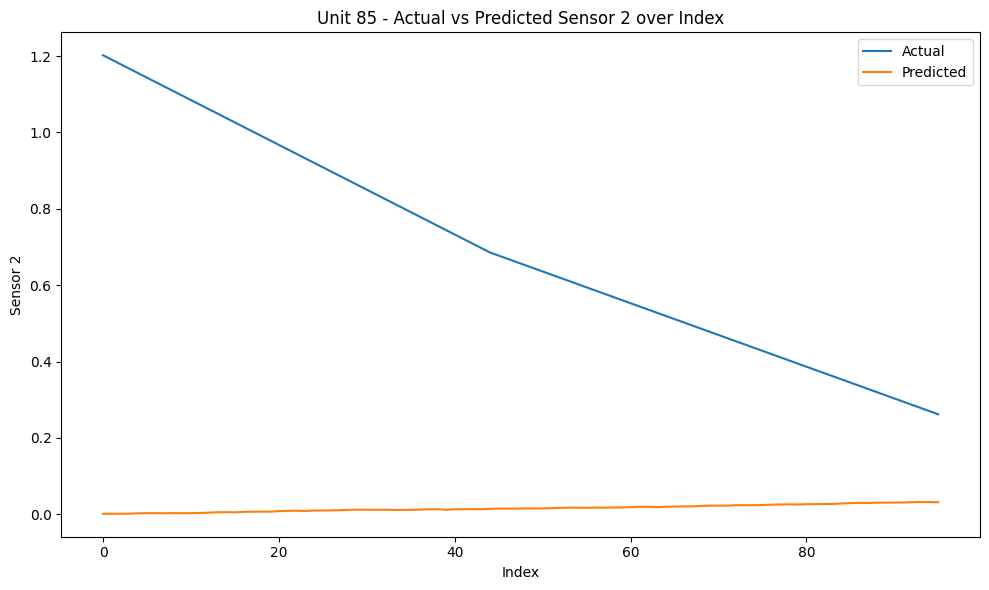

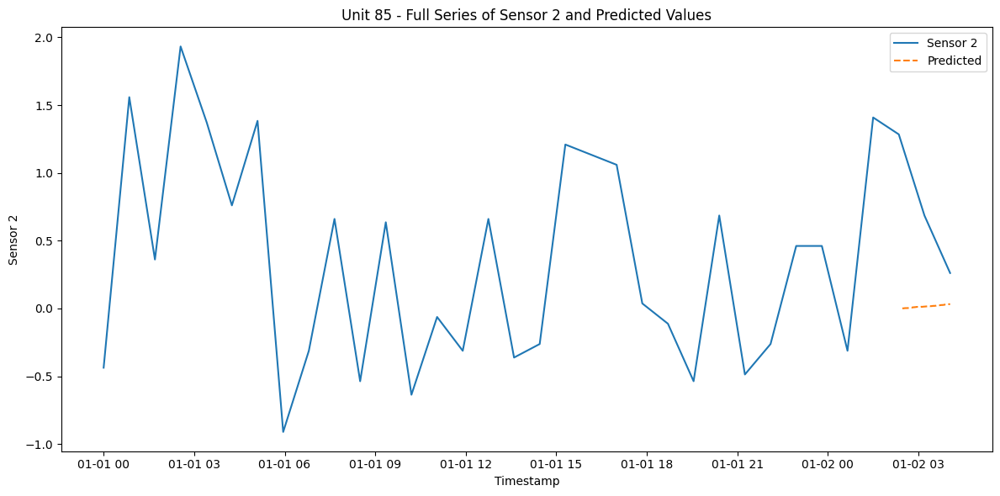

RMSE for Unit 85 - sensor_2: 0.7328831137436674
{'train': [0, 4448], 'valid': [3936, 5004], 'test': [4492, 5559]}
4960
Dataset for unit 86 is good


  0%|          | 0/47 [00:00<?, ?it/s]

96
[0.599191494894185, 0.6153322928820736, 0.6314730908699622, 0.6476138888578507, 0.6637546868457394, 0.6798954848336278, 0.6960362828215164, 0.712177080809405, 0.7283178787972936, 0.7444586767851822, 0.7605994747730708, 0.7767402727609594, 0.7928810707488478, 0.8090218687367365, 0.825162666724625, 0.8413034647125137, 0.8574442627004022, 0.8735850606882909, 0.8897258586761794, 0.905866656664068, 0.9220074546519565, 0.9381482526398451, 0.9542890506277337, 0.9704298486156222, 0.9865706466035109, 1.0027114445913994, 1.018852242579288, 1.0349930405671766, 1.0511338385550653, 1.0672746365429537, 1.0834154345308424, 1.099556232518731, 1.1156970305066194, 1.131837828494508, 1.1479786264823966, 1.1641194244702853, 1.1802602224581737, 1.1964010204460624, 1.212541818433951, 1.2286826164218396, 1.244823414409728, 1.2609642123976168, 1.2771050103855053, 1.2932458083733938, 1.3093866063612825, 1.312810411995079, 1.3162342176288755, 1.3196580232626722, 1.3230818288964687, 1.3265056345302653, 1.3299

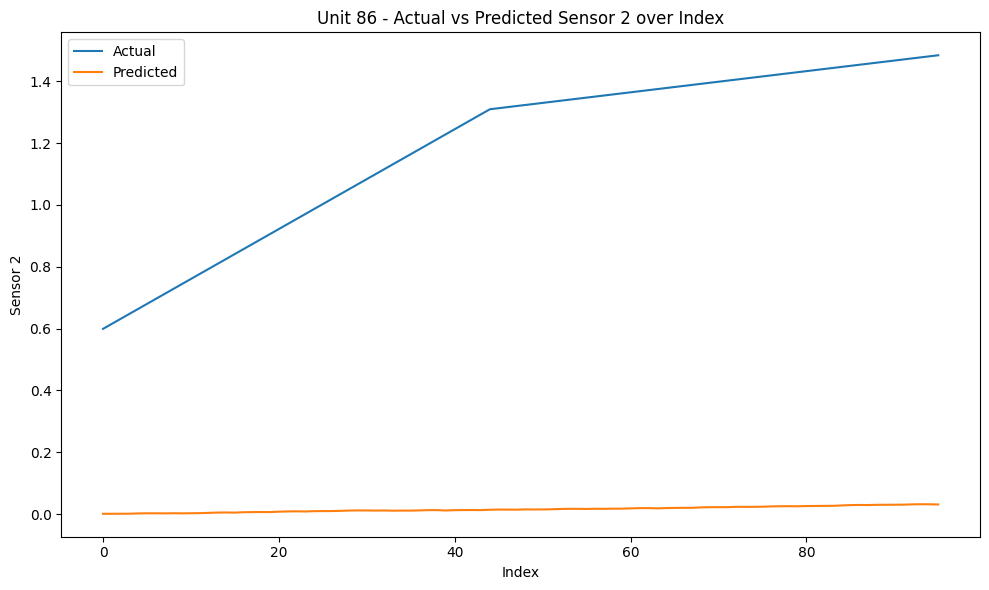

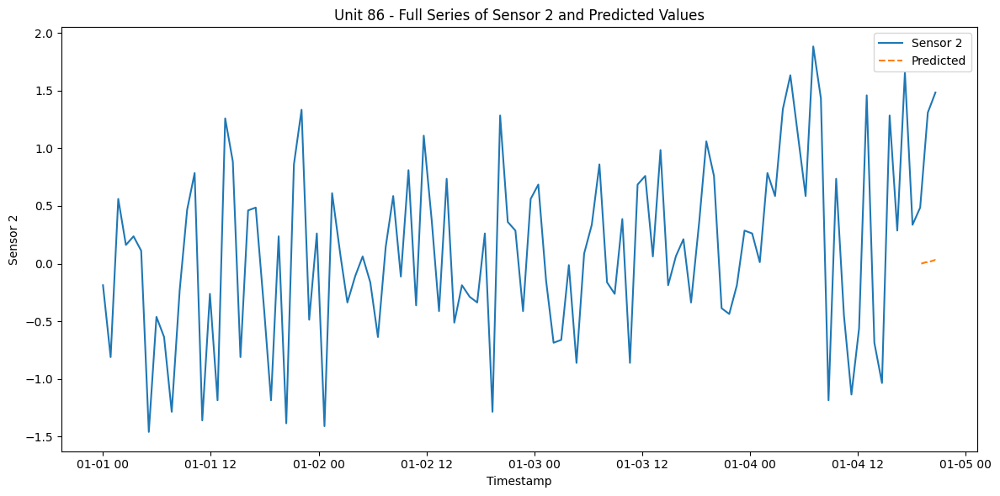

RMSE for Unit 86 - sensor_2: 1.20261560160774
{'train': [0, 2245], 'valid': [1733, 2525], 'test': [2013, 2805]}
2206
Dataset for unit 87 is good


  0%|          | 0/13 [00:00<?, ?it/s]

96
[0.4945208655182217, 0.45294608282215465, 0.4113713001260876, 0.36979651743002057, 0.32822173473395355, 0.2866469520378865, 0.2450721693418194, 0.20349738664575245, 0.16192260394968538, 0.12034782125361831, 0.07877303855755124, 0.037198255861484175, -0.0043765268345827835, -0.04595130953064985, -0.08752609222671692, -0.12910087492278388, -0.17067565761885095, -0.21225044031491802, -0.2538252230109851, -0.29540000570705216, -0.33697478840311923, -0.3785495710991861, -0.42012435379525315, -0.4616991364913202, -0.5032739191873873, -0.5448487018834544, -0.5864234845795214, -0.6279982672755885, -0.6695730499716556, -0.7111478326677226, -0.7527226153637895, -0.7942973980598566, -0.8358721807559236, -0.8774469634519907, -0.9190217461480578, -0.9605965288441248, -1.002171311540192, -1.0437460942362589, -1.0853208769323257, -1.126895659628393, -1.1684704423244598, -1.2100452250205271, -1.251620007716594, -1.2931947904126613, -1.334769573108728, -1.3230308109357245, -1.3112920487627213, -1.29

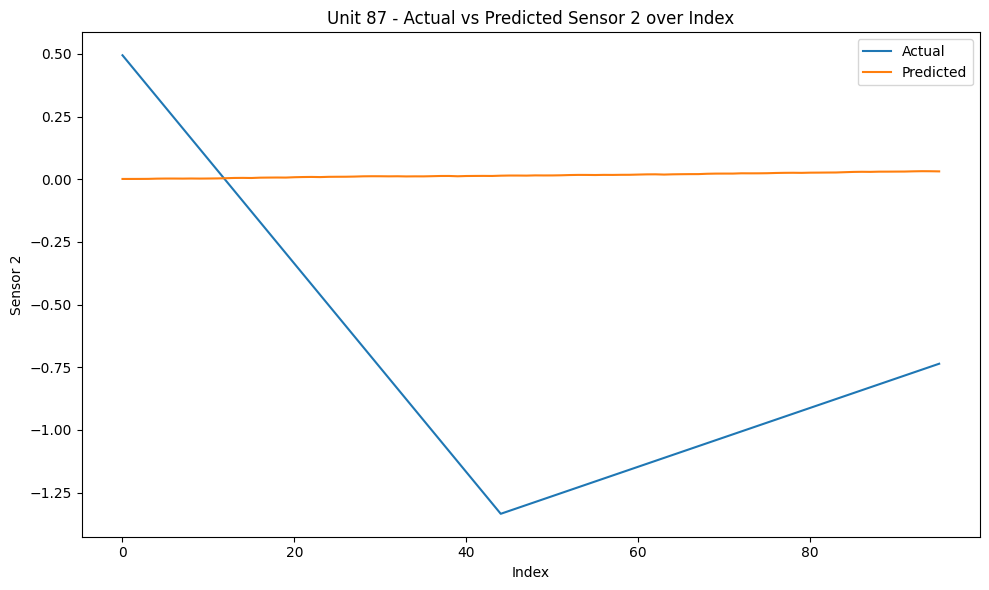

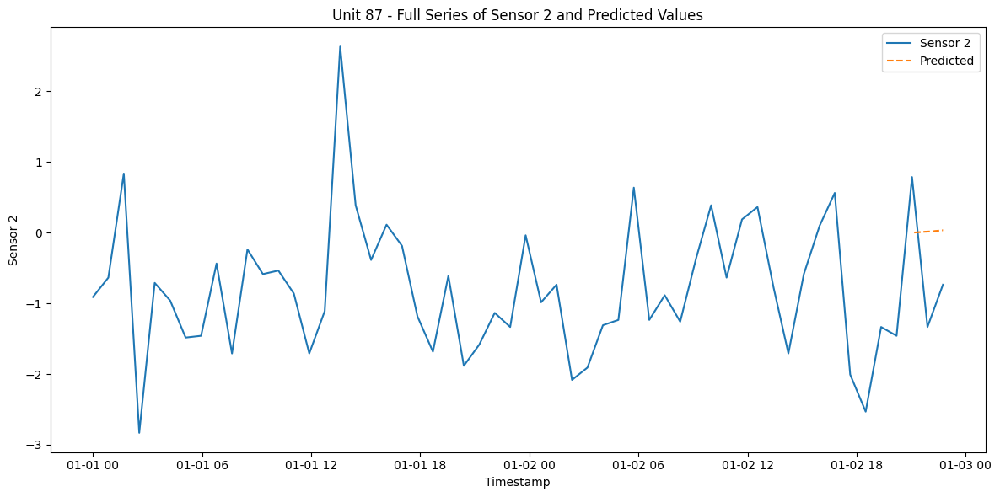

RMSE for Unit 87 - sensor_2: 0.9097390999949635
{'train': [0, 2734], 'valid': [2222, 3076], 'test': [2564, 3417]}
2818
Dataset for unit 88 is good


  0%|          | 0/20 [00:00<?, ?it/s]

96
[0.41675156612205044, 0.4602828091802893, 0.5038140522385282, 0.5473452952967671, 0.590876538355006, 0.6344077814132448, 0.6779390244714837, 0.7214702675297227, 0.7650015105879615, 0.8085327536462004, 0.8520639967044392, 0.8955952397626781, 0.939126482820917, 0.9826577258791559, 1.0261889689373949, 1.0697202119956337, 1.1132514550538726, 1.1567826981121114, 1.2003139411703503, 1.2438451842285891, 1.287376427286828, 1.330907670345067, 1.374438913403306, 1.4179701564615448, 1.4615013995197836, 1.5050326425780225, 1.5485638856362614, 1.5920951286945002, 1.635626371752739, 1.679157614810978, 1.722688857869217, 1.7662201009274558, 1.8097513439856947, 1.8532825870439336, 1.8968138301021724, 1.9403450731604113, 1.9838763162186501, 2.0274075592768894, 2.070938802335128, 2.114470045393367, 2.1580012884516058, 2.201532531509845, 2.245063774568084, 2.2885950176263226, 2.3321262606845616, 2.3076705061574607, 2.28321475163036, 2.258758997103259, 2.234303242576158, 2.209847488049057, 2.1853917335

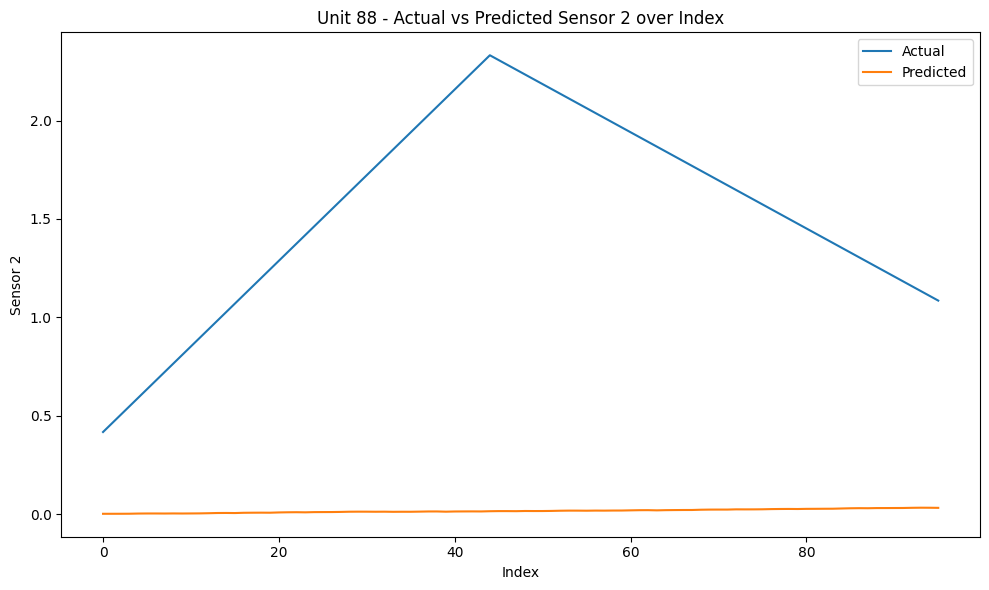

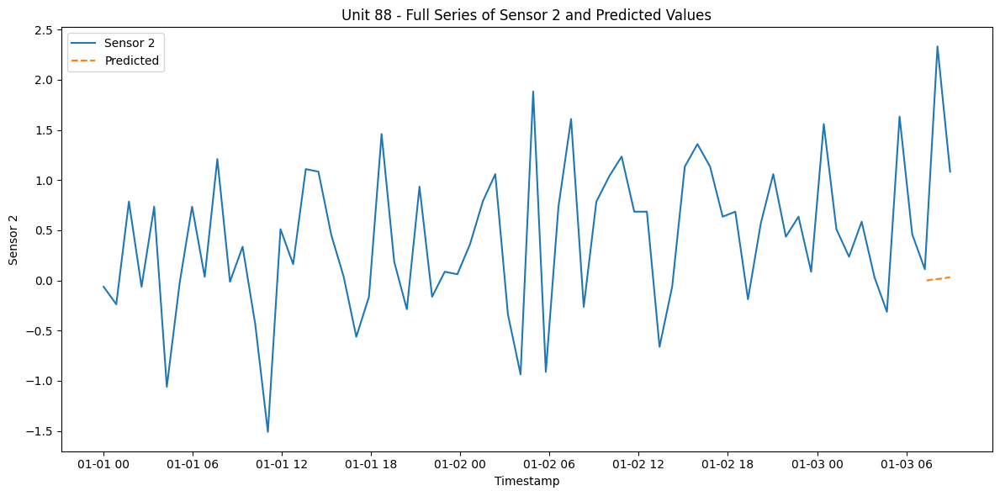

RMSE for Unit 88 - sensor_2: 1.606893177583325
{'train': [0, 7182], 'valid': [6670, 8079], 'test': [7567, 8976]}
8377
Dataset for unit 89 is good


  0%|          | 0/90 [00:00<?, ?it/s]

96
[1.1562935830216146, 1.1308595983134304, 1.1054256136052465, 1.0799916288970626, 1.0545576441888784, 1.0291236594806943, 1.0036896747725104, 0.9782556900643264, 0.9528217053561423, 0.9273877206479584, 0.9019537359397742, 0.8765197512315903, 0.8510857665234063, 0.8256517818152223, 0.8002177971070382, 0.7747838123988542, 0.7493498276906702, 0.7239158429824861, 0.6984818582743021, 0.6730478735661181, 0.6476138888579341, 0.6221799041497501, 0.5967459194415661, 0.571311934733382, 0.545877950025198, 0.520443965317014, 0.49500998060882995, 0.4695759959006459, 0.4441420111924619, 0.41870802648427785, 0.3932740417760938, 0.3678400570679099, 0.34240607235972587, 0.31697208765154183, 0.2915381029433577, 0.26610411823517377, 0.24067013352698985, 0.2152361488188057, 0.18980216411062178, 0.16436817940243764, 0.13893419469425372, 0.11350020998606958, 0.08806622527788566, 0.06263224056970151, 0.037198255861517655, 0.05774108966428039, 0.07828392346704313, 0.09882675726980586, 0.11936959107256859, 0

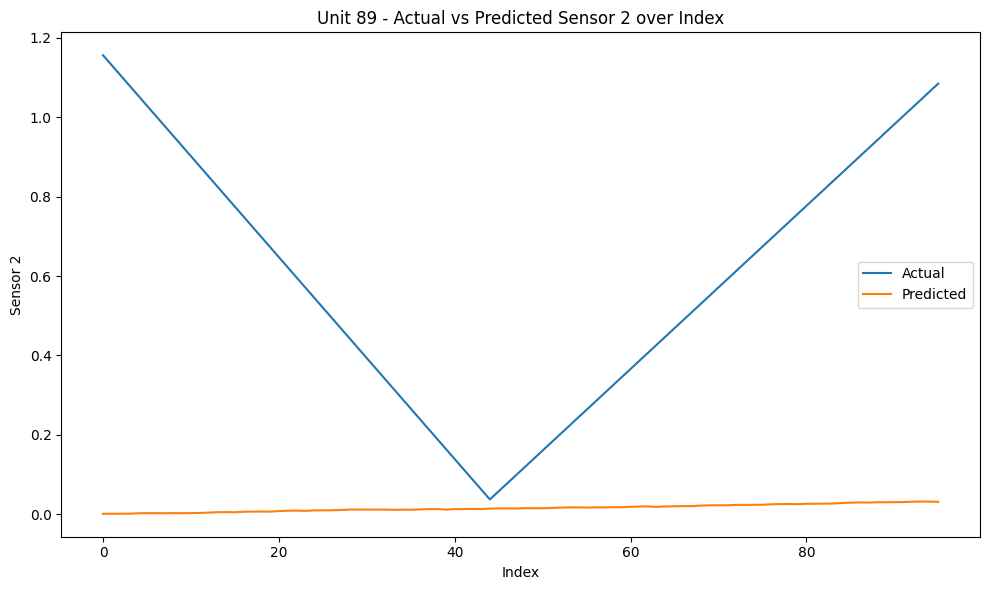

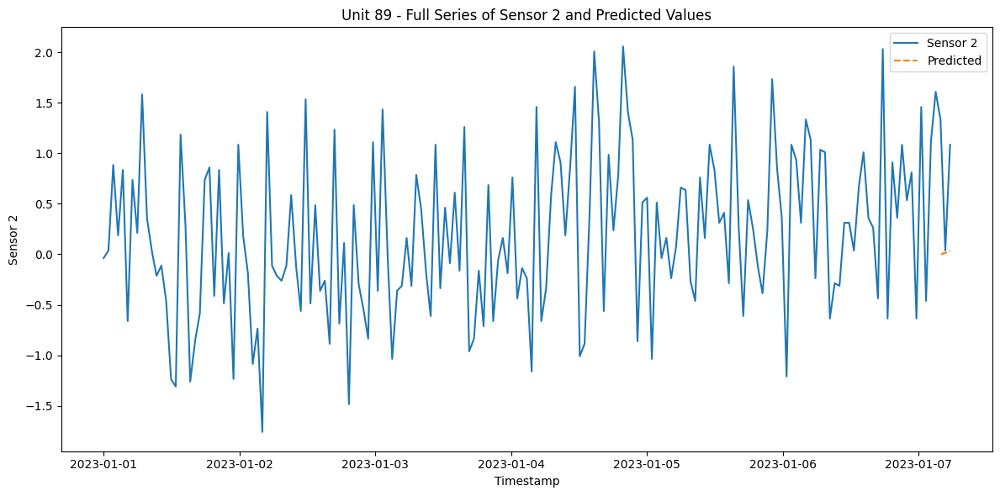

RMSE for Unit 89 - sensor_2: 0.6494295607894736
{'train': [0, 5917], 'valid': [5405, 6656], 'test': [6144, 7395]}
6796
Dataset for unit 90 is good


  0%|          | 0/70 [00:00<?, ?it/s]

96
[0.24996332024733534, 0.2910489878528608, 0.3321346554583863, 0.37322032306391173, 0.41430599066943724, 0.4553916582749627, 0.4964773258804882, 0.5375629934860137, 0.5786486610915391, 0.6197343286970646, 0.66081999630259, 0.7019056639081155, 0.7429913315136409, 0.7840769991191664, 0.825162666724692, 0.8662483343302174, 0.9073340019357429, 0.9484196695412683, 0.9895053371467938, 1.0305910047523192, 1.0716766723578446, 1.1127623399633702, 1.1538480075688955, 1.194933675174421, 1.2360193427799464, 1.277105010385472, 1.3181906779909975, 1.3592763455965229, 1.4003620132020485, 1.4414476808075738, 1.4825333484130994, 1.5236190160186247, 1.5647046836241503, 1.6057903512296756, 1.6468760188352012, 1.6879616864407267, 1.729047354046252, 1.7701330216517777, 1.811218689257303, 1.8523043568628286, 1.893390024468354, 1.9344756920738795, 1.975561359679405, 2.0166470272849306, 2.057732694890456, 2.0650694212485905, 2.0724061476067255, 2.07974287396486, 2.0870796003229946, 2.0944163266811295, 2.101

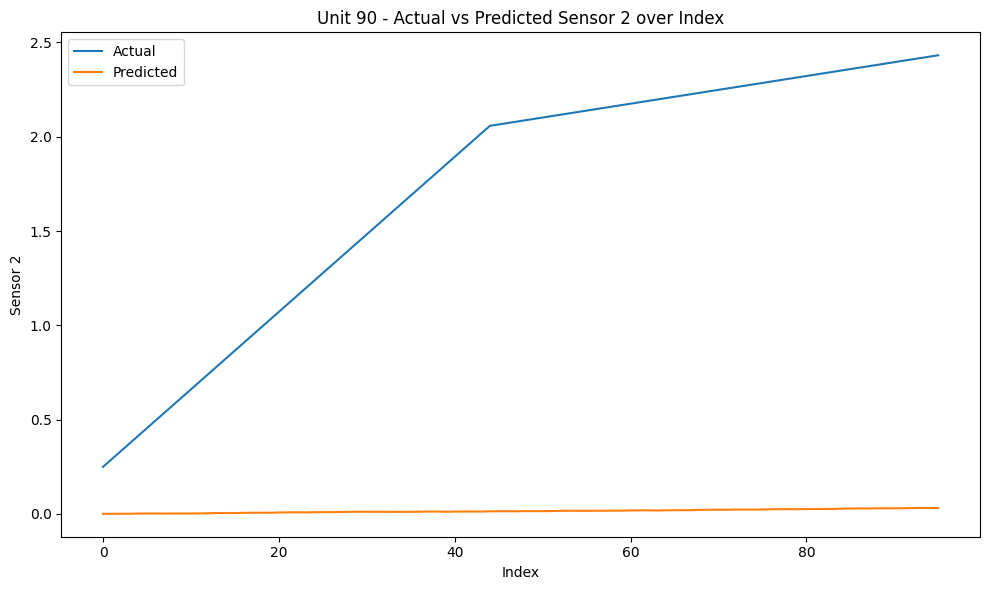

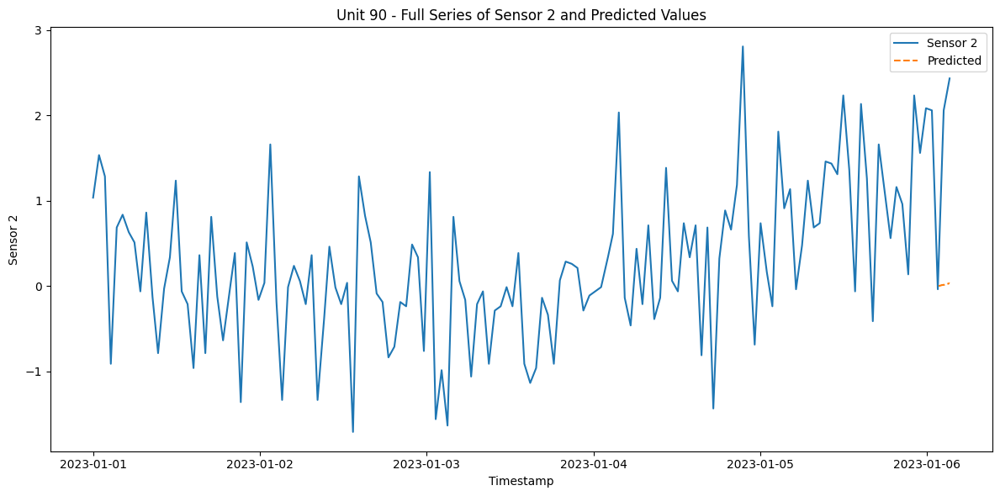

RMSE for Unit 90 - sensor_2: 1.8397458444564494
{'train': [0, 9507], 'valid': [8995, 10696], 'test': [10184, 11883]}
11284
Dataset for unit 91 is good


  0%|          | 0/126 [00:00<?, ?it/s]

96
[2.8965650751701926, 2.866729054647129, 2.8368930341240652, 2.8070570136010016, 2.7772209930779375, 2.747384972554874, 2.71754895203181, 2.6877129315087465, 2.657876910985683, 2.628040890462619, 2.598204869939555, 2.5683688494164914, 2.5385328288934277, 2.508696808370364, 2.4788607878473004, 2.4490247673242367, 2.419188746801173, 2.3893527262781094, 2.3595167057550452, 2.3296806852319816, 2.299844664708918, 2.2700086441858542, 2.2401726236627906, 2.2103366031397265, 2.180500582616663, 2.150664562093599, 2.1208285415705355, 2.090992521047472, 2.061156500524408, 2.0313204800013445, 2.001484459478281, 1.971648438955217, 1.941812418432153, 1.9119763979090894, 1.8821403773860257, 1.852304356862962, 1.8224683363398981, 1.7926323158168345, 1.7627962952937708, 1.732960274770707, 1.7031242542476432, 1.6732882337245796, 1.6434522132015157, 1.613616192678452, 1.5837801721553884, 1.5872039777891793, 1.5906277834229703, 1.5940515890567615, 1.5974753946905524, 1.6008992003243434, 1.60432300595813

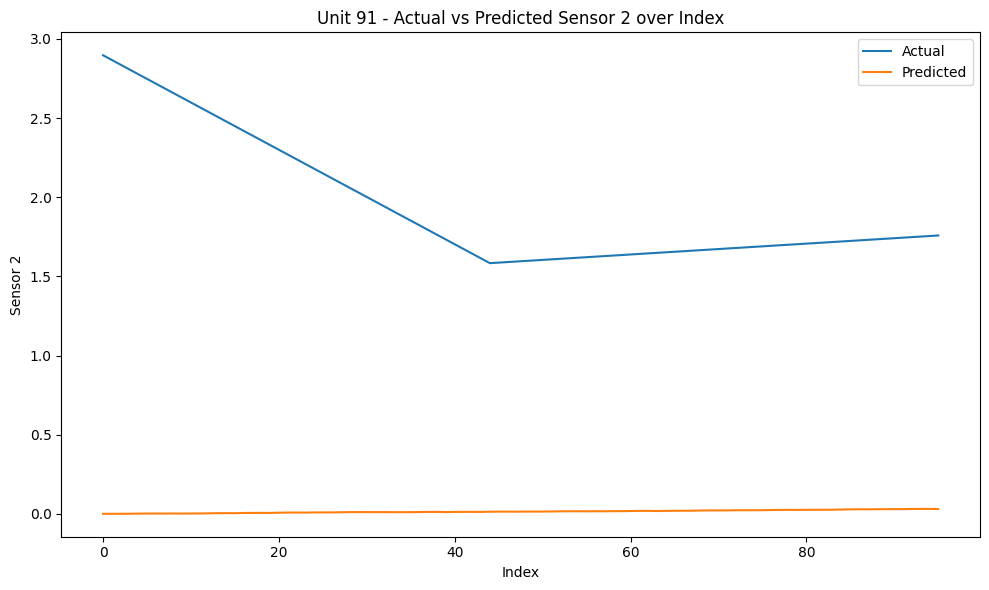

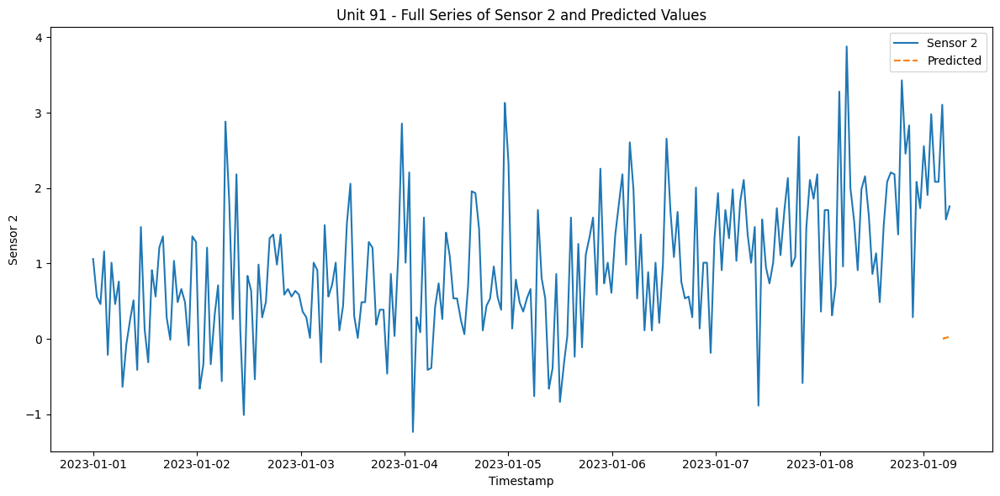

RMSE for Unit 91 - sensor_2: 1.9635405180406331
{'train': [0, 6080], 'valid': [5568, 6840], 'test': [6328, 7599]}
7000
Dataset for unit 92 is good


  0%|          | 0/73 [00:00<?, ?it/s]

96
[1.5700849496202243, 1.568128489258058, 1.5661720288958918, 1.5642155685337253, 1.562259108171559, 1.5603026478093929, 1.5583461874472266, 1.5563897270850602, 1.554433266722894, 1.5524768063607277, 1.5505203459985615, 1.548563885636395, 1.5466074252742288, 1.5446509649120626, 1.5426945045498963, 1.5407380441877299, 1.5387815838255636, 1.5368251234633974, 1.5348686631012312, 1.5329122027390647, 1.5309557423768985, 1.5289992820147322, 1.527042821652566, 1.5250863612903995, 1.5231299009282333, 1.521173440566067, 1.5192169802039008, 1.5172605198417344, 1.5153040594795681, 1.513347599117402, 1.5113911387552357, 1.5094346783930692, 1.507478218030903, 1.5055217576687367, 1.5035652973065705, 1.501608836944404, 1.4996523765822378, 1.4976959162200716, 1.4957394558579051, 1.493782995495739, 1.4918265351335727, 1.4898700747714064, 1.48791361440924, 1.4859571540470737, 1.4840006936849075, 1.5309557423769373, 1.5779107910689674, 1.6248658397609972, 1.671820888453027, 1.718775937145057, 1.76573098

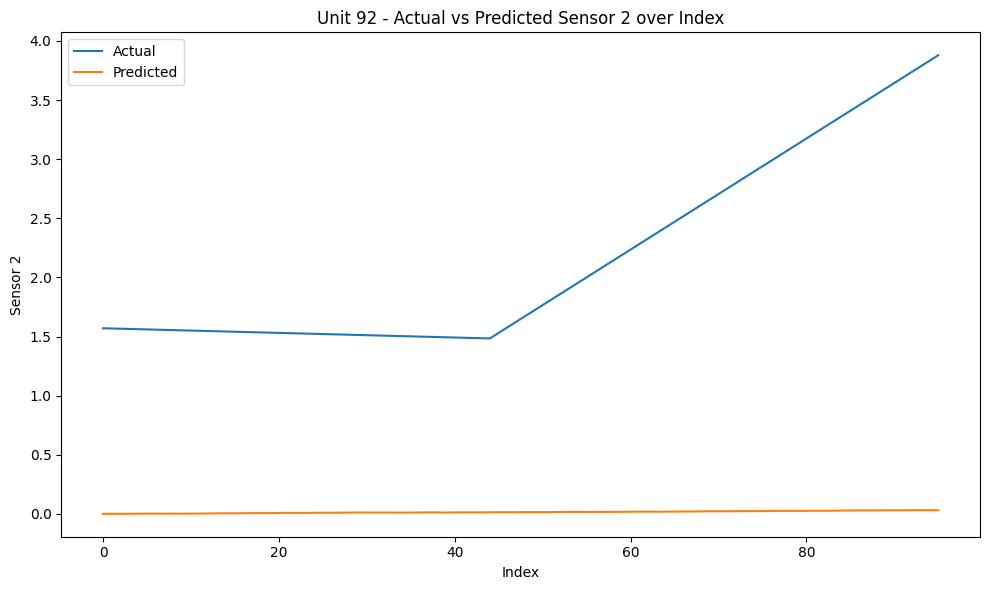

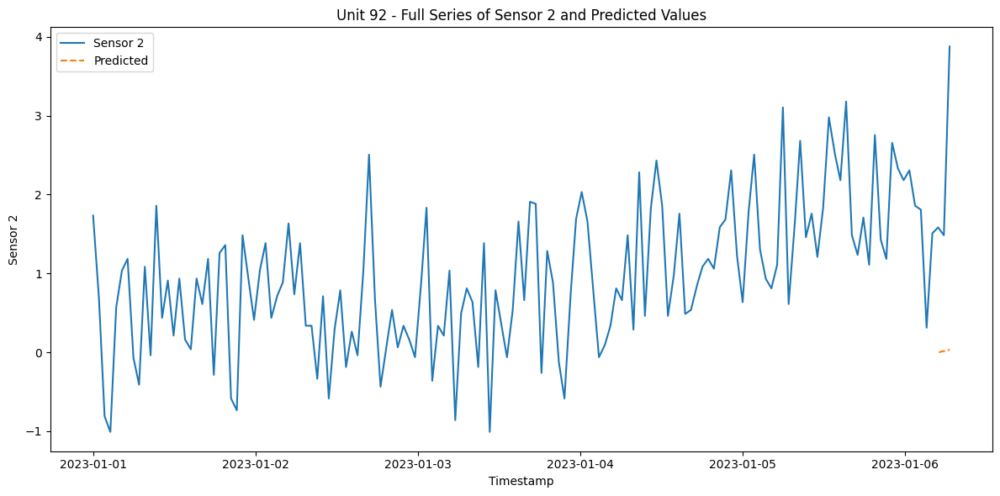

RMSE for Unit 92 - sensor_2: 2.2702359604205054
{'train': [0, 9915], 'valid': [9403, 11155], 'test': [10643, 12393]}
11794
Dataset for unit 93 is good


  0%|          | 0/132 [00:00<?, ?it/s]

96
[1.3700368775883596, 1.3573198852342676, 1.3446028928801756, 1.3318859005260837, 1.3191689081719917, 1.3064519158178995, 1.2937349234638076, 1.2810179311097156, 1.2683009387556237, 1.2555839464015315, 1.2428669540474395, 1.2301499616933476, 1.2174329693392556, 1.2047159769851636, 1.1919989846310715, 1.1792819922769795, 1.1665649999228875, 1.1538480075687954, 1.1411310152147034, 1.1284140228606114, 1.1156970305065195, 1.1029800381524275, 1.0902630457983356, 1.0775460534442434, 1.0648290610901514, 1.0521120687360594, 1.0393950763819673, 1.0266780840278753, 1.0139610916737833, 1.0012440993196914, 0.9885271069655993, 0.9758101146115074, 0.9630931222574153, 0.9503761299033233, 0.9376591375492312, 0.9249421451951393, 0.9122251528410473, 0.8995081604869553, 0.8867911681328633, 0.8740741757787712, 0.8613571834246793, 0.8486401910705872, 0.8359231987164952, 0.8232062063624032, 0.8104892140083112, 0.8212497460002369, 0.8320102779921627, 0.8427708099840884, 0.8535313419760141, 0.86429187396793

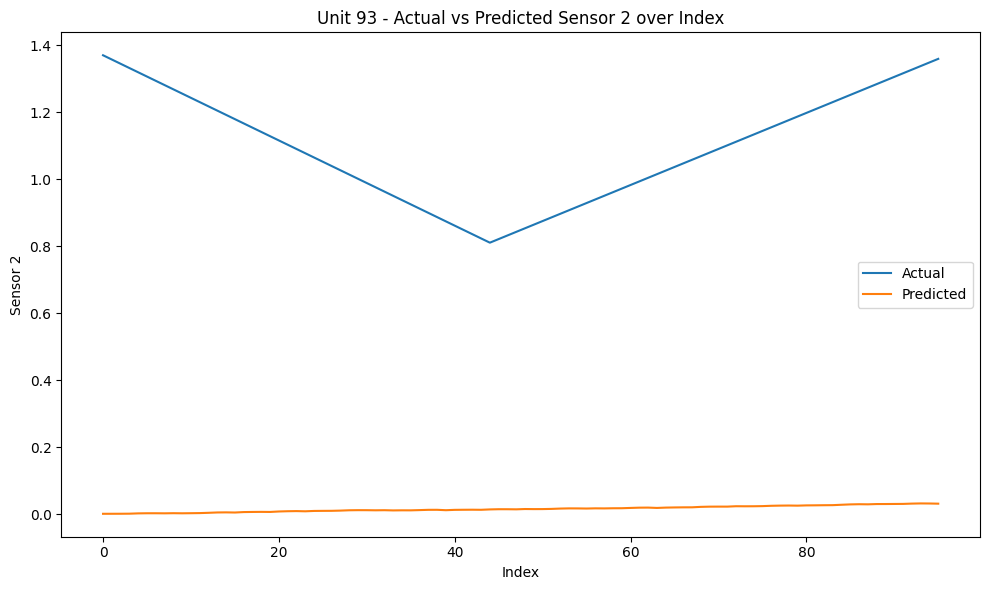

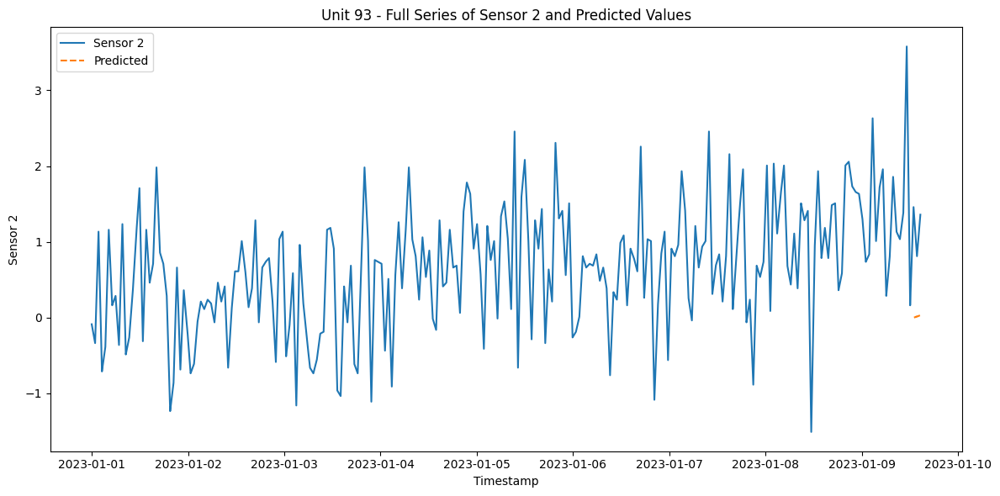

RMSE for Unit 93 - sensor_2: 1.0865519133320718
{'train': [0, 5386], 'valid': [4874, 6060], 'test': [5548, 6732]}
6133
Dataset for unit 94 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[1.0437971121968859, 1.0379277311103816, 1.0320583500238771, 1.0261889689373727, 1.0203195878508682, 1.014450206764364, 1.0085808256778594, 1.002711444591355, 0.9968420635048505, 0.9909726824183461, 0.9851033013318417, 0.9792339202453373, 0.9733645391588328, 0.9674951580723283, 0.961625776985824, 0.9557563958993195, 0.9498870148128151, 0.9440176337263106, 0.9381482526398062, 0.9322788715533018, 0.9264094904667973, 0.920540109380293, 0.9146707282937885, 0.908801347207284, 0.9029319661207796, 0.8970625850342752, 0.8911932039477708, 0.8853238228612663, 0.8794544417747618, 0.8735850606882575, 0.867715679601753, 0.8618462985152486, 0.8559769174287442, 0.8501075363422397, 0.8442381552557353, 0.838368774169231, 0.8324993930827265, 0.826630011996222, 0.8207606309097175, 0.8148912498232131, 0.8090218687367088, 0.8031524876502043, 0.7972831065636998, 0.7914137254771954, 0.785544344390691, 0.7845661142096079, 0.7835878840285246, 0.7826096538474415, 0.7816314236663584, 0.7806531934852753, 0.779

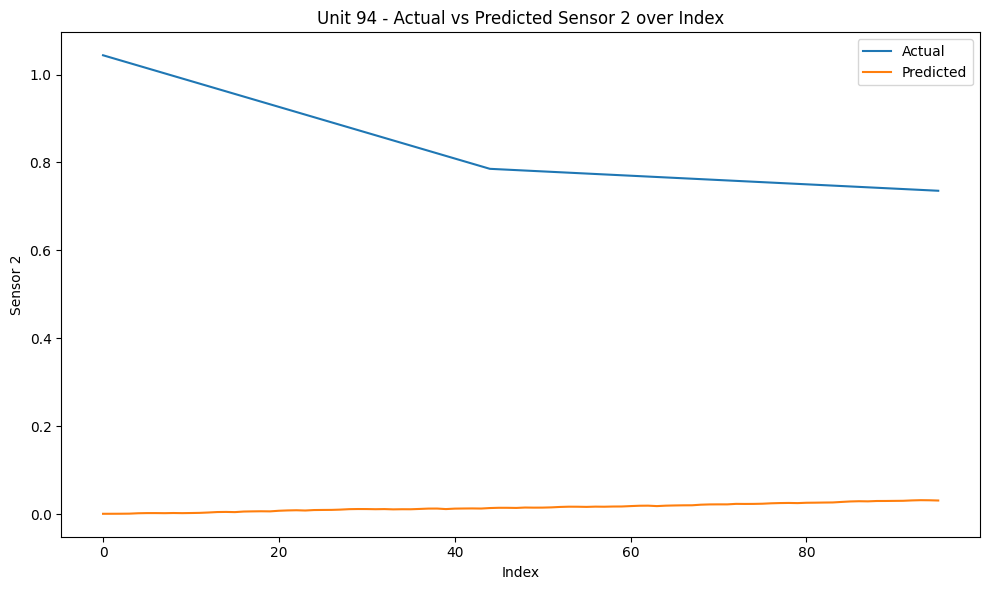

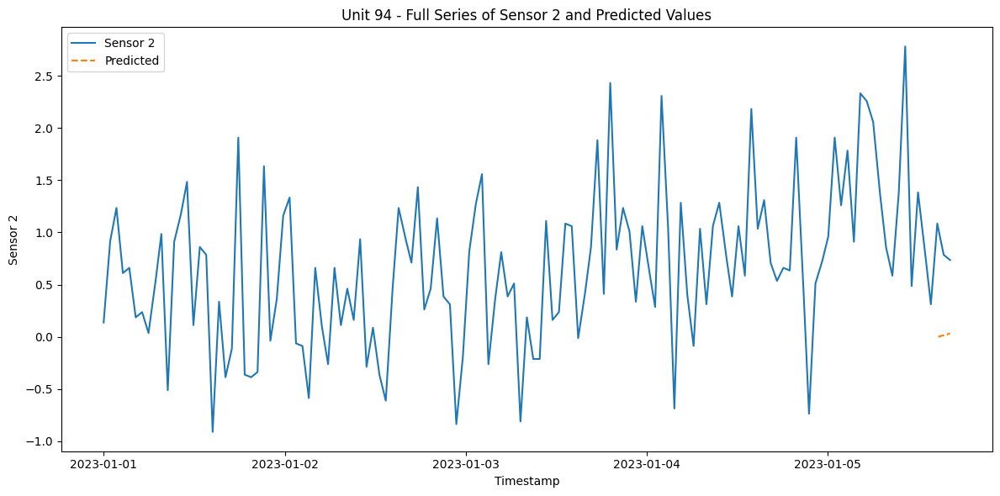

RMSE for Unit 94 - sensor_2: 0.8231873941287469
{'train': [0, 3591], 'valid': [3079, 4040], 'test': [3528, 4488]}
3889
Dataset for unit 95 is good


  0%|          | 0/34 [00:00<?, ?it/s]

96
[0.3781114739693552, 0.3947413870477798, 0.4113713001262044, 0.42800121320462897, 0.44463112628305357, 0.4612610393614781, 0.47789095243990276, 0.4945208655183273, 0.511150778596752, 0.5277806916751765, 0.544410604753601, 0.5610405178320257, 0.5776704309104503, 0.5943003439888749, 0.6109302570672994, 0.6275601701457241, 0.6441900832241486, 0.6608199963025732, 0.6774499093809978, 0.6940798224594225, 0.710709735537847, 0.7273396486162715, 0.7439695616946962, 0.7605994747731207, 0.7772293878515454, 0.7938593009299699, 0.8104892140083945, 0.8271191270868191, 0.8437490401652437, 0.8603789532436683, 0.8770088663220929, 0.8936387794005175, 0.910268692478942, 0.9268986055573667, 0.9435285186357912, 0.9601584317142158, 0.9767883447926404, 0.993418257871065, 1.0100481709494895, 1.0266780840279142, 1.0433079971063388, 1.0599379101847632, 1.076567823263188, 1.0931977363416125, 1.1098276494200372, 1.0633617158185489, 1.0168957822170606, 0.9704298486155722, 0.9239639150140839, 0.8774979814125956,

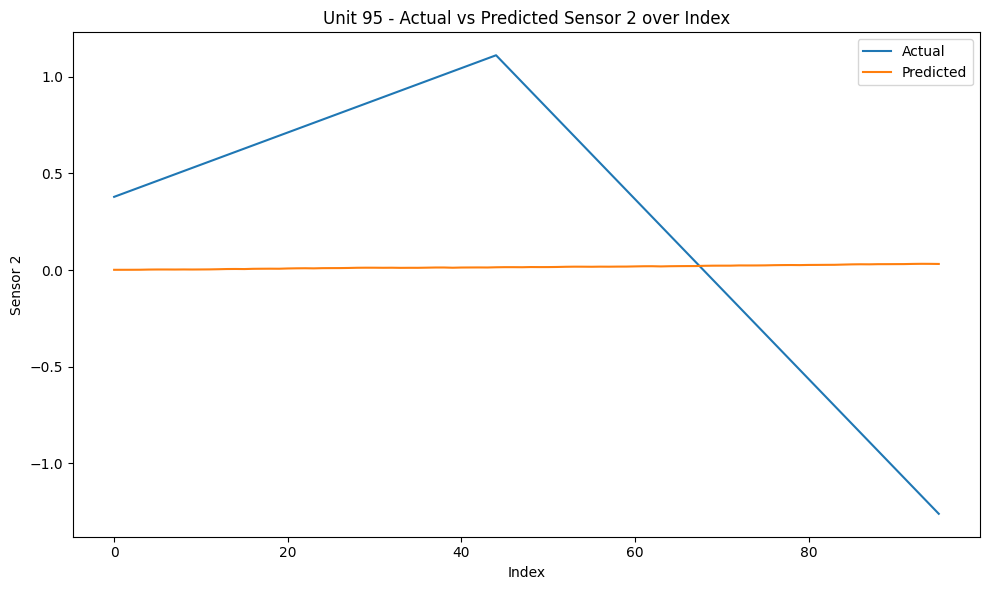

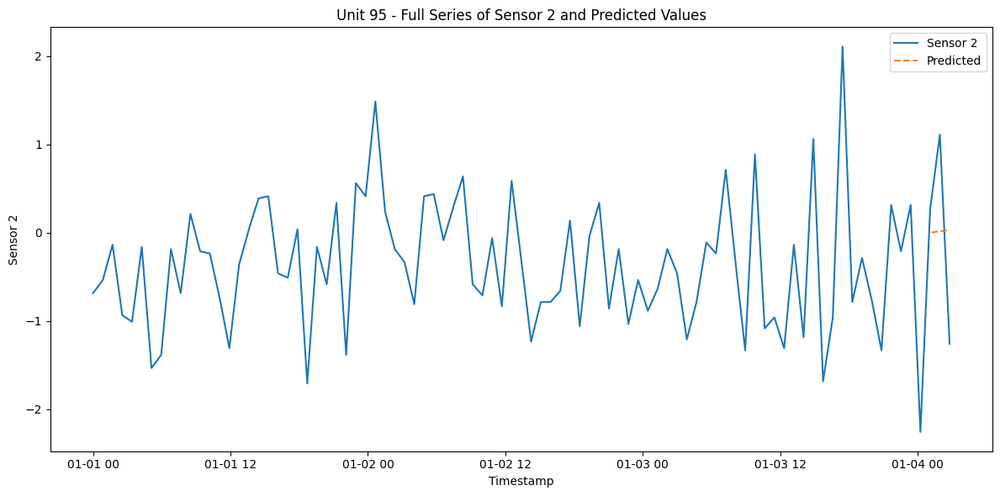

RMSE for Unit 95 - sensor_2: 0.7316544390522838
{'train': [0, 3918], 'valid': [3406, 4407], 'test': [3895, 4896]}
4297
Dataset for unit 96 is good


  0%|          | 0/39 [00:00<?, ?it/s]

96
[-0.8339157203937572, -0.8158184620437023, -0.7977212036936474, -0.7796239453435926, -0.7615266869935378, -0.7434294286434828, -0.725332170293428, -0.7072349119433732, -0.6891376535933182, -0.6710403952432633, -0.6529431368932085, -0.6348458785431537, -0.6167486201930987, -0.5986513618430439, -0.5805541034929891, -0.5624568451429341, -0.5443595867928792, -0.5262623284428244, -0.5081650700927696, -0.4900678117427147, -0.4719705533926598, -0.453873295042605, -0.43577603669255005, -0.4176787783424952, -0.3995815199924403, -0.38148426164238547, -0.36338700329233065, -0.3452897449422757, -0.3271924865922209, -0.30909522824216595, -0.29099796989211113, -0.2729007115420563, -0.2548034531920014, -0.23670619484194655, -0.21860893649189161, -0.2005116781418368, -0.18241441979178197, -0.16431716144172703, -0.1462199030916722, -0.12812264474161728, -0.11002538639156245, -0.09192812804150752, -0.0738308696914527, -0.05573361134139787, -0.03763635299134296, -0.04546219444001924, -0.05328803588869

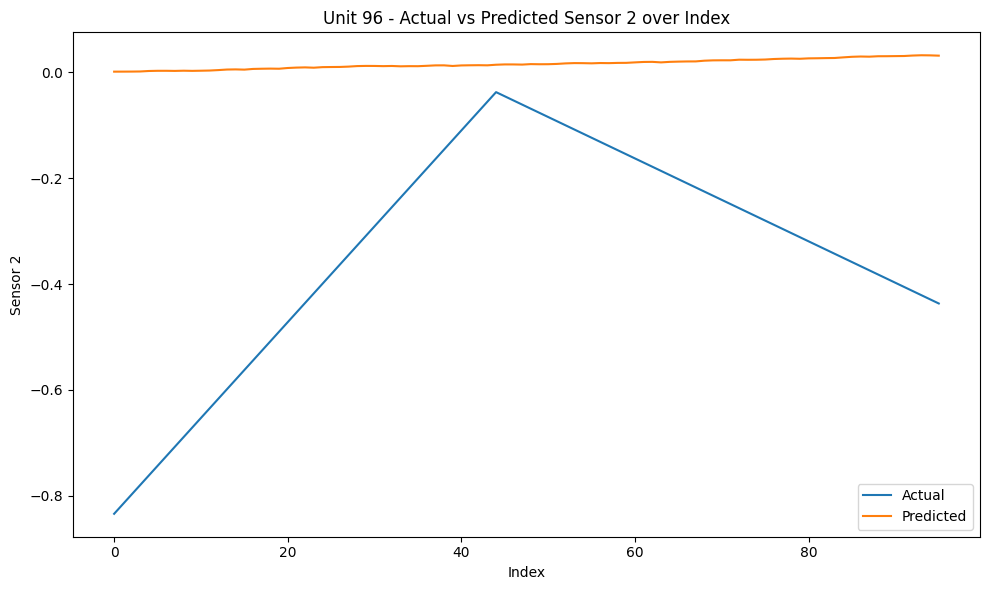

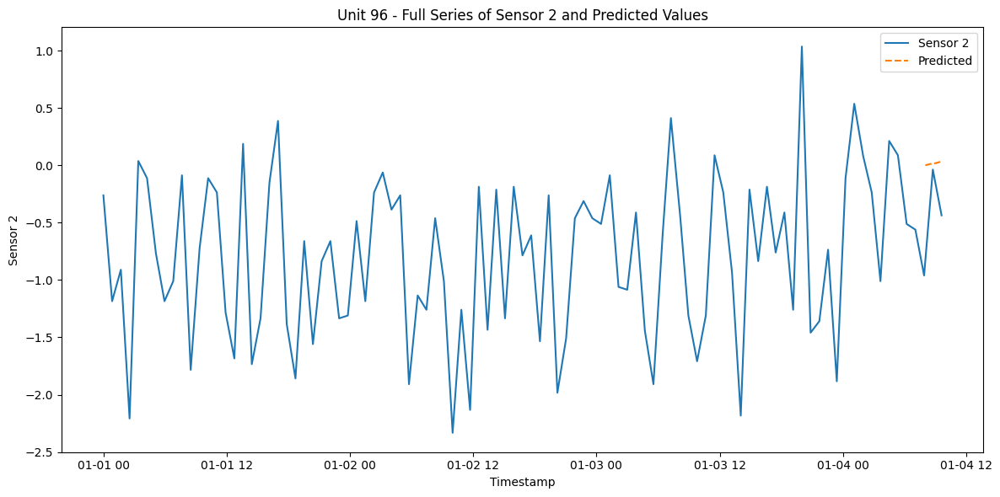

RMSE for Unit 96 - sensor_2: 0.4024100704422259
{'train': [0, 5427], 'valid': [4915, 6106], 'test': [5594, 6783]}
6184
Dataset for unit 97 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[-0.6793553517824534, -0.6783771216013703, -0.6773988914202872, -0.676420661239204, -0.6754424310581209, -0.6744642008770377, -0.6734859706959546, -0.6725077405148714, -0.6715295103337883, -0.6705512801527052, -0.669573049971622, -0.6685948197905388, -0.6676165896094557, -0.6666383594283726, -0.6656601292472895, -0.6646818990662062, -0.6637036688851231, -0.66272543870404, -0.6617472085229569, -0.6607689783418736, -0.6597907481607905, -0.6588125179797074, -0.6578342877986243, -0.6568560576175411, -0.655877827436458, -0.6548995972553748, -0.6539213670742917, -0.6529431368932085, -0.6519649067121254, -0.6509866765310423, -0.6500084463499591, -0.6490302161688759, -0.6480519859877928, -0.6470737558067097, -0.6460955256256264, -0.6451172954445433, -0.6441390652634602, -0.6431608350823771, -0.642182604901294, -0.6412043747202107, -0.6402261445391276, -0.6392479143580445, -0.6382696841769613, -0.6372914539958782, -0.636313223814795, -0.6182159654647402, -0.6001187071146853, -0.5820214487646

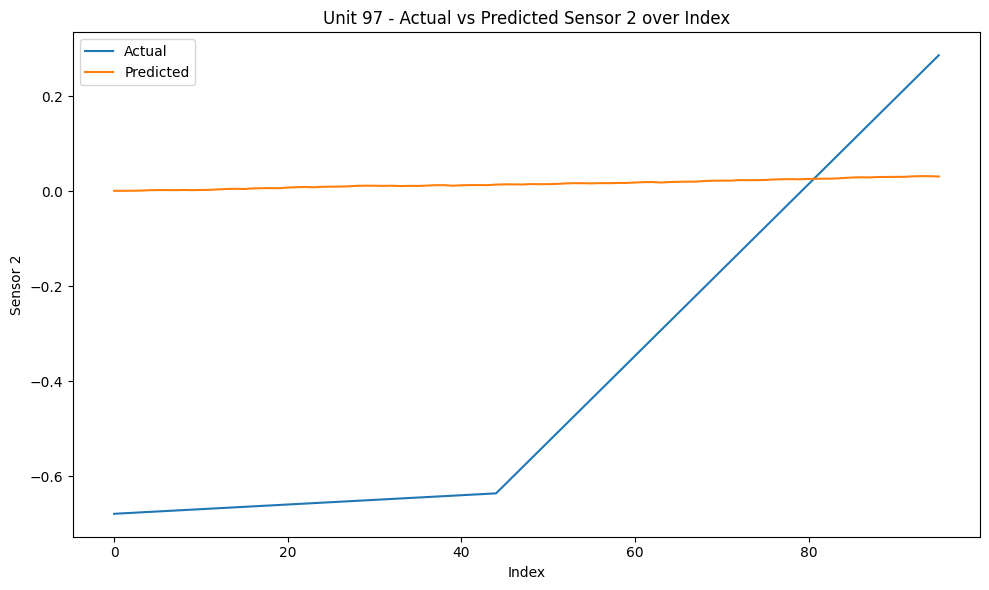

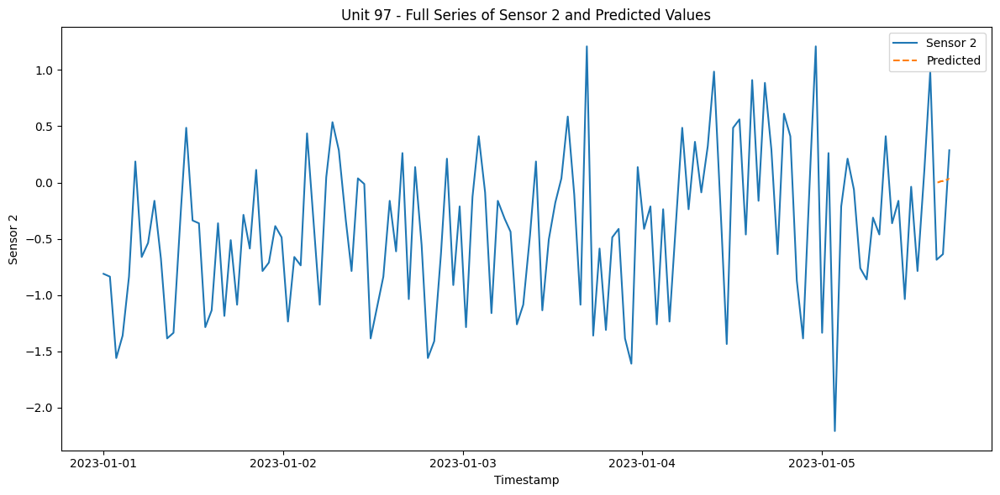

RMSE for Unit 97 - sensor_2: 0.5126207826345804
{'train': [0, 4897], 'valid': [4385, 5509], 'test': [4997, 6120]}
5521
Dataset for unit 98 is good


  0%|          | 0/54 [00:00<?, ?it/s]

96
[1.4223721922765915, 1.413568120646832, 1.4047640490170725, 1.3959599773873133, 1.3871559057575538, 1.3783518341277943, 1.369547762498035, 1.3607436908682755, 1.351939619238516, 1.3431355476087565, 1.3343314759789973, 1.3255274043492378, 1.3167233327194783, 1.3079192610897188, 1.2991151894599595, 1.2903111178302, 1.2815070462004405, 1.2727029745706813, 1.2638989029409218, 1.2550948313111623, 1.2462907596814028, 1.2374866880516435, 1.228682616421884, 1.2198785447921245, 1.2110744731623653, 1.2022704015326058, 1.1934663299028463, 1.1846622582730868, 1.1758581866433273, 1.167054115013568, 1.1582500433838085, 1.1494459717540493, 1.1406419001242898, 1.1318378284945303, 1.1230337568647708, 1.1142296852350113, 1.105425613605252, 1.0966215419754926, 1.087817470345733, 1.0790133987159738, 1.0702093270862143, 1.0614052554564548, 1.0526011838266953, 1.043797112196936, 1.0349930405671766, 1.0247216236657923, 1.0144502067644083, 1.0041787898630241, 0.99390737296164, 0.9836359560602558, 0.9733645

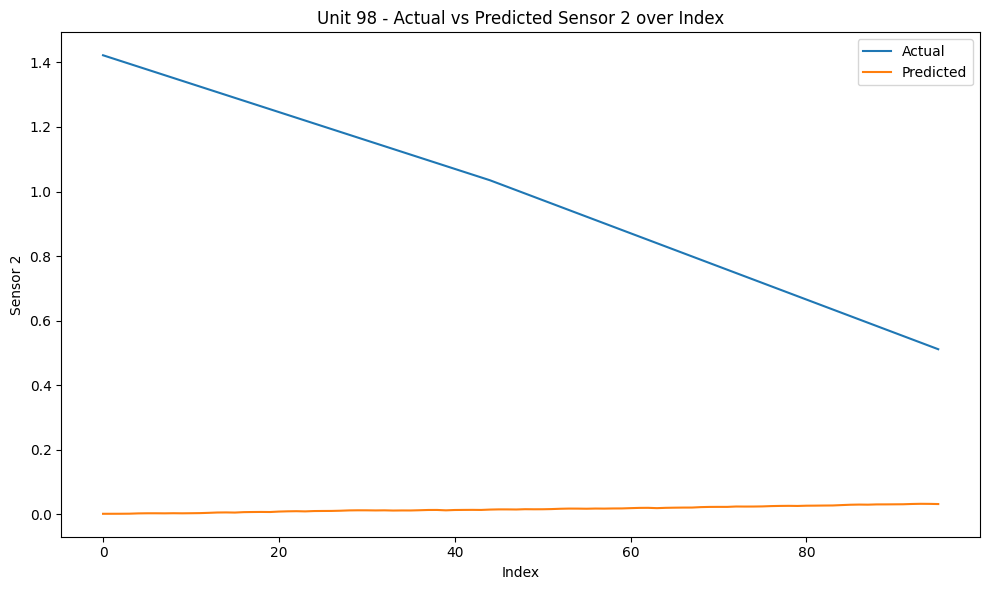

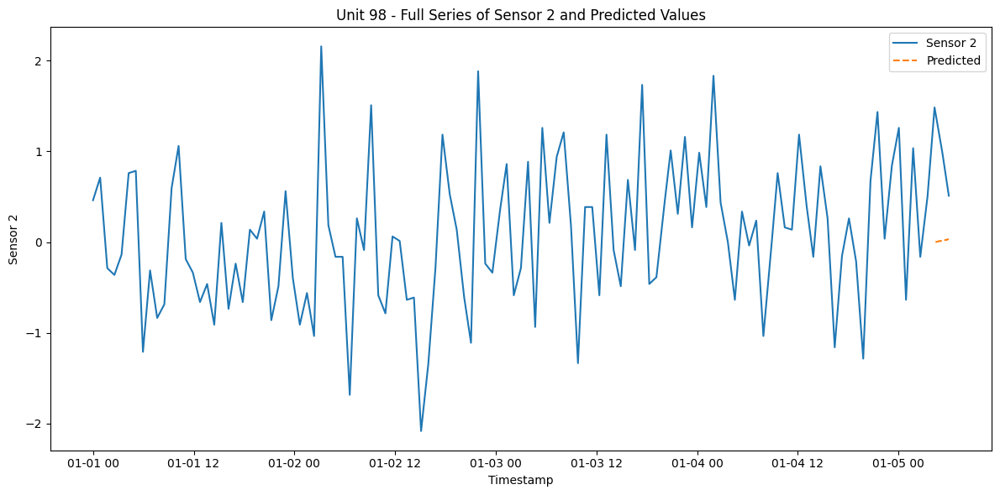

RMSE for Unit 98 - sensor_2: 1.0066567139344758
{'train': [0, 3918], 'valid': [3406, 4407], 'test': [3895, 4896]}
4297
Dataset for unit 99 is good


  0%|          | 0/39 [00:00<?, ?it/s]

96
[0.649570349220017, 0.6265819399645465, 0.6035935307090758, 0.5806051214536052, 0.5576167121981346, 0.5346283029426641, 0.5116398936871934, 0.48865148443172285, 0.4656630751762522, 0.44267466592078164, 0.41968625666531106, 0.39669784740984043, 0.37370943815436986, 0.3507210288988992, 0.32773261964342865, 0.30474421038795807, 0.28175580113248744, 0.2587673918770169, 0.23577898262154628, 0.21279057336607565, 0.18980216411060502, 0.1668137548551345, 0.14382534559966387, 0.12083693634419324, 0.09784852708872271, 0.07486011783325208, 0.05187170857778145, 0.02888329932231093, 0.005894890066840297, -0.017093519188630335, -0.040081928444100856, -0.06307033769957149, -0.08605874695504212, -0.10904715621051275, -0.13203556546598327, -0.1550239747214539, -0.17801238397692454, -0.20100079323239506, -0.2239892024878657, -0.24697761174333632, -0.26996602099880695, -0.29295443025427736, -0.315942839509748, -0.33893124876521863, -0.3619196580206892, -0.3780604560085778, -0.3942012539964664, -0.4103

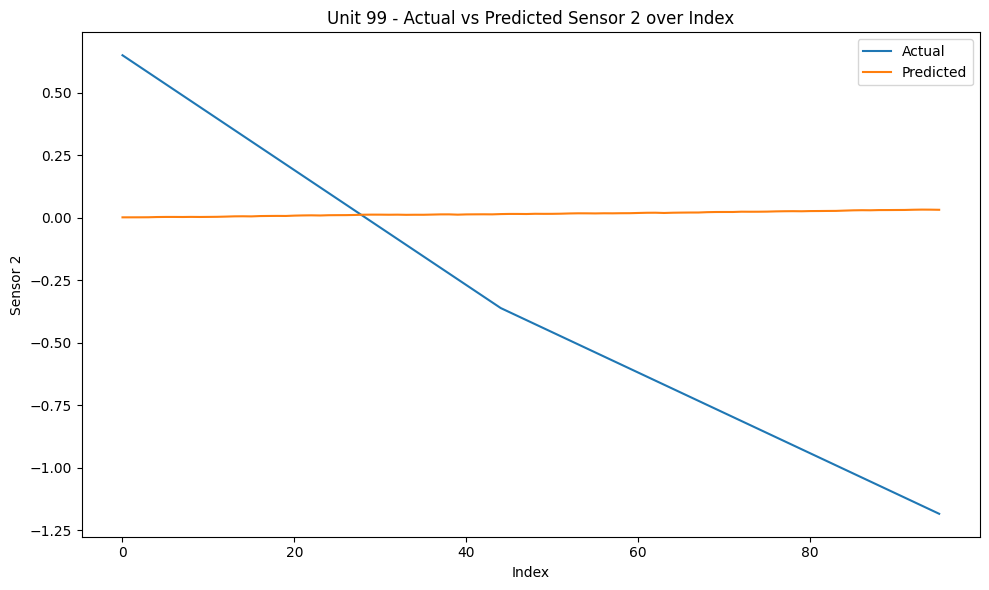

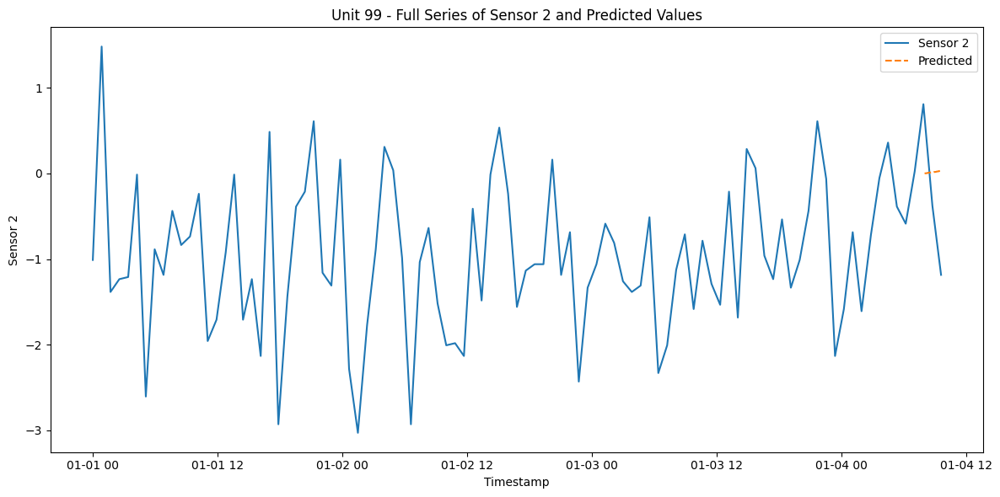

RMSE for Unit 99 - sensor_2: 0.653129129715835
{'train': [0, 8038], 'valid': [7526, 9043], 'test': [8531, 10047]}
9448
Dataset for unit 100 is good


  0%|          | 0/103 [00:00<?, ?it/s]

96
[2.3453323681293896, 2.33652829649963, 2.3277242248698706, 2.3189201532401116, 2.310116081610352, 2.3013120099805926, 2.292507938350833, 2.2837038667210736, 2.274899795091314, 2.2660957234615546, 2.257291651831795, 2.248487580202036, 2.2396835085722766, 2.230879436942517, 2.2220753653127576, 2.213271293682998, 2.2044672220532386, 2.1956631504234796, 2.18685907879372, 2.1780550071639606, 2.169250935534201, 2.1604468639044416, 2.151642792274682, 2.1428387206449226, 2.1340346490151636, 2.125230577385404, 2.1164265057556446, 2.107622434125885, 2.0988183624961256, 2.090014290866366, 2.081210219236607, 2.0724061476068476, 2.063602075977088, 2.0547980043473286, 2.045993932717569, 2.0371898610878096, 2.02838578945805, 2.0195817178282907, 2.0107776461985316, 2.001973574568772, 1.9931695029390126, 1.9843654313092531, 1.9755613596794936, 1.9667572880497344, 1.9579532164199749, 1.942790648613175, 1.927628080806375, 1.9124655129995753, 1.8973029451927754, 1.8821403773859755, 1.8669778095791756, 

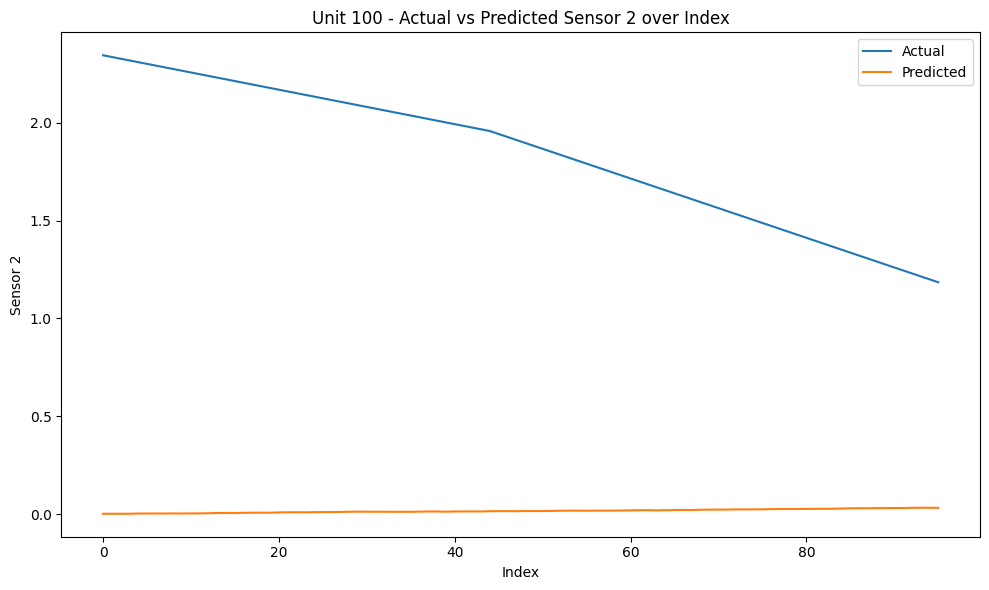

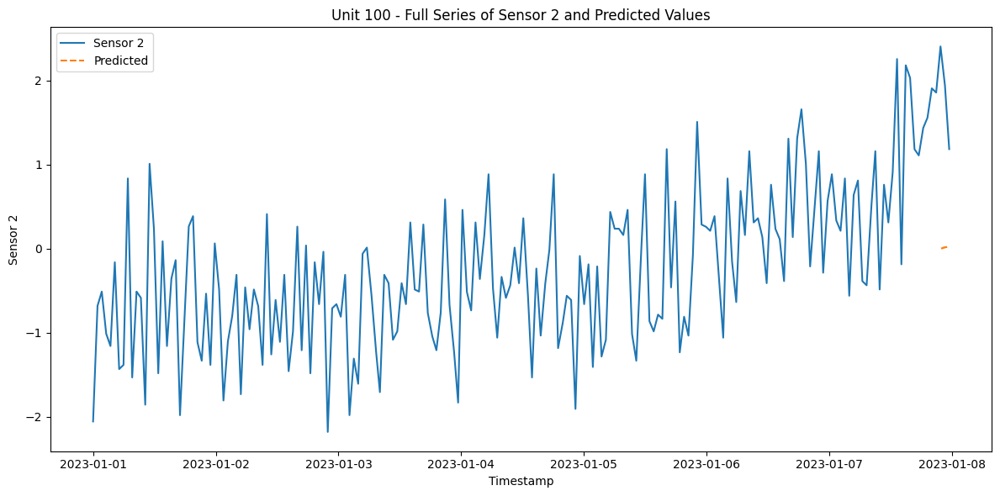

RMSE for Unit 100 - sensor_2: 1.8575168897404246


In [138]:
# Forecast each unit's RUL
# Assuming the necessary variables (e.g., train_df, context_length, tsp, timestamp_column, target_columns) are defined

unit_list = []
rmse_list = []
split_configs = generate_split_configs(train_df, context_length)

for unit in train_df['unit_number'].unique():
    unit = int(unit)
    df_subset = train_df[train_df['unit_number'] == unit]
    df_subset = df_subset.reset_index(drop=True)
    df_truncate = df_subset.tail(600)
    df_subset_full = df_subset.copy()
    df_subset = df_subset.iloc[:-600]  # Remove the last 150 rows

    # Set values in 'sensor_2' column of df_truncate to NaN
    df_truncate['sensor_2'] = np.nan

    # Get split configuration for the current unit
    split_config = split_configs[unit - 1]  # Access by index

    # Run data checks for debug
    print(split_config)
    print(len(df_subset))
    if df_subset is None or len(df_subset) == 0:
        print(f"No data available for unit {unit}")
    else:
        print(f"Dataset for unit {unit} is good")

    # Reset Preprocessor
    tsp = TimeSeriesPreprocessor(
      **column_specifiers,
      context_length=context_length,
      prediction_length=forecast_length,
      scaling=False,
      encode_categorical=True,
      scaler_type="standard",
    )
    
    # Generate datasets based on the split configuration
    train_dataset, valid_dataset, test_dataset = get_datasets(tsp, dataset=df_subset, split_config=split_config)
    
    # Assign the zeroshot model
    zeroshot_model = TinyTimeMixerForPrediction.from_pretrained("ibm/TTM", revision="main", prediction_filter_length=prediction_filter)

    # Initialize trainer with the model
    zeroshot_trainer = Trainer(
        model=zeroshot_model,
    )

    # Evaluate the model on the test dataset
    zeroshot_trainer.evaluate(test_dataset)

    # Create a forecasting pipeline
    zs_forecast_pipeline = TimeSeriesForecastingPipeline(
        model=zeroshot_model,
        device="cpu",
        timestamp_column=timestamp_column,
        id_columns=[],  # Adjust id_columns if needed
        target_columns=target_columns,
        freq="1m"
    )

    # Retrieve test data start and end indices
    test_start_index, test_end_index = split_config['test']

    # Generate forecast
    processed_data = tsp.preprocess(df_subset[test_start_index:test_end_index])
    processed_data = tsp.preprocess(df_truncate)
    zs_forecast = zs_forecast_pipeline(processed_data)
    print(len(zs_forecast['sensor_2_prediction'].values[0]))

    actual = [df_subset_full['sensor_2'].values[-prediction_filter:]]

    pred = zs_forecast['sensor_2_prediction'].values[0]
    actual = actual[0].tolist()
    time = zs_forecast['timestamp'].values[0]

    print(actual)
    print(pred)
    print(time)

    # Plot actual vs predicted values over each index
    plt.figure(figsize=(10, 6))
    plt.plot(range(len(actual)), actual, label='Actual')
    plt.plot(range(len(pred)), pred, label='Predicted')
    plt.xlabel('Index')
    plt.ylabel('Sensor 2')
    plt.title(f'Unit {unit} - Actual vs Predicted Sensor 2 over Index')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Add 'pred' column to df_subset_full with NaN values
    df_subset_full['pred'] = np.nan

    # Fill the last 'prediction_filter' rows of 'pred' column with the predicted values
    df_subset_full.iloc[-prediction_filter:, df_subset_full.columns.get_loc('pred')] = pred

    # Plot the full series of 'sensor_2' and 'pred' against 'timestamp'
    plt.figure(figsize=(12, 6))
    plt.plot(df_subset_full['timestamp'], df_subset_full['sensor_2'], label='Sensor 2')
    plt.plot(df_subset_full['timestamp'], df_subset_full['pred'], label='Predicted', linestyle='--')
    plt.xlabel('Timestamp')
    plt.ylabel('Sensor 2')
    plt.title(f'Unit {unit} - Full Series of Sensor 2 and Predicted Values')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Calculate RMSE for the unit
    rmse = np.sqrt(mean_squared_error(actual, pred))
    print(f"RMSE for Unit {unit} - {target_columns[0]}: {rmse}")
    unit_list.append(unit)
    rmse_list.append(rmse)
    #print("======================================================")
    

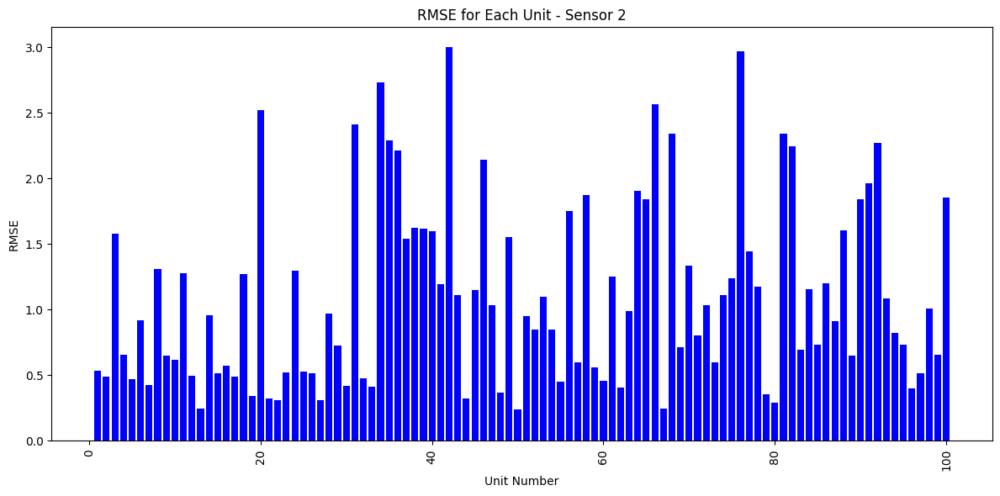

Average RMSE:  1.1005491270474677


In [139]:
plt.figure(figsize=(12, 6))
plt.bar(unit_list, rmse_list, color='blue')
plt.xlabel('Unit Number')
plt.ylabel('RMSE')
plt.title('RMSE for Each Unit - Sensor 2')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

print("Average RMSE: ", np.mean(rmse_list))